In [10]:
# rSLDS - Synthetic Data

In [20]:
# Modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys

In [ ]:
# switch of widgets before importing ssm
import os
os.environ["TQDM_NOTEBOOK"] = "0"   # no notebook widget
import tqdm
import tqdm.auto as tqa
from tqdm.std import tqdm as tqdm_std
def _trange_no_widget(n, *a, **k):
    k.setdefault("disable", True)          # True = no bars; False = console bars
    return tqdm_std(range(n), *a, **k)     # real tqdm object (has set_description)
tqdm.tqdm = tqdm_std
tqdm.trange = _trange_no_widget
tqa.tqdm = tqdm_std
tqa.trange = _trange_no_widget
import ssm
sys.path.insert(0, "/Users/chrismader/Python/SLDS")
from rSLDS import *

In [28]:
def generate_synthetic_data(mu_diff, sigma, sigma_diff, Mk, Nk, jitter=0, dt=1/252, rng=None, display=False):

    if rng is None:
        rng = np.random.default_rng()

    mu1 = +mu_diff / 2
    mu2 = -mu_diff / 2
    sigma1 = sigma - sigma_diff / 2
    sigma2 = sigma + sigma_diff / 2

    # Generate jittered segment lengths around Nk
    low  = max(1, Nk - jitter)
    high = Nk + jitter + 1
    segment_lengths = rng.integers(low, high, size=Mk)
    total_steps = segment_lengths.sum()

    regimes = [i % 2 for i in range(Mk)]
    z_true = np.empty(total_steps, dtype=int)
    drift_series = np.empty(total_steps)
    diffusion_series = np.empty(total_steps)

    idx = 0
    for regime, L in zip(regimes, segment_lengths):
        z_true[idx:idx + L] = regime
        drift_series[idx:idx + L] = mu1 if regime == 0 else mu2
        diffusion_series[idx:idx + L] = sigma1 if regime == 0 else sigma2
        idx += L

    prices = np.empty(total_steps + 1)
    prices[0] = 1.0
    dW = rng.standard_normal(total_steps) * np.sqrt(dt)

    for t in range(total_steps):
        prices[t + 1] = prices[t] + drift_series[t] * prices[t] * dt + diffusion_series[t] * prices[t] * dW[t]

    log_returns = np.diff(np.log(prices))
    prices = prices[1:]  # align with log_returns
    prices = pd.Series(prices, name="price")
    
    if display:
        fig, axs = plt.subplots(3, 1, figsize=(8, 3), sharex=True)
        t = np.arange(len(prices))

        axs[0].plot(t, prices)
        axs[1].plot(t, log_returns)
        axs[2].plot(t, z_true)

        # Add vertical lines at regime boundaries
        switch_points = np.cumsum(segment_lengths)[:-1]
        for x in switch_points:
            axs[0].axvline(x=x, color='k')
            axs[1].axvline(x=x, color='k')

        axs[0].set_ylabel('Price')
        axs[1].set_ylabel('Log return')
        axs[1].set_xlabel('Time step')
        plt.tight_layout()
        plt.show()

    return {
        "prices": prices,
        "y": log_returns[:, None],
        "z_true": z_true,
        "segment_lengths": segment_lengths}

# _ = generate_synthetic_data(mu_diff=0.2, sigma=0.3, sigma_diff=0.2, Mk=4, Nk=63, display=True)


In [30]:
def generate_synthetic_data_from_processes(n_regimes, Mk, Nk, mu, sigma, jitter=0, dt=1/252, rng=None, display=False):

    import heapq
    
    if rng is None:
        rng = np.random.default_rng()

    # Geometric Brownian Motion
    def generate_gbm_data(start_price, T, dt, rng):
        dW = rng.standard_normal(T) * np.sqrt(dt)
        S = np.empty(T + 1)
        S[0] = start_price
        for t in range(T):
            S[t+1] = S[t] + mu * S[t] * dt + sigma * S[t] * dW[t]
        return S

    # Geometric Mean-Reverting Process (Exponential OU) on X=log S
    def generate_ou_data(start_price, T, dt, rng):
        theta, mu_log = 1.0, np.log(0.2)  # mean-reverting level in log space
        logS = np.empty(T + 1)
        logS[0] = np.log(start_price)
        for t in range(T):
            dW = rng.normal(0, np.sqrt(dt))
            logS[t+1] = logS[t] + theta * (mu_log - logS[t]) * dt + sigma * dW
        return np.exp(logS)

    # Heston Stochastic Volatility Model
    def generate_heston_data(start_price, T, dt, rng):
        # Use provided mu as drift of S; tie long-run variance and vol-of-vol to sigma
        kappa, theta, xi = 2.0, sigma**2, sigma  # theta: long-run var, xi: vol-of-vol
        rho = 0.0
        v = np.empty(T + 1)
        v[0] = theta
        S = np.empty(T + 1)
        S[0] = start_price
        for t in range(T):
            eps_v = rng.normal(0, 1.0)
            eps_z = rng.normal(0, 1.0)
            eps_s = rho * eps_v + np.sqrt(max(0.0, 1.0 - rho**2)) * eps_z
            # full truncation Euler for v_t
            vt_pos = max(v[t], 0.0)
            v[t+1] = max(0.0, v[t] + kappa * (theta - vt_pos) * dt + xi * np.sqrt(vt_pos) * np.sqrt(dt) * eps_v)
            S[t+1] = S[t] + mu * S[t] * dt + np.sqrt(vt_pos) * S[t] * np.sqrt(dt) * eps_s
        return S

    # Merton Jump-Diffusion
    def generate_merton_data(start_price, T, dt, rng):
        lam = 2.0
        jump_mu, jump_sigma = -0.05, 0.1  # log-jump parameters
        S = np.empty(T + 1)
        S[0] = start_price
        k = np.exp(jump_mu + 0.5 * jump_sigma**2) - 1.0
        mu_eff = mu - lam * k
        for t in range(T):
            dW = rng.normal(0, np.sqrt(dt))
            J = rng.poisson(lam * dt)
            jump_sum = np.sum(rng.normal(jump_mu, jump_sigma, size=J)) if J > 0 else 0.0
            S[t+1] = S[t] + mu_eff * S[t] * dt + sigma * S[t] * dW + S[t] * jump_sum
        return S

    process_dict = {
        'gbm': generate_gbm_data,
        'ou': generate_ou_data,
        # 'heston': generate_heston_data,
        # 'merton': generate_merton_data,
    }

    # Build non-repeating sequence over a subset of regimes
    if not (1 <= n_regimes <= len(process_dict)):
        raise ValueError(f"n_regimes must be in [1, {len(process_dict)}]")
    
    selected_keys = list(rng.choice(list(process_dict.keys()), size=n_regimes, replace=False))
    
    if n_regimes == 1 and Mk > 1:
        raise ValueError("With n_regimes=1, you cannot enforce 'no same process twice in a row' for Mk>1.")
    
    # max-heap by remaining count; negative counts because heapq is min-heap
    keys = selected_keys.copy()
    rng.shuffle(keys)  # randomize tie-breaking
    heap = [(-Mk, k) for k in keys]
    heapq.heapify(heap)
    
    process_sequence = []
    prev_key = None
    
    for _ in range(n_regimes * Mk):
        if not heap:
            raise RuntimeError("Failed to build non-repeating sequence; check inputs.")
        cnt1, k1 = heapq.heappop(heap)
        if k1 == prev_key:
            if not heap:
                raise RuntimeError("Failed to build non-repeating sequence; check inputs.")
            cnt2, k2 = heapq.heappop(heap)
            process_sequence.append(k2)
            cnt2 += 1  # used one instance of k2
            if cnt1 < 0:
                heapq.heappush(heap, (cnt1, k1))
            if cnt2 < 0:
                heapq.heappush(heap, (cnt2, k2))
            prev_key = k2
        else:
            process_sequence.append(k1)
            cnt1 += 1  # used one instance of k1
            if cnt1 < 0:
                heapq.heappush(heap, (cnt1, k1))
            prev_key = k1

    # Initialize containers
    prices = [1.0]
    log_returns = []
    z_true = []
    segment_lengths = []

    # Jittered segment lengths
    low = max(1, Nk - jitter)
    high = Nk + jitter + 1
    lengths = rng.integers(low, high, size=len(process_sequence))

    for proc_key, Tseg in zip(process_sequence, lengths):
        segment_lengths.append(Tseg)
        process_func = process_dict[proc_key]
        start_price = prices[-1]
        segment_prices = process_func(start_price, Tseg, dt, rng)
        segment_log_returns = np.diff(np.log(segment_prices))
        prices.extend(segment_prices[1:])
        z_true.extend([proc_key] * Tseg)
        log_returns.append(segment_log_returns)

    prices = np.array(prices[1:])
    prices = pd.Series(prices, name="price")
    log_returns = np.concatenate(log_returns)
    z_true = np.array(z_true)

    if display:
        fig, axs = plt.subplots(3, 1, figsize=(8, 3), sharex=True)
        t = np.arange(len(prices))
        axs[0].plot(t, prices)
        axs[1].plot(t, log_returns)
        axs[2].plot(t, z_true)
        switch_points = np.cumsum(segment_lengths)[:-1]
        for x in switch_points:
            axs[0].axvline(x=x, color='k')
            axs[1].axvline(x=x, color='k')
        axs[0].set_ylabel('Price')
        axs[1].set_ylabel('Log return')
        axs[1].set_xlabel('Time step')
        plt.tight_layout()
        plt.show()

    # Convert regime labels to integers (alphabetical order)
    unique_labels = sorted(set(z_true))
    label_map = {label: i for i, label in enumerate(unique_labels)}
    z_true = np.array([label_map[z] for z in z_true])

    return {
        "prices": prices,
        "y": log_returns[:, None],
        "z_true": z_true,
        "segment_lengths": np.array(segment_lengths)
    }

# res = generate_synthetic_data_from_processes(n_regimes=2, Mk=6, Nk=63, mu=0.3, sigma=0.3, display=True)


In [32]:
def generate_synthetic_fundamental_data(mu_diff_EPS, sigma_EPS, mu_PE, sigma_PE,
                                        sigma_diff_PE, theta_PE, Mk, Nk, jitter=5,
                                        dt=1/252, rng=None, display=False):

    if rng is None:
        rng = np.random.default_rng()

    # Drift/vol by regime
    mu_EPS_up   = +mu_diff_EPS / 2
    mu_EPS_down = -mu_diff_EPS / 2
    sigma_EPS_up = sigma_EPS
    sigma_EPS_down = sigma_EPS
    sigma_PE_up   = sigma_PE - sigma_diff_PE / 2
    sigma_PE_down = sigma_PE + sigma_diff_PE / 2

    # Regime lengths
    low  = max(1, Nk - jitter)
    high = Nk + jitter + 1
    segment_lengths = rng.integers(low, high, size=Mk)
    total_steps = int(segment_lengths.sum())

    # Allocate
    z_true          = np.empty(total_steps, dtype=int)
    mu_PE_series    = np.empty(total_steps)
    sigma_PE_series = np.empty(total_steps)
    mu_EPS_series   = np.empty(total_steps)
    sigma_EPS_series= np.empty(total_steps)

    # Build regime time series
    regimes = [i % 2 for i in range(Mk)]
    idx = 0
    for reg, L in zip(regimes, segment_lengths):
        z_true[idx:idx + L] = reg
        if reg == 1:
            mu_PE_series[idx:idx + L]    = mu_PE
            sigma_PE_series[idx:idx + L] = sigma_PE_up
            mu_EPS_series[idx:idx + L]   = mu_EPS_up
            sigma_EPS_series[idx:idx + L]= sigma_EPS_up
        else:
            mu_PE_series[idx:idx + L]    = mu_PE
            sigma_PE_series[idx:idx + L] = sigma_PE_down
            mu_EPS_series[idx:idx + L]   = mu_EPS_down
            sigma_EPS_series[idx:idx + L]= sigma_EPS_down
        idx += L

    # Simulate EPS and PE
    eps = np.empty(total_steps + 1)
    pe = np.empty(total_steps + 1)
    eps[0] = 100
    pe[0] = mu_PE
    
    dW_PE  = rng.standard_normal(total_steps) * np.sqrt(dt)
    dW_EPS = rng.standard_normal(total_steps) * np.sqrt(dt)

    for t in range(total_steps):
        eps[t+1] = eps[t] + mu_EPS_series[t] * eps[t] * dt + sigma_EPS_series[t] * eps[t] * dW_EPS[t]
        pe[t+1]  = pe[t]  + theta_PE * (mu_PE_series[t] - pe[t]) * pe[t] * dt + sigma_PE_series[t] * pe[t] * dW_PE[t]

    # Compute log returns
    prices = (pe * eps)[1:]  # align with returns
    prices = pd.Series(prices, name="price")
    log_return_eps = np.diff(np.log(eps))
    log_return_pe  = np.diff(np.log(pe))
    log_returns    = np.column_stack((log_return_pe, log_return_eps))  # y, shape (T,2)

    if display:
        t = np.arange(total_steps)
        fig, ax = plt.subplots(4, 1, figsize=(9, 4), sharex=True)
        ax[0].plot(t, prices);          ax[0].set_ylabel("Price")
        ax[1].plot(t, pe[1:]);          ax[1].set_ylabel("P/E")
        ax[2].plot(t, eps[1:]);         ax[2].set_ylabel("EPS")
        ax[3].step(t, z_true, where="post"); ax[3].set_ylabel("Regime"); ax[3].set_xlabel("step")
        plt.tight_layout(); plt.show()

    return {
        "prices": prices,
        "eps": log_return_eps[:, None],
        "pe": log_return_pe[:, None],
        "y": log_returns,
        "z_true": z_true,
        "segment_lengths": segment_lengths
    }

# _ = generate_synthetic_fundamental_data(mu_diff_EPS=0.3, sigma_EPS=0.05, mu_PE=10, sigma_PE=0.3, 
#                                         sigma_diff_PE=0.1, theta_PE=1.0, Mk=4, Nk=63, display=True)


In [ ]:
def pipeline_rSLDS_price(params, verbose=False, seed=None):
    
    model_params = dict(n_regimes=2, dim_latent=1, single_subspace=True, n_iter_em=50)
    full_params  = {**params, **model_params}
    dt = full_params["dt"]

    rng_tr = np.random.default_rng(seed)
    rng_te = np.random.default_rng(None if seed is None else seed + 1)

    # data
    res_tr = generate_synthetic_data(**params, rng=rng_tr, display=False)
    y_tr, z_tr = res_tr["y"], res_tr["z_true"]

    res_te = generate_synthetic_data(**params, rng=rng_te, display=False)
    prices, y_te, z_te = res_te["prices"], res_te["y"], res_te["z_true"]

    # restricted fit
    C = np.eye(1, 1)
    d = np.zeros((1, 1))
    xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS_restricted(y=y_tr, params=full_params, C=C, d=d, n_iter_em=50, seed=seed)        
    # xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS(y=y_tr, params=full_params, n_iter_em=50, seed=seed)

    # inference
    res = inference_rSLDS(px=prices, mdl=mdl, y_test=y_te, y_train=y_tr, dt=dt, display=False)
    xhat_te, zhat_te = res["xhat"], res["zhat"]
    cpll, max_cpll = res["cpll"], res["max_cpll"]

    # CUSUM overlay
    zhat_CUSUM = cusum_overlay(prices, y_te, xhat_te, mdl, h_z=10)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat_te

    # eval
    summary = evaluate_rSLDS_synthetic(prices, y_te, xhat_te, zhat, z_te, elbo, mdl, cpll, max_cpll, display=True)
    
    return summary

In [ ]:
def pipeline_rSLDS_fundamentals(params, verbose=False, seed=None):
    
    # model hyperparams
    model_params = dict(n_regimes=2, dim_latent=2, single_subspace=True, n_iter_em=50)
    full_params  = {**params, **model_params}
    dt = full_params["dt"]

    # data
    rng_tr = np.random.default_rng(seed)
    rng_te = np.random.default_rng(None if seed is None else seed + 1)
    res_tr = generate_synthetic_fundamental_data(**params, rng=rng_tr, display=False)
    y_tr, z_tr = res_tr["y"], res_tr["z_true"]
    res_te = generate_synthetic_fundamental_data(**params, rng=rng_te, display=False)
    prices, eps, pe, y_te, z_te = res_te["prices"], res_te["eps"], res_te["pe"], res_te["y"], res_te["z_true"]

    # restricted fit
    C = np.eye(2, 2)
    d = np.zeros((1,2))
    xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS_restricted(y=y_tr, params=full_params, C=C, d=d, n_iter_em=50, seed=seed)       
    # xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS(y=y_tr, params=full_params, seed=seed)

    # inference
    res = inference_rSLDS(
        px=prices,
        mdl=mdl,
        y_test=y_te,
        y_train=y_tr,
        z_true=z_te,        
        dt=dt,
        display=False)
    
    xhat_te   = res["xhat"]
    zhat_te   = res["zhat"]
    cpll      = res["cpll"]
    max_cpll  = res["max_cpll"]

    # CUSUM overlay
    zhat_CUSUM = cusum_overlay(prices, y_te, xhat_te, mdl, h_z=10)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat_te

    # evaluation
    summary = evaluate_rSLDS_synthetic(prices, y_te, xhat_te, zhat, z_te, elbo, mdl, cpll, max_cpll, dt=dt, display=verbose)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary

In [60]:
def compute_epe(model_params, data_grid, pipeline_fn, B=100, epe_threshold=0.05, conf_level=0.95, 
                seed=None, verbose=False, display=False, n_jobs=-1):
        
    def _single_rep(combo, model_params, s_tr, s_te, pipeline_fn):
        rng_tr = np.random.default_rng(s_tr)
        rng_te = np.random.default_rng(s_te)
        return pipeline_fn(combo, model_params, rng_tr, rng_te)
    
    if seed is not None:
        np.random.seed(seed); npr.seed(seed)
        rng_master = np.random.default_rng(seed)
    else:
        rng_master = np.random.default_rng()

    grid_keys   = [k for k in data_grid if k.endswith("_grid")]
    param_keys  = [k[:-5] for k in grid_keys]
    combo_list  = list(itertools.product(*[data_grid[k] for k in grid_keys]))
    n_grid      = len(combo_list)
    seed_array  = rng_master.integers(0, 2**32 - 1, size=(B, n_grid, 2))

    def build_params(combo):
        return dict(zip(param_keys, combo))

    epe_records = []
    for g, combo in enumerate(combo_list):

        print()
        print(100 * "=")
        print(f"{g+1}/{n_grid}  combo = {combo}")
        print(100 * "=")
        print()
        
        combo_params = build_params(combo)
        rep_summaries = Parallel(n_jobs=n_jobs)(
            delayed(_single_rep)(combo_params, model_params, s_tr, s_te, pipeline_fn)
            for s_tr, s_te in seed_array[:, g])

        losses = np.array([r["loss"] for r in rep_summaries])
        mean_L = losses.mean()
        se_L   = losses.std(ddof=1) / np.sqrt(B)

        epe_records.append(dict(params=combo,
                                mean_EPE=mean_L,
                                se_EPE=se_L,
                                all_losses=losses,
                                rep_summaries=rep_summaries))

    rows = []
    tmult = stats.t.ppf(0.5 + conf_level/2, B - 1)

    for rec in epe_records:
        θ = rec["params"]
        L = rec["all_losses"]
        reps = rec["rep_summaries"]

        precis   = np.mean([r["precision"] for r in reps])
        recalls  = np.mean([r["recall"] for r in reps])
        f1_scores = np.mean([r["f1_score"] for r in reps])
        scores   = np.mean([r["accuracy"] for r in reps])
        reg_lens = np.mean([r["avg_inferred_regime_length"] for r in reps])
        det_lags = np.mean([r["detection_lag_mean"] for r in reps])
        elbo_s   = np.mean([r["elbo_start"] for r in reps])
        elbo_e   = np.mean([r["elbo_end"] for r in reps])
        elbo_d   = np.mean([r["elbo_delta"] for r in reps])
        cpll_val = np.mean([r["cpll"] for r in reps])
        max_cpll_val = np.mean([r["max_cpll"] for r in reps])

        sd_L    = L.std(ddof=1)
        ci_half = tmult * sd_L / np.sqrt(B) if B > 1 else 0.0
        threshold_pass = rec["mean_EPE"] <= epe_threshold

        rows.append(dict(score=scores,
                         **{k: v for k, v in zip(param_keys, θ)},
                         precision=precis,
                         recall=recalls,
                         f1_score=f1_scores,
                         avg_regime_len=reg_lens,
                         detection_lag=det_lags,
                         elbo_start=elbo_s,
                         elbo_end=elbo_e,
                         delta_elbo=elbo_d,
                         cpll=cpll_val,  # avg cpll across B seeds for a single hyperparameter config
                         max_cpll=max_cpll_val, 
                         mean_EPE=rec["mean_EPE"],
                         sd_EPE=sd_L,
                         CI95_EPE=f"{rec['mean_EPE']-ci_half:.3f}–{rec['mean_EPE']+ci_half:.3f}",
                         threshold_pass=threshold_pass))

    df = pd.DataFrame(rows).sort_values("mean_EPE", ascending=True).reset_index(drop=True)
    # df.insert(0, "rank", np.arange(1, len(df)+1))
    return df


def pipeline_trained_rSLDS_price_adapter(params, model_params, rng_tr, rng_te):
    full_params = {**params, **model_params}
    
    res_tr = generate_synthetic_data(**params, rng=rng_tr, display=False)
    y_tr, z_tr = res_tr["y"], res_tr["z_true"]

    res_te = generate_synthetic_data(**params, rng=rng_te, display=False)
    prices, y_te, z_te = res_te['prices'], res_te['y'], res_te['z_true']

    xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS(y=y_tr, params=full_params)
        
    res = inference_rSLDS(
        px=prices,
        mdl=mdl,
        y_test=y_te,
        y_train=y_tr,
        dt=full_params["dt"],
        display=True)

    xhat_te   = res["xhat"]
    zhat_te   = res["zhat"]
    gamma     = res["gamma"]
    cpll      = res["cpll"]
    max_cpll  = res["max_cpll"]

    zhat_CUSUM = cusum_overlay(prices, y_te, xhat_te, mdl, h_z=6)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat_te
    
    summary = evaluate_rSLDS_synthetic(prices, y_te, xhat_te, zhat, z_te, elbo, mdl, cpll, max_cpll, display=True)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary


def pipeline_trained_rSLDS_fundamental_adapter(params, model_params, rng_tr, rng_te):
    full_params = {**params, **model_params}
    
    res_tr = generate_synthetic_fundamental_data(**params, rng=rng_tr, display=False)
    y_tr, z_tr = res_tr["y"], res_tr["z_true"]
    
    res_te = generate_synthetic_fundamental_data(**params, rng=rng_te, display=False)
    prices, eps, pe, y_te, z_te = res_te["prices"], res_te["eps"], res_te["pe"], res_te["y"], res_te["z_true"]

    xhat_tr, zhat_tr, elbo, q, mdl = fit_rSLDS(y=y_tr, params=full_params)

    res = inference_rSLDS(
        px=prices,
        mdl=mdl,
        y_test=y_te,
        y_train=y_tr,
        dt=full_params["dt"],
        display=True)
    
    xhat_te   = res["xhat"]
    zhat_te   = res["zhat"]
    gamma     = res["gamma"]
    cpll      = res["cpll"]
    max_cpll  = res["max_cpll"]

    zhat_CUSUM = cusum_overlay(prices, y_te, xhat_te, mdl, h_z=6)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat_te
    
    summary = evaluate_rSLDS_synthetic(prices, y_te, xhat_te, zhat, z_te, elbo, mdl, cpll, max_cpll, display=True)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary


def pipeline_true_rSLDS_price_adapter(params, model_params, rng_tr, rng_te):
    mdl = load_rSLDS_synthetic_price(params)
    
    res = generate_synthetic_data(**params, rng=rng_te, display=False)
    prices, y, z_true = res["prices"], res["y"], res["z_true"]

    res = inference_rSLDS(
        px=prices,
        mdl=mdl,
        y_test=y,
        z_true=z_true,
        dt=params["dt"],
        display=True)

    xhat      = res["xhat"]
    zhat      = res["zhat"]
    gamma     = res["gamma"]
    cpll      = res["cpll"]
    max_cpll  = res["max_cpll"]

    zhat_CUSUM = cusum_overlay(prices, y, xhat, mdl, h_z=6)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat
    
    elbo = [0]
    summary = evaluate_rSLDS_synthetic(prices, y, xhat, zhat, z_true, elbo, mdl, cpll, max_cpll, display=True)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary


def pipeline_train_rSLDS_mixed_process_adapter(params, model_params, rng_tr, rng_te):
    full_params = {**params, **model_params}
    
    res_data = generate_synthetic_data_from_processes(**params, rng=rng_tr, display=False)
    prices, y, z_true = res_data["prices"], res_data["y"], res_data["z_true"]
    
    _, _, elbo, _, model = fit_rSLDS(y=y, params=full_params)
    
    res = inference_rSLDS(px=prices, mdl=model, y_test=y, dt=full_params["dt"], display=True)
    xhat = res["xhat"]
    zhat = res["zhat"]
    cpll = res["cpll"]
    max_cpll = res["max_cpll"]
    
    zhat_cusum = cusum_overlay(prices, y, xhat, model, h_z=6)
    zhat = zhat_cusum if zhat_cusum is not None else zhat
    
    summary = evaluate_rSLDS_synthetic(prices, y, xhat, zhat, z_true, elbo, model, cpll, max_cpll, display=True)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary

def pipeline_true_rSLDS_fundamental_adapter(params, model_params, rng_tr, rng_te):
    mdl = load_rSLDS_synthetic_fundamental(params)

    res = generate_synthetic_fundamental_data(**params, rng=rng_te, display=False)
    prices, eps, pe, y, z_true = res["prices"], res["eps"], res["pe"], res["y"], res["z_true"]
    
    res = inference_rSLDS(
        px=prices,
        mdl=mdl,
        y_test=y,
        z_true=z_true,
        dt=params["dt"],
        display=True)

    xhat      = res["xhat"]
    zhat      = res["zhat"]
    gamma     = res["gamma"]
    cpll      = res["cpll"]
    max_cpll  = res["max_cpll"]

    zhat_CUSUM = cusum_overlay(prices, y, xhat, mdl, h_z=6)
    zhat = zhat_CUSUM if zhat_CUSUM is not None else zhat
    
    elbo = [0]
    summary = evaluate_rSLDS_synthetic(prices, y, xhat, zhat, z_true, elbo, mdl, cpll, max_cpll, display=True)
    summary["cpll"] = cpll
    summary["max_cpll"] = max_cpll
    return summary


def plot_epe(df_epe, data_grid, param, param2=None, fixed=None):

    # Call: plot_epe(df_epe1, data_grid1, param="Nk", param2="Mk", fixed={"mu_diff": 0.5, "sigma_diff": 0.2})

    colors = ["#E69F00", "#56B4E9", "#009E73", "#F0E442",
                "#0072B2", "#D55E00", "#CC79A7", "#999999"]
    
    if fixed is None:
        fixed = {}

    varying_params = [k.replace("_grid", "") for k, v in data_grid.items() if k.endswith("_grid") and len(v) > 1]

    assert param in varying_params, f"'{param}' is not a varying parameter"
    if param2 is not None:
        assert param2 in varying_params, f"'{param2}' is not a varying parameter"
        assert param != param2, "param and param2 must be different"

    for p in varying_params:
        if p not in {param, param2}:
            assert p in fixed, f"Must fix value for '{p}' since it varies in data_grid"

    df_filtered = df_epe.copy()
    for p, v in fixed.items():
        df_filtered = df_filtered[df_filtered[p] == v]

    plt.figure(figsize=(6, 4))

    if param2 is None:
        df_plot = df_filtered.sort_values(param)
        x = df_plot[param]
        y = df_plot["mean_EPE"]
        yerr = df_plot["sd_EPE"]
        plt.errorbar(x, y, yerr=yerr, fmt="o-", capsize=4, color=colors[0])
    else:
        unique_vals = sorted(df_filtered[param2].unique())
        for i, v2 in enumerate(unique_vals):
            df_sub = df_filtered[df_filtered[param2] == v2].sort_values(param)
            if len(df_sub) == 0:
                continue
            x = df_sub[param]
            y = df_sub["mean_EPE"]
            yerr = df_sub["sd_EPE"]
            color = colors[i % len(colors)]
            plt.errorbar(x, y, yerr=yerr, fmt="o-", capsize=4, label=f"{param2}={v2}", color=color)

    plt.xlabel(param)
    plt.ylabel("EPE")
    title = f"EPE ± 1 SD vs {param}" if param2 is None else f"EPE ± 1 SD vs {param}, for given {param2}"
    if fixed:
        title += f" (fixed: {fixed})"
    plt.title(title)
    if param2 is not None:
        plt.legend(title=param2)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_epe_contours(df_epe, data_grid, param, param2, fixed=None, threshold=0.1):
                      
    if fixed is None:  # e.g., fixed = {"mu_diff": 0.3, "sigma": 0.2}
        fixed = {}

    # infer varying params from data_grid
    varying_params = [k.replace("_grid", "") for k, v in data_grid.items() if k.endswith("_grid") and len(v) > 1]

    assert param in varying_params, f"'{param}' is not a varying parameter"
    assert param2 in varying_params, f"'{param2}' is not a varying parameter"
    assert param != param2, "param and param2 must be different"

    # require all others to be fixed
    for key in varying_params:
        if key not in {param, param2} and key not in fixed:
            raise ValueError(f"Parameter '{key}' is varying but not fixed. Use fixed={{'{key}': value}}")

    # apply fixed constraints
    df_plot = df_epe.copy()
    for k, v in fixed.items():
        df_plot = df_plot[df_plot[k] == v]

    # group and pivot to (param2, param)
    dup_check = df_plot.duplicated(subset=[param2, param], keep=False)
    if dup_check.any():
        print("Warning: Duplicate (param2, param) pairs detected. Using minimum mean_EPE as fail-safe.")    
    df_min = df_plot.groupby([param2, param])["mean_EPE"].min().reset_index()
    df_pivot = df_min.pivot(index=param2, columns=param, values="mean_EPE")

    if df_pivot.shape[0] < 2 or df_pivot.shape[1] < 2:
        print(f"Grid too small: {df_pivot.shape}")
        return

    x_vals = sorted(df_pivot.columns.unique())
    y_vals = sorted(df_pivot.index.unique())
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = df_pivot.values

    x_ticks = sorted(data_grid[f"{param}_grid"])
    y_ticks = sorted(data_grid[f"{param2}_grid"])

    plt.figure(figsize=(6, 4))
    cs = plt.contourf(X, Y, Z, levels=20, cmap="cividis", alpha=0.7)
    cs_thresh = plt.contour(X, Y, Z, levels=[threshold], colors="#D55E00", linewidths=3.0)
    plt.clabel(cs_thresh, fmt={threshold: f"EPE={threshold}"}, inline=True, fontsize=9)
    plt.colorbar(cs, label="mean_EPE")

    cs_lines = plt.contour(X, Y, Z, colors="black", linewidths=1.0)
    plt.clabel(cs_lines, fmt="%.3f", inline=True, fontsize=8)

    plt.xlabel(param)
    plt.ylabel(param2)
    #plt.xticks(x_ticks)
    plt.xticks(x_ticks, rotation=90)
    plt.yticks(y_ticks)

    fixed_str = ", ".join(f"{k}={fixed[k]}" for k in sorted(fixed))
    plt.title(f"mean_EPE | {fixed_str}")
    plt.title(f"mean_EPE | {fixed_str}, thresh={threshold}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[ 8.2970]    

As  (K, D, D) = (2, 1, 1)
[ 0.8940]    [ 0.8936]    

bs  (K, D) = (2, 1)
[-0.0048]    [ 0.0052]    

sigmasq  (K, D) = (2, 1)
[ 0.4268]    [ 0.4268]    

Rs  (K, D) = (2, 1)
[-0.0021]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





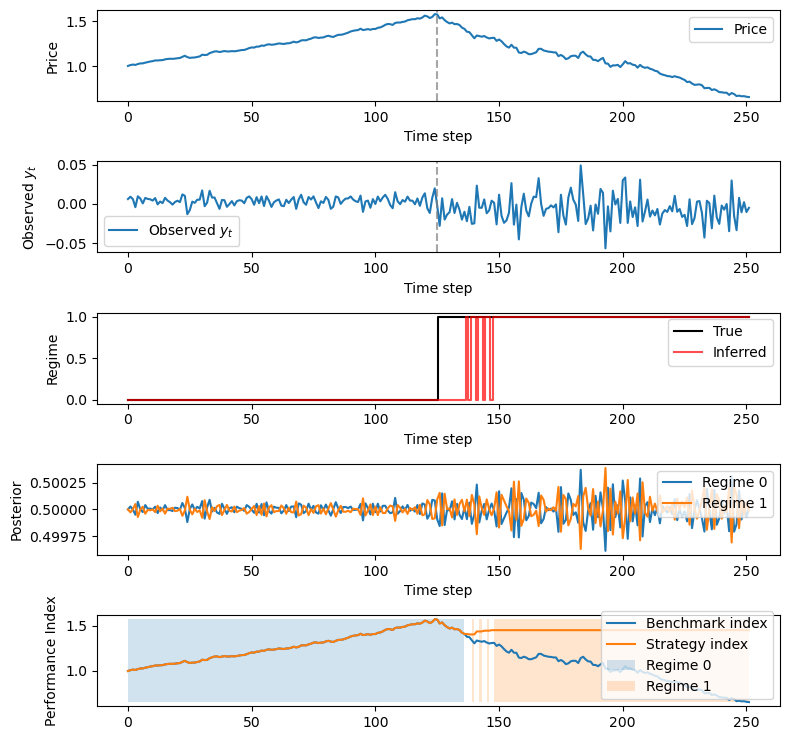


========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.060
Accuracy:                         0.940
Adjusted Rand Index (ARI):        0.775
Precision (macro):                0.947
Recall (macro):                   0.940
F1 score (macro):                 0.944
Confusion Matrix :
[[126   0]
 [ 15 111]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125]
Avg regime length:                25.2
Detection lag mean:               11.0
Detection lag samples:            [11]

Mode Usage
----------
{0: 141, 1: 111}

Spectral Radius Test
----------
Stability margins:                [0.11 0.11]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      608.9
Approx. upper bound on CPLL:      717.9


In [71]:
# Model demonstration: price
params = {
    "dt": 1/252,
    "mu_diff": 2.0,        # regime mean separation
    "sigma": 0.2,          # obs noise
    "sigma_diff": 0.2,     # regime noise separation
    "Mk": 2,               # regimes
    "Nk": 126,             # samples per regime cycle (or window length in your generator)
}

_ = pipeline_rSLDS_price(params, verbose=True, seed=0)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 2, 2)
[ 1.0000  0.0000]    
[ 0.0000  1.0000]    

ds  (K, N) = (1, 2)
[ 0.0000  0.0000]    

inv_etas  (K, N) = (1, 2)
[ 8.6990  11.4843]    

As  (K, D, D) = (2, 2, 2)
[ 0.9153 -0.0013]    [ 0.9154 -0.0013]    
[-0.0013  0.9099]    [-0.0012  0.9100]    

bs  (K, D) = (2, 2)
[-0.0002 -0.0053]    [ 0.0002  0.0047]    

sigmasq  (K, D) = (2, 2)
[ 0.3046  0.3022]    [ 0.3046  0.3022]    

Rs  (K, D) = (2, 2)
[ 0.0038  0.0225]    [ 0.0027 -0.0052]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





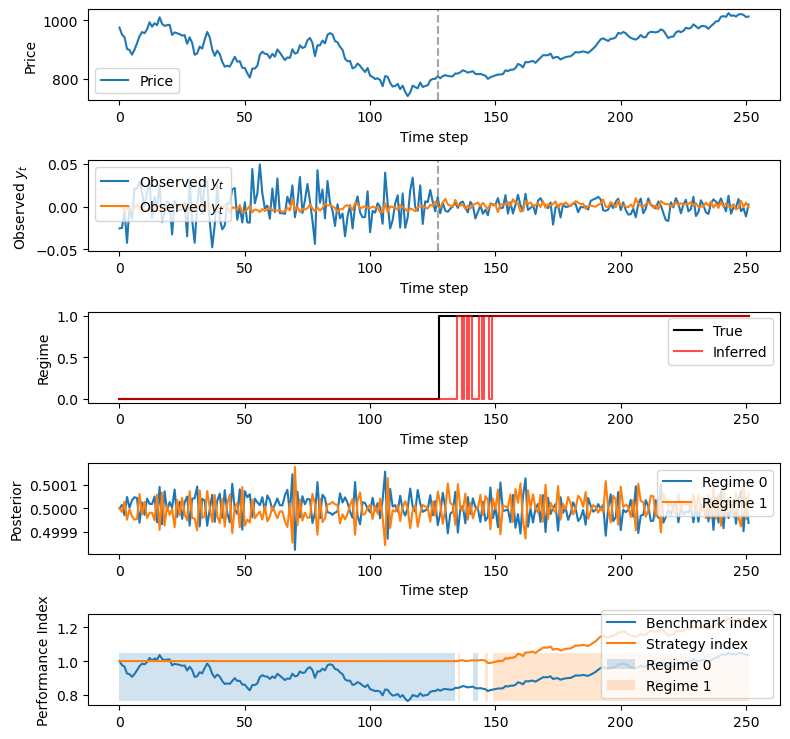


========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.056
Accuracy:                         0.944
Adjusted Rand Index (ARI):        0.789
Precision (macro):                0.951
Recall (macro):                   0.944
F1 score (macro):                 0.947
Confusion Matrix :
[[128   0]
 [ 14 110]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [127]
Avg regime length:                21.0
Detection lag mean:               7.0
Detection lag samples:            [7]

Mode Usage
----------
{0: 142, 1: 110}

Spectral Radius Test
----------
Stability margins:                [0.08 0.08]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      1508.3
Approx. upper bound on CPLL:      781.0


In [73]:
# Model demonstration: fundamentals
params = {
    "dt": 1/252,
    "mu_diff_EPS": 0.8,     # EPS regime mean separation
    "mu_PE": 10.0,          # PE level
    "sigma_EPS": 0.05,
    "sigma_PE": 0.2,
    "sigma_diff_PE": 0.2,   # PE regime vol separation
    "theta_PE": 1.0,
    "Mk": 2,
    "Nk": 126}

_ = pipeline_rSLDS_fundamentals(params, verbose=True, seed=7)


In [2]:
# Data design / bounds
rep = ['detection_lag', 'score', 'elbo_start', 'elbo_end', 'cpll', 'max_cpll', 'mean_EPE', 'sd_EPE',]

In [184]:
# convergence: true rSLDS, synthetic price data

model_params1 = dict(n_regimes=2, dim_latent=1, single_subspace=True)

data_grid1 = dict(
    dt_grid         = [1/252],
    mu_diff_grid    = [0.0, 0.2, 0.4],
    sigma_grid      = [0.2],
    sigma_diff_grid = [0.0, 0.2, 0.3],
    Mk_grid         = [3],
    Nk_grid         = [21, 63, 126, 252, 504],
)

epe_threshold1=0.1

df_epe1 = compute_epe(
    model_params=model_params1,
    data_grid=data_grid1,
    pipeline_fn=pipeline_true_rSLDS_price_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold1,
    verbose=True
)


1/45  combo = (0.003968253968253968, 0.0, 0.2, 0.0, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b 

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        -0.022
Precision (macro):                0.557
Recall (macro):                   0.560
F1 score (macro):                 0.558
Confusion Matrix :
[[17 25]
 [ 6 15]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                15.8
Detection lag mean:               0.0
Detection lag samples:            [0]

Mode Usage
----------
{0: 23, 1: 40}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL 

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.559
Recall (macro):                   0.563
F1 score (macro):                 0.561
Confusion Matrix :
[[82 44]
 [33 30]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                4.6
Detection lag mean:               3.5
Detection lag samples:            [6, 1]

Mode Usage
----------
{0: 115, 1: 74}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL 

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.458
Accuracy:                         0.542
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.518
Recall (macro):                   0.520
F1 score (macro):                 0.519
Confusion Matrix :
[[148 104]
 [ 69  57]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                3.2
Detection lag mean:               3.0
Detection lag samples:            [0, 6]

Mode Usage
----------
{0: 217, 1: 161}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.512
Recall (macro):                   0.513
F1 score (macro):                 0.513
Confusion Matrix :
[[495 513]
 [234 270]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               2.0
Detection lag samples:            [3, 1]

Mode Usage
----------
{1: 783, 0: 729}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.516
Recall (macro):                   0.518
F1 score (macro):                 0.517
Confusion Matrix :
[[556 452]
 [260 244]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 816, 1: 696}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.365
Accuracy:                         0.635
Adjusted Rand Index (ARI):        0.055
Precision (macro):                0.677
Recall (macro):                   0.690
F1 score (macro):                 0.684
Confusion Matrix :
[[22 20]
 [ 3 18]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                15.8
Detection lag mean:               9.0
Detection lag samples:            [3, 15]

Mode Usage
----------
{0: 25, 1: 38}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CP

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.238
Precision (macro):                0.755
Recall (macro):                   0.786
F1 score (macro):                 0.770
Confusion Matrix :
[[84 42]
 [ 6 57]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [125]
Avg regime length:                8.2
Detection lag mean:               11.0
Detection lag samples:            [0, 22]

Mode Usage
----------
{0: 90, 1: 99}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
C

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.153
Accuracy:                         0.847
Adjusted Rand Index (ARI):        0.478
Precision (macro):                0.828
Recall (macro):                   0.859
F1 score (macro):                 0.843
Confusion Matrix :
[[207  45]
 [ 13 113]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [251]
Avg regime length:                8.4
Detection lag mean:               5.0
Detection lag samples:            [1, 9]

Mode Usage
----------
{0: 220, 1: 158}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.208
Accuracy:                         0.792
Adjusted Rand Index (ARI):        0.339
Precision (macro):                0.772
Recall (macro):                   0.797
F1 score (macro):                 0.784
Confusion Matrix :
[[790 218]
 [ 96 408]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [1007]
Avg regime length:                4.3
Detection lag mean:               4.0
Detection lag samples:            [1, 7]

Mode Usage
----------
{0: 886, 1: 626}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
-------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.230
Precision (macro):                0.768
Recall (macro):                   0.798
F1 score (macro):                 0.782
Confusion Matrix :
[[27 15]
 [ 1 20]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                12.6
Detection lag mean:               7.0
Detection lag samples:            [1, 13]

Mode Usage
----------
{0: 28, 1: 35}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CP

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.085
Accuracy:                         0.915
Adjusted Rand Index (ARI):        0.688
Precision (macro):                0.899
Recall (macro):                   0.937
F1 score (macro):                 0.917
Confusion Matrix :
[[110  16]
 [  0  63]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [125]
Avg regime length:                27.0
Detection lag mean:               4.5
Detection lag samples:            [0, 9]

Mode Usage
----------
{0: 110, 1: 79}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.024
Accuracy:                         0.976
Adjusted Rand Index (ARI):        0.906
Precision (macro):                0.969
Recall (macro):                   0.978
F1 score (macro):                 0.974
Confusion Matrix :
[[490  14]
 [  4 248]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [503]
Avg regime length:                68.7
Detection lag mean:               6.0
Detection lag samples:            [1, 11]

Mode Usage
----------
{0: 494, 1: 262}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_noise)
Regime 1:  xₜ = ε        (white_noise)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = ε        (white_n

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.020
Accuracy:                         0.980
Adjusted Rand Index (ARI):        0.921
Precision (macro):                0.974
Recall (macro):                   0.983
F1 score (macro):                 0.978
Confusion Matrix :
[[983  25]
 [  5 499]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [1007]
Avg regime length:                60.5
Detection lag mean:               7.0
Detection lag samples:            [2, 12]

Mode Usage
----------
{0: 988, 1: 524}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
-----

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        -0.043
Precision (macro):                0.710
Recall (macro):                   0.655
F1 score (macro):                 0.681
Confusion Matrix :
[[13 29]
 [ 0 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41]
Avg regime length:                31.5
Detection lag mean:               0.0
Detection lag samples:            [0]

Mode Usage
----------
{0: 13, 1: 50}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.399
Accuracy:                         0.601
Adjusted Rand Index (ARI):        0.037
Precision (macro):                0.582
Recall (macro):                   0.591
F1 score (macro):                 0.587
Confusion Matrix :
[[156  96]
 [ 55  71]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                3.9
Detection lag mean:               3.0
Detection lag samples:            [1, 5]

Mode Usage
----------
{0: 211, 1: 167}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.430
Accuracy:                         0.570
Adjusted Rand Index (ARI):        0.018
Precision (macro):                0.562
Recall (macro):                   0.569
F1 score (macro):                 0.566
Confusion Matrix :
[[288 216]
 [109 143]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [251]
Avg regime length:                3.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 397, 1: 359}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.509
Recall (macro):                   0.510
F1 score (macro):                 0.510
Confusion Matrix :
[[501 507]
 [240 264]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               0.5
Detection lag samples:            [1, 0]

Mode Usage
----------
{0: 741, 1: 771}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.074
Accuracy:                         0.926
Adjusted Rand Index (ARI):        0.723
Precision (macro):                0.909
Recall (macro):                   0.940
F1 score (macro):                 0.924
Confusion Matrix :
[[113  13]
 [  1  62]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [125]
Avg regime length:                21.0
Detection lag mean:               4.5
Detection lag samples:            [0, 9]

Mode Usage
----------
{0: 114, 1: 75}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.135
Accuracy:                         0.865
Adjusted Rand Index (ARI):        0.532
Precision (macro):                0.856
Recall (macro):                   0.899
F1 score (macro):                 0.877
Confusion Matrix :
[[201  51]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [251]
Avg regime length:                7.4
Detection lag mean:               5.5
Detection lag samples:            [0, 11]

Mode Usage
----------
{0: 201, 1: 177}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
-------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.111
Accuracy:                         0.889
Adjusted Rand Index (ARI):        0.602
Precision (macro):                0.870
Recall (macro):                   0.893
F1 score (macro):                 0.881
Confusion Matrix :
[[444  60]
 [ 24 228]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503]
Avg regime length:                7.5
Detection lag mean:               4.0
Detection lag samples:            [0, 8]

Mode Usage
----------
{0: 468, 1: 288}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.223
Accuracy:                         0.777
Adjusted Rand Index (ARI):        0.303
Precision (macro):                0.752
Recall (macro):                   0.770
F1 score (macro):                 0.761
Confusion Matrix :
[[798 210]
 [127 377]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                3.8
Detection lag mean:               0.5
Detection lag samples:            [0, 1]

Mode Usage
----------
{0: 925, 1: 587}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.238
Accuracy:                         0.762
Adjusted Rand Index (ARI):        0.262
Precision (macro):                0.792
Recall (macro):                   0.821
F1 score (macro):                 0.806
Confusion Matrix :
[[27 15]
 [ 0 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                21.0
Detection lag mean:               6.5
Detection lag samples:            [0, 13]

Mode Usage
----------
{0: 27, 1: 36}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CP

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.034
Accuracy:                         0.966
Adjusted Rand Index (ARI):        0.866
Precision (macro):                0.953
Recall (macro):                   0.974
F1 score (macro):                 0.964
Confusion Matrix :
[[239  13]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [251]
Avg regime length:                75.6
Detection lag mean:               5.0
Detection lag samples:            [0, 10]

Mode Usage
----------
{0: 239, 1: 139}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.018
Accuracy:                         0.982
Adjusted Rand Index (ARI):        0.929
Precision (macro):                0.976
Recall (macro):                   0.985
F1 score (macro):                 0.980
Confusion Matrix :
[[984  24]
 [  3 501]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [1007]
Avg regime length:                79.6
Detection lag mean:               6.5
Detection lag samples:            [1, 12]

Mode Usage
----------
{0: 987, 1: 525}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
-----

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.317
Accuracy:                         0.683
Adjusted Rand Index (ARI):        0.113
Precision (macro):                0.756
Recall (macro):                   0.762
F1 score (macro):                 0.759
Confusion Matrix :
[[22 20]
 [ 0 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [20]
Avg regime length:                7.9
Detection lag mean:               1.5
Detection lag samples:            [0, 3]

Mode Usage
----------
{0: 22, 1: 41}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:

========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
Regime 0:  xₜ = b + ε    (iid_drift)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 1:  xₜ = b + ε    (iid_drift)



Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.320
Accuracy:                         0.680
Adjusted Rand Index (ARI):        0.124
Precision (macro):                0.654
Recall (macro):                   0.667
F1 score (macro):                 0.660
Confusion Matrix :
[[178  74]
 [ 47  79]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                3.5
Detection lag mean:               0.5
Detection lag samples:            [1, 0]

Mode Usage
----------
{0: 225, 1: 153}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



35/45  combo = (0.003968253968253968, 0.4, 0.2, 0.0, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 8.7483]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.467
Accuracy:                         0.533
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.514
Recall (macro):                   0.515
F1 score (macro):                 0.515
Confusion Matrix :
[[573 435]
 [271 233]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                2.8
Detection lag mean:               0.5
Detection lag samples:            [0, 1]

Mode Usage
----------
{0: 844, 1: 668}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.381
Accuracy:                         0.619
Adjusted Rand Index (ARI):        0.030
Precision (macro):                0.708
Recall (macro):                   0.702
F1 score (macro):                 0.705
Confusion Matrix :
[[19 23]
 [ 1 20]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                9.0
Detection lag mean:               9.0
Detection lag samples:            [1, 17]

Mode Usage
----------
{0: 20, 1: 43}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPL

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.143
Accuracy:                         0.857
Adjusted Rand Index (ARI):        0.506
Precision (macro):                0.838
Recall (macro):                   0.869
F1 score (macro):                 0.853
Confusion Matrix :
[[105  21]
 [  6  57]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [125]
Avg regime length:                14.5
Detection lag mean:               4.0
Detection lag samples:            [2, 6]

Mode Usage
----------
{0: 111, 1: 78}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.151
Accuracy:                         0.849
Adjusted Rand Index (ARI):        0.484
Precision (macro):                0.828
Recall (macro):                   0.849
F1 score (macro):                 0.839
Confusion Matrix :
[[214  38]
 [ 19 107]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251]
Avg regime length:                8.0
Detection lag mean:               8.5
Detection lag samples:            [7, 10]

Mode Usage
----------
{0: 233, 1: 145}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
-

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.9374]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0004]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.167
Accuracy:                         0.833
Adjusted Rand Index (ARI):        0.441
Precision (macro):                0.812
Recall (macro):                   0.833
F1 score (macro):                 0.822
Confusion Matrix :
[[841 167]
 [ 85 419]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      []
Avg regime length:                5.1
Detection lag mean:               1.5
Detection lag samples:            [0, 3]

Mode Usage
----------
{0: 926, 1: 586}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.190
Accuracy:                         0.810
Adjusted Rand Index (ARI):        0.374
Precision (macro):                0.818
Recall (macro):                   0.857
F1 score (macro):                 0.837
Confusion Matrix :
[[30 12]
 [ 0 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [41]
Avg regime length:                21.0
Detection lag mean:               6.0
Detection lag samples:            [0, 12]

Mode Usage
----------
{0: 30, 1: 33}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CP

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.053
Accuracy:                         0.947
Adjusted Rand Index (ARI):        0.797
Precision (macro):                0.932
Recall (macro):                   0.960
F1 score (macro):                 0.946
Confusion Matrix :
[[116  10]
 [  0  63]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [125]
Avg regime length:                37.8
Detection lag mean:               3.5
Detection lag samples:            [0, 7]

Mode Usage
----------
{0: 116, 1: 73}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
--------

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.029
Accuracy:                         0.971
Adjusted Rand Index (ARI):        0.886
Precision (macro):                0.960
Recall (macro):                   0.978
F1 score (macro):                 0.969
Confusion Matrix :
[[241  11]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


In [185]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    df_epe1_summary = df_epe1[df_epe1["threshold_pass"]].loc[:, rep].round(3)
    print(df_epe1_summary)
df_epe1.to_csv("df_epe1.csv")
df_epe1_summary.to_csv("df_epe1_summary.csv")

   detection_lag  score  elbo_start  elbo_end      cpll  max_cpll  mean_EPE  \
0           5.70  0.987         0.0       0.0  3834.615  4402.476     0.013   
1           5.25  0.987         0.0       0.0  3849.080  4431.345     0.013   
2           6.20  0.984         0.0       0.0  3830.893  4401.400     0.016   
3           6.15  0.978         0.0       0.0  1914.873  2200.021     0.022   
4           5.75  0.978         0.0       0.0  1912.391  2198.467     0.022   
5           5.50  0.978         0.0       0.0  1921.987  2205.575     0.022   
6           5.20  0.966         0.0       0.0   957.839  1103.877     0.034   
7           5.50  0.964         0.0       0.0   958.816  1114.101     0.036   
8           4.95  0.961         0.0       0.0   961.250  1110.060     0.039   

   sd_EPE  
0   0.003  
1   0.004  
2   0.005  
3   0.003  
4   0.005  
5   0.006  
6   0.006  
7   0.006  
8   0.013  


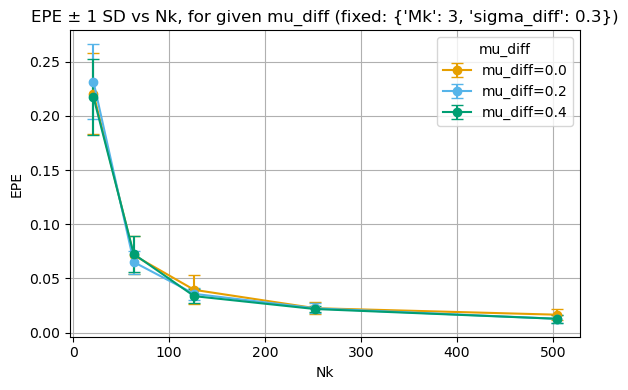

In [186]:
df_epe1 = pd.read_csv("df_epe1.csv", index_col=0)
plot_epe(df_epe1, data_grid1, param="Nk", param2="mu_diff", fixed={"Mk": 3, "sigma_diff": 0.3})

In [220]:
# contour: true rSLDS, synthetic price data

model_params1 = dict(n_regimes=2, dim_latent=1, single_subspace=True)

data_grid1 = dict(
    dt_grid         = [1/252],
    mu_diff_grid    = [0.4],
    sigma_grid      = [0.2],
    sigma_diff_grid = [0.3],
    Mk_grid         = [1, 2, 4, 6, 8, 10, 12],
    Nk_grid         = [21, 63, 126],
)

epe_threshold1=0.1

df_epe1 = compute_epe(
    model_params=model_params1,
    data_grid=data_grid1,
    pipeline_fn=pipeline_true_rSLDS_price_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold1,
    verbose=True
)


1/21  combo = (0.003968253968253968, 0.4, 0.2, 0.3, 1, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.190
Accuracy:                         0.810
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.500
Recall (macro):                   0.405
F1 score (macro):                 0.447
Confusion Matrix :
[[17  4]
 [ 0  0]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      []
Avg regime length:                7.0
Detection lag mean:               nan
Detection lag samples:            []

Mode Usage
----------
{0: 17, 1: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL (test

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.032
Accuracy:                         0.968
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.500
Recall (macro):                   0.484
F1 score (macro):                 0.492
Confusion Matrix :
[[61  2]
 [ 0  0]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      []
Avg regime length:                21.0
Detection lag mean:               nan
Detection lag samples:            []

Mode Usage
----------
{0: 61, 1: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL (tes

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.024
Accuracy:                         0.976
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.500
Recall (macro):                   0.488
F1 score (macro):                 0.494
Confusion Matrix :
[[123   3]
 [  0   0]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      []
Avg regime length:                42.0
Detection lag mean:               nan
Detection lag samples:            []

Mode Usage
----------
{0: 123, 1: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.024
Accuracy:                         0.976
Adjusted Rand Index (ARI):        0.905
Precision (macro):                0.977
Recall (macro):                   0.976
F1 score (macro):                 0.977
Confusion Matrix :
[[21  0]
 [ 1 20]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      []
Avg regime length:                21.0
Detection lag mean:               1.0
Detection lag samples:            [1]

Mode Usage
----------
{0: 22, 1: 20}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL (te

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.040
Accuracy:                         0.960
Adjusted Rand Index (ARI):        0.846
Precision (macro):                0.960
Recall (macro):                   0.960
F1 score (macro):                 0.960
Confusion Matrix :
[[60  3]
 [ 2 61]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      []
Avg regime length:                21.0
Detection lag mean:               2.0
Detection lag samples:            [2]

Mode Usage
----------
{0: 62, 1: 64}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----------
CPLL (te

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.004
Accuracy:                         0.996
Adjusted Rand Index (ARI):        0.984
Precision (macro):                0.996
Recall (macro):                   0.996
F1 score (macro):                 0.996
Confusion Matrix :
[[125   1]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.040
Accuracy:                         0.960
Adjusted Rand Index (ARI):        0.847
Precision (macro):                0.961
Recall (macro):                   0.960
F1 score (macro):                 0.961
Confusion Matrix :
[[118   8]
 [  2 124]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             2
Unmatched true changepoints:      [125]
Avg regime length:                42.0
Detection lag mean:               2.7
Detection lag samples:            [0, 8, 0]

Mode Usage
----------
{0: 120, 1: 132}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accept

CPLL 
----

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.230
Accuracy:                         0.770
Adjusted Rand Index (ARI):        0.286
Precision (macro):                0.804
Recall (macro):                   0.770
F1 score (macro):                 0.786
Confusion Matrix :
[[38 25]
 [ 4 59]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.077
Accuracy:                         0.923
Adjusted Rand Index (ARI):        0.716
Precision (macro):                0.930
Recall (macro):                   0.923
F1 score (macro):                 0.926
Confusion Matrix :
[[163  26]
 [  3 186]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.3333333333333333
Matched changepoints:             3
Unmatched true changepoints:      [125, 251]
Avg regime length:                37.8
Detection lag mean:               4.8
Detection lag samples:            [1, 8, 0, 15, 0]

Mode Usage
----------
{0: 166, 1: 212}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:      

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.037
Accuracy:                         0.963
Adjusted Rand Index (ARI):        0.857
Precision (macro):                0.966
Recall (macro):                   0.963
F1 score (macro):                 0.964
Confusion Matrix :
[[350  28]
 [  0 378]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             3
Unmatched true changepoints:      [251, 503]
Avg regime length:                94.5
Detection lag mean:               5.4
Detection lag samples:            [0, 13, 0, 14, 0]

Mode Usage
----------
{0: 350, 1: 406}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:               accep

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.223
Precision (macro):                0.817
Recall (macro):                   0.738
F1 score (macro):                 0.776
Confusion Matrix :
[[41 43]
 [ 1 83]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.25
Matched changepoints:             4
Unmatched true changepoints:      [41, 83, 125]
Avg regime length:                21.0
Detection lag mean:               6.3
Detection lag samples:            [1, 14, 0, 14, 0, 15, 0]

Mode Usage
----------
{0: 42, 1: 126}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:                [1. 1.]
Stability decision:              

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.085
Accuracy:                         0.915
Adjusted Rand Index (ARI):        0.687
Precision (macro):                0.925
Recall (macro):                   0.915
F1 score (macro):                 0.920
Confusion Matrix :
[[211  41]
 [  2 250]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.25
Matche

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.282
Accuracy:                         0.718
Adjusted Rand Index (ARI):        0.188
Precision (macro):                0.804
Recall (macro):                   0.718
F1 score (macro):                 0.759
Confusion Matrix :
[[ 57  69]
 [  2 124]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.1666666666666667
Matched changepoints:             6
Unmatched true changepoints:      [41, 83, 125, 167, 209]
Avg regime length:                18.0
Detection lag mean:               6.4
Detection lag samples:            [1, 14, 0, 14, 0, 16, 0, 11, 0, 13, 1]

Mode Usage
----------
{0: 59, 1: 193}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:               

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.118
Accuracy:                         0.882
Adjusted Rand Index (ARI):        0.584
Precision (macro):                0.895
Recall (macro):                   0.882
F1 score (macro):                 0.889
Confusion Matrix :
[[299  79]
 [ 10 368]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.6666666666666666
Matched changepoints:             6
Unmatched true changepoints:      [125, 251, 377, 503, 629]
Avg regime length:                34.4
Detection lag mean:               7.0
Detection lag samples:            [1, 12, 1, 15, 1, 16, 0, 14, 1, 16, 0]

Mode Usage
----------
{0: 309, 1: 447}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:            

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.120
Accuracy:                         0.880
Adjusted Rand Index (ARI):        0.576
Precision (macro):                0.893
Recall (macro):                   0.880
F1 score (macro):                 0.886
Confusion Matrix :
[[298  80]
 [ 11 367]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.3333333333333333
Matched changepoints:             6
Unmatched true changepoints:      [125, 251, 377, 503, 629]
Avg regime length:                29.1
Detection lag mean:               7.5
Detection lag samples:            [0, 12, 1, 13, 3, 19, 0, 15, 0, 19, 0]

Mode Usage
----------
{0: 309, 1: 447}

ELBO Diagnostics (last run)
----------------
ELBO start:                       0.00
ELBO end:                         0.00
ELBO delta:                       0.00

Spectral Radius Test
----------
Stability margins:            

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)
Regime 1:  xₜ = b + ε    (iid_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 1.0000]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1,)
[ 7.6291]

As  (K, D, D) = (2, 1, 1)
[ 0.0000]    [ 0.0000]    

bs  (K, D) = (2, 1)
[-0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0005]    [ 0.0000]    

Rs  (K, D) = (2, 1)
[-116.8538]    [ 116.8538]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = b + ε    (iid_drift)


/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


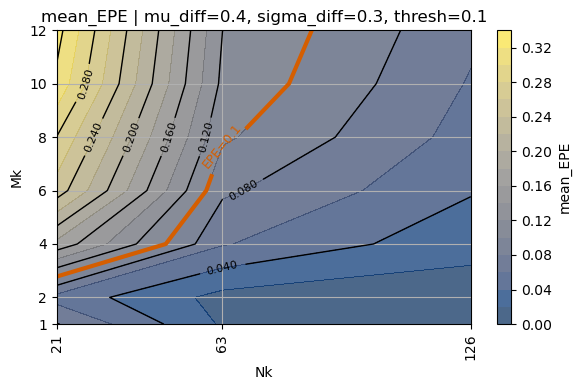

In [221]:
plot_epe_contours(df_epe1, data_grid1, param="Nk", param2="Mk", 
                  fixed={'mu_diff': 0.4, 'sigma_diff': 0.3}, threshold=epe_threshold1)

In [308]:
# convergence: trained rSLDS, synthetic price data

model_params2 = dict(n_regimes=2, dim_latent=1, single_subspace=True)

data_grid2 = dict(
    dt_grid         = [1/252],
    mu_diff_grid    = [0.0, 0.5, 1.0, 1.5, 3.0, 3.5],
    sigma_grid      = [0.2],
    sigma_diff_grid = [0.0, 0.1, 0.2, 0.3],
    Mk_grid         = [4],
    Nk_grid         = [21, 63, 126, 252, 504, 756],
)

epe_threshold2=0.2

df_epe2 = compute_epe(
    model_params=model_params2,
    data_grid=data_grid2,
    pipeline_fn=pipeline_trained_rSLDS_price_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold2,
    verbose=True
)


1/144  combo = (0.003968253968253968, 0.0, 0.2, 0.0, 4, 21)



ELBO: 108.9:  90%|█████████ | 45/50 [00:01<00:00, 39.63it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0883]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4556]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0079]    [-0.0075]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0041]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.4535]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0009]    [ 0.0007]    

r  (K,) = (2,)
[-0.0075  0.0075]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 113.1: 100%|██████████| 50/50 [00:01<00:00, 33.36it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-4.4550]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0055]    [ 0.0051]    

r  (K,) = (2,)
[-0.0134  0.0134]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0150]    

ds  (K, N) = (1, 1)
[ 0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4535]    

As  (K, D, D) = (2, 1, 1)
[ 0.9455]    [ 0.9455]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0126]    [-0.0138]    

r  (K,) = (2,)
[-0.0058  0.0058]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 118.6: 100%|██████████| 50/50 [00:00<00:00, 79.99it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0012]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-4.4545]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [-0.0001]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0147]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4532]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [-0.0019]    

r  (K,) = (2,)
[ 0.0027 -0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 474.7:  96%|█████████▌| 48/50 [00:01<00:00, 28.58it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0103]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.4975]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [-0.0086]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





ELBO: 432.0:  88%|████████▊ | 44/50 [00:01<00:00, 23.35it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0244]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.5070]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0089]    [ 0.0079]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0080]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.5010]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [ 0.0011]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 432.6:  16%|█▌        | 8/50 [00:00<00:01, 25.84it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0303]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.5018]    

As  (K, D, D) = (2, 1, 1)
[ 0.9456]    [ 0.9456]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0022]    [ 0.0011]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.329
Accuracy:                         0.671
Adjusted Rand Index (ARI):        0.114
Precision (macro):                0.801
Recall (macro):                   0.671
F1 score (macro):                 0.730
Confusion Matrix :
[[ 43  83]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched

ELBO: 459.8:  36%|███▌      | 18/50 [00:00<00:00, 39.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 125]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                50.4
Detection lag mean:               23.0
Detection lag samples:            [0, 69, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -28587.91
ELBO end:                         456.37
ELBO delta:                       29044.28

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:            

ELBO: 449.4: 100%|██████████| 50/50 [00:00<00:00, 58.12it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0039]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4992]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0004]    [ 0.0029]    

r  (K,) = (2,)
[-0.0035  0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0249]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.4987]    

As  (K, D, D) = (2, 1, 1)
[ 0.9438]    [ 0.9438]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0073]    [ 0.0002]    

r  (K,) = (2,)
[-0.0084  0.0084]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1067.6: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0049]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1554]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0024]    [-0.0056]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0097]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1447]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [ 0.0009]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1080.9:  98%|█████████▊| 49/50 [00:02<00:00, 18.23it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1080.2: 100%|██████████| 50/50 [00:02<00:00, 16.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1610]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0081]    [ 0.0162]    

r  (K,) = (2,)
[ 0.0087 -0.0087]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0033]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1541]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0034]    [-0.0009]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Figure(800x900)

========== EVALUAT

ELBO: 1068.5:   6%|▌         | 3/50 [00:00<00:02, 19.85it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.448
Accuracy:                         0.552
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.730
Recall (macro):                   0.552
F1 score (macro):                 0.629
Confusion Matrix :
[[ 28 224]
 [  2 250]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 377]
Avg regime length:                36.0
Detection lag mean:               12.3
Detection lag samples:            [0, 37, 0]

Mode Usage
----------
{0: 30, 1: 474}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -51341.51
ELBO end:                         1067.35
ELBO delta:                       52408.86

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:           

ELBO: 1034.1: 100%|██████████| 50/50 [00:01<00:00, 40.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1608]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0095]    [-0.0087]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0013]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1520]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0034]    [-0.0090]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2395.2:  96%|█████████▌| 48/50 [00:04<00:00,  9.31it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7726]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0129]    [-0.0131]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0043]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.7682]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [-0.0057]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2422.1: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0122]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7772]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [-0.0069]    

r  (K,) = (2,)
[-0.0031  0.0031]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0032]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7699]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0032]    [-0.0076]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7630]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [-0.0092]    

r  (K,) = (2,)
[ 0.0015 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.455
Accuracy:                         0.545
Adjusted Rand Index (ARI):        0.008
Precision (macro):                0.675
Recall (macro):                   0.545
F1 score (macro):                 0.603
Confusion Matrix :
[[ 57 447]
 [ 12 492]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 2436.6:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.510
F1 score (macro):                 0.608
Confusion Matrix :
[[ 10 494]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                144.0
Detection lag mean:               49.0
Detection lag samples:            [0, 147, 0]

Mode Usage
----------
{1: 998, 0: 10}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -100045.41
ELBO end:                         2444.33
ELBO delta:                       102489.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision: 

ELBO: 2416.6:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.672
Recall (macro):                   0.520
F1 score (macro):                 0.586
Confusion Matrix :
[[ 25 479]
 [  5 499]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                72.0
Detection lag mean:               113.3
Detection lag samples:            [0, 340, 0]

Mode Usage
----------
{0: 30, 1: 978}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -95762.98
ELBO end:                         2444.53
ELBO delta:                       98207.50

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 2434.0: 100%|██████████| 50/50 [00:02<00:00, 22.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0000]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7672]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [ 0.0003]    

r  (K,) = (2,)
[ 0.0019 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0099]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7710]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0040]    [-0.0048]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5305.5: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 5293.4: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3258]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0222]    [-0.0009]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -195681.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3329]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0079]    [ 0.0066]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[   4 1004]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

ELBO: 5318.2:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.672
Recall (macro):                   0.508
F1 score (macro):                 0.579
Confusion Matrix :
[[1004    4]
 [ 987   21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                80.6
Detection lag mean:               77.3
Detection lag samples:            [42, 0, 190]

Mode Usage
----------
{0: 1991, 1: 25}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -190282.69
ELBO end:                         5273.96
ELBO delta:                       195556.65

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability dec

ELBO: 5241.7:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.458
Accuracy:                         0.542
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.543
Recall (macro):                   0.542
F1 score (macro):                 0.542
Confusion Matrix :
[[629 379]
 [545 463]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               2.0
Detection lag samples:            [5, 1, 0]

Mode Usage
----------
{1: 842, 0: 1174}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -205339.49
ELBO end:                         5305.48
ELBO delta:                       210644.97

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 5260.3:  18%|█▊        | 9/50 [00:01<00:04,  9.85it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.502
Recall (macro):                   0.502
F1 score (macro):                 0.502
Confusion Matrix :
[[641 367]
 [637 371]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.8
Detection lag mean:               0.3
Detection lag samples:            [0, 0, 1]

Mode Usage
----------
{1: 738, 0: 1278}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -186097.00
ELBO end:                         5293.41
ELBO delta:                       191390.42

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:  

ELBO: 5338.0: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0024]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3223]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0140]    [ 0.0256]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.580
Recall (macro):                   0.511
F1 score (macro):                 0.543
Confusion Matrix :
[[ 49 959]
 [ 26 982]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0177]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3355]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0008]    [-0.0084]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.465
Accuracy:                         0.535
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.582
Recall (macro):                   0.535
F1 score (macro):                 0.557
Confusion Matrix :
[[921  87]
 [851 157]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched

ELBO: 8305.7: 100%|██████████| 50/50 [00:12<00:00,  4.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6198]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0121]    [-0.0015]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.6355]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0209]    [ 0.0243]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0017]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6294]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0170]    [ 0.0026]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0041]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6259]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0247]    [-0.0072]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0056]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6287]    

As  (K, D, D) = (2, 1, 1)
[ 0.9501]    [ 0.9501]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0149]    [-0.0042]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6274]    

As  (K, D, D) = (2, 1, 1)
[ 0.9501]    [ 0.9501]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0263]    [ 0.0156]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0033]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6260]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0144]    [-0.0012]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8229.4:   2%|▏         | 1/50 [00:00<00:19,  2.53it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.501
Recall (macro):                   0.501
F1 score (macro):                 0.501
Confusion Matrix :
[[930 582]
 [926 586]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               1.7
Detection lag samples:            [5, 0, 0]

Mode Usage
----------
{1: 1168, 0: 1856}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -292904.34
ELBO end:                         8273.00
ELBO delta:                       301177.34

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 8266.1: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0017]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6250]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0131]    [-0.0095]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0106]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6259]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0063]    [-0.0078]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.519
Recall (macro):                   0.519
F1 score (macro):                 0.519
Confusion Matrix :
[[789 723]
 [732 780]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.2
Detection lag mean:               1.7
Detection lag samples:            [0, 3, 2]

Mode Usage
----------
{1: 1503, 0: 1521}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -308301.22
ELBO end:                         8224.80
ELBO delta:                       316526.01

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 114.0:  96%|█████████▌| 48/50 [00:00<00:00, 56.98it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0319]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-4.4527]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0030]    [-0.0036]    

r  (K,) = (2,)
[-0.0043  0.0043]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0125]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4532]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [-0.0041]    

r  (K,) = (2,)
[ 0.0064 -0.0064]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 101.1: 100%|██████████| 50/50 [00:00<00:00, 53.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0013]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-4.4536]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0114]    [-0.0108]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0805]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.4538]    

As  (K, D, D) = (2, 1, 1)
[ 0.9454]    [ 0.9454]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [ 0.0021]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 31.8:   6%|▌         | 3/50 [00:00<00:01, 29.14it/s] 

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.310
Accuracy:                         0.690
Adjusted Rand Index (ARI):        0.136
Precision (macro):                0.723
Recall (macro):                   0.690
F1 score (macro):                 0.706
Confusion Matrix :
[[21 21]
 [ 5 37]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                42.0
Detection lag mean:               2.5
Detection lag samples:            [5, 0]

Mode Usage
----------
{0: 26, 1: 58}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -11089.09
ELBO end:                         112.03
ELBO delta:                       11201.12

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

C

ELBO: 119.0: 100%|██████████| 50/50 [00:00<00:00, 88.61it/s] 



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0026]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4555]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0094]    [ 0.0097]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0031]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.4540]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0051]    [ 0.0054]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 456.8:  92%|█████████▏| 46/50 [00:01<00:00, 26.08it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0006]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4989]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0009]    [-0.0017]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0013]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.5024]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0171]    [ 0.0181]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 462.1: 100%|██████████| 50/50 [00:01<00:00, 26.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.4984]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0023]    [ 0.0044]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0045]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.5034]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0231]    [ 0.0212]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 464.3:   0%|          | 0/50 [00:00<?, ?it/s]   it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.224
Precision (macro):                0.802
Recall (macro):                   0.738
F1 score (macro):                 0.769
Confusion Matrix :
[[ 64  62]
 [  4 122]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             2
Unmatched true changepoints:      [125]
Avg regime length:                63.0
Detection lag mean:               21.0
Detection lag samples:            [4, 59, 0]

Mode Usage
----------
{0: 68, 1: 184}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -20680.53
ELBO end:                         477.75
ELBO delta:                       21158.28

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 470.4:  20%|██        | 10/50 [00:00<00:01, 33.13it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.084
Precision (macro):                0.793
Recall (macro):                   0.647
F1 score (macro):                 0.713
Confusion Matrix :
[[ 37  89]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               10.0
Detection lag samples:            [0, 30, 0]

Mode Usage
----------
{0: 37, 1: 215}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -24645.46
ELBO end:                         432.07
ELBO delta:                       25077.53

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 468.4:  96%|█████████▌| 48/50 [00:00<00:00, 64.33it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0290]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.5058]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0127]    [-0.0086]    

r  (K,) = (2,)
[-0.0035  0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0293]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.5022]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [ 0.0081]    

r  (K,) = (2,)
[-0.0054  0.0054]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 447.9: 100%|██████████| 50/50 [00:00<00:00, 55.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1070.2: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1068.5:  92%|█████████▏| 46/50 [00:02<00:00, 17.33it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1067.9:  92%|█████████▏| 46/50 [00:02<00:00, 17.33it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0294]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1479]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0043]    [-0.0074]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0236]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1486]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [-0.0044]    

r  (K,) = (2,)
[-0.0014  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1058.5:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1058.0:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1437]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0012]    [ 0.0040]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1408]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0035]    [-0.0051]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1062.6:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               6.7
Detection lag samples:            [0, 20, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55107.67
ELBO end:                         1024.18
ELBO delta:                       56131.85

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1080.3:  14%|█▍        | 7/50 [00:00<00:02, 20.36it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.448
Accuracy:                         0.552
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.764
Recall (macro):                   0.552
F1 score (macro):                 0.641
Confusion Matrix :
[[ 26 226]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 26, 1: 478}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -44317.41
ELBO end:                         1048.39
ELBO delta:                       45365.81

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1057.2: 100%|██████████| 50/50 [00:01<00:00, 36.01it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0059]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1499]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0023]    [ 0.0081]    

r  (K,) = (2,)
[ 0.0033 -0.0033]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1367]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0034]    [-0.0047]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s][00:00<?, ?it/s]]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):                 0.540
Confusion Matrix :
[[  2 250]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -52129.88
ELBO end:                         1057.22
ELBO delta:                       53187.11

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 2408.8: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0017]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7613]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0051]    [-0.0038]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0040]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7492]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [-0.0022]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2357.9: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7661]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0077]    [-0.0098]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7562]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0075]    [-0.0038]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0047]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7589]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0009]    [ 0.0133]    

r  (K,) = (2,)
[ 0.0039 -0.0039]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0062]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7555]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0042]    [-0.0086]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2401.3:   4%|▍         | 2/50 [00:00<00:03, 15.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.486
Accuracy:                         0.514
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.515
Recall (macro):                   0.514
F1 score (macro):                 0.514
Confusion Matrix :
[[314 190]
 [300 204]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               2.0
Detection lag samples:            [1, 2, 3]

Mode Usage
----------
{1: 394, 0: 614}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -99194.81
ELBO end:                         2379.35
ELBO delta:                       101574.15

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 2410.2: 100%|██████████| 50/50 [00:02<00:00, 24.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7680]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [ 0.0012]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0050]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7575]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0015]    [-0.0071]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.399
Accuracy:                         0.601
Adjusted Rand Index (ARI):        0.041
Precision (macro):                0.778
Recall (macro):                   0.601
F1 score (macro):                 0.678
Confusion Matrix :
[[102 402]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                38.8
Detection lag mean:               16.0
Detection lag samples:            [0, 48, 0]

Mode Usage
----------
{0: 102, 1: 906}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -105986.09
ELBO end:                         2410.23
ELBO delta:                       108396.32

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:  

ELBO: 5284.5: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0082]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3320]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0174]    [ 0.0050]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0168]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3371]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0139]    [-0.0119]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3260]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0052]    [ 0.0203]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0023]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.3025]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [ 0.0098]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0141]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3252]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0126]    [-0.0047]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3179]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0106]    [-0.0023]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5215.4:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[   4 1004]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                288.0
Detection lag mean:               6.3
Detection lag samples:            [0, 19, 0]

Mode Usage
----------
{1: 2012, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -218629.19
ELBO end:                         5287.07
ELBO delta:                       223916.26

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 5325.7:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.508
Recall (macro):                   0.508
F1 score (macro):                 0.508
Confusion Matrix :
[[541 467]
 [525 483]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               0.7
Detection lag samples:            [1, 0, 1]

Mode Usage
----------
{0: 1066, 1: 950}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -187924.48
ELBO end:                         5340.45
ELBO delta:                       193264.93

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:  

ELBO: 5297.4: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0042]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3293]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0029]    [ 0.0047]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3149]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0076]    [-0.0124]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.475
Accuracy:                         0.525
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.527
Recall (macro):                   0.525
F1 score (macro):                 0.526
Confusion Matrix :
[[664 344]
 [614 394]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.1
Detection lag mean:               2.3
Detection lag samples:            [6, 0, 1]

Mode Usage
----------
{0: 1278, 1: 738}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -201361.70
ELBO end:                         5314.01
ELBO delta:                       206675.71

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 8233.2: 100%|██████████| 50/50 [00:11<00:00,  4.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0068]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5946]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [-0.0144]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0100]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5925]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0090]    [-0.0014]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6103]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0103]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0094]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6062]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0162]    [ 0.0047]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0069]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.5946]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0193]    [-0.0065]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0110]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6169]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0081]    [ 0.0026]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -314436.7:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.513
Recall (macro):                   0.511
F1 score (macro):                 0.512
Confusion Matrix :
[[ 506 1006]
 [ 472 1040]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.9
Detection lag mean:               1.0
Detection lag samples:            [0, 0, 3]

Mode Usage
----------
{1: 2046, 0: 978}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -312021.38
ELBO end:                         8164.55
ELBO delta:                       320185.93

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision

ELBO: 8162.7:   4%|▍         | 2/50 [00:00<00:12,  3.96it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.747
Recall (macro):                   0.520
F1 score (macro):                 0.613
Confusion Matrix :
[[  61 1451]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [755, 1511, 2267]
Avg regime length:                378.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 62, 1: 2962}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -301393.12
ELBO end:                         8233.20
ELBO delta:                       309626.32

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:

ELBO: 8161.3:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.501
Recall (macro):                   0.501
F1 score (macro):                 0.501
Confusion Matrix :
[[689 823]
 [687 825]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.4
Detection lag mean:               0.7
Detection lag samples:            [0, 0, 2]

Mode Usage
----------
{0: 1376, 1: 1648}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -287168.70
ELBO end:                         8242.06
ELBO delta:                       295410.76

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision: 

ELBO: 8156.6: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0023]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5880]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [-0.0043]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0006]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5879]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0043]    [ 0.0260]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 106.7:  92%|█████████▏| 46/50 [00:00<00:00, 51.27it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0266]    

ds  (K, N) = (1, 1)
[ 0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4555]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0103]    [ 0.0106]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0017]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-4.4474]    

As  (K, D, D) = (2, 1, 1)
[ 0.9497]    [ 0.9497]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0014]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 119.5: 100%|██████████| 50/50 [00:00<00:00, 66.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 103.7: 100%|██████████| 50/50 [00:00<00:00, 57.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 100.9: 100%|██████████| 50/50 [00:00<00:00, 56.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 111.5:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0383]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-4.4516]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0071]    [-0.0074]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0020]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.4537]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0075]    [-0.0079]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 114.3:  14%|█▍        | 7/50 [00:00<00:01, 33.46it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9882.16
ELBO end:                         122.07
ELBO delta:                       10004.23

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 104.4: 100%|██████████| 50/50 [00:00<00:00, 71.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0042]    

ds  (K, N) = (1, 1)
[ 0.0037]    

inv_etas  (K, N) = (1, 1)
[-4.4501]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0022]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0035 -0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0029]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4499]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0041]    [-0.0035]    

r  (K,) = (2,)
[ 0.0075 -0.0075]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 455.0: 100%|██████████| 50/50 [00:01<00:00, 29.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 445.1: 100%|██████████| 50/50 [00:01<00:00, 27.57it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4954]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0124]    [-0.0104]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0020]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4930]    

As  (K, D, D) = (2, 1, 1)
[ 0.9497]    [ 0.9497]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0011]    [ 0.0022]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 456.8:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0324]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4950]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0027]    [ 0.0048]    

r  (K,) = (2,)
[ 0.0011 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0063]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4982]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0008]    [-0.0006]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 436.5:  14%|█▍        | 7/50 [00:00<00:01, 33.79it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{1: 249, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25254.06
ELBO end:                         448.48
ELBO delta:                       25702.54

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 445.7: 100%|██████████| 50/50 [00:00<00:00, 58.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0057]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.4920]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0061]    [ 0.0025]    

r  (K,) = (2,)
[ 0.0047 -0.0047]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.4842]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0011]    [ 0.0040]    

r  (K,) = (2,)
[ 0.0036 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1076.8:  94%|█████████▍| 47/50 [00:02<00:00, 17.21it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0055]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1400]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0106]    [-0.0084]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0025]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1303]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0088]    [ 0.0004]    

r  (K,) = (2,)
[ 0.0052 -0.0052]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1031.1:  94%|█████████▍| 47/50 [00:02<00:00, 17.21it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.8:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1411]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0022]    [-0.0034]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1249]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0040]    [ 0.0005]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1029.5: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0037]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1370]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0121]    [-0.0094]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1386]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0015]    [-0.0014]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -54478.6:   0%|          | 0/50 [00:00<?, ?it/s]


ELBO Diagnostics (last run)
----------------
ELBO start:                       -53794.10
ELBO end:                         1062.56
ELBO delta:                       54856.66

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      -2006.7
Approx. upper bound on CPLL:      1458.1
Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.401
Accuracy:                         0.599
Adjusted Rand Index (ARI):        0.039
Precision (macro):                0.778
Recall (macro):                   0.599
F1 score (macro):                 0.677
Confusion Matrix :
[[ 50 202]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 377]
Avg regime length:                84.0
Detection l

ELBO: 1069.6:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.248
Accuracy:                         0.752
Adjusted Rand Index (ARI):        0.253
Precision (macro):                0.834
Recall (macro):                   0.752
F1 score (macro):                 0.791
Confusion Matrix :
[[127 125]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 377]
Avg regime length:                126.0
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{0: 127, 1: 377}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -52754.39
ELBO end:                         1056.35
ELBO delta:                       53810.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:          

ELBO: 1058.1: 100%|██████████| 50/50 [00:01<00:00, 33.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0034]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1321]    

As  (K, D, D) = (2, 1, 1)
[ 0.9452]    [ 0.9452]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0200]    [ 0.0117]    

r  (K,) = (2,)
[-0.0032  0.0032]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1419]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0145]    [ 0.0188]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2376.0: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0015]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.7384]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0017]    [ 0.0020]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0045]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7411]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [ 0.0013]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -94408.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7310]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0109]    [-0.0115]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0317]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7408]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [-0.0020]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 2371.6:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.463
Accuracy:                         0.537
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.760
Recall (macro):                   0.537
F1 score (macro):                 0.629
Confusion Matrix :
[[ 37 467]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                126.0
Detection lag mean:               5.7
Detection lag samples:            [0, 17, 0]

Mode Usage
----------
{0: 37, 1: 971}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -110653.31
ELBO end:                         2388.59
ELBO delta:                       113041.90

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 2375.6:  94%|█████████▍| 47/50 [00:01<00:00, 25.46it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0075]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.7407]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0056]    [ 0.0117]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.418
Accuracy:                         0.582
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.772
Recall (macro):                   0.582
F1 score (macro):                 0.664
Confusion Matrix :
[[ 83 421]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2396.0: 100%|██████████| 50/50 [00:02<00:00, 24.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0093]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7461]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0060]    [-0.0052]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.326
Accuracy:                         0.674
Adjusted Rand Index (ARI):        0.120
Precision (macro):                0.780
Recall (macro):                   0.674
F1 score (macro):                 0.723
Confusion Matrix :
[[184 320]
 [  9 495]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched

ELBO: 5223.7: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0026]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2855]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0073]    [-0.0062]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0036]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2919]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0175]    [ 0.0124]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0030]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2860]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0125]    [-0.0000]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0202]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.2726]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0061]    [-0.0024]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5161.9:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0045]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2953]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0116]    [-0.0221]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.459
Accuracy:                         0.541
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.643
Recall (macro):                   0.541
F1 score (macro):                 0.588
Confusion Matrix :
[[120 888]
 [ 37 971]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched

ELBO: 5190.7:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.439
Accuracy:                         0.561
Adjusted Rand Index (ARI):        0.014
Precision (macro):                0.566
Recall (macro):                   0.561
F1 score (macro):                 0.564
Confusion Matrix :
[[426 582]
 [303 705]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.0
Detection lag mean:               0.3
Detection lag samples:            [0, 1, 0]

Mode Usage
----------
{1: 1287, 0: 729}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -194193.48
ELBO end:                         5223.73
ELBO delta:                       199417.21

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5198.7: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0000]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2683]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0146]    [-0.0118]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.625
Recall (macro):                   0.501
F1 score (macro):                 0.556
Confusion Matrix :
[[   3 1005]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.467
Accuracy:                         0.533
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.533
Recall (macro):                   0.533
F1 score (macro):                 0.533
Confusion Matrix :
[[505 503]
 [439 569]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               0.0
Detection lag samples:            [0, 0, 0]

Mode Usage
----------
{0: 944, 1: 1072}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -202887.66
ELBO end:                         5198.70
ELBO delta:                       208086.35

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 8053.7: 100%|██████████| 50/50 [00:12<00:00,  3.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0057]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5438]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0110]    [-0.0085]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.5631]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0157]    [ 0.0012]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0000]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5525]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0116]    [-0.0009]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5510]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0035]    [-0.0130]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5654]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [ 0.0137]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro):                 0.604
Confusion Matrix :
[[  16 1496]
 [   0 1512]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

ELBO: -311826.0:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.347
Accuracy:                         0.653
Adjusted Rand Index (ARI):        0.094
Precision (macro):                0.698
Recall (macro):                   0.653
F1 score (macro):                 0.675
Confusion Matrix :
[[ 630  882]
 [ 166 1346]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                4.1
Detection lag mean:               5.3
Detection lag samples:            [0, 15, 1]

Mode Usage
----------
{1: 2228, 0: 796}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -305533.25
ELBO end:                         8167.93
ELBO delta:                       313701.18

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 7993.5:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.410
Accuracy:                         0.590
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.610
Recall (macro):                   0.590
F1 score (macro):                 0.600
Confusion Matrix :
[[ 568  944]
 [ 296 1216]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.5
Detection lag mean:               6.0
Detection lag samples:            [4, 10, 4]

Mode Usage
----------
{1: 2160, 0: 864}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -304614.73
ELBO end:                         8048.56
ELBO delta:                       312663.29

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisio

ELBO: 7994.7: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0085]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.5488]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [ 0.0005]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5147]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0220]    [ 0.0066]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 110.0: 100%|██████████| 50/50 [00:00<00:00, 80.59it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 116.1:  88%|████████▊ | 44/50 [00:00<00:00, 80.10it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0066]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4524]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0208]    [-0.0211]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0011]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4487]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0098]    [-0.0095]    

r  (K,) = (2,)
[ 0.0060 -0.0060]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 118.4: 100%|██████████| 50/50 [00:00<00:00, 80.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.792
Recall (macro):                   0.738
F1 score (macro):                 0.764
Confusion Matrix :
[[22 20]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                21.0
Detection lag mean:               4.7
Detection lag samples:            [2, 12, 0]

Mode Usage
----------
{0: 24, 1: 60}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9389.97
ELBO end:                         112.68
ELBO delta:                       9502.64

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept


ELBO: 110.3: 100%|██████████| 50/50 [00:00<00:00, 98.65it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-4.4445]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [-0.0010]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[ 0.0020]    

inv_etas  (K, N) = (1, 1)
[-4.4473]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0109]    [ 0.0116]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 437.7:  96%|█████████▌| 48/50 [00:01<00:00, 27.32it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4843]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0012]    [-0.0016]    

r  (K,) = (2,)
[-0.0022  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.4758]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0141]    [ 0.0127]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 442.7: 100%|██████████| 50/50 [00:01<00:00, 30.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 447.9: 100%|██████████| 50/50 [00:01<00:00, 29.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/42128921

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[  4 122]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 248, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25055.96
ELBO end:                         453.61
ELBO delta:                       25509.57

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 472.7: 100%|██████████| 50/50 [00:00<00:00, 57.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0036]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.4629]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0024]    [ 0.0053]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0147]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4773]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0096]    [ 0.0071]    

r  (K,) = (2,)
[ 0.0016 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1035.5:  98%|█████████▊| 49/50 [00:02<00:00, 18.44it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0191]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1223]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0053]    [-0.0047]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0004]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1044]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0059]    [-0.0035]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 1049.2: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1051.0: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0248]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1175]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [-0.0075]    

r  (K,) = (2,)
[ 0.0070 -0.0070]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.0986]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [-0.0075]    

r  (K,) = (2,)
[ 0.0080 -0.0080]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1043.1:   6%|▌         | 3/50 [00:00<00:02, 21.74it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.773
Recall (macro):                   0.583
F1 score (macro):                 0.665
Confusion Matrix :
[[ 42 210]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{0: 42, 1: 462}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -46058.70
ELBO end:                         1049.22
ELBO delta:                       47107.92

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1076.0: 100%|██████████| 50/50 [00:01<00:00, 40.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0012]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1165]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0058]    [ 0.0024]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1214]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0004]    [-0.0054]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2354.6: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0033]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.6831]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0055]    [-0.0157]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.6837]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [-0.0047]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -93173.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.6830]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0058]    [ 0.0019]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0005]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.6971]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0008]    [-0.0130]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2327.4:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.485
Accuracy:                         0.515
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.515
F1 score (macro):                 0.612
Confusion Matrix :
[[ 15 489]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                53.1
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{1: 993, 0: 15}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -95761.01
ELBO end:                         2321.91
ELBO delta:                       98082.91

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 2369.1:  14%|█▍        | 7/50 [00:00<00:02, 15.39it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.758
Recall (macro):                   0.532
F1 score (macro):                 0.625
Confusion Matrix :
[[ 32 472]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{0: 32, 1: 976}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -99889.37
ELBO end:                         2405.74
ELBO delta:                       102295.11

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 2360.1: 100%|██████████| 50/50 [00:02<00:00, 24.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7058]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [ 0.0067]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  6 498]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -190088.5:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.486
Accuracy:                         0.514
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.514
F1 score (macro):                 0.611
Confusion Matrix :
[[ 14 490]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               4.0
Detection lag samples:            [0, 12, 0]

Mode Usage
----------
{0: 14, 1: 994}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -93229.94
ELBO end:                         2360.13
ELBO delta:                       95590.07

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 5064.6: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0276]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2094]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0033]    [ 0.0027]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0017]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1919]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0060]    [-0.0072]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.609
Confusion Matrix :
[[  23  985]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                65.0
Detection lag mean:               2.7
Detection lag samples:            [0, 8, 0]

Mode Usage
----------
{1: 1993, 0: 23}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -211991.33
ELBO end:                         5130.83
ELBO delta:                       217122.16

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisio

ELBO: 5043.2:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.441
Accuracy:                         0.559
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.559
Recall (macro):                   0.559
F1 score (macro):                 0.559
Confusion Matrix :
[[613 395]
 [495 513]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               0.3
Detection lag samples:            [0, 1, 0]

Mode Usage
----------
{0: 1108, 1: 908}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -199840.51
ELBO end:                         5108.03
ELBO delta:                       204948.54

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5036.5:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.030
Precision (macro):                0.587
Recall (macro):                   0.587
F1 score (macro):                 0.587
Confusion Matrix :
[[636 372]
 [461 547]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               2.3
Detection lag samples:            [3, 3, 1]

Mode Usage
----------
{0: 1097, 1: 919}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -190088.50
ELBO end:                         5094.03
ELBO delta:                       195182.53

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 5028.1: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2131]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0186]    [ 0.0023]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0107]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.2013]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0131]    [-0.0007]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 7908.3: 100%|██████████| 50/50 [00:13<00:00,  3.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0042]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4593]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0093]    [ 0.0063]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4545]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0074]    [ 0.0034]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0115]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4345]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0101]    [ 0.0067]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0141]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.4627]    

As  (K, D, D) = (2, 1, 1)
[ 0.9472]    [ 0.9472]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0083]    [-0.0029]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4679]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0098]    [ 0.0269]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4368]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [-0.0001]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4735]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0148]    [ 0.0098]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 7809.0:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.383
Accuracy:                         0.617
Adjusted Rand Index (ARI):        0.055
Precision (macro):                0.782
Recall (macro):                   0.617
F1 score (macro):                 0.690
Confusion Matrix :
[[ 355 1157]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                10.3
Detection lag mean:               5.0
Detection lag samples:            [0, 14, 1]

Mode Usage
----------
{0: 356, 1: 2668}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -303457.44
ELBO end:                         7729.31
ELBO delta:                       311186.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 7929.1:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.504
Recall (macro):                   0.504
F1 score (macro):                 0.504
Confusion Matrix :
[[766 746]
 [755 757]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               0.0
Detection lag samples:            [0, 0, 0]

Mode Usage
----------
{1: 1503, 0: 1521}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -318069.27
ELBO end:                         7833.66
ELBO delta:                       325902.93

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 7741.7: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4866]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [-0.0147]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4363]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0111]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 118.8:  80%|████████  | 40/50 [00:01<00:00, 37.96it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0012]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4572]    

As  (K, D, D) = (2, 1, 1)
[ 0.9498]    [ 0.9498]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0044]    

r  (K,) = (2,)
[-0.0033  0.0033]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0085]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-4.4529]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0047]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 114.1: 100%|██████████| 50/50 [00:01<00:00, 42.57it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0132]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4562]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0034]    [ 0.0039]    

r  (K,) = (2,)
[-0.0086  0.0086]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0190]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.4532]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0017]    [-0.0007]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.0
Detection lag samples:            [8, 0]

Mode Usage
----------
{0: 82, 1: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8209.24
ELBO end:                         114.78
ELBO delta:                       8324.02

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept


ELBO: 103.4: 100%|██████████| 50/50 [00:00<00:00, 71.74it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-4.4508]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0051]    [ 0.0050]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0123]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4531]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0059]    

r  (K,) = (2,)
[ 0.0014 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 454.7:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 463.4:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0081]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4983]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0072]    [ 0.0048]    

r  (K,) = (2,)
[ 0.0011 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0051]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.5004]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0000]    [ 0.0041]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 463.4: 100%|██████████| 50/50 [00:01<00:00, 26.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0140]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.5047]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0061]    [ 0.0025]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.472
Accuracy:                         0.528
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.757
Recall (macro):                   0.528
F1 score (macro):                 0.622
Confusion Matrix :
[[  7 119]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 445.0:   6%|▌         | 3/50 [00:00<00:01, 29.48it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.504
F1 score (macro):                 0.541
Confusion Matrix :
[[  2 124]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               23.0
Detection lag samples:            [0, 69, 0]

Mode Usage
----------
{1: 249, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -28786.55
ELBO end:                         455.47
ELBO delta:                       29242.02

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 461.6: 100%|██████████| 50/50 [00:00<00:00, 59.87it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0358]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.5040]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0042]    [-0.0022]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.4990]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0100]    [ 0.0078]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1039.0:  96%|█████████▌| 48/50 [00:02<00:00, 15.52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1560]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0055]    [ 0.0029]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0123]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1508]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [-0.0034]    

r  (K,) = (2,)
[-0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1079.4: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1049.5:   0%|          | 0/50 [00:00<?, ?it/s]  5it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0011]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1587]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0085]    [-0.0019]    

r  (K,) = (2,)
[-0.0055  0.0055]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.470
Accuracy:                         0.530
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.728
Recall (macro):                   0.530
F1 score (macro):                 0.613
Confusion Matrix :
[[ 16 236]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched

ELBO: 1083.8:  16%|█▌        | 8/50 [00:00<00:01, 23.87it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 502, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55080.64
ELBO end:                         1055.15
ELBO delta:                       56135.79

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 1077.8: 100%|██████████| 50/50 [00:01<00:00, 40.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0185]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1536]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0054]    [-0.0014]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1477]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0041]    [ 0.0032]    

r  (K,) = (2,)
[-0.0040  0.0040]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2400.9: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0012]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.7664]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [ 0.0032]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0089]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7682]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [ 0.0052]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.p


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0081]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7652]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0038]    [ 0.0070]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.438
Accuracy:                         0.562
Adjusted Rand Index (ARI):        0.015
Precision (macro):                0.759
Recall (macro):                   0.562
F1 score (macro):                 0.646
Confusion Matrix :
[[ 64 440]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2440.4:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.439
Accuracy:                         0.561
Adjusted Rand Index (ARI):        0.014
Precision (macro):                0.758
Recall (macro):                   0.561
F1 score (macro):                 0.645
Confusion Matrix :
[[ 62 442]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               90.7
Detection lag samples:            [0, 272, 0]

Mode Usage
----------
{0: 63, 1: 945}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -97139.07
ELBO end:                         2419.59
ELBO delta:                       99558.66

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 2385.4: 100%|██████████| 50/50 [00:02<00:00, 24.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0020]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7772]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0117]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0017]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7704]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [ 0.0019]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -199423.1:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.453
Accuracy:                         0.547
Adjusted Rand Index (ARI):        0.008
Precision (macro):                0.712
Recall (macro):                   0.547
F1 score (macro):                 0.618
Confusion Matrix :
[[ 53 451]
 [  6 498]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                126.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 59, 1: 949}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -104084.91
ELBO end:                         2385.42
ELBO delta:                       106470.34

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 5309.1: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3391]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0028]    [ 0.0008]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0099]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3337]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0138]    [-0.0187]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0097]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3224]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0042]    [-0.0048]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0195]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3276]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0080]    [ 0.0065]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0121]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3414]    

As  (K, D, D) = (2, 1, 1)
[ 0.9453]    [ 0.9453]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0022]    [ 0.0107]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.436
Accuracy:                         0.564
Adjusted Rand Index (ARI):        0.016
Precision (macro):                0.578
Recall (macro):                   0.564
F1 score (macro):                 0.571
Confusion Matrix :
[[785 223]
 [656 352]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched

ELBO: 5245.7:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.447
Accuracy:                         0.553
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.553
Recall (macro):                   0.553
F1 score (macro):                 0.553
Confusion Matrix :
[[560 448]
 [453 555]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.4
Detection lag mean:               1.0
Detection lag samples:            [0, 2, 1]

Mode Usage
----------
{1: 1003, 0: 1013}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -185704.08
ELBO end:                         5286.49
ELBO delta:                       190990.57

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:  

ELBO: 5269.1:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.444
Accuracy:                         0.556
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.556
Recall (macro):                   0.556
F1 score (macro):                 0.556
Confusion Matrix :
[[614 394]
 [502 506]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               0.7
Detection lag samples:            [1, 1, 0]

Mode Usage
----------
{1: 900, 0: 1116}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -199787.60
ELBO end:                         5287.62
ELBO delta:                       205075.22

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 5297.4: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3215]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0090]    [ 0.0099]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3292]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0073]    [ 0.0001]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8223.7: 100%|██████████| 50/50 [00:12<00:00,  3.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6281]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [ 0.0122]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6160]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [ 0.0021]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0021]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6188]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0111]    [ 0.0112]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0071]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6271]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0082]    [ 0.0125]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.470
Accuracy:                         0.530
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.724
Recall (macro):                   0.530
F1 score (macro):                 0.612
Confusion Matrix :
[[  98 1414]
 [   7 1505]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -308954.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0077]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6137]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0030]    [ 0.0014]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0043]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.6253]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0055]    [-0.0036]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -319337.1:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.553
Recall (macro):                   0.540
F1 score (macro):                 0.547
Confusion Matrix :
[[1188  324]
 [1066  446]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.6666666666666666
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                4.5
Detection lag mean:               0.7
Detection lag samples:            [1, 1, 0]

Mode Usage
----------
{1: 770, 0: 2254}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -311112.16
ELBO end:                         8197.54
ELBO delta:                       319309.70

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision

ELBO: 8288.6:  10%|█         | 5/50 [00:01<00:10,  4.46it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.443
Accuracy:                         0.557
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.559
Recall (macro):                   0.557
F1 score (macro):                 0.558
Confusion Matrix :
[[998 514]
 [827 685]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               2.0
Detection lag samples:            [5, 1, 0]

Mode Usage
----------
{1: 1199, 0: 1825}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -302692.10
ELBO end:                         8261.91
ELBO delta:                       310954.01

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 8216.8: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0041]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.6427]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [-0.0089]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6184]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0076]    [ 0.0053]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 113.5:  98%|█████████▊| 49/50 [00:01<00:00, 44.42it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0027]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4511]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0133]    [-0.0131]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0013]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4544]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0147]    [ 0.0149]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 108.0: 100%|██████████| 50/50 [00:01<00:00, 45.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 116.3:  80%|████████  | 40/50 [00:01<00:00, 40.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0107]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.4548]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0069]    [-0.0052]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched cha

ELBO: 113.2:  20%|██        | 10/50 [00:00<00:00, 47.15it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.808
Recall (macro):                   0.738
F1 score (macro):                 0.771
Confusion Matrix :
[[21 21]
 [ 1 41]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                42.0
Detection lag mean:               0.5
Detection lag samples:            [1, 0]

Mode Usage
----------
{0: 22, 1: 62}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -6584.62
ELBO end:                         110.05
ELBO delta:                       6694.67

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPL

ELBO: 95.2:  78%|███████▊  | 39/50 [00:00<00:00, 83.45it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0009]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-4.4483]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0083]    [ 0.0088]    

r  (K,) = (2,)
[-0.0011  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0696]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-4.4460]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [ 0.0049]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 117.8: 100%|██████████| 50/50 [00:00<00:00, 79.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 439.8:   0%|          | 0/50 [00:00<?, ?it/s]   

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.345
Accuracy:                         0.655
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.671
Recall (macro):                   0.655
F1 score (macro):                 0.663
Confusion Matrix :
[[21 21]
 [ 8 34]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                42.0
Detection lag mean:               4.0
Detection lag samples:            [8, 0]

Mode Usage
----------
{0: 29, 1: 55}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8585.36
ELBO end:                         117.79
ELBO delta:                       8703.15

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

ELBO: 439.7: 100%|██████████| 50/50 [00:01<00:00, 28.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 442.3:  96%|█████████▌| 48/50 [00:01<00:00, 24.05it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 464.2:  96%|█████████▌| 48/50 [00:01<00:00, 24.05it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELB


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0024]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.5005]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0120]    [-0.0085]    

r  (K,) = (2,)
[-0.0076  0.0076]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0271]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4937]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0087]    [ 0.0116]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -29674.0:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{1: 249, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -23520.28
ELBO end:                         453.19
ELBO delta:                       23973.46

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 445.3:  16%|█▌        | 8/50 [00:00<00:01, 36.88it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.751
Recall (macro):                   0.583
F1 score (macro):                 0.657
Confusion Matrix :
[[ 22 104]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 23, 1: 229}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -30863.79
ELBO end:                         449.97
ELBO delta:                       31313.76

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:            

ELBO: 465.6: 100%|██████████| 50/50 [00:00<00:00, 59.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0060]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.5041]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0088]    [ 0.0070]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0094]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4958]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0119]    [ 0.0114]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1039.4: 100%|██████████| 50/50 [00:02<00:00, 18.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1090.2: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0054]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1414]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0072]    [-0.0025]    

r  (K,) = (2,)
[-0.0020  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0014]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1419]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0017]    [ 0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1055.3:  94%|█████████▍| 47/50 [00:02<00:00, 15.54it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1062.3:  98%|█████████▊| 49/50 [00:03<00:00, 12.22it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1469]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0024]    [-0.0021]    

r  (K,) = (2,)
[-0.0020  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1529]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0072]    [ 0.0096]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1076.5:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  2 250]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               6.3
Detection lag samples:            [0, 19, 0]

Mode Usage
----------
{1: 502, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -52136.54
ELBO end:                         1039.38
ELBO delta:                       53175.92

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1095.3:  28%|██▊       | 14/50 [00:00<00:01, 28.11it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  4 248]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{1: 500, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -52061.13
ELBO end:                         1055.79
ELBO delta:                       53116.92

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1073.0: 100%|██████████| 50/50 [00:01<00:00, 33.51it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0322]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1527]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [-0.0003]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1454]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0039]    [ 0.0003]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2412.9: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2409.3:  98%|█████████▊| 49/50 [00:05<00:00,  8.14it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0109]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7711]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0050]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7744]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0050]    [-0.0010]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2442.6: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -94686.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0004]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.7646]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0056]    [-0.0028]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[  2 502]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2402.4:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.376
Accuracy:                         0.624
Adjusted Rand Index (ARI):        0.061
Precision (macro):                0.625
Recall (macro):                   0.624
F1 score (macro):                 0.624
Confusion Matrix :
[[293 211]
 [168 336]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               0.7
Detection lag samples:            [0, 1, 1]

Mode Usage
----------
{0: 461, 1: 547}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -91553.95
ELBO end:                         2393.79
ELBO delta:                       93947.73

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 2408.5:  16%|█▌        | 8/50 [00:00<00:03, 13.30it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.371
Accuracy:                         0.629
Adjusted Rand Index (ARI):        0.066
Precision (macro):                0.629
Recall (macro):                   0.629
F1 score (macro):                 0.629
Confusion Matrix :
[[305 199]
 [175 329]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.8
Detection lag mean:               4.0
Detection lag samples:            [1, 10, 1]

Mode Usage
----------
{0: 480, 1: 528}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -102521.19
ELBO end:                         2412.88
ELBO delta:                       104934.07

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 2356.0: 100%|██████████| 50/50 [00:02<00:00, 21.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0049]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7523]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0103]    [-0.0166]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0164]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7638]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0026]    [-0.0033]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.451
Accuracy:                         0.549
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.664
Recall (macro):                   0.549
F1 score (macro):                 0.601
Confusion Matrix :
[[ 65 439]
 [ 16 488]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Matched changepoints:             2
Unmatched true changepoints:      [251]
Avg regime length:                13.6
Detection lag mean:               0.3
Detection lag samples:            [0, 1, 0]

Mode Usage
----------
{0: 81, 1: 927}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -98539.86
ELBO end:                         2356.01
ELBO delta:                       100895.87

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 5244.7: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3079]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0055]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0043]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3200]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0124]    [ 0.0047]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.604
Confusion Matrix :
[[   9  999]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                134.4
Detection lag mean:               14.0
Detection lag samples:            [0, 42, 0]

Mode Usage
----------
{1: 2007, 0: 9}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -202049.31
ELBO end:                         5285.44
ELBO delta:                       207334.75

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decis

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5263.6:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.014
Precision (macro):                0.566
Recall (macro):                   0.560
F1 score (macro):                 0.563
Confusion Matrix :
[[403 605]
 [283 725]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                3.4
Detection lag mean:               2.7
Detection lag samples:            [1, 7, 0]

Mode Usage
----------
{1: 1330, 0: 686}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -205888.84
ELBO end:                         5249.98
ELBO delta:                       211138.82

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:              

ELBO: 5275.5:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.423
Accuracy:                         0.577
Adjusted Rand Index (ARI):        0.023
Precision (macro):                0.577
Recall (macro):                   0.577
F1 score (macro):                 0.577
Confusion Matrix :
[[582 426]
 [427 581]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               0.3
Detection lag samples:            [1, 0, 0]

Mode Usage
----------
{0: 1009, 1: 1007}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -194038.79
ELBO end:                         5273.80
ELBO delta:                       199312.58

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 5267.5:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.582
Recall (macro):                   0.579
F1 score (macro):                 0.581
Confusion Matrix :
[[672 336]
 [512 496]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               3.0
Detection lag samples:            [3, 5, 1]

Mode Usage
----------
{0: 1184, 1: 832}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -195206.22
ELBO end:                         5244.71
ELBO delta:                       200450.93

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 5299.0: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0043]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3155]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0030]    [-0.0168]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0020]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.3268]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0060]    [-0.0255]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8276.0: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5711]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0147]    [-0.0125]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0024]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6142]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0148]    [ 0.0131]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5833]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [-0.0104]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0117]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6004]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0029]    [ 0.0037]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0028]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.6070]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0020]    [ 0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6130]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0112]    [ 0.0066]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.588
Recall (macro):                   0.505
F1 score (macro):                 0.544
Confusion Matrix :
[[  29 1483]
 [  14 1498]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Mat

ELBO: -283477.0:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.422
Accuracy:                         0.578
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.580
Recall (macro):                   0.578
F1 score (macro):                 0.579
Confusion Matrix :
[[988 524]
 [752 760]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               1.3
Detection lag samples:            [1, 0, 3]

Mode Usage
----------
{0: 1740, 1: 1284}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -309591.16
ELBO end:                         8253.38
ELBO delta:                       317844.54

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8195.1:   4%|▍         | 2/50 [00:00<00:10,  4.71it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.516
Recall (macro):                   0.516
F1 score (macro):                 0.516
Confusion Matrix :
[[830 682]
 [781 731]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.2
Detection lag mean:               2.3
Detection lag samples:            [3, 2, 2]

Mode Usage
----------
{1: 1413, 0: 1611}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -286093.82
ELBO end:                         8125.20
ELBO delta:                       294219.03

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8163.5:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.453
Accuracy:                         0.547
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.547
Recall (macro):                   0.547
F1 score (macro):                 0.547
Confusion Matrix :
[[833 679]
 [690 822]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               2.3
Detection lag samples:            [1, 2, 4]

Mode Usage
----------
{1: 1501, 0: 1523}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -294970.73
ELBO end:                         8199.82
ELBO delta:                       303170.56

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8226.0: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5914]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0054]    [-0.0115]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.583
Recall (macro):                   0.500
F1 score (macro):                 0.539
Confusion Matrix :
[[   2 1510]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
M

ELBO: 98.0:  82%|████████▏ | 41/50 [00:00<00:00, 86.06it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-4.4494]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0120]    [ 0.0121]    

r  (K,) = (2,)
[-0.0025  0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0027]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4535]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0082]    [ 0.0079]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 107.5: 100%|██████████| 50/50 [00:00<00:00, 78.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 101.6:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -6877.34
ELBO end:                         113.84
ELBO delta:                       6991.17

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 109.7: 100%|██████████| 50/50 [00:00<00:00, 94.16it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0017]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.4513]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0019]    [ 0.0021]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-4.4518]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0008]    [ 0.0005]    

r  (K,) = (2,)
[ 0.0067 -0.0067]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 452.3: 100%|██████████| 50/50 [00:01<00:00, 30.85it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4963]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0154]    [-0.0144]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0042]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4973]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0053]    [ 0.0090]    

r  (K,) = (2,)
[ 0.0051 -0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 463.2:  94%|█████████▍| 47/50 [00:01<00:00, 25.61it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -24792.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0175]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.4842]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0001]    [-0.0018]    

r  (K,) = (2,)
[-0.0042  0.0042]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[  4 122]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Match

ELBO: 473.0:   6%|▌         | 3/50 [00:00<00:01, 28.96it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.401
Accuracy:                         0.599
Adjusted Rand Index (ARI):        0.038
Precision (macro):                0.778
Recall (macro):                   0.599
F1 score (macro):                 0.677
Confusion Matrix :
[[ 25 101]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{0: 25, 1: 227}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -27126.01
ELBO end:                         469.57
ELBO delta:                       27595.58

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 478.2:  32%|███▏      | 16/50 [00:00<00:00, 37.32it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.224
Precision (macro):                0.802
Recall (macro):                   0.738
F1 score (macro):                 0.769
Confusion Matrix :
[[ 64  62]
 [  4 122]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                63.0
Detection lag mean:               7.7
Detection lag samples:            [4, 19, 0]

Mode Usage
----------
{0: 68, 1: 184}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25944.52
ELBO end:                         470.42
ELBO delta:                       26414.94

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: 455.1:  90%|█████████ | 45/50 [00:00<00:00, 63.26it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 466.8: 100%|██████████| 50/50 [00:00<00:00, 55.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4971]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [ 0.0002]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0052]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4855]    

As  (K, D, D) = (2, 1, 1)
[ 0.9461]    [ 0.9461]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0031]    [ 0.0022]    

r  (K,) = (2,)
[ 0.0093 -0.0093]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1064.3: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1038.6: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0052]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.1340]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0167]    [-0.0123]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0452]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.1450]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0118]    [-0.0139]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1417]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [ 0.0048]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0188]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1391]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0098]    [-0.0055]    

r  (K,) = (2,)
[ 0.0022 -0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1072.4:   0%|          | 0/50 [00:00<?, ?it/s].75it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.768
Recall (macro):                   0.565
F1 score (macro):                 0.651
Confusion Matrix :
[[ 33 219]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{0: 33, 1: 471}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -46709.13
ELBO end:                         1050.83
ELBO delta:                       47759.96

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1057.8:  12%|█▏        | 6/50 [00:00<00:01, 25.64it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.628
Confusion Matrix :
[[ 18 234]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               2.3
Detection lag samples:            [0, 7, 0]

Mode Usage
----------
{0: 18, 1: 486}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -47115.45
ELBO end:                         1038.61
ELBO delta:                       48154.06

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1063.6: 100%|██████████| 50/50 [00:01<00:00, 40.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0030]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1363]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0046]    [-0.0083]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0031]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1416]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0153]    [ 0.0097]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2363.2:  96%|█████████▌| 48/50 [00:04<00:00, 11.08it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0224]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7425]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0113]    [-0.0028]    

r  (K,) = (2,)
[-0.0020  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7278]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0037]    [-0.0116]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2377.3: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  4 500]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                144.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 1004, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -106913.22
ELBO end:                         2383.06
ELBO delta:                       109296.28

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2376.4:   6%|▌         | 3/50 [00:00<00:04, 11.43it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0041]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7204]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0008]    [ 0.0095]    

r  (K,) = (2,)
[ 0.0020 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.478
Accuracy:                         0.522
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.522
F1 score (macro):                 0.617
Confusion Matrix :
[[ 22 482]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2395.5:  20%|██        | 10/50 [00:00<00:02, 16.60it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.753
Recall (macro):                   0.513
F1 score (macro):                 0.610
Confusion Matrix :
[[ 13 491]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{0: 13, 1: 995}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -102650.95
ELBO end:                         2377.29
ELBO delta:                       105028.24

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 2406.4: 100%|██████████| 50/50 [00:02<00:00, 24.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0431]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7224]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0014]    [-0.0107]    

r  (K,) = (2,)
[-0.0028  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7429]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0141]    [-0.0176]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5157.0: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2382]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0081]    [-0.0228]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.2744]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0135]    [ 0.0003]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2691]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0127]    [ 0.0009]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0224]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2728]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [ 0.0044]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5129.5:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.597
Recall (macro):                   0.502
F1 score (macro):                 0.546
Confusion Matrix :
[[1004    4]
 [ 999    9]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                118.6
Detection lag mean:               214.5
Detection lag samples:            [429, 0]

Mode Usage
----------
{0: 2003, 1: 13}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -208097.85
ELBO end:                         5255.95
ELBO delta:                       213353.80

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decis

ELBO: 5146.7:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.450
Accuracy:                         0.550
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.550
Recall (macro):                   0.550
F1 score (macro):                 0.550
Confusion Matrix :
[[618 390]
 [518 490]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               0.3
Detection lag samples:            [0, 1, 0]

Mode Usage
----------
{0: 1136, 1: 880}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -186391.26
ELBO end:                         5157.01
ELBO delta:                       191548.27

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 5104.6: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0253]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2526]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0081]    [ 0.0087]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2700]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0185]    [ 0.0004]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8132.1: 100%|██████████| 50/50 [00:11<00:00,  4.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0034]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5527]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [-0.0200]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0170]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5455]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0077]    [ 0.0101]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5367]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0150]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0037]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5273]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0102]    [ 0.0033]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -298644.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0065]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.5496]    

As  (K, D, D) = (2, 1, 1)
[ 0.9461]    [ 0.9461]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0001]    [ 0.0080]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.728
Recall (macro):                   0.506
F1 score (macro):                 0.597
Confusion Matrix :
[[  20 1492]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

ELBO: 8121.0:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.016
Precision (macro):                0.565
Recall (macro):                   0.565
F1 score (macro):                 0.565
Confusion Matrix :
[[858 654]
 [662 850]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               2.3
Detection lag samples:            [3, 4, 0]

Mode Usage
----------
{1: 1504, 0: 1520}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -294444.13
ELBO end:                         8095.49
ELBO delta:                       302539.62

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 7990.4:   6%|▌         | 3/50 [00:00<00:09,  4.81it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.427
Accuracy:                         0.573
Adjusted Rand Index (ARI):        0.021
Precision (macro):                0.575
Recall (macro):                   0.573
F1 score (macro):                 0.574
Confusion Matrix :
[[999 513]
 [778 734]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.2
Detection lag mean:               2.3
Detection lag samples:            [5, 1, 1]

Mode Usage
----------
{0: 1777, 1: 1247}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -287410.77
ELBO end:                         8136.38
ELBO delta:                       295547.15

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8001.2: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5467]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0034]    [ 0.0108]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5392]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0089]    [-0.0073]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.514
Recall (macro):                   0.512
F1 score (macro):                 0.513
Confusion Matrix :
[[ 458 1054]
 [ 422 1090]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Mat

ELBO: 121.9: 100%|██████████| 50/50 [00:00<00:00, 65.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 99.6:  90%|█████████ | 45/50 [00:00<00:00, 56.02it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1522]    

ds  (K, N) = (1, 1)
[-0.0038]    

inv_etas  (K, N) = (1, 1)
[-4.4392]    

As  (K, D, D) = (2, 1, 1)
[ 0.9362]    [ 0.9362]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0136]    [-0.0140]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0004]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-4.4439]    

As  (K, D, D) = (2, 1, 1)
[ 0.9453]    [ 0.9453]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0053]    [-0.0049]    

r  (K,) = (2,)
[ 0.0011 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -8918.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.4478]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0093]    [-0.0092]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.792
Recall (macro):                   0.738
F1 score (macro):                 0.764
Confusion Matrix :
[[22 20]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched cha

ELBO: 118.3:  24%|██▍       | 12/50 [00:00<00:00, 54.52it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.321
Accuracy:                         0.679
Adjusted Rand Index (ARI):        0.121
Precision (macro):                0.804
Recall (macro):                   0.679
F1 score (macro):                 0.736
Confusion Matrix :
[[15 27]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                21.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 15, 1: 69}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9192.29
ELBO end:                         108.33
ELBO delta:                       9300.62

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 94.2: 100%|██████████| 50/50 [00:00<00:00, 83.17it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4460]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [ 0.0057]    

r  (K,) = (2,)
[-0.0042  0.0042]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0045]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4465]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0137]    [ 0.0135]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 449.5:  96%|█████████▌| 48/50 [00:01<00:00, 31.47it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0052]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.4895]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [ 0.0064]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0143]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4751]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0058]    [-0.0076]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 460.5:  88%|████████▊ | 44/50 [00:01<00:00, 26.92it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4786]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0058]    [-0.0075]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0036]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4757]    

As  (K, D, D) = (2, 1, 1)
[ 0.9497]    [ 0.9497]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0154]    [-0.0151]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 462.3:  14%|█▍        | 7/50 [00:00<00:01, 30.54it/s]]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0042]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.4812]    

As  (K, D, D) = (2, 1, 1)
[ 0.9429]    [ 0.9429]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0036]    [ 0.0051]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 474.5:  34%|███▍      | 17/50 [00:00<00:00, 39.73it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.766
Recall (macro):                   0.560
F1 score (macro):                 0.647
Confusion Matrix :
[[ 15 111]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 15, 1: 237}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -22159.03
ELBO end:                         439.11
ELBO delta:                       22598.15

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 457.6: 100%|██████████| 50/50 [00:00<00:00, 50.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0161]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4979]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0078]    [-0.0102]    

r  (K,) = (2,)
[-0.0020  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0000]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4840]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [ 0.0108]    

r  (K,) = (2,)
[ 0.0028 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1042.1: 100%|██████████| 50/50 [00:02<00:00, 20.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1037.6:  94%|█████████▍| 47/50 [00:02<00:00, 20.69it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0025]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1036]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0144]    [ 0.0157]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0124]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1221]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1054.3: 100%|██████████| 50/50 [00:02<00:00, 19.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1051.7: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/42128


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1224]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0099]    [ 0.0095]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0043]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1078]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0068]    [ 0.0015]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1020.2:  12%|█▏        | 6/50 [00:00<00:01, 24.99it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.544
F1 score (macro):                 0.634
Confusion Matrix :
[[ 22 230]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                38.8
Detection lag mean:               2.0
Detection lag samples:            [0, 6, 0]

Mode Usage
----------
{1: 482, 0: 22}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -50695.79
ELBO end:                         1054.32
ELBO delta:                       51750.11

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 1018.5: 100%|██████████| 50/50 [00:01<00:00, 39.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1193]    

As  (K, D, D) = (2, 1, 1)
[ 0.9456]    [ 0.9456]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [ 0.0094]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1147]    

As  (K, D, D) = (2, 1, 1)
[ 0.9447]    [ 0.9447]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0060]    [-0.0101]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2322.8:  98%|█████████▊| 49/50 [00:04<00:00, 11.78it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.6989]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0056]    [ 0.0037]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0128]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.6959]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0062]    [-0.0196]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2379.7: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in div


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0028]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.7069]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0137]    [-0.0065]    

r  (K,) = (2,)
[ 0.0029 -0.0029]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0141]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7066]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0054]    [-0.0025]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2332.3:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.297
Accuracy:                         0.703
Adjusted Rand Index (ARI):        0.165
Precision (macro):                0.809
Recall (macro):                   0.703
F1 score (macro):                 0.753
Confusion Matrix :
[[207 297]
 [  2 502]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                7.6
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{0: 209, 1: 799}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -97641.29
ELBO end:                         2379.71
ELBO delta:                       100021.00

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 2316.5: 100%|██████████| 50/50 [00:02<00:00, 24.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0286]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.6640]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [-0.0056]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0015]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.6817]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0209]    [-0.0065]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5107.6: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1993]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0045]    [ 0.0099]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0102]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2155]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0085]    [ 0.0115]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0028]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1983]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0066]    [ 0.0153]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.1979]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [-0.0127]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -204264.7:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.609
Confusion Matrix :
[[  23  985]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                201.6
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{0: 23, 1: 1993}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -198635.41
ELBO end:                         5114.42
ELBO delta:                       203749.83

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 5121.3:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.185
Accuracy:                         0.815
Adjusted Rand Index (ARI):        0.398
Precision (macro):                0.865
Recall (macro):                   0.815
F1 score (macro):                 0.839
Confusion Matrix :
[[ 637  371]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                6.0
Detection lag mean:               4.7
Detection lag samples:            [0, 13, 1]

Mode Usage
----------
{0: 638, 1: 1378}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -190194.28
ELBO end:                         5001.02
ELBO delta:                       195195.30

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 5115.0:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.432
Accuracy:                         0.568
Adjusted Rand Index (ARI):        0.019
Precision (macro):                0.729
Recall (macro):                   0.568
F1 score (macro):                 0.639
Confusion Matrix :
[[151 857]
 [ 13 995]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                9.6
Detection lag mean:               1.3
Detection lag samples:            [0, 4, 0]

Mode Usage
----------
{1: 1852, 0: 164}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -215096.21
ELBO end:                         5111.67
ELBO delta:                       220207.88

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5046.3: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0060]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2178]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0067]    [-0.0039]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.708
Recall (macro):                   0.513
F1 score (macro):                 0.595
Confusion Matrix :
[[  30  978]
 [   3 1005]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Mat

ELBO: 7830.9: 100%|██████████| 50/50 [00:11<00:00,  4.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0105]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4724]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0123]    [ 0.0126]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0036]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4525]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0104]    [-0.0149]    

r  (K,) = (2,)
[ 0.0019 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0017]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4398]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0268]    [-0.0006]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0055]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4459]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0069]    [-0.0121]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -321047.9:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[   6 1506]
 [   0 1512]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [755, 1511, 2267]
Avg regime length:                274.9
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 3018, 0: 6}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -308356.40
ELBO end:                         7882.11
ELBO delta:                       316238.51

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 7861.6:   2%|▏         | 1/50 [00:00<00:18,  2.68it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.342
Accuracy:                         0.658
Adjusted Rand Index (ARI):        0.100
Precision (macro):                0.660
Recall (macro):                   0.658
F1 score (macro):                 0.659
Confusion Matrix :
[[1065  447]
 [ 586  926]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.8
Detection lag mean:               0.3
Detection lag samples:            [1, 0, 0]

Mode Usage
----------
{1: 1373, 0: 1651}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -331565.39
ELBO end:                         7791.25
ELBO delta:                       339356.64

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisio

ELBO: 7816.1:   6%|▌         | 3/50 [00:00<00:11,  4.15it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.391
Accuracy:                         0.609
Adjusted Rand Index (ARI):        0.048
Precision (macro):                0.616
Recall (macro):                   0.609
F1 score (macro):                 0.612
Confusion Matrix :
[[1095  417]
 [ 764  748]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               1.3
Detection lag samples:            [1, 0, 3]

Mode Usage
----------
{0: 1859, 1: 1165}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -306811.87
ELBO end:                         7785.59
ELBO delta:                       314597.46

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: 7766.5: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4370]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0171]    [-0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.465
Accuracy:                         0.535
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.742
Recall (macro):                   0.535
F1 score (macro):                 0.622
Confusion Matrix :
[[ 111 1401]
 [   4 1508]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Mat

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.220
Accuracy:                         0.780
Adjusted Rand Index (ARI):        0.314
Precision (macro):                0.846
Recall (macro):                   0.780
F1 score (macro):                 0.812
Confusion Matrix :
[[ 850  662]
 [   3 1509]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                5.7
Detection lag mean:               5.3
Detection lag samples:            [1, 15, 0]

Mode Usage
----------
{1: 2171, 0: 853}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -304841.61
ELBO end:                         7766.47
ELBO delta:                       312608.08

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 110.1:  76%|███████▌  | 38/50 [00:00<00:00, 80.97it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4553]    

As  (K, D, D) = (2, 1, 1)
[ 0.9495]    [ 0.9495]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0068]    [ 0.0067]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0058]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4529]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0065]    [-0.0069]    

r  (K,) = (2,)
[ 0.0018 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 108.0:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.345
Accuracy:                         0.655
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.671
Recall (macro):                   0.655
F1 score (macro):                 0.663
Confusion Matrix :
[[21 21]
 [ 8 34]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                42.0
Detection lag mean:               4.0
Detection lag samples:            [8, 0]

Mode Usage
----------
{0: 29, 1: 55}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -7611.44
ELBO end:                         112.55
ELBO delta:                       7723.99

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

ELBO: 100.3:  22%|██▏       | 11/50 [00:00<00:00, 52.98it/s]


----------
CPLL (test):                      -261.2
Approx. upper bound on CPLL:      248.7
Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.833
Recall (macro):                   0.750
F1 score (macro):                 0.789
Confusion Matrix :
[[21 21]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                42.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 21, 1: 63}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8008.62
ELBO end:                         107.44
ELBO delta:                       8116.07

Spectral Radius Test
---------

ELBO: 105.5: 100%|██████████| 50/50 [00:00<00:00, 78.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0022]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4550]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0030]    [ 0.0033]    

r  (K,) = (2,)
[-0.0053  0.0053]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0534]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4510]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0035]    [ 0.0039]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 437.7:  96%|█████████▌| 48/50 [00:01<00:00, 30.11it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0022]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5028]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0023]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0049]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4985]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0059]    [ 0.0034]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 477.7: 100%|██████████| 50/50 [00:01<00:00, 29.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 472.3:   0%|          | 0/50 [00:00<?, ?it/s]   6it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0021]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.5040]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0091]    [-0.0102]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0451]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.5023]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0022]    [-0.0021]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 461.1: 100%|██████████| 50/50 [00:01<00:00, 26.51it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 462.7:   6%|▌         | 3/50 [00:00<00:02, 18.99it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0103]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.5007]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0013]    

r  (K,) = (2,)
[ 0.0032 -0.0032]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 469.5:  12%|█▏        | 6/50 [00:00<00:01, 24.75it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.385
Accuracy:                         0.615
Adjusted Rand Index (ARI):        0.051
Precision (macro):                0.783
Recall (macro):                   0.615
F1 score (macro):                 0.689
Confusion Matrix :
[[ 29  97]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               15.3
Detection lag samples:            [0, 46, 0]

Mode Usage
----------
{0: 29, 1: 223}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -22597.58
ELBO end:                         449.94
ELBO delta:                       23047.52

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 465.8: 100%|██████████| 50/50 [00:01<00:00, 41.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0094]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.5023]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0057]    [-0.0039]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0207]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.5086]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0042]    [ 0.0030]    

r  (K,) = (2,)
[-0.0014  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1090.8:  96%|█████████▌| 48/50 [00:02<00:00, 20.66it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0009]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1494]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0058]    [-0.0119]    

r  (K,) = (2,)
[ 0.0043 -0.0043]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0145]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1534]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0020]    [ 0.0011]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.3: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1541]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0088]    [-0.0011]    

r  (K,) = (2,)
[ 0.0027 -0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1534]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0042]    [-0.0000]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.7:   4%|▍         | 2/50 [00:00<00:02, 18.58it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.450
Accuracy:                         0.550
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.745
Recall (macro):                   0.550
F1 score (macro):                 0.632
Confusion Matrix :
[[ 26 226]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 27, 1: 477}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -42156.01
ELBO end:                         1008.68
ELBO delta:                       43164.69

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 1043.4:  16%|█▌        | 8/50 [00:00<00:01, 23.93it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.504
F1 score (macro):                 0.541
Confusion Matrix :
[[250   2]
 [248   4]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                72.0
Detection lag mean:               36.0
Detection lag samples:            [72, 0]

Mode Usage
----------
{0: 498, 1: 6}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -54166.25
ELBO end:                         1079.31
ELBO delta:                       55245.56

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 1062.0: 100%|██████████| 50/50 [00:01<00:00, 31.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0134]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1505]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0026]    [-0.0067]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0053]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1542]    

As  (K, D, D) = (2, 1, 1)
[ 0.9442]    [ 0.9442]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0135]    [-0.0010]    

r  (K,) = (2,)
[-0.0042  0.0042]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2438.1: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2406.9: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0021]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7641]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0089]    [ 0.0147]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7716]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0121]    [-0.0180]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0169]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7725]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [-0.0064]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0078]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7727]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0081]    [ 0.0151]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2368.7:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.731
Recall (macro):                   0.519
F1 score (macro):                 0.607
Confusion Matrix :
[[ 20 484]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 21, 1: 987}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -104137.08
ELBO end:                         2405.75
ELBO delta:                       106542.83

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 2413.3:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.363
Accuracy:                         0.637
Adjusted Rand Index (ARI):        0.074
Precision (macro):                0.638
Recall (macro):                   0.637
F1 score (macro):                 0.637
Confusion Matrix :
[[303 201]
 [165 339]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.1
Detection lag mean:               1.3
Detection lag samples:            [0, 4, 0]

Mode Usage
----------
{0: 468, 1: 540}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -93155.15
ELBO end:                         2420.58
ELBO delta:                       95575.73

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 2459.6: 100%|██████████| 50/50 [00:02<00:00, 24.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0054]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.7742]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0006]    [ 0.0026]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.7761]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0060]    [-0.0014]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5302.0: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5225.9:  98%|█████████▊| 49/50 [00:08<00:00,  4.82it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3288]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0050]    [-0.0027]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3231]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0044]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5260.2: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -184859.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0091]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3202]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0098]    [ 0.0026]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.501
F1 score (macro):                 0.601
Confusion Matrix :
[[   3 1005]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5299.0:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0084]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3245]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [ 0.0015]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0082]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3264]    

As  (K, D, D) = (2, 1, 1)
[ 0.9450]    [ 0.9450]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0089]    [-0.0117]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5313.4:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.447
Accuracy:                         0.553
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.680
Recall (macro):                   0.553
F1 score (macro):                 0.610
Confusion Matrix :
[[981  27]
 [875 133]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                10.2
Detection lag mean:               19.0
Detection lag samples:            [46, 0, 11]

Mode Usage
----------
{0: 1856, 1: 160}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -185709.10
ELBO end:                         5224.46
ELBO delta:                       190933.56

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisio

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5274.3:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.379
Accuracy:                         0.621
Adjusted Rand Index (ARI):        0.058
Precision (macro):                0.635
Recall (macro):                   0.621
F1 score (macro):                 0.628
Confusion Matrix :
[[464 544]
 [220 788]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1007]
Avg regime length:                3.6
Detection lag mean:               9.3
Detection lag samples:            [0, 28, 0]

Mode Usage
----------
{1: 1332, 0: 684}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -186317.01
ELBO end:                         5302.05
ELBO delta:                       191619.06

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 5282.8:  14%|█▍        | 7/50 [00:01<00:05,  8.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.415
Accuracy:                         0.585
Adjusted Rand Index (ARI):        0.029
Precision (macro):                0.597
Recall (macro):                   0.585
F1 score (macro):                 0.591
Confusion Matrix :
[[413 595]
 [241 767]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.4
Detection lag mean:               1.0
Detection lag samples:            [0, 2, 1]

Mode Usage
----------
{0: 654, 1: 1362}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -210483.55
ELBO end:                         5290.36
ELBO delta:                       215773.91

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5289.2: 100%|██████████| 50/50 [00:03<00:00, 12.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3351]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0024]    [-0.0124]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0088]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3209]    

As  (K, D, D) = (2, 1, 1)
[ 0.9508]    [ 0.9508]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0061]    [-0.0023]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.406
Accuracy:                         0.594
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.594
Recall (macro):                   0.594
F1 score (macro):                 0.594
Confusion Matrix :
[[583 425]
 [394 614]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               1.0
Detection lag samples:            [0, 0, 3]

Mode Usage
----------
{0: 977, 1: 1039}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -184859.40
ELBO end:                         5288.25
ELBO delta:                       190147.65

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 8163.3: 100%|██████████| 50/50 [00:12<00:00,  4.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0054]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.6116]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0052]    [-0.0071]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0086]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6094]    

As  (K, D, D) = (2, 1, 1)
[ 0.9523]    [ 0.9523]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0308]    [-0.0142]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0045]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6020]    

As  (K, D, D) = (2, 1, 1)
[ 0.9510]    [ 0.9510]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0026]    [-0.0035]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0049]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6122]    

As  (K, D, D) = (2, 1, 1)
[ 0.9501]    [ 0.9501]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0159]    [ 0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0080]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6094]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0158]    [ 0.0094]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -298284.9:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.442
Accuracy:                         0.558
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.652
Recall (macro):                   0.558
F1 score (macro):                 0.601
Confusion Matrix :
[[ 247 1265]
 [  73 1439]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                10.3
Detection lag mean:               55.0
Detection lag samples:            [0, 165, 0]

Mode Usage
----------
{1: 2704, 0: 320}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -306382.73
ELBO end:                         8196.67
ELBO delta:                       314579.40

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 8268.0:   2%|▏         | 1/50 [00:00<00:14,  3.38it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.422
Accuracy:                         0.578
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.580
Recall (macro):                   0.578
F1 score (macro):                 0.579
Confusion Matrix :
[[755 757]
 [519 993]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.9
Detection lag mean:               0.7
Detection lag samples:            [2, 0, 0]

Mode Usage
----------
{1: 1750, 0: 1274}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -301033.75
ELBO end:                         8257.78
ELBO delta:                       309291.52

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8162.9:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.355
Accuracy:                         0.645
Adjusted Rand Index (ARI):        0.084
Precision (macro):                0.654
Recall (macro):                   0.645
F1 score (macro):                 0.649
Confusion Matrix :
[[1157  355]
 [ 719  793]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.0
Detection lag mean:               8.0
Detection lag samples:            [21, 2, 1]

Mode Usage
----------
{0: 1876, 1: 1148}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -310188.07
ELBO end:                         8163.27
ELBO delta:                       318351.34

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 8273.3: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0049]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6144]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [-0.0038]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0056]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.6131]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0089]    [ 0.0167]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.427
Accuracy:                         0.573
Adjusted Rand Index (ARI):        0.021
Precision (macro):                0.574
Recall (macro):                   0.573
F1 score (macro):                 0.573
Confusion Matrix :
[[894 618]
 [672 840]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666

ELBO: 110.7:  78%|███████▊  | 39/50 [00:00<00:00, 87.82it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0325]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-4.4493]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [ 0.0018]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0066]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4528]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0102]    [ 0.0098]    

r  (K,) = (2,)
[-0.0052  0.0052]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 103.0:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9227.57
ELBO end:                         124.62
ELBO delta:                       9352.20

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 106.2: 100%|██████████| 50/50 [00:00<00:00, 87.01it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-4.4531]    

As  (K, D, D) = (2, 1, 1)
[ 0.9496]    [ 0.9496]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0015]    [ 0.0020]    

r  (K,) = (2,)
[-0.0022  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched cha

ELBO: 443.8:  88%|████████▊ | 44/50 [00:01<00:00, 28.97it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0040]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5037]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0080]    [ 0.0066]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0070]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.5009]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0107]    [ 0.0088]    

r  (K,) = (2,)
[ 0.0014 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 451.5: 100%|██████████| 50/50 [00:01<00:00, 29.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 420.5:  94%|█████████▍| 47/50 [00:01<00:00, 27.35it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 452.9: 100%|██████████| 50/50 [00:01<00:00, 27.74it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0130]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4977]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0027]    [ 0.0065]    

r  (K,) = (2,)
[ 0.0037 -0.0037]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0203]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4955]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0023]    [-0.0006]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 453.6:  12%|█▏        | 6/50 [00:00<00:01, 25.67it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0163]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-5.4917]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0168]    [ 0.0141]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.766
Recall (macro):                   0.560
F1 score (macro):                 0.647
Confusion Matrix :
[[ 15 111]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 458.8:  18%|█▊        | 9/50 [00:00<00:01, 26.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               6.7
Detection lag samples:            [0, 20, 0]

Mode Usage
----------
{1: 249, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -23906.96
ELBO end:                         452.92
ELBO delta:                       24359.88

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 460.0:  78%|███████▊  | 39/50 [00:00<00:00, 61.29it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0040]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5035]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0035]    [-0.0014]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.758
Recall (macro):                   0.532
F1 score (macro):                 0.625
Confusion Matrix :
[[  8 118]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 460.3: 100%|██████████| 50/50 [00:00<00:00, 51.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               11.0
Detection lag samples:            [0, 33, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -24666.36
ELBO end:                         460.34
ELBO delta:                       25126.70

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 1048.4:  96%|█████████▌| 48/50 [00:02<00:00, 18.33it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1385]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0004]    [-0.0027]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0083]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1429]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0005]    [-0.0001]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1072.7: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1078.5:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0082]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1449]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0094]    [ 0.0126]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  4 248]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 1058.2:  10%|█         | 5/50 [00:00<00:01, 23.39it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.427
Accuracy:                         0.573
Adjusted Rand Index (ARI):        0.020
Precision (macro):                0.576
Recall (macro):                   0.573
F1 score (macro):                 0.575
Confusion Matrix :
[[168  84]
 [131 121]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.3333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.8
Detection lag mean:               0.7
Detection lag samples:            [1, 0, 1]

Mode Usage
----------
{1: 205, 0: 299}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -54438.19
ELBO end:                         1059.55
ELBO delta:                       55497.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1057.3:  26%|██▌       | 13/50 [00:00<00:01, 30.70it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.450
Accuracy:                         0.550
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.763
Recall (macro):                   0.550
F1 score (macro):                 0.639
Confusion Matrix :
[[ 25 227]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                50.4
Detection lag mean:               6.0
Detection lag samples:            [0, 18, 0]

Mode Usage
----------
{0: 25, 1: 479}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49705.75
ELBO end:                         1068.82
ELBO delta:                       50774.57

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1100.0: 100%|██████████| 50/50 [00:01<00:00, 39.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1418]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0064]    [-0.0028]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0036]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1458]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0109]    [-0.0143]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2389.8:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7686]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0048]    [-0.0093]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0063]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.7703]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0014]    [-0.0057]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2424.7: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro):                 0.604
Confusion Matrix :
[[  5 499]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                144.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 1003, 0: 5}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -86389.35
ELBO end:                         2423.56
ELBO delta:                       88812.92

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: -99921.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2370.7:  10%|█         | 5/50 [00:00<00:03, 14.17it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.751
Recall (macro):                   0.544
F1 score (macro):                 0.631
Confusion Matrix :
[[ 45 459]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                252.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 46, 1: 962}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -101907.17
ELBO end:                         2389.87
ELBO delta:                       104297.04

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 2380.1: 100%|██████████| 50/50 [00:02<00:00, 23.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0277]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.7408]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0057]    [ 0.0070]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0182]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7552]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0094]    [ 0.0029]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5176.7: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3142]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0070]    [-0.0112]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3159]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [ 0.0077]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0057]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3135]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0077]    [ 0.0065]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0249]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3157]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [-0.0007]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0218]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3245]    

As  (K, D, D) = (2, 1, 1)
[ 0.9464]    [ 0.9464]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [ 0.0014]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0012]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3026]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0134]    [ 0.0036]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5259.5:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0011]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3008]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0075]    [ 0.0070]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.294
Accuracy:                         0.706
Adjusted Rand Index (ARI):        0.170
Precision (macro):                0.715
Recall (macro):                   0.706
F1 score (macro):                 0.711
Confusion Matrix :
[[612 396]
 [196 812]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.333333333

ELBO: 5217.7:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[   4 1004]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                288.0
Detection lag mean:               7.0
Detection lag samples:            [0, 21, 0]

Mode Usage
----------
{1: 2012, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -196000.86
ELBO end:                         5264.22
ELBO delta:                       201265.08

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 5281.9: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0120]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3183]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0081]    [ 0.0060]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0236]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3240]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [ 0.0048]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8211.9:  98%|█████████▊| 49/50 [00:11<00:00,  4.27it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 8163.8: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0021]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5889]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0058]    [-0.0076]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0108]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5896]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0099]    [ 0.0097]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6006]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0032]    [-0.0067]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0111]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.6064]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0106]    [-0.0067]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -275564.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5814]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0028]    [ 0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.414
Accuracy:                         0.586
Adjusted Rand Index (ARI):        0.030
Precision (macro):                0.595
Recall (macro):                   0.586
F1 score (macro):                 0.591
Confusion Matrix :
[[1118  394]
 [ 857  655]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Mat

ELBO: 8183.5:   4%|▍         | 2/50 [00:00<00:08,  5.42it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.402
Accuracy:                         0.598
Adjusted Rand Index (ARI):        0.038
Precision (macro):                0.599
Recall (macro):                   0.598
F1 score (macro):                 0.598
Confusion Matrix :
[[988 524]
 [693 819]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.3
Detection lag mean:               0.3
Detection lag samples:            [0, 0, 1]

Mode Usage
----------
{0: 1681, 1: 1343}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -291070.24
ELBO end:                         8189.22
ELBO delta:                       299259.46

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 8197.9: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0063]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5865]    

As  (K, D, D) = (2, 1, 1)
[ 0.9514]    [ 0.9514]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [-0.0127]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0097]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6021]    

As  (K, D, D) = (2, 1, 1)
[ 0.9497]    [ 0.9497]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0148]    [-0.0038]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.384
Accuracy:                         0.616
Adjusted Rand Index (ARI):        0.053
Precision (macro):                0.618
Recall (macro):                   0.616
F1 score (macro):                 0.617
Confusion Matrix :
[[1035  477]
 [ 685  827]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.66666

ELBO: 112.9: 100%|██████████| 50/50 [00:00<00:00, 71.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 103.2: 100%|██████████| 50/50 [00:00<00:00, 65.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.4487]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [-0.0022]    

r  (K,) = (2,)
[ 0.0045 -0.0045]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0140]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-4.4470]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [-0.0078]    

r  (K,) = (2,)
[ 0.0104 -0.0104]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 114.2: 100%|██████████| 50/50 [00:00<00:00, 66.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 112.2:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.808
Recall (macro):                   0.738
F1 score (macro):                 0.771
Confusion Matrix :
[[21 21]
 [ 1 41]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                42.0
Detection lag mean:               0.5
Detection lag samples:            [1, 0]

Mode Usage
----------
{0: 22, 1: 62}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -7484.01
ELBO end:                         109.60
ELBO delta:                       7593.60

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPL

ELBO: 110.5:  60%|██████    | 30/50 [00:00<00:00, 78.99it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -7458.62
ELBO end:                         109.15
ELBO delta:                       7567.77

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acce

ELBO: 113.1:  82%|████████▏ | 41/50 [00:00<00:00, 87.25it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0063]    

ds  (K, N) = (1, 1)
[-0.0039]    

inv_etas  (K, N) = (1, 1)
[-4.4462]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0046]    [-0.0043]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0046]    

ds  (K, N) = (1, 1)
[ 0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4518]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0026]    [ 0.0027]    

r  (K,) = (2,)
[ 0.0066 -0.0066]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -27114.0:   0%|          | 0/50 [00:00<?, ?it/s]


62/144  combo = (0.003968253968253968, 1.0, 0.2, 0.2, 4, 63)



ELBO: 466.1:  90%|█████████ | 45/50 [00:01<00:00, 28.68it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0041]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.4906]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0002]    [ 0.0014]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0071]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.4927]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0061]    [-0.0061]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 462.2:  96%|█████████▌| 48/50 [00:01<00:00, 28.10it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.5037]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0029]    [ 0.0004]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0059]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4931]    

As  (K, D, D) = (2, 1, 1)
[ 0.9455]    [ 0.9455]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0085]    [ 0.0062]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 446.5:  20%|██        | 10/50 [00:00<00:01, 30.94it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -27671.56
ELBO end:                         455.23
ELBO delta:                       28126.79

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 444.9:  44%|████▍     | 22/50 [00:00<00:00, 41.62it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               5.3
Detection lag samples:            [0, 16, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -21868.40
ELBO end:                         451.89
ELBO delta:                       22320.29

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 447.8: 100%|██████████| 50/50 [00:01<00:00, 45.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.4931]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0057]    [ 0.0048]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0021]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4842]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0104]    [-0.0107]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1081.7: 100%|██████████| 50/50 [00:02<00:00, 19.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1059.8:  86%|████████▌ | 43/50 [00:02<00:00, 19.11it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1366]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0120]    [-0.0079]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0145]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1346]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0052]    [-0.0008]    

r  (K,) = (2,)
[-0.0028  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1064.3:  90%|█████████ | 45/50 [00:02<00:00, 18.20it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -49020.1:   0%|          | 0/50 [00:00<?, ?it/s]49it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  2 250]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{1: 502, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49115.14
ELBO end:                         1045.14
ELBO delta:                       50160.28

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1091.7:   4%|▍         | 2/50 [00:00<00:02, 18.59it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.768
Recall (macro):                   0.565
F1 score (macro):                 0.651
Confusion Matrix :
[[ 33 219]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{0: 33, 1: 471}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -46433.25
ELBO end:                         1081.65
ELBO delta:                       47514.91

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1045.4:  34%|███▍      | 17/50 [00:00<00:01, 32.54it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.768
Recall (macro):                   0.565
F1 score (macro):                 0.651
Confusion Matrix :
[[ 33 219]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                84.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{0: 33, 1: 471}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -48291.93
ELBO end:                         1064.16
ELBO delta:                       49356.08

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1063.8: 100%|██████████| 50/50 [00:01<00:00, 38.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.1310]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0027]    [-0.0058]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0022]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1360]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [-0.0052]    

r  (K,) = (2,)
[ 0.0053 -0.0053]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2414.8: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2362.7:  96%|█████████▌| 48/50 [00:04<00:00,  9.48it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2360.2:  96%|█████████▌| 48/50 [00:04<00:00,  9.48it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7385]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [-0.0008]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0068]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7326]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [ 0.0007]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2337.8: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0014]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7364]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [-0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7526]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0136]    [-0.0096]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -99406.1:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.451
Accuracy:                         0.549
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.763
Recall (macro):                   0.549
F1 score (macro):                 0.638
Confusion Matrix :
[[ 49 455]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{0: 49, 1: 959}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -101995.08
ELBO end:                         2322.03
ELBO delta:                       104317.11

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:    

ELBO: 2365.5:   6%|▌         | 3/50 [00:00<00:03, 12.49it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.259
Accuracy:                         0.741
Adjusted Rand Index (ARI):        0.232
Precision (macro):                0.828
Recall (macro):                   0.741
F1 score (macro):                 0.782
Confusion Matrix :
[[244 260]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                8.4
Detection lag mean:               5.3
Detection lag samples:            [0, 15, 1]

Mode Usage
----------
{0: 245, 1: 763}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -101077.91
ELBO end:                         2351.28
ELBO delta:                       103429.19

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               

ELBO: 2375.7: 100%|██████████| 50/50 [00:02<00:00, 24.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7350]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0156]    [ 0.0032]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7266]    

As  (K, D, D) = (2, 1, 1)
[ 0.9458]    [ 0.9458]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0070]    [ 0.0008]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5190.8: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5169.6:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5159.3: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2709]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0098]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0031]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.2654]    

As  (K, D, D) = (2, 1, 1)
[ 0.9446]    [ 0.9446]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [-0.0139]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0118]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2634]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0081]    [-0.0031]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -197027.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.372
Accuracy:                         0.628
Adjusted Rand Index (ARI):        0.065
Precision (macro):                0.785
Recall (macro):                   0.628
F1 score (macro):                 0.698
Confusion Matrix :
[[ 259  749]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1007]
Avg regime length:                20.2
Detection lag mean:               6.0
Detection lag samples:            [0, 17, 1]

Mode Usage
----------
{0: 260, 1: 1756}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -194255.26
ELBO end:                         5187.91
ELBO delta:                       199443.17

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5158.5:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.707
Recall (macro):                   0.548
F1 score (macro):                 0.617
Confusion Matrix :
[[111 897]
 [ 14 994]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                56.0
Detection lag mean:               10.7
Detection lag samples:            [0, 32, 0]

Mode Usage
----------
{0: 125, 1: 1891}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -205557.80
ELBO end:                         5253.89
ELBO delta:                       210811.69

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:           

ELBO: 5203.3:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.625
Recall (macro):                   0.501
F1 score (macro):                 0.556
Confusion Matrix :
[[   3 1005]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                288.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 2012, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -199636.75
ELBO end:                         5159.34
ELBO delta:                       204796.10

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision: 

ELBO: 5236.6: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0013]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2613]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0028]    [ 0.0055]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.667
Recall (macro):                   0.502
F1 score (macro):                 0.573
Confusion Matrix :
[[   5 1003]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.334
Accuracy:                         0.666
Adjusted Rand Index (ARI):        0.109
Precision (macro):                0.667
Recall (macro):                   0.666
F1 score (macro):                 0.666
Confusion Matrix :
[[716 292]
 [382 626]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.9
Detection lag mean:               0.7
Detection lag samples:            [0, 2, 0]

Mode Usage
----------
{0: 1098, 1: 918}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -201041.49
ELBO end:                         5236.62
ELBO delta:                       206278.11

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 8118.9: 100%|██████████| 50/50 [00:11<00:00,  4.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0051]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5321]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0157]    [ 0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0099]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5318]    

As  (K, D, D) = (2, 1, 1)
[ 0.9511]    [ 0.9511]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0154]    [-0.0167]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0129]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5239]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0027]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0031]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5487]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0046]    [ 0.0022]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0188]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5341]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0107]    [ 0.0038]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -296521.4:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.344
Accuracy:                         0.656
Adjusted Rand Index (ARI):        0.097
Precision (macro):                0.656
Recall (macro):                   0.656
F1 score (macro):                 0.656
Confusion Matrix :
[[1020  492]
 [ 548  964]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               3.3
Detection lag samples:            [8, 1, 1]

Mode Usage
----------
{0: 1568, 1: 1456}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -288672.93
ELBO end:                         8084.61
ELBO delta:                       296757.53

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision

ELBO: 8078.9:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.363
Accuracy:                         0.637
Adjusted Rand Index (ARI):        0.074
Precision (macro):                0.664
Recall (macro):                   0.637
F1 score (macro):                 0.650
Confusion Matrix :
[[1272  240]
 [ 859  653]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.1
Detection lag mean:               0.3
Detection lag samples:            [1, 0, 0]

Mode Usage
----------
{0: 2131, 1: 893}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -313174.09
ELBO end:                         8128.44
ELBO delta:                       321302.53

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision

ELBO: 8047.0: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5257]    

As  (K, D, D) = (2, 1, 1)
[ 0.9500]    [ 0.9500]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5360]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0083]    [-0.0008]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.334
Accuracy:                         0.666
Adjusted Rand Index (ARI):        0.110
Precision (macro):                0.667
Recall (macro):                   0.666
F1 score (macro):                 0.667
Confusion Matrix :
[[1072  440]
 [ 570  942]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Mat

ELBO: 106.7:  88%|████████▊ | 44/50 [00:00<00:00, 76.29it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.4487]    

As  (K, D, D) = (2, 1, 1)
[ 0.9498]    [ 0.9498]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0065]    [-0.0062]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4387]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0060]    [ 0.0054]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 121.0: 100%|██████████| 50/50 [00:00<00:00, 70.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 114.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1372]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.4501]    

As  (K, D, D) = (2, 1, 1)
[ 0.9448]    [ 0.9448]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0093]    [ 0.0095]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.238
Accuracy:                         0.762
Adjusted Rand Index (ARI):        0.268
Precision (macro):                0.839
Recall (macro):                   0.762
F1 score (macro):                 0.798
Confusion Matrix :
[[22 20]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean match

ELBO: 105.4:  24%|██▍       | 12/50 [00:00<00:00, 54.36it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.833
Recall (macro):                   0.750
F1 score (macro):                 0.789
Confusion Matrix :
[[21 21]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                42.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 21, 1: 63}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9093.98
ELBO end:                         100.71
ELBO delta:                       9194.69

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept

CPL

ELBO: 123.2: 100%|██████████| 50/50 [00:00<00:00, 73.80it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4480]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0138]    [-0.0132]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0233]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-4.4511]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0116]    [ 0.0110]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 444.3:  86%|████████▌ | 43/50 [00:02<00:00, 18.58it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0567]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-5.4796]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0059]    [ 0.0044]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.4833]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0105]    [ 0.0124]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 456.6: 100%|██████████| 50/50 [00:02<00:00, 24.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 470.3: 100%|██████████| 50/50 [00:02<00:00, 24.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 452.3:  92%|█████████▏| 46/50 [00:02<00:00, 19.08it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 462.5:  88%|████████▊ | 44/50 [00:02<00:00, 21.62it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: Runti


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-5.4722]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0028 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0141]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4705]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0063]    [-0.0030]    

r  (K,) = (2,)
[-0.0045  0.0045]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -27514.9:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.433
Accuracy:                         0.567
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.768
Recall (macro):                   0.567
F1 score (macro):                 0.653
Confusion Matrix :
[[ 17 109]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{0: 17, 1: 235}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25778.62
ELBO end:                         451.52
ELBO delta:                       26230.14

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 464.4:   8%|▊         | 4/50 [00:00<00:02, 17.13it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.317
Accuracy:                         0.683
Adjusted Rand Index (ARI):        0.131
Precision (macro):                0.806
Recall (macro):                   0.683
F1 score (macro):                 0.739
Confusion Matrix :
[[ 46  80]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{0: 46, 1: 206}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -20904.22
ELBO end:                         470.26
ELBO delta:                       21374.49

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 435.1:  16%|█▌        | 8/50 [00:00<00:02, 16.96it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.266
Accuracy:                         0.734
Adjusted Rand Index (ARI):        0.217
Precision (macro):                0.826
Recall (macro):                   0.734
F1 score (macro):                 0.778
Confusion Matrix :
[[ 59  67]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             2
Unmatched true changepoints:      [188]
Avg regime length:                63.0
Detection lag mean:               1.7
Detection lag samples:            [0, 5, 0]

Mode Usage
----------
{0: 59, 1: 193}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -30728.27
ELBO end:                         466.20
ELBO delta:                       31194.48

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acce

ELBO: 444.1:  24%|██▍       | 12/50 [00:00<00:01, 23.29it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.758
Recall (macro):                   0.532
F1 score (macro):                 0.625
Confusion Matrix :
[[  8 118]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                42.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 8, 1: 244}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -29358.82
ELBO end:                         450.87
ELBO delta:                       29809.69

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:         

ELBO: 459.2: 100%|██████████| 50/50 [00:01<00:00, 39.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0089]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.4805]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [-0.0012]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0021]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4604]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0009]    [-0.0024]    

r  (K,) = (2,)
[-0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1056.7: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0085]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1096]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0064]    [-0.0081]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0197]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1121]    

As  (K, D, D) = (2, 1, 1)
[ 0.9445]    [ 0.9445]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0032]    [-0.0028]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.1:  94%|█████████▍| 47/50 [00:02<00:00, 18.47it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1062.5:  94%|█████████▍| 47/50 [00:02<00:00, 18.47it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1022.8: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0155]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1117]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0077]    

r  (K,) = (2,)
[ 0.0027 -0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  2 250]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 1064.2:   4%|▍         | 2/50 [00:00<00:02, 18.18it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.681
Recall (macro):                   0.510
F1 score (macro):                 0.583
Confusion Matrix :
[[  6 246]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                72.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 497, 0: 7}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -51252.18
ELBO end:                         1042.56
ELBO delta:                       52294.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 1052.5:  16%|█▌        | 8/50 [00:00<00:01, 25.03it/s]

[[ 20 232]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{0: 20, 1: 484}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -46568.81
ELBO end:                         1022.83
ELBO delta:                       47591.63

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      -2002.2
Approx. upper bound on CPLL:      1393.9


ELBO: 1034.4:  90%|█████████ | 45/50 [00:01<00:00, 37.75it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0050]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.0924]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [ 0.0010]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[ 0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1089]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0034]    [-0.0033]    

r  (K,) = (2,)
[ 0.0075 -0.0075]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1039.1: 100%|██████████| 50/50 [00:01<00:00, 34.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.248
Accuracy:                         0.752
Adjusted Rand Index (ARI):        0.253
Precision (macro):                0.834
Recall (macro):                   0.752
F1 score (macro):                 0.791
Confusion Matrix :
[[127 125]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 377]
Avg regime length:                126.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{0: 127, 1: 377}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49989.49
ELBO end:                         1039.08
ELBO delta:                       51028.56

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:          

ELBO: 2324.8: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0209]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.6898]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0087]    [-0.0150]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0240]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.6867]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2358.3: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0086]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.6968]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0055]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0033]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.6790]    

As  (K, D, D) = (2, 1, 1)
[ 0.9459]    [ 0.9459]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [ 0.0001]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.6864]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0082]    [-0.0069]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.286
Accuracy:                         0.714
Adjusted Rand Index (ARI):        0.183
Precision (macro):                0.801
Recall (macro):                   0.714
F1 score (macro):                 0.755
Confusion Matrix :
[[495   9]
 [279 225]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched

ELBO: 2378.2:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.558
Recall (macro):                   0.529
F1 score (macro):                 0.543
Confusion Matrix :
[[446  58]
 [417  87]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 503]
Avg regime length:                12.3
Detection lag mean:               8.3
Detection lag samples:            [23, 0, 2]

Mode Usage
----------
{1: 145, 0: 863}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -108558.81
ELBO end:                         2324.77
ELBO delta:                       110883.59

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 2364.9: 100%|██████████| 50/50 [00:02<00:00, 24.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0042]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.6932]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0027]    [ 0.0035]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0098]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.6936]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [-0.0029]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5056.4: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0090]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.1871]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [-0.0039]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0178]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2007]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0062]    [ 0.0089]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0058]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.1946]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0092]    [ 0.0053]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0095]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2018]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0058]    [-0.0153]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.1999]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0130]    [ 0.0015]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.242
Precision (macro):                0.771
Recall (macro):                   0.746
F1 score (macro):                 0.758
Confusion Matrix :
[[905 103]
 [409 599]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.333333333

ELBO: -203142.7:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.475
Accuracy:                         0.525
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.525
F1 score (macro):                 0.620
Confusion Matrix :
[[  50  958]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                31.0
Detection lag mean:               4.0
Detection lag samples:            [0, 12, 0]

Mode Usage
----------
{1: 1966, 0: 50}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -196700.81
ELBO end:                         5061.29
ELBO delta:                       201762.09

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 5057.6: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0024]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2315]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [ 0.0181]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[  33  975]
 [   0 1008]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Ma

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.451
Accuracy:                         0.549
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.758
Recall (macro):                   0.549
F1 score (macro):                 0.636
Confusion Matrix :
[[1007    1]
 [ 909   99]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                18.5
Detection lag mean:               15.0
Detection lag samples:            [8, 0, 37]

Mode Usage
----------
{0: 1916, 1: 100}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -205848.33
ELBO end:                         5057.62
ELBO delta:                       210905.95

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability deci

ELBO: 7819.0: 100%|██████████| 50/50 [00:11<00:00,  4.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0118]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4544]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0009]    [-0.0130]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0220]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4409]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0174]    [-0.0043]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0134]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4380]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0167]    [ 0.0067]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4413]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [ 0.0141]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0101]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4351]    

As  (K, D, D) = (2, 1, 1)
[ 0.9472]    [ 0.9472]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0157]    [-0.0047]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4548]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0029]    [-0.0028]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.302
Accuracy:                         0.698
Adjusted Rand Index (ARI):        0.157
Precision (macro):                0.729
Recall (macro):                   0.698
F1 score (macro):                 0.713
Confusion Matrix :
[[1332  180]
 [ 733  779]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Mat

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -308465.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4642]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [ 0.0034]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0247]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4461]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0103]    [-0.0074]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 7780.9:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.287
Accuracy:                         0.713
Adjusted Rand Index (ARI):        0.182
Precision (macro):                0.753
Recall (macro):                   0.713
F1 score (macro):                 0.733
Confusion Matrix :
[[1378  134]
 [ 733  779]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.5
Detection lag mean:               1.0
Detection lag samples:            [1, 1, 1]

Mode Usage
----------
{1: 913, 0: 2111}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -307504.80
ELBO end:                         7830.48
ELBO delta:                       315335.27

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:              

ELBO: 7713.6:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.319
Accuracy:                         0.681
Adjusted Rand Index (ARI):        0.130
Precision (macro):                0.696
Recall (macro):                   0.681
F1 score (macro):                 0.688
Confusion Matrix :
[[1242  270]
 [ 696  816]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.0
Detection lag mean:               3.0
Detection lag samples:            [1, 6, 2]

Mode Usage
----------
{1: 1086, 0: 1938}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -300790.72
ELBO end:                         7818.98
ELBO delta:                       308609.71

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisio

ELBO: 7842.2: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0041]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4760]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [-0.0106]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0026]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4340]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [ 0.0116]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.317
Accuracy:                         0.683
Adjusted Rand Index (ARI):        0.134
Precision (macro):                0.695
Recall (macro):                   0.683
F1 score (macro):                 0.689
Confusion Matrix :
[[1221  291]
 [ 667  845]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Mat

ELBO: 107.4: 100%|██████████| 50/50 [00:00<00:00, 51.49it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0108]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-4.4508]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0165]    [ 0.0172]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0018]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4517]    

As  (K, D, D) = (2, 1, 1)
[ 0.9499]    [ 0.9499]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0037]    [-0.0037]    

r  (K,) = (2,)
[-0.0068  0.0068]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 58.8: 100%|██████████| 50/50 [00:01<00:00, 49.15it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 116.4:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.2108]    

ds  (K, N) = (1, 1)
[-0.0046]    

inv_etas  (K, N) = (1, 1)
[-4.4533]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0029]    [-0.0042]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched cha

ELBO: 106.7:  18%|█▊        | 9/50 [00:00<00:00, 44.11it/s]]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.628
Confusion Matrix :
[[42  0]
 [39  3]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.0
Detection lag samples:            [8, 0]

Mode Usage
----------
{0: 81, 1: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8648.85
ELBO end:                         106.12
ELBO delta:                       8754.97

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept


ELBO: 109.4: 100%|██████████| 50/50 [00:00<00:00, 71.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -21657.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0266]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.4544]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0076]    [ 0.0069]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0868]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-4.4547]    

As  (K, D, D) = (2, 1, 1)
[ 0.9422]    [ 0.9422]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0029]    [ 0.0035]    

r  (K,) = (2,)
[-0.0054  0.0054]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 456.0:  90%|█████████ | 45/50 [00:01<00:00, 30.06it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0006]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5016]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0073]    [-0.0095]    

r  (K,) = (2,)
[-0.0015  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0060]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4947]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0222]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.5014]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.948

ELBO: 470.7: 100%|██████████| 50/50 [00:01<00:00, 26.40it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0084]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.5021]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0038]    [-0.0057]    

r  (K,) = (2,)
[ 0.0011 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0176]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.5037]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [-0.0069]    

r  (K,) = (2,)
[ 0.0036 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 454.8:  16%|█▌        | 8/50 [00:00<00:01, 32.49it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.425
Accuracy:                         0.575
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.770
Recall (macro):                   0.575
F1 score (macro):                 0.659
Confusion Matrix :
[[ 19 107]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                126.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 19, 1: 233}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -20535.87
ELBO end:                         447.42
ELBO delta:                       20983.29

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:           

ELBO: 454.1:  94%|█████████▍| 47/50 [00:00<00:00, 62.95it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.4949]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0063]    [-0.0045]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0143]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-5.5001]    

As  (K, D, D) = (2, 1, 1)
[ 0.9402]    [ 0.9402]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0042]    [-0.0029]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 460.3: 100%|██████████| 50/50 [00:00<00:00, 54.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



75/144  combo = (0.003968253968253968, 1.5, 0.2, 0.0, 4, 126)



ELBO: 1067.3:  90%|█████████ | 45/50 [00:02<00:00, 19.53it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0060]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1374]    

As  (K, D, D) = (2, 1, 1)
[ 0.9472]    [ 0.9472]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [-0.0059]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1508]    

As  (K, D, D) = (2, 1, 1)
[ 0.9443]    [ 0.9443]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0016]    [-0.0003]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:


ELBO: 1045.5: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1069.0:  94%|█████████▍| 47/50 [00:02<00:00, 19.79it/s]

Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0110]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1408]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [ 0.0148]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1416]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0203]    [ 0.0220]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ =

ELBO: 1056.8:  94%|█████████▍| 47/50 [00:02<00:00, 19.79it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 1051.5: 100%|██████████| 50/50 [00:02<00:00, 17.51it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1032.2:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0104]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1523]    

As  (K, D, D) = (2, 1, 1)
[ 0.9458]    [ 0.9458]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0010]    [-0.0093]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.333
Accuracy:                         0.667
Adjusted Rand Index (ARI):        0.110
Precision (macro):                0.800
Recall (macro):                   0.667
F1 score (macro):                 0.727
Confusion Matrix :
[[ 84 168]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 1082.2:   8%|▊         | 4/50 [00:00<00:02, 16.32it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.652
Recall (macro):                   0.506
F1 score (macro):                 0.570
Confusion Matrix :
[[  4 248]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 499, 0: 5}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -54208.45
ELBO end:                         1049.40
ELBO delta:                       55257.85

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:          

ELBO: 1054.7:  10%|█         | 5/50 [00:00<00:02, 20.44it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  4 248]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                72.0
Detection lag mean:               30.0
Detection lag samples:            [0, 90, 0]

Mode Usage
----------
{1: 500, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -45944.87
ELBO end:                         1051.48
ELBO delta:                       46996.36

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1015.3: 100%|██████████| 50/50 [00:01<00:00, 31.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -96040.2:   0%|          | 0/50 [00:00<?, ?it/s]]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0239]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1405]    

As  (K, D, D) = (2, 1, 1)
[ 0.9444]    [ 0.9444]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [ 0.0050]    

r  (K,) = (2,)
[-0.0014  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0153]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1508]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0036]    [-0.0050]    

r  (K,) = (2,)
[ 0.0016 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2430.0: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2415.7: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0113]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7607]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [ 0.0078]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.7694]    

As  (K, D, D) = (2, 1, 1)
[ 0.9473]    [ 0.9473]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0057]    [-0.0004]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2395.5:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0044]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7627]    

As  (K, D, D) = (2, 1, 1)
[ 0.9472]    [ 0.9472]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0071]    [-0.0077]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.483
Accuracy:                         0.517
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.517
F1 score (macro):                 0.613
Confusion Matrix :
[[ 17 487]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2403.0:  18%|█▊        | 9/50 [00:00<00:02, 17.48it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.319
Accuracy:                         0.681
Adjusted Rand Index (ARI):        0.130
Precision (macro):                0.682
Recall (macro):                   0.681
F1 score (macro):                 0.681
Confusion Matrix :
[[362 142]
 [180 324]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.9
Detection lag mean:               2.3
Detection lag samples:            [1, 4, 2]

Mode Usage
----------
{0: 542, 1: 466}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -100580.53
ELBO end:                         2415.66
ELBO delta:                       102996.19

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acce

ELBO: 2397.1: 100%|██████████| 50/50 [00:02<00:00, 21.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0059]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7653]    

As  (K, D, D) = (2, 1, 1)
[ 0.9439]    [ 0.9439]    

bs  (K, D) = (2, 1)
[-0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0102]    [ 0.0071]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0047]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7538]    

As  (K, D, D) = (2, 1, 1)
[ 0.9458]    [ 0.9458]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0041]    [ 0.0165]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5260.1: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5279.2: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3303]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [-0.0133]    

r  (K,) = (2,)
[ 0.0020 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0192]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3320]    

As  (K, D, D) = (2, 1, 1)
[ 0.9519]    [ 0.9519]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0000]    [-0.0158]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0113]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3012]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [-0.0099]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3177]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0026]    [-0.0005]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5297.6:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.405
Accuracy:                         0.595
Adjusted Rand Index (ARI):        0.036
Precision (macro):                0.771
Recall (macro):                   0.595
F1 score (macro):                 0.672
Confusion Matrix :
[[1006    2]
 [ 815  193]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                12.1
Detection lag mean:               10.0
Detection lag samples:            [3, 0, 27]

Mode Usage
----------
{0: 1821, 1: 195}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -191498.39
ELBO end:                         5296.17
ELBO delta:                       196794.56

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 5269.3:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0100]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3286]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0023]    [ 0.0020]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0011]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3207]    

As  (K, D, D) = (2, 1, 1)
[ 0.9457]    [ 0.9457]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0079]    [ 0.0019]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5263.8:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.406
Accuracy:                         0.594
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.596
Recall (macro):                   0.594
F1 score (macro):                 0.595
Confusion Matrix :
[[517 491]
 [328 680]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               1.3
Detection lag samples:            [1, 0, 3]

Mode Usage
----------
{1: 1171, 0: 845}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -198369.61
ELBO end:                         5277.96
ELBO delta:                       203647.58

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5293.0:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.334
Accuracy:                         0.666
Adjusted Rand Index (ARI):        0.109
Precision (macro):                0.667
Recall (macro):                   0.666
F1 score (macro):                 0.666
Confusion Matrix :
[[709 299]
 [375 633]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.3333333333333333
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.8
Detection lag mean:               2.0
Detection lag samples:            [3, 1, 2]

Mode Usage
----------
{1: 932, 0: 1084}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -211145.07
ELBO end:                         5260.13
ELBO delta:                       216405.19

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5155.1: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0050]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3235]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0083]    [-0.0046]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0298]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.3150]    

As  (K, D, D) = (2, 1, 1)
[ 0.9548]    [ 0.9548]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0029]    [-0.0145]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8245.0: 100%|██████████| 50/50 [00:11<00:00,  4.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0007]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6052]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [-0.0006]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0047]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5986]    

As  (K, D, D) = (2, 1, 1)
[ 0.9577]    [ 0.9577]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0090]    [-0.0112]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0053]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6060]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0165]    [-0.0105]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0212]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.6070]    

As  (K, D, D) = (2, 1, 1)
[ 0.9506]    [ 0.9506]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0032]    [ 0.0111]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -282066.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0220]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.6308]    

As  (K, D, D) = (2, 1, 1)
[ 0.9973]    [ 0.9973]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [ 0.0158]    

r  (K,) = (2,)
[-0.0024  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.5990]    

As  (K, D, D) = (2, 1, 1)
[ 0.9522]    [ 0.9522]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0103]    [-0.0106]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 8227.7:   6%|▌         | 3/50 [00:00<00:09,  4.78it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.384
Accuracy:                         0.616
Adjusted Rand Index (ARI):        0.054
Precision (macro):                0.619
Recall (macro):                   0.616
F1 score (macro):                 0.618
Confusion Matrix :
[[ 824  688]
 [ 472 1040]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.5
Detection lag mean:               1.0
Detection lag samples:            [0, 2, 1]

Mode Usage
----------
{1: 1728, 0: 1296}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -295812.59
ELBO end:                         8157.80
ELBO delta:                       303970.39

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decisio

ELBO: 8176.2: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0255]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-7.6275]    

As  (K, D, D) = (2, 1, 1)
[ 0.9955]    [ 0.9955]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0065]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0289]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6042]    

As  (K, D, D) = (2, 1, 1)
[ 0.9517]    [ 0.9517]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0038]    [-0.0045]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 105.7:  90%|█████████ | 45/50 [00:00<00:00, 51.06it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0115]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4526]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0084]    [ 0.0082]    

r  (K,) = (2,)
[-0.0036  0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0067]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.4509]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0030]    [-0.0022]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 120.1: 100%|██████████| 50/50 [00:01<00:00, 44.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0073]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4528]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0049]    [-0.0047]    

r  (K,) = (2,)
[ 0.0051 -0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[42  0]
 [41  1]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched cha

ELBO: 103.8:  10%|█         | 5/50 [00:00<00:00, 49.87it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.792
Recall (macro):                   0.738
F1 score (macro):                 0.764
Confusion Matrix :
[[22 20]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [41]
Avg regime length:                21.0
Detection lag mean:               6.7
Detection lag samples:            [2, 18, 0]

Mode Usage
----------
{0: 24, 1: 60}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9976.45
ELBO end:                         98.28
ELBO delta:                       10074.73

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept

CPL

ELBO: 111.2: 100%|██████████| 50/50 [00:00<00:00, 77.28it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0165]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4515]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0097]    [ 0.0094]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0133]    

ds  (K, N) = (1, 1)
[ 0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4511]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0002]    [ 0.0005]    

r  (K,) = (2,)
[-0.0098  0.0098]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 455.6:  82%|████████▏ | 41/50 [00:01<00:00, 27.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0136]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5077]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0028]    [ 0.0039]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0097]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4921]    

As  (K, D, D) = (2, 1, 1)
[ 0.9490]    [ 0.9490]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0006]    [ 0.0017]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 447.3: 100%|██████████| 50/50 [00:01<00:00, 28.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 459.4:  96%|█████████▌| 48/50 [00:01<00:00, 29.22it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 464.7:   0%|          | 0/50 [00:00<?, ?it/s]/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0059]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.4973]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0145]    [ 0.0149]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.4872]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0102]    [ 0.0115]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 452.4:  14%|█▍        | 7/50 [00:00<00:01, 28.98it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               14.0
Detection lag samples:            [0, 42, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -26759.39
ELBO end:                         464.53
ELBO delta:                       27223.92

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 446.8:  24%|██▍       | 12/50 [00:00<00:01, 34.24it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.083
Precision (macro):                0.661
Recall (macro):                   0.647
F1 score (macro):                 0.654
Confusion Matrix :
[[ 63  63]
 [ 26 100]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                126.0
Detection lag mean:               13.0
Detection lag samples:            [26, 0]

Mode Usage
----------
{0: 89, 1: 163}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -27822.14
ELBO end:                         447.33
ELBO delta:                       28269.46

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 451.0: 100%|██████████| 50/50 [00:00<00:00, 50.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0371]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.4959]    

As  (K, D, D) = (2, 1, 1)
[ 0.9443]    [ 0.9443]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0027]    [-0.0054]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-5.4890]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0079]    [-0.0062]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1058.5: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1079.6:  94%|█████████▍| 47/50 [00:02<00:00, 16.78it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0399]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1453]    

As  (K, D, D) = (2, 1, 1)
[ 0.9489]    [ 0.9489]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0064]    [ 0.0036]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0475]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1299]    

As  (K, D, D) = (2, 1, 1)
[ 0.9445]    [ 0.9445]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0061]    [ 0.0006]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 1066.6: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -48363.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0140]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1409]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [ 0.0057]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0067]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1440]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0038]    [-0.0056]    

r  (K,) = (2,)
[ 0.0020 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1038.7:   8%|▊         | 4/50 [00:00<00:02, 18.42it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.450
Accuracy:                         0.550
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.763
Recall (macro):                   0.550
F1 score (macro):                 0.639
Confusion Matrix :
[[ 25 227]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 25, 1: 479}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -45063.58
ELBO end:                         1058.45
ELBO delta:                       46122.03

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1049.5: 100%|██████████| 50/50 [00:01<00:00, 36.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0075]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1443]    

As  (K, D, D) = (2, 1, 1)
[ 0.9464]    [ 0.9464]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [-0.0099]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0414]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1352]    

As  (K, D, D) = (2, 1, 1)
[ 0.9455]    [ 0.9455]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0070]    [-0.0117]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2446.7: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2403.5: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0127]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7443]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0023]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0032]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7542]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0078]    [-0.0006]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0023]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7504]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0080]    [-0.0039]    

r  (K,) = (2,)
[ 0.0033 -0.0033]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0047]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7421]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0108]    [-0.0020]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2418.8:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0188]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7661]    

As  (K, D, D) = (2, 1, 1)
[ 0.9429]    [ 0.9429]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0127]    [-0.0032]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  4 500]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 2366.5:  10%|█         | 5/50 [00:00<00:03, 14.68it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.585
Recall (macro):                   0.524
F1 score (macro):                 0.553
Confusion Matrix :
[[478  26]
 [454  50]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                17.4
Detection lag mean:               19.3
Detection lag samples:            [52, 0, 6]

Mode Usage
----------
{1: 76, 0: 932}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -103885.10
ELBO end:                         2446.73
ELBO delta:                       106331.83

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 2369.0: 100%|██████████| 50/50 [00:02<00:00, 22.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0149]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7594]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0142]    [-0.0012]    

r  (K,) = (2,)
[ 0.0028 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0151]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7534]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [-0.0080]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5272.8: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0065]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3097]    

As  (K, D, D) = (2, 1, 1)
[ 0.9520]    [ 0.9520]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0023]    [ 0.0017]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0159]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3121]    

As  (K, D, D) = (2, 1, 1)
[ 0.9511]    [ 0.9511]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0024]    [ 0.0015]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3009]    

As  (K, D, D) = (2, 1, 1)
[ 0.9510]    [ 0.9510]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0086]    [ 0.0150]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0162]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.3036]    

As  (K, D, D) = (2, 1, 1)
[ 0.9514]    [ 0.9514]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [ 0.0060]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5275.0:   2%|▏         | 1/50 [00:00<00:08,  5.95it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.366
Accuracy:                         0.634
Adjusted Rand Index (ARI):        0.071
Precision (macro):                0.636
Recall (macro):                   0.634
F1 score (macro):                 0.635
Confusion Matrix :
[[708 300]
 [438 570]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.6
Detection lag mean:               1.3
Detection lag samples:            [2, 0, 2]

Mode Usage
----------
{1: 870, 0: 1146}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -190541.64
ELBO end:                         5294.04
ELBO delta:                       195835.67

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5309.7: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.3092]    

As  (K, D, D) = (2, 1, 1)
[ 0.9501]    [ 0.9501]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0065]    [-0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0162]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3103]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0046]    [ 0.0083]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8186.7: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0057]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5871]    

As  (K, D, D) = (2, 1, 1)
[ 0.9576]    [ 0.9576]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0092]    [ 0.0042]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0178]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5896]    

As  (K, D, D) = (2, 1, 1)
[ 0.9542]    [ 0.9542]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0069]    [ 0.0073]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0180]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5963]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0010]    [ 0.0095]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0078]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5920]    

As  (K, D, D) = (2, 1, 1)
[ 0.9497]    [ 0.9497]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0064]    [-0.0092]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0211]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.5954]    

As  (K, D, D) = (2, 1, 1)
[ 0.9972]    [ 0.9972]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0054]    [ 0.0190]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.261
Accuracy:                         0.739
Adjusted Rand Index (ARI):        0.229
Precision (macro):                0.777
Recall (macro):                   0.739
F1 score (macro):                 0.758
Confusion Matrix :
[[ 838  674]
 [ 114 1398]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Mat

ELBO: -311240.2:   0%|          | 0/50 [00:00<?, ?it/s]it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.292
Accuracy:                         0.708
Adjusted Rand Index (ARI):        0.172
Precision (macro):                0.715
Recall (macro):                   0.708
F1 score (macro):                 0.711
Confusion Matrix :
[[ 933  579]
 [ 305 1207]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                3.4
Detection lag mean:               11.0
Detection lag samples:            [1, 30, 2]

Mode Usage
----------
{1: 1786, 0: 1238}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -297218.84
ELBO end:                         8188.90
ELBO delta:                       305407.75

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 8200.2:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.267
Accuracy:                         0.733
Adjusted Rand Index (ARI):        0.218
Precision (macro):                0.752
Recall (macro):                   0.733
F1 score (macro):                 0.743
Confusion Matrix :
[[ 902  610]
 [ 196 1316]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                4.4
Detection lag mean:               1.0
Detection lag samples:            [0, 3, 0]

Mode Usage
----------
{0: 1098, 1: 1926}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -279843.90
ELBO end:                         8186.70
ELBO delta:                       288030.60

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decisio

ELBO: 8071.2: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0085]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5795]    

As  (K, D, D) = (2, 1, 1)
[ 0.9509]    [ 0.9509]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0228]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -12086.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0061]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5783]    

As  (K, D, D) = (2, 1, 1)
[ 0.9508]    [ 0.9508]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0153]    [ 0.0110]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.288
Accuracy:                         0.712
Adjusted Rand Index (ARI):        0.179
Precision (macro):                0.742
Recall (macro):                   0.712
F1 score (macro):                 0.726
Confusion Matrix :
[[ 812  700]
 [ 171 1341]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Mat

ELBO: 108.3:  76%|███████▌  | 38/50 [00:00<00:00, 72.50it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-4.4461]    

As  (K, D, D) = (2, 1, 1)
[ 0.9498]    [ 0.9498]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0027]    [ 0.0032]    

r  (K,) = (2,)
[-0.0027  0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4523]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0084]    [-0.0081]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -7522.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 104.3:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [20, 41]
Avg regime length:                28.0
Detection lag mean:               5.3
Detection lag samples:            [0, 16, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -10382.00
ELBO end:                         111.12
ELBO delta:                       10493.12

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

ELBO: 110.1:  22%|██▏       | 11/50 [00:00<00:00, 49.63it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9191.10
ELBO end:                         103.94
ELBO delta:                       9295.04

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 104.0: 100%|██████████| 50/50 [00:00<00:00, 82.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-4.4515]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0083]    [-0.0078]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0082]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-4.4440]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0129]    [ 0.0127]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 440.1: 100%|██████████| 50/50 [00:01<00:00, 29.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 447.0: 100%|██████████| 50/50 [00:01<00:00, 27.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 455.1:  96%|█████████▌| 48/50 [00:01<00:00, 27.64it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0091]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.4989]    

As  (K, D, D) = (2, 1, 1)
[ 0.9450]    [ 0.9450]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0082]    [ 0.0066]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0253]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4990]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0045]    [-0.0065]    

r  (K,) = (2,)
[ 0.0021 -0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 464.2: 100%|██████████| 50/50 [00:01<00:00, 27.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0488]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.4914]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0048]    [-0.0001]    

r  (K,) = (2,)
[ 0.0066 -0.0066]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 442.7:   6%|▌         | 3/50 [00:00<00:01, 28.53it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.775
Recall (macro):                   0.591
F1 score (macro):                 0.671
Confusion Matrix :
[[ 23 103]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{0: 23, 1: 229}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -26075.28
ELBO end:                         469.52
ELBO delta:                       26544.80

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 468.4:  20%|██        | 10/50 [00:00<00:01, 30.80it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  2 124]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               5.7
Detection lag samples:            [0, 17, 0]

Mode Usage
----------
{1: 250, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -26474.71
ELBO end:                         446.96
ELBO delta:                       26921.66

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 468.5: 100%|██████████| 50/50 [00:00<00:00, 51.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0143]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4914]    

As  (K, D, D) = (2, 1, 1)
[ 0.9391]    [ 0.9391]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [ 0.0006]    

r  (K,) = (2,)
[-0.0033  0.0033]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0113]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4881]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0078]    [ 0.0092]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1057.5:  94%|█████████▍| 47/50 [00:02<00:00, 17.06it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1043.1:  98%|█████████▊| 49/50 [00:02<00:00, 17.55it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0039]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1379]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [ 0.0114]    

r  (K,) = (2,)
[-0.0011  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0160]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1204]    

As  (K, D, D) = (2, 1, 1)
[ 0.9435]    [ 0.9435]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [-0.0026]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1034.4: 100%|██████████| 50/50 [00:02<00:00, 17.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1039.7: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0203]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.1282]    

As  (K, D, D) = (2, 1, 1)
[ 0.9425]    [ 0.9425]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0155]    [ 0.0224]    

r  (K,) = (2,)
[ 0.0018 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0130]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1234]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0159]    [-0.0020]    

r  (K,) = (2,)
[ 0.0018 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1051.9:   8%|▊         | 4/50 [00:00<00:02, 19.47it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.339
Accuracy:                         0.661
Adjusted Rand Index (ARI):        0.102
Precision (macro):                0.798
Recall (macro):                   0.661
F1 score (macro):                 0.723
Confusion Matrix :
[[ 81 171]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                84.0
Detection lag mean:               4.0
Detection lag samples:            [0, 12, 0]

Mode Usage
----------
{0: 81, 1: 423}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -47920.79
ELBO end:                         1034.41
ELBO delta:                       48955.20

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1075.9: 100%|██████████| 50/50 [00:01<00:00, 29.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0192]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1441]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [ 0.0060]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0031]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1303]    

As  (K, D, D) = (2, 1, 1)
[ 0.9439]    [ 0.9439]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0035]    [ 0.0069]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2335.4: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2371.2: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0105]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7296]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0039]    [-0.0061]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0133]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.7184]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0045]    [ 0.0057]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -98022.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0047]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.7258]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0106]    [-0.0119]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 12 492]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2374.8:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0378]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7156]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0008]    [ 0.0127]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0063]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7193]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [-0.0015]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2380.8:   8%|▊         | 4/50 [00:00<00:04, 10.55it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.115
Accuracy:                         0.885
Adjusted Rand Index (ARI):        0.592
Precision (macro):                0.890
Recall (macro):                   0.885
F1 score (macro):                 0.888
Confusion Matrix :
[[416  88]
 [ 28 476]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                7.5
Detection lag mean:               6.0
Detection lag samples:            [1, 15, 2]

Mode Usage
----------
{0: 444, 1: 564}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -93518.88
ELBO end:                         2348.19
ELBO delta:                       95867.07

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               ac

ELBO: 2361.5:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]

[[ 28 476]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                168.0
Detection lag mean:               8.0
Detection lag samples:            [0, 24, 0]

Mode Usage
----------
{0: 28, 1: 980}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -103143.16
ELBO end:                         2401.40
ELBO delta:                       105544.57

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      -4306.3
Approx. upper bound on CPLL:      2899.8


ELBO: 2354.2: 100%|██████████| 50/50 [00:02<00:00, 23.33it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.7225]    

As  (K, D, D) = (2, 1, 1)
[ 0.9440]    [ 0.9440]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0171]    [-0.0098]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0060]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.7294]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0109]    [-0.0035]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5202.5: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0000]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2504]    

As  (K, D, D) = (2, 1, 1)
[ 0.9498]    [ 0.9498]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [-0.0082]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2636]    

As  (K, D, D) = (2, 1, 1)
[ 0.9500]    [ 0.9500]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0044]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0032]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2664]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0090]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0237]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.2512]    

As  (K, D, D) = (2, 1, 1)
[ 0.9507]    [ 0.9507]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0097]    [ 0.0119]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -198925.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.2612]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0048]    [ 0.0100]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





ELBO: 5193.8:   4%|▍         | 2/50 [00:00<00:08,  5.65it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.558
Recall (macro):                   0.503
F1 score (macro):                 0.529
Confusion Matrix :
[[ 16 992]
 [ 10 998]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [503, 1007, 1511]
Avg regime length:                112.0
Detection lag mean:               165.3
Detection lag samples:            [0, 496, 0]

Mode Usage
----------
{0: 26, 1: 1990}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -207060.03
ELBO end:                         5258.71
ELBO delta:                       212318.74

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decisi

ELBO: 5177.2:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.314
Accuracy:                         0.686
Adjusted Rand Index (ARI):        0.138
Precision (macro):                0.705
Recall (macro):                   0.686
F1 score (macro):                 0.696
Confusion Matrix :
[[846 162]
 [471 537]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                3.0
Detection lag mean:               2.0
Detection lag samples:            [3, 3, 0]

Mode Usage
----------
{0: 1317, 1: 699}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -193418.30
ELBO end:                         5202.51
ELBO delta:                       198620.81

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:   

ELBO: 5163.6:  96%|█████████▌| 48/50 [00:03<00:00, 13.79it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0365]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.2636]    

As  (K, D, D) = (2, 1, 1)
[ 0.9690]    [ 0.9690]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0017]    [ 0.0040]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





ELBO: 5161.1: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.332
Accuracy:                         0.668
Adjusted Rand Index (ARI):        0.112
Precision (macro):                0.750
Recall (macro):                   0.668
F1 score (macro):                 0.706
Confusion Matrix :
[[962  46]
 [624 384]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1511]
Avg regime length:                5.3
Detection lag mean:               9.7
Detection lag samples:            [19, 0, 10]

Mode Usage
----------
{0: 1586, 1: 430}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -198925.08
ELBO end:                         5241.19
ELBO delta:                       204166.27

Spectral Radius Test
----------
Stability margins:                [0.03 0.03]
Stability decision:       

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.575
Recall (macro):                   0.505
F1 score (macro):                 0.538
Confusion Matrix :
[[ 22 986]
 [ 12 996]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1007]
Avg regime length:                100.8
Detection lag mean:               14.0
Detection lag samples:            [0, 42, 0]

Mode Usage
----------
{0: 34, 1: 1982}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -197022.51
ELBO end:                         5161.10
ELBO delta:                       202183.62

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 8044.5: 100%|██████████| 50/50 [00:12<00:00,  4.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0322]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5325]    

As  (K, D, D) = (2, 1, 1)
[ 0.9598]    [ 0.9598]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0002]    [ 0.0063]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0078]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.5339]    

As  (K, D, D) = (2, 1, 1)
[ 0.9503]    [ 0.9503]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0088]    [-0.0069]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0243]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5335]    

As  (K, D, D) = (2, 1, 1)
[ 0.9974]    [ 0.9974]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0043]    [-0.0125]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0313]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5238]    

As  (K, D, D) = (2, 1, 1)
[ 0.9744]    [ 0.9744]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [-0.0084]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0036]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5204]    

As  (K, D, D) = (2, 1, 1)
[ 0.9487]    [ 0.9487]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0096]    [ 0.0043]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: -297843.4:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.349
Accuracy:                         0.651
Adjusted Rand Index (ARI):        0.091
Precision (macro):                0.793
Recall (macro):                   0.651
F1 score (macro):                 0.715
Confusion Matrix :
[[ 458 1054]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                7.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 2565, 0: 459}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -319603.25
ELBO end:                         7994.51
ELBO delta:                       327597.75

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 7981.3:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.344
Accuracy:                         0.656
Adjusted Rand Index (ARI):        0.098
Precision (macro):                0.670
Recall (macro):                   0.656
F1 score (macro):                 0.663
Confusion Matrix :
[[1207  305]
 [ 734  778]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                2.9
Detection lag mean:               1.0
Detection lag samples:            [1, 1, 1]

Mode Usage
----------
{1: 1083, 0: 1941}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -301518.05
ELBO end:                         8015.00
ELBO delta:                       309533.05

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision

ELBO: 7977.8: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0386]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5158]    

As  (K, D, D) = (2, 1, 1)
[ 0.9549]    [ 0.9549]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0022]    [-0.0169]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0034]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5039]    

As  (K, D, D) = (2, 1, 1)
[ 0.9522]    [ 0.9522]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0061]    [ 0.0135]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 101.9: 100%|██████████| 50/50 [00:00<00:00, 59.63it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0030]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.4409]    

As  (K, D, D) = (2, 1, 1)
[ 0.9479]    [ 0.9479]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0061]    [-0.0061]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0310]    

ds  (K, N) = (1, 1)
[ 0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4468]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0004]    [-0.0014]    

r  (K,) = (2,)
[-0.0155  0.0155]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 105.1:  86%|████████▌ | 43/50 [00:00<00:00, 58.87it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 100.9: 100%|██████████| 50/50 [00:00<00:00, 54.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-4.4476]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0011]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.792
Recall (macro):                   0.738
F1 score (macro):                 0.764
Confusion Matrix :
[[22 20]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched cha

ELBO: 96.4:  10%|█         | 5/50 [00:00<00:00, 49.30it/s] 

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.814
Recall (macro):                   0.750
F1 score (macro):                 0.781
Confusion Matrix :
[[22 20]
 [ 1 41]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             2
Unmatched true changepoints:      [41]
Avg regime length:                21.0
Detection lag mean:               5.7
Detection lag samples:            [1, 16, 0]

Mode Usage
----------
{0: 23, 1: 61}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9683.90
ELBO end:                         105.45
ELBO delta:                       9789.35

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPL

ELBO: 106.2:  76%|███████▌  | 38/50 [00:00<00:00, 80.54it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-4.4466]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0042]    [ 0.0046]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0343]    

ds  (K, N) = (1, 1)
[-0.0057]    

inv_etas  (K, N) = (1, 1)
[-4.4463]    

As  (K, D, D) = (2, 1, 1)
[ 0.9441]    [ 0.9441]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0091]    [-0.0093]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 107.4: 100%|██████████| 50/50 [00:00<00:00, 75.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 456.6:  78%|███████▊  | 39/50 [00:01<00:00, 26.49it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4819]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0008]    [-0.0027]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0253]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.4770]    

As  (K, D, D) = (2, 1, 1)
[ 0.9453]    [ 0.9453]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [-0.0035]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 448.0:  78%|███████▊  | 39/50 [00:01<00:00, 24.58it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0146]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.4835]    

As  (K, D, D) = (2, 1, 1)
[ 0.9466]    [ 0.9466]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [-0.0131]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.075
Precision (macro):                0.790
Recall (macro):                   0.639
F1 score (macro):                 0.707
Confusion Matrix :
[[ 35  91]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 456.6:  90%|█████████ | 45/50 [00:02<00:00, 23.79it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 451.3:   6%|▌         | 3/50 [00:00<00:01, 23.98it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0238]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4791]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0053]    [-0.0009]    

r  (K,) = (2,)
[ 0.0052 -0.0052]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0021]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4958]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0003]    [-0.0010]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 465.9:  34%|███▍      | 17/50 [00:00<00:01, 30.38it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        -0.004
Precision (macro):                0.504
Recall (macro):                   0.504
F1 score (macro):                 0.504
Confusion Matrix :
[[63 63]
 [62 64]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                6.8
Detection lag mean:               22.3
Detection lag samples:            [2, 65, 0]

Mode Usage
----------
{0: 125, 1: 127}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -23396.03
ELBO end:                         451.44
ELBO delta:                       23847.47

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept



ELBO: 453.4:  28%|██▊       | 14/50 [00:00<00:01, 31.56it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.029
Precision (macro):                0.774
Recall (macro):                   0.587
F1 score (macro):                 0.668
Confusion Matrix :
[[ 22 104]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{0: 22, 1: 230}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -23474.43
ELBO end:                         450.92
ELBO delta:                       23925.34

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 465.8:  76%|███████▌  | 38/50 [00:00<00:00, 51.43it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0247]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4807]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0011]    [-0.0006]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4797]    

As  (K, D, D) = (2, 1, 1)
[ 0.9464]    [ 0.9464]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0017]    [ 0.0029]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 455.1: 100%|██████████| 50/50 [00:01<00:00, 44.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.248
Precision (macro):                0.827
Recall (macro):                   0.750
F1 score (macro):                 0.786
Confusion Matrix :
[[ 64  62]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                63.0
Detection lag mean:               4.0
Detection lag samples:            [1, 11, 0]

Mode Usage
----------
{0: 65, 1: 187}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -28704.15
ELBO end:                         452.57
ELBO delta:                       29156.73

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: 1043.2: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1040.5: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1020.5: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0111]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1095]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0079]    [ 0.0126]    

r  (K,) = (2,)
[-0.0026  0.0026]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0127]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1068]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0080]    [ 0.0046]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0067]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1073]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0056]    [ 0.0082]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0126]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.0807]    

As  (K, D, D) = (2, 1, 1)
[ 0.9456]    [ 0.9456]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [-0.0082]    

r  (K,) = (2,)
[ 0.0036 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1062.8:   4%|▍         | 2/50 [00:00<00:02, 17.38it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -56543.09
ELBO end:                         1040.49
ELBO delta:                       57583.58

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1027.0: 100%|██████████| 50/50 [00:01<00:00, 36.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0007]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.0974]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0038]    [-0.0020]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0044]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1154]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0050]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2308.8: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.6672]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0033]    [-0.0004]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0065]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.6738]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0019]    [ 0.0036]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0142]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.6816]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0080]    [ 0.0064]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0029]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.6818]    

As  (K, D, D) = (2, 1, 1)
[ 0.9459]    [ 0.9459]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0178]    [-0.0070]    

r  (K,) = (2,)
[ 0.0024 -0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2348.3:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0142]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.6814]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0220]    [-0.0068]    

r  (K,) = (2,)
[ 0.0020 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.037
Accuracy:                         0.963
Adjusted Rand Index (ARI):        0.858
Precision (macro):                0.964
Recall (macro):                   0.963
F1 score (macro):                 0.963
Confusion Matrix :
[[478  26]
 [ 11 493]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched

ELBO: 2349.5:  10%|█         | 5/50 [00:00<00:03, 13.28it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.308
Accuracy:                         0.692
Adjusted Rand Index (ARI):        0.148
Precision (macro):                0.810
Recall (macro):                   0.692
F1 score (macro):                 0.746
Confusion Matrix :
[[194 310]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                9.9
Detection lag mean:               4.0
Detection lag samples:            [0, 12, 0]

Mode Usage
----------
{0: 194, 1: 814}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -103510.58
ELBO end:                         2334.37
ELBO delta:                       105844.95

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               

ELBO: 2374.5: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0162]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.6943]    

As  (K, D, D) = (2, 1, 1)
[ 0.9481]    [ 0.9481]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0040]    [ 0.0153]    

r  (K,) = (2,)
[-0.0019  0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0118]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.7144]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0022]    [ 0.0090]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5132.2: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5004.1: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1939]    

As  (K, D, D) = (2, 1, 1)
[ 0.9500]    [ 0.9500]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0024]    [-0.0066]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0141]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.1826]    

As  (K, D, D) = (2, 1, 1)
[ 0.9513]    [ 0.9513]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0098]    [-0.0004]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0094]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.1721]    

As  (K, D, D) = (2, 1, 1)
[ 0.9503]    [ 0.9503]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0057]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0144]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1913]    

As  (K, D, D) = (2, 1, 1)
[ 0.9511]    [ 0.9511]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0127]    [ 0.0000]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5022.1:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.036
Accuracy:                         0.964
Adjusted Rand Index (ARI):        0.860
Precision (macro):                0.965
Recall (macro):                   0.964
F1 score (macro):                 0.964
Confusion Matrix :
[[945  63]
 [ 10 998]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                19.4
Detection lag mean:               5.7
Detection lag samples:            [2, 14, 1]

Mode Usage
----------
{0: 955, 1: 1061}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -196791.88
ELBO end:                         5093.14
ELBO delta:                       201885.01

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:            

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5025.2:   2%|▏         | 1/50 [00:00<00:15,  3.12it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.294
Accuracy:                         0.706
Adjusted Rand Index (ARI):        0.170
Precision (macro):                0.795
Recall (macro):                   0.706
F1 score (macro):                 0.748
Confusion Matrix :
[[988  20]
 [572 436]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [1007, 1511]
Avg regime length:                4.9
Detection lag mean:               5.7
Detection lag samples:            [2, 0, 15]

Mode Usage
----------
{1: 456, 0: 1560}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -204163.70
ELBO end:                         5043.33
ELBO delta:                       209207.03

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:       

ELBO: 5040.7:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.077
Accuracy:                         0.923
Adjusted Rand Index (ARI):        0.714
Precision (macro):                0.929
Recall (macro):                   0.923
F1 score (macro):                 0.926
Confusion Matrix :
[[868 140]
 [ 16 992]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                9.7
Detection lag mean:               5.7
Detection lag samples:            [0, 16, 1]

Mode Usage
----------
{0: 884, 1: 1132}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -209634.30
ELBO end:                         5004.12
ELBO delta:                       214638.42

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: 5087.6: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0101]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.1778]    

As  (K, D, D) = (2, 1, 1)
[ 0.9493]    [ 0.9493]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [-0.0045]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.158
Accuracy:                         0.842
Adjusted Rand Index (ARI):        0.467
Precision (macro):                0.862
Recall (macro):                   0.842
F1 score (macro):                 0.852
Confusion Matrix :
[[967  41]
 [278 730]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.306
Accuracy:                         0.694
Adjusted Rand Index (ARI):        0.151
Precision (macro):                0.782
Recall (macro):                   0.694
F1 score (macro):                 0.736
Confusion Matrix :
[[981  27]
 [589 419]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                4.9
Detection lag mean:               5.3
Detection lag samples:            [12, 2, 2]

Mode Usage
----------
{0: 1570, 1: 446}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -207566.10
ELBO end:                         5087.56
ELBO delta:                       212653.66

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:              

ELBO: 7810.0:  98%|█████████▊| 49/50 [00:12<00:00,  3.71it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0022]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.4206]    

As  (K, D, D) = (2, 1, 1)
[ 0.9502]    [ 0.9502]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0038]    [-0.0001]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0156]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4008]    

As  (K, D, D) = (2, 1, 1)
[ 0.9535]    [ 0.9535]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0203]    [ 0.0093]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7769.8: 100%|██████████| 50/50 [00:12<00:00,  3.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0356]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4614]    

As  (K, D, D) = (2, 1, 1)
[ 0.9753]    [ 0.9753]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [ 0.0053]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0320]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4334]    

As  (K, D, D) = (2, 1, 1)
[ 0.9955]    [ 0.9955]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0001]    [-0.0012]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0323]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.4586]    

As  (K, D, D) = (2, 1, 1)
[ 0.9962]    [ 0.9962]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0077]    [ 0.0057]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.170
Accuracy:                         0.830
Adjusted Rand Index (ARI):        0.435
Precision (macro):                0.838
Recall (macro):                   0.830
F1 score (macro):                 0.834
Confusion Matrix :
[[1374  138]
 [ 376 1136]]

Regime Change Detection
------------------------
Changepoint error (me

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -295681.7:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.224
Accuracy:                         0.776
Adjusted Rand Index (ARI):        0.305
Precision (macro):                0.785
Recall (macro):                   0.776
F1 score (macro):                 0.781
Confusion Matrix :
[[1303  209]
 [ 467 1045]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                5.5
Detection lag mean:               2.7
Detection lag samples:            [2, 1, 5]

Mode Usage
----------
{1: 1254, 0: 1770}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -300476.95
ELBO end:                         7687.27
ELBO delta:                       308164.22

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: -283479.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7810.3:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.029
Accuracy:                         0.971
Adjusted Rand Index (ARI):        0.888
Precision (macro):                0.972
Recall (macro):                   0.971
F1 score (macro):                 0.972
Confusion Matrix :
[[1435   77]
 [  10 1502]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                24.4
Detection lag mean:               5.3
Detection lag samples:            [1, 13, 2]

Mode Usage
----------
{0: 1445, 1: 1579}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -303227.51
ELBO end:                         7809.37
ELBO delta:                       311036.89

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decision:       

ELBO: 7851.0:   4%|▍         | 2/50 [00:00<00:11,  4.04it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.153
Accuracy:                         0.847
Adjusted Rand Index (ARI):        0.482
Precision (macro):                0.873
Recall (macro):                   0.847
F1 score (macro):                 0.860
Confusion Matrix :
[[1481   31]
 [ 431 1081]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Matched changepoints:             2
Unmatched true changepoints:      [755]
Avg regime length:                5.6
Detection lag mean:               3.3
Detection lag samples:            [6, 0, 4]

Mode Usage
----------
{0: 1912, 1: 1112}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -304556.23
ELBO end:                         7680.08
ELBO delta:                       312236.31

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:          

ELBO: 7813.0:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.191
Accuracy:                         0.809
Adjusted Rand Index (ARI):        0.381
Precision (macro):                0.860
Recall (macro):                   0.809
F1 score (macro):                 0.834
Confusion Matrix :
[[1509    3]
 [ 575  937]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                4.8
Detection lag mean:               2.3
Detection lag samples:            [2, 0, 5]

Mode Usage
----------
{0: 2084, 1: 940}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -299051.47
ELBO end:                         7769.80
ELBO delta:                       306821.26

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decision

ELBO: 7872.7: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0088]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4441]    

As  (K, D, D) = (2, 1, 1)
[ 0.9537]    [ 0.9537]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0014]    [-0.0095]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0422]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4525]    

As  (K, D, D) = (2, 1, 1)
[ 0.9536]    [ 0.9536]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0003]    [-0.0101]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 101.7:  84%|████████▍ | 42/50 [00:00<00:00, 54.52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0053]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4516]    

As  (K, D, D) = (2, 1, 1)
[ 0.9476]    [ 0.9476]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0039]    [-0.0037]    

r  (K,) = (2,)
[ 0.0119 -0.0119]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0441]    

ds  (K, N) = (1, 1)
[-0.0038]    

inv_etas  (K, N) = (1, 1)
[-4.4518]    

As  (K, D, D) = (2, 1, 1)
[ 0.9354]    [ 0.9354]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [ 0.0042]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 106.6: 100%|██████████| 50/50 [00:00<00:00, 51.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Cs  (K, N, D) = (1, 1, 1)
[-0.1012]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4519]    

As  (K, D, D) = (2, 1, 1)
[ 0.9401]    [ 0.9401]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [-0.0023]    

r  (K,) = (2,)
[ 0.0022 -0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0127]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-4.4512]    

As  (K, D, D) = (2, 1, 1)
[ 0.9360]    [ 0.9360]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0160]    [-0.0109]    

r  (K,) = (2,)
[-0.0227  0.0227]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = 

ELBO: 105.2:   8%|▊         | 4/50 [00:00<00:01, 36.30it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.429
Accuracy:                         0.571
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.573
Recall (macro):                   0.571
F1 score (macro):                 0.572
Confusion Matrix :
[[27 15]
 [21 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                42.0
Detection lag mean:               9.0
Detection lag samples:            [27, 0, 0]

Mode Usage
----------
{0: 48, 1: 36}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8720.62
ELBO end:                         105.68
ELBO delta:                       8826.30

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               ac

ELBO: 87.8: 100%|██████████| 50/50 [00:00<00:00, 64.69it/s] 



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0136]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4499]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0007]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0257]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-4.4516]    

As  (K, D, D) = (2, 1, 1)
[ 0.9431]    [ 0.9431]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0033]    [ 0.0038]    

r  (K,) = (2,)
[-0.0068  0.0068]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 452.1:  80%|████████  | 40/50 [00:01<00:00, 28.60it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 446.5:  80%|████████  | 40/50 [00:02<00:00, 28.60it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1038]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4932]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0026]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0049]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4962]    

As  (K, D, D) = (2, 1, 1)

========== FITTED MODEL ==========

[ 0.9419]    [ 0.9419]    

Cs  (K, N, D) = (1, 1, 1)bs  (K, D) = (2, 1)

[ 0.0001]    [ 0.0001][-0.0159]    

    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0068]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0024 -0.0024]

Dynamics: x

ELBO: 463.9:  96%|█████████▌| 48/50 [00:02<00:00, 28.44it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0165]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4959]    

As  (K, D, D) = (2, 1, 1)
[ 0.9373]    [ 0.9373]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0087]    [ 0.0042]    

r  (K,) = (2,)
[-0.0063  0.0063]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.270
Accuracy:                         0.730
Adjusted Rand Index (ARI):        0.210
Precision (macro):                0.825
Recall (macro):                   0.730
F1 score (macro):                 0.775
Confusion Matrix :
[[ 58  68]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched

ELBO: 449.8:   6%|▌         | 3/50 [00:00<00:01, 27.81it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.760
Recall (macro):                   0.540
F1 score (macro):                 0.631
Confusion Matrix :
[[ 10 116]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 10, 1: 242}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -28416.77
ELBO end:                         469.67
ELBO delta:                       28886.44

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:            

ELBO: 444.5:  22%|██▏       | 11/50 [00:00<00:01, 33.42it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[  4 122]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               15.0
Detection lag samples:            [0, 45, 0]

Mode Usage
----------
{1: 248, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -28055.92
ELBO end:                         481.06
ELBO delta:                       28536.98

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 464.0: 100%|██████████| 50/50 [00:01<00:00, 49.59it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0076]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.4974]    

As  (K, D, D) = (2, 1, 1)
[ 0.9432]    [ 0.9432]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0045]    [ 0.0056]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0338]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4993]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0028]    [-0.0011]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1064.1:  98%|█████████▊| 49/50 [00:02<00:00, 19.64it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1067.3: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0132]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1387]    

As  (K, D, D) = (2, 1, 1)
[ 0.9459]    [ 0.9459]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    
========== FITTED MODEL ==========
[ 0.0001]
    

Rs  (K, D) = (2, 1)
Cs  (K, N, D) = (1, 1, 1)
[-0.0060]    [-0.0121]    

r  (K,) = (2,)
[-0.0102]    

[ 0.0003 -0.0003]
ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1336]    

As  (K, D, D) = (2, 1, 1)
[ 0.9445]    [ 0.9445]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)

[ 0.0001]    Dynamics: xₜ = a⋅xₜ₋₁ + b + ε[ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0005]    [-0.0009]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:


Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1080.3:   0%|          | 0/50 [00:00<?, ?it/s]  

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):                 0.540
Confusion Matrix :
[[  2 250]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -48648.36
ELBO end:                         1083.59
ELBO delta:                       49731.94

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:         

ELBO: 1043.3:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.628
Confusion Matrix :
[[ 18 234]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 18, 1: 486}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55235.81
ELBO end:                         1045.67
ELBO delta:                       56281.48

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 1054.7: 100%|██████████| 50/50 [00:01<00:00, 35.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0259]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1426]    

As  (K, D, D) = (2, 1, 1)
[ 0.9435]    [ 0.9435]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0129]    [ 0.0032]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0257]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.1400]    

As  (K, D, D) = (2, 1, 1)
[ 0.9468]    [ 0.9468]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0127]    [ 0.0003]    

r  (K,) = (2,)
[-0.0028  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2380.4: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0539]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7551]    

As  (K, D, D) = (2, 1, 1)
[ 0.9916]    [ 0.9916]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0016]    [-0.0086]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0353]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.7497]    

As  (K, D, D) = (2, 1, 1)
[ 0.9656]    [ 0.9656]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0037]    [-0.0045]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0242]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.7623]    

As  (K, D, D) = (2, 1, 1)
[ 0.9516]    [ 0.9516]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [ 0.0109]    

r  (K,) = (2,)
[ 0.0023 -0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0815]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-6.7671]    

As  (K, D, D) = (2, 1, 1)
[ 0.9830]    [ 0.9830]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0037]    [-0.0001]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2372.7:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.290
Accuracy:                         0.710
Adjusted Rand Index (ARI):        0.176
Precision (macro):                0.711
Recall (macro):                   0.710
F1 score (macro):                 0.710
Confusion Matrix :
[[367 137]
 [155 349]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                4.4
Detection lag mean:               0.7
Detection lag samples:            [1, 1, 0]

Mode Usage
----------
{1: 486, 0: 522}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -96071.19
ELBO end:                         2415.45
ELBO delta:                       98486.63

Spectral Radius Test
----------
Stability margins:                [0.02 0.02]
Stability decision:      

ELBO: 2404.1: 100%|██████████| 50/50 [00:02<00:00, 22.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0581]    

ds  (K, N) = (1, 1)
[ 0.0036]    

inv_etas  (K, N) = (1, 1)
[-6.7476]    

As  (K, D, D) = (2, 1, 1)
[ 0.9915]    [ 0.9915]    

bs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0129]    [-0.0005]    

r  (K,) = (2,)
[-0.0030  0.0030]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0659]    

ds  (K, N) = (1, 1)
[ 0.0032]    

inv_etas  (K, N) = (1, 1)
[-6.7507]    

As  (K, D, D) = (2, 1, 1)
[ 0.9926]    [ 0.9926]    

bs  (K, D) = (2, 1)
[ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0118]    [ 0.0012]    

r  (K,) = (2,)
[ 0.0028 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.461
Accuracy:                         0.539
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.748
Recall (macro):                   0.539
F1 score (macro):                 0.626
Confusion Matrix :
[[ 40 464]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                252.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 41, 1: 967}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -100645.49
ELBO end:                         2404.13
ELBO delta:                       103049.63

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:       

ELBO: 5344.4: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0443]    

ds  (K, N) = (1, 1)
[ 0.0046]    

inv_etas  (K, N) = (1, 1)
[-7.3113]    

As  (K, D, D) = (2, 1, 1)
[ 0.9975]    [ 0.9975]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0078]    [-0.0073]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0393]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.3326]    

As  (K, D, D) = (2, 1, 1)
[ 0.9955]    [ 0.9955]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0084]    [-0.0039]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0332]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3142]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0053]    [-0.0165]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0383]    

ds  (K, N) = (1, 1)
[ 0.0031]    

inv_etas  (K, N) = (1, 1)
[-7.3235]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0117]    [ 0.0053]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.144
Accuracy:                         0.856
Adjusted Rand Index (ARI):        0.506
Precision (macro):                0.858
Recall (macro):                   0.856
F1 score (macro):                 0.857
Confusion Matrix :
[[907 101]
 [190 818]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                7.6
Detection lag mean:               2.0
Detection lag samples:            [3, 0, 3]

Mode Usage
----------
{1: 919, 0: 1097}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -200638.15
ELBO end:                         5250.86
ELBO delta:                       205889.01

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:               accept


ELBO: 5217.0:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.260
Accuracy:                         0.740
Adjusted Rand Index (ARI):        0.230
Precision (macro):                0.789
Recall (macro):                   0.740
F1 score (macro):                 0.764
Confusion Matrix :
[[539 469]
 [ 55 953]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                7.1
Detection lag mean:               1.7
Detection lag samples:            [0, 4, 1]

Mode Usage
----------
{1: 1422, 0: 594}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -203360.35
ELBO end:                         5248.87
ELBO delta:                       208609.23

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:       

ELBO: 5279.7:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.215
Accuracy:                         0.785
Adjusted Rand Index (ARI):        0.324
Precision (macro):                0.847
Recall (macro):                   0.785
F1 score (macro):                 0.815
Confusion Matrix :
[[1004    4]
 [ 430  578]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                6.3
Detection lag mean:               3.7
Detection lag samples:            [2, 1, 8]

Mode Usage
----------
{0: 1434, 1: 582}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -197824.32
ELBO end:                         5225.29
ELBO delta:                       203049.61

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:              

ELBO: 5269.8: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0368]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-7.3272]    

As  (K, D, D) = (2, 1, 1)
[ 0.9974]    [ 0.9974]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [ 0.0054]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0343]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.3279]    

As  (K, D, D) = (2, 1, 1)
[ 0.9969]    [ 0.9969]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0221]    [-0.0074]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8177.4: 100%|██████████| 50/50 [00:12<00:00,  4.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0272]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.6122]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0064]    [-0.0055]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0327]    

ds  (K, N) = (1, 1)
[ 0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.6248]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0090]    [ 0.0005]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0293]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.6149]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0060]    [-0.0024]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -300449.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.301
Accuracy:                         0.699
Adjusted Rand Index (ARI):        0.159
Precision (macro):                0.809
Recall (macro):                   0.699
F1 score (macro):                 0.750
Confusion Matrix :
[[ 607  905]
 [   4 1508]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                8.4
Detection lag mean:               4.7
Detection lag samples:            [0, 13, 1]

Mode Usage
----------
{0: 611, 1: 2413}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -319468.35
ELBO end:                         8181.54
ELBO delta:                       327649.89

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:             

ELBO: 8166.7:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.203
Accuracy:                         0.797
Adjusted Rand Index (ARI):        0.353
Precision (macro):                0.827
Recall (macro):                   0.797
F1 score (macro):                 0.812
Confusion Matrix :
[[1435   77]
 [ 536  976]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                5.5
Detection lag mean:               0.7
Detection lag samples:            [1, 0, 1]

Mode Usage
----------
{0: 1971, 1: 1053}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -299356.47
ELBO end:                         8217.91
ELBO delta:                       307574.38

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:  

ELBO: 8146.0:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.271
Accuracy:                         0.729
Adjusted Rand Index (ARI):        0.209
Precision (macro):                0.812
Recall (macro):                   0.729
F1 score (macro):                 0.768
Confusion Matrix :
[[ 710  802]
 [  19 1493]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                7.3
Detection lag mean:               1.3
Detection lag samples:            [0, 2, 2]

Mode Usage
----------
{0: 729, 1: 2295}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -307204.23
ELBO end:                         8177.41
ELBO delta:                       315381.64

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:               acc

ELBO: 8179.6: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0332]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.6268]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [ 0.0068]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0366]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.6174]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0025]    [ 0.0193]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 107.4: 100%|██████████| 50/50 [00:01<00:00, 49.23it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-4.4469]    

As  (K, D, D) = (2, 1, 1)
[ 0.9492]    [ 0.9492]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0177]    [ 0.0179]    

r  (K,) = (2,)
[-0.0035  0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0301]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.4515]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [-0.0013]    

r  (K,) = (2,)
[ 0.0038 -0.0038]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 98.5: 100%|██████████| 50/50 [00:01<00:00, 42.76it/s] 



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0132]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4523]    

As  (K, D, D) = (2, 1, 1)
[ 0.9437]    [ 0.9437]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0045]    

r  (K,) = (2,)
[ 0.0015 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0393]    

ds  (K, N) = (1, 1)
[-0.0046]    

inv_etas  (K, N) = (1, 1)
[-4.4481]    

As  (K, D, D) = (2, 1, 1)
[ 0.9458]    [ 0.9458]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0030]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0051 -0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 114.3:  12%|█▏        | 6/50 [00:00<00:00, 54.06it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.405
Accuracy:                         0.595
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.599
Recall (macro):                   0.595
F1 score (macro):                 0.597
Confusion Matrix :
[[21 21]
 [13 29]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                42.0
Detection lag mean:               6.5
Detection lag samples:            [13, 0]

Mode Usage
----------
{0: 34, 1: 50}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8098.29
ELBO end:                         105.56
ELBO delta:                       8203.85

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accep

ELBO: 103.9:  86%|████████▌ | 43/50 [00:00<00:00, 87.37it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.4529]    

As  (K, D, D) = (2, 1, 1)
[ 0.9500]    [ 0.9500]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0012]    [-0.0013]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0203]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.4489]    

As  (K, D, D) = (2, 1, 1)
[ 0.9463]    [ 0.9463]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0105]    [ 0.0101]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 97.1: 100%|██████████| 50/50 [00:00<00:00, 81.92it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 448.0:  84%|████████▍ | 42/50 [00:02<00:00, 24.47it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0073]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.4908]    

As  (K, D, D) = (2, 1, 1)
[ 0.9409]    [ 0.9409]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0097]    [-0.0077]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0043]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4921]    

As  (K, D, D) = (2, 1, 1)
[ 0.9433]    [ 0.9433]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0027]    [-0.0066]    

r  (K,) = (2,)
[-0.0058  0.0058]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 460.8: 100%|██████████| 50/50 [00:02<00:00, 21.33it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0062]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4997]    

As  (K, D, D) = (2, 1, 1)
[ 0.9376]    [ 0.9376]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0070]    [-0.0012]    

r  (K,) = (2,)
[ 0.0039 -0.0039]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0443]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4880]    

As  (K, D, D) = (2, 1, 1)
[ 0.9381]    [ 0.9381]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0080]    [-0.0171]    

r  (K,) = (2,)
[ 0.0014 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 460.4:   4%|▍         | 2/50 [00:00<00:02, 18.21it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0087]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.5038]    

As  (K, D, D) = (2, 1, 1)
[ 0.9441]    [ 0.9441]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0037]    [-0.0012]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.544
F1 score (macro):                 0.634
Confusion Matrix :
[[ 11 115]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched

ELBO: 451.4:  12%|█▏        | 6/50 [00:00<00:01, 26.29it/s]]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                84.0
Detection lag mean:               8.3
Detection lag samples:            [0, 25, 0]

Mode Usage
----------
{1: 251, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25979.67
ELBO end:                         456.95
ELBO delta:                       26436.62

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:         

ELBO: 461.0: 100%|██████████| 50/50 [00:01<00:00, 49.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0171]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-5.4881]    

As  (K, D, D) = (2, 1, 1)
[ 0.9431]    [ 0.9431]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0017]    [ 0.0001]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0459]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.4850]    

As  (K, D, D) = (2, 1, 1)
[ 0.9407]    [ 0.9407]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [-0.0025]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1086.6:  94%|█████████▍| 47/50 [00:02<00:00, 17.29it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0146]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.1214]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0001]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1309]    

As  (K, D, D) = (2, 1, 1)
[ 0.9475]    [ 0.9475]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0148]    [ 0.0088]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1046.0: 100%|██████████| 50/50 [00:02<00:00, 17.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0155]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1279]    

As  (K, D, D) = (2, 1, 1)
[ 0.9435]    [ 0.9435]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0106]    [ 0.0007]    

r  (K,) = (2,)
[-0.0017  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0303]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1408]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0039]    [-0.0023]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1075.0: 100%|██████████| 50/50 [00:03<00:00, 16.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1053.0:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0245]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1359]    

As  (K, D, D) = (2, 1, 1)
[ 0.9471]    [ 0.9471]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0249]    [ 0.0187]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.544
F1 score (macro):                 0.634
Confusion Matrix :
[[ 22 230]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 1051.8:   4%|▍         | 2/50 [00:00<00:02, 16.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  2 250]
 [  2 250]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 377]
Avg regime length:                72.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 500, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55404.28
ELBO end:                         1045.99
ELBO delta:                       56450.27

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 1053.7: 100%|██████████| 50/50 [00:01<00:00, 36.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0169]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.1377]    

As  (K, D, D) = (2, 1, 1)
[ 0.9464]    [ 0.9464]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0033]    [ 0.0060]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0077]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1310]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0220]    [-0.0085]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2360.9:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2386.1:  98%|█████████▊| 49/50 [00:05<00:00,  8.31it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0609]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.7483]    

As  (K, D, D) = (2, 1, 1)
[ 0.9921]    [ 0.9921]    

bs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0076]    [-0.0008]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0553]    

ds  (K, N) = (1, 1)
[ 0.0036]    

inv_etas  (K, N) = (1, 1)
[-6.7493]    

As  (K, D, D) = (2, 1, 1)
[ 0.9920]    [ 0.9920]    

bs  (K, D) = (2, 1)
[ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0039]    [ 0.0176]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2360.5: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0616]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.7356]    

As  (K, D, D) = (2, 1, 1)
[ 0.9900]    [ 0.9900]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0079]    [-0.0003]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0176]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7412]    

As  (K, D, D) = (2, 1, 1)
[ 0.9562]    [ 0.9562]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0012]    [-0.0013]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2399.2:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0722]    

ds  (K, N) = (1, 1)
[-0.0048]    

inv_etas  (K, N) = (1, 1)
[-6.7565]    

As  (K, D, D) = (2, 1, 1)
[ 0.9926]    [ 0.9926]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0265]    [ 0.0028]    

r  (K,) = (2,)
[-0.0026  0.0026]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.463
Accuracy:                         0.537
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.760
Recall (macro):                   0.537
F1 score (macro):                 0.629
Confusion Matrix :
[[ 37 467]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean m

ELBO: 2409.2:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.215
Accuracy:                         0.785
Adjusted Rand Index (ARI):        0.324
Precision (macro):                0.847
Recall (macro):                   0.785
F1 score (macro):                 0.815
Confusion Matrix :
[[289 215]
 [  2 502]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                9.2
Detection lag mean:               4.0
Detection lag samples:            [2, 10, 0]

Mode Usage
----------
{1: 717, 0: 291}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -100393.99
ELBO end:                         2391.65
ELBO delta:                       102785.64

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decision:               

ELBO: 2398.0: 100%|██████████| 50/50 [00:02<00:00, 22.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0192]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7346]    

As  (K, D, D) = (2, 1, 1)
[ 0.9701]    [ 0.9701]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0103]    [ 0.0016]    

r  (K,) = (2,)
[-0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0719]    

ds  (K, N) = (1, 1)
[ 0.0107]    

inv_etas  (K, N) = (1, 1)
[-6.7424]    

As  (K, D, D) = (2, 1, 1)
[ 0.9903]    [ 0.9903]    

bs  (K, D) = (2, 1)
[-0.0018]    [-0.0018]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0034]    [-0.0041]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -209349.0:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.383
Accuracy:                         0.617
Adjusted Rand Index (ARI):        0.054
Precision (macro):                0.783
Recall (macro):                   0.617
F1 score (macro):                 0.690
Confusion Matrix :
[[118 386]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 503]
Avg regime length:                9.8
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{1: 890, 0: 118}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -105756.76
ELBO end:                         2361.41
ELBO delta:                       108118.18

Spectral Radius Test
----------
Stability margins:                [0.03 0.03]
Stability decision:          

ELBO: 5243.4: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0407]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3079]    

As  (K, D, D) = (2, 1, 1)
[ 0.9972]    [ 0.9972]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0028]    [-0.0172]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0581]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2903]    

As  (K, D, D) = (2, 1, 1)
[ 0.9967]    [ 0.9967]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [ 0.0023]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0557]    

ds  (K, N) = (1, 1)
[-0.0091]    

inv_etas  (K, N) = (1, 1)
[-7.3138]    

As  (K, D, D) = (2, 1, 1)
[ 0.9961]    [ 0.9961]    

bs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0006]    [-0.0189]    

r  (K,) = (2,)
[-0.0021  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0386]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3060]    

As  (K, D, D) = (2, 1, 1)
[ 0.9970]    [ 0.9970]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [-0.0031]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5137.5:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.290
Accuracy:                         0.710
Adjusted Rand Index (ARI):        0.177
Precision (macro):                0.787
Recall (macro):                   0.710
F1 score (macro):                 0.747
Confusion Matrix :
[[977  31]
 [553 455]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1511]
Avg regime length:                7.4
Detection lag mean:               5.7
Detection lag samples:            [10, 0, 7]

Mode Usage
----------
{1: 486, 0: 1530}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -197563.25
ELBO end:                         5174.34
ELBO delta:                       202737.58

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:            

ELBO: 5214.2: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0514]    

ds  (K, N) = (1, 1)
[-0.0053]    

inv_etas  (K, N) = (1, 1)
[-7.2962]    

As  (K, D, D) = (2, 1, 1)
[ 0.9961]    [ 0.9961]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0128]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0355]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.3022]    

As  (K, D, D) = (2, 1, 1)
[ 0.9968]    [ 0.9968]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0188]    [ 0.0018]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 8154.3: 100%|██████████| 50/50 [00:12<00:00,  4.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0335]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-7.5794]    

As  (K, D, D) = (2, 1, 1)
[ 0.9985]    [ 0.9985]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0070]    [ 0.0085]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0333]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.5945]    

As  (K, D, D) = (2, 1, 1)
[ 0.9985]    [ 0.9985]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0006]    [-0.0135]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -281277.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0436]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5898]    

As  (K, D, D) = (2, 1, 1)
[ 0.9979]    [ 0.9979]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0135]    [ 0.0042]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0430]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.5892]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0144]    [ 0.0071]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 8006.6:   4%|▍         | 2/50 [00:00<00:11,  4.08it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.151
Accuracy:                         0.849
Adjusted Rand Index (ARI):        0.488
Precision (macro):                0.883
Recall (macro):                   0.849
F1 score (macro):                 0.866
Confusion Matrix :
[[1058  454]
 [   2 1510]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                10.3
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 1964, 0: 1060}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -298686.96
ELBO end:                         8200.30
ELBO delta:                       306887.26

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:           

ELBO: 8174.0: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0327]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.6078]    

As  (K, D, D) = (2, 1, 1)
[ 0.9985]    [ 0.9985]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0016]    [ 0.0152]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0280]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.6119]    

As  (K, D, D) = (2, 1, 1)
[ 0.9990]    [ 0.9990]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0045]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 106.8: 100%|██████████| 50/50 [00:00<00:00, 66.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 99.1:  84%|████████▍ | 42/50 [00:00<00:00, 59.58it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0045]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-4.4479]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0222]    [ 0.0217]    

r  (K,) = (2,)
[-0.0024  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0080]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4485]    

As  (K, D, D) = (2, 1, 1)
[ 0.9469]    [ 0.9469]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0072]    [ 0.0078]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 102.4: 100%|██████████| 50/50 [00:00<00:00, 61.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -6527.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0202]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4491]    

As  (K, D, D) = (2, 1, 1)
[ 0.9457]    [ 0.9457]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0065]    [-0.0070]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.628
Confusion Matrix :
[[ 3 39]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean match

ELBO: 103.0:   8%|▊         | 4/50 [00:00<00:01, 35.08it/s]]


Adjusted Rand Index (ARI):        0.052
Precision (macro):                0.784
Recall (macro):                   0.619
F1 score (macro):                 0.692
Confusion Matrix :
[[10 32]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched changepoints:             2
Unmatched true changepoints:      [41]
Avg regime length:                16.8
Detection lag mean:               5.7
Detection lag samples:            [0, 17, 0]

Mode Usage
----------
{1: 74, 0: 10}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9139.83
ELBO end:                         118.15
ELBO delta:                       9257.98

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      -260.8
Approx. upper bound on CPLL:      235.4
Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
------

ELBO: 116.2:  36%|███▌      | 18/50 [00:00<00:00, 57.87it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.814
Recall (macro):                   0.750
F1 score (macro):                 0.781
Confusion Matrix :
[[22 20]
 [ 1 41]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             2
Unmatched true changepoints:      [41]
Avg regime length:                21.0
Detection lag mean:               5.7
Detection lag samples:            [1, 16, 0]

Mode Usage
----------
{0: 23, 1: 61}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8308.30
ELBO end:                         104.32
ELBO delta:                       8412.62

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

CPL

ELBO: 111.5: 100%|██████████| 50/50 [00:00<00:00, 66.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0257]    

ds  (K, N) = (1, 1)
[-0.0039]    

inv_etas  (K, N) = (1, 1)
[-4.4482]    

As  (K, D, D) = (2, 1, 1)
[ 0.9341]    [ 0.9341]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0114]    [-0.0106]    

r  (K,) = (2,)
[ 0.0016 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0204]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4420]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0034]    [ 0.0046]    

r  (K,) = (2,)
[-0.0024  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 426.6: 100%|██████████| 50/50 [00:01<00:00, 25.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 442.4: 100%|██████████| 50/50 [00:02<00:00, 24.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0091]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4909]    

As  (K, D, D) = (2, 1, 1)
[ 0.9406]    [ 0.9406]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0007]    [-0.0045]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0104]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4894]    

As  (K, D, D) = (2, 1, 1)
[ 0.9434]    [ 0.9434]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0040]    [ 0.0004]    

r  (K,) = (2,)
[-0.0063  0.0063]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                84.0
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 251, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -29986.92
ELBO end:                         463.21
ELBO delta:                       30450.13

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:         

ELBO: 437.8:  24%|██▍       | 12/50 [00:00<00:00, 39.19it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.258
Accuracy:                         0.742
Adjusted Rand Index (ARI):        0.232
Precision (macro):                0.830
Recall (macro):                   0.742
F1 score (macro):                 0.784
Confusion Matrix :
[[ 61  65]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                63.0
Detection lag mean:               6.0
Detection lag samples:            [0, 18, 0]

Mode Usage
----------
{0: 61, 1: 191}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -27462.35
ELBO end:                         452.08
ELBO delta:                       27914.42

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:             

ELBO: 428.9: 100%|██████████| 50/50 [00:00<00:00, 50.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0402]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.4862]    

As  (K, D, D) = (2, 1, 1)
[ 0.9408]    [ 0.9408]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0069]    [-0.0035]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1258]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-5.4739]    

As  (K, D, D) = (2, 1, 1)
[ 0.9292]    [ 0.9292]    

bs  (K, D) = (2, 1)
[ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0181]    

r  (K,) = (2,)
[ 0.0018 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1069.3: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0157]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1066]    

As  (K, D, D) = (2, 1, 1)
[ 0.9474]    [ 0.9474]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0069]    [ 0.0043]    

r  (K,) = (2,)
[-0.0022  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0184]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1189]    

As  (K, D, D) = (2, 1, 1)
[ 0.9457]    [ 0.9457]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0037]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.1270]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [-0.0053]    

r  (K,) = (2,)
[ 0.0020 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]


ELBO: 1043.6:  10%|█         | 5/50 [00:00<00:02, 17.43it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 377]
Avg regime length:                100.8
Detection lag mean:               1.7
Detection lag samples:            [0, 5, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -50252.58
ELBO end:                         1048.31
ELBO delta:                       51300.89

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:             

ELBO: 1043.5: 100%|██████████| 50/50 [00:01<00:00, 31.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0151]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1225]    

As  (K, D, D) = (2, 1, 1)
[ 0.9467]    [ 0.9467]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [ 0.0029]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0231]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.1046]    

As  (K, D, D) = (2, 1, 1)
[ 0.9508]    [ 0.9508]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0019]    [-0.0191]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2420.0:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0398]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.7234]    

As  (K, D, D) = (2, 1, 1)
[ 0.9940]    [ 0.9940]    

bs  (K, D) = (2, 1)
[-0.0006]    [-0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0002]    [-0.0035]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0815]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.7304]    

As  (K, D, D) = (2, 1, 1)
[ 0.9834]    [ 0.9834]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0051]    [-0.0103]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2345.8: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2363.7: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0592]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.7219]    

As  (K, D, D) = (2, 1, 1)
[ 0.9916]    [ 0.9916]    

bs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0031]    [-0.0090]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0992]    

ds  (K, N) = (1, 1)
[-0.0044]    

inv_etas  (K, N) = (1, 1)
[-6.7153]    

As  (K, D, D) = (2, 1, 1)
[ 0.9903]    [ 0.9903]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0114]    [-0.0108]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2356.3: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2385.1:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.153
Accuracy:                         0.847
Adjusted Rand Index (ARI):        0.482
Precision (macro):                0.866
Recall (macro):                   0.847
F1 score (macro):                 0.856
Confusion Matrix :
[[484  20]
 [134 370]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                8.5
Detection lag mean:               2.0
Detection lag samples:            [0, 3, 3]

Mode Usage
----------
{1: 390, 0: 618}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -108444.70
ELBO end:                         2367.63
ELBO delta:                       110812.33

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:               acce

ELBO: 2326.8:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.039
Accuracy:                         0.961
Adjusted Rand Index (ARI):        0.851
Precision (macro):                0.962
Recall (macro):                   0.961
F1 score (macro):                 0.962
Confusion Matrix :
[[477  27]
 [ 12 492]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                24.0
Detection lag mean:               3.0
Detection lag samples:            [1, 8, 0]

Mode Usage
----------
{0: 489, 1: 519}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -88518.66
ELBO end:                         2345.77
ELBO delta:                       90864.43

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:               ac

ELBO: 2367.6: 100%|██████████| 50/50 [00:02<00:00, 20.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0697]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-6.7249]    

As  (K, D, D) = (2, 1, 1)
[ 0.9907]    [ 0.9907]    

bs  (K, D) = (2, 1)
[ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0044]    [ 0.0004]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0567]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-6.7251]    

As  (K, D, D) = (2, 1, 1)
[ 0.9936]    [ 0.9936]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0116]    [-0.0122]    

r  (K,) = (2,)
[-0.0014  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 5150.3: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0469]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.2667]    

As  (K, D, D) = (2, 1, 1)
[ 0.9969]    [ 0.9969]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0030]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0582]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.2573]    

As  (K, D, D) = (2, 1, 1)
[ 0.9952]    [ 0.9952]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0008]    [-0.0070]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0377]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.2423]    

As  (K, D, D) = (2, 1, 1)
[ 0.9974]    [ 0.9974]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0133]    [-0.0229]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0580]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.2670]    

As  (K, D, D) = (2, 1, 1)
[ 0.9962]    [ 0.9962]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [ 0.0011]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.022
Accuracy:                         0.978
Adjusted Rand Index (ARI):        0.915
Precision (macro):                0.978
Recall (macro):                   0.978
F1 score (macro):                 0.978
Confusion Matrix :
[[991  17]
 [ 27 981]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.666666666

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5126.4:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.222
Accuracy:                         0.778
Adjusted Rand Index (ARI):        0.309
Precision (macro):                0.823
Recall (macro):                   0.778
F1 score (macro):                 0.800
Confusion Matrix :
[[972  36]
 [411 597]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                7.4
Detection lag mean:               4.0
Detection lag samples:            [5, 1, 6]

Mode Usage
----------
{1: 633, 0: 1383}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -194667.77
ELBO end:                         5191.63
ELBO delta:                       199859.41

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:               acc

ELBO: 5131.0: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0440]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-7.2651]    

As  (K, D, D) = (2, 1, 1)
[ 0.9962]    [ 0.9962]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0077]    [-0.0188]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0438]    

ds  (K, N) = (1, 1)
[-0.0043]    

inv_etas  (K, N) = (1, 1)
[-7.2512]    

As  (K, D, D) = (2, 1, 1)
[ 0.9975]    [ 0.9975]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0103]    [-0.0041]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 8048.8: 100%|██████████| 50/50 [00:12<00:00,  3.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0262]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.5324]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0012]    [-0.0104]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0424]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.5044]    

As  (K, D, D) = (2, 1, 1)
[ 0.9972]    [ 0.9972]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0012]    [-0.0033]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0332]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.5000]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [ 0.0117]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0308]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-7.5540]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0219]    [-0.0083]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0355]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5202]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0035]    [-0.0235]    

r  (K,) = (2,)
[ 0.0016 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.059
Accuracy:                         0.941
Adjusted Rand Index (ARI):        0.780
Precision (macro):                0.943
Recall (macro):                   0.941
F1 score (macro):                 0.942
Confusion Matrix :
[[1381  131]
 [  46 1466]]

Regime Change Detection
------------------------
Changepoint error (me

ELBO: -305041.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.144
Accuracy:                         0.856
Adjusted Rand Index (ARI):        0.507
Precision (macro):                0.876
Recall (macro):                   0.856
F1 score (macro):                 0.866
Confusion Matrix :
[[1469   43]
 [ 392 1120]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                10.5
Detection lag mean:               1.0
Detection lag samples:            [1, 1, 1]

Mode Usage
----------
{1: 1163, 0: 1861}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -302580.41
ELBO end:                         7949.43
ELBO delta:                       310529.84

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:               a

ELBO: 7789.5:   4%|▍         | 2/50 [00:00<00:10,  4.63it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.096
Accuracy:                         0.904
Adjusted Rand Index (ARI):        0.654
Precision (macro):                0.914
Recall (macro):                   0.904
F1 score (macro):                 0.909
Confusion Matrix :
[[1483   29]
 [ 260 1252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.6666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                11.2
Detection lag mean:               1.7
Detection lag samples:            [1, 2, 2]

Mode Usage
----------
{1: 1281, 0: 1743}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -302343.53
ELBO end:                         8116.97
ELBO delta:                       310460.50

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision: 

ELBO: 7980.5: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0377]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.5394]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0019]    [-0.0164]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.188
Accuracy:                         0.812
Adjusted Rand Index (ARI):        0.390
Precision (macro):                0.863
Recall (macro):                   0.812
F1 score (macro):                 0.837
Confusion Matrix :
[[ 944  568]
 [   0 1512]]

Regime Change Detection
------------------------
Changepoint error (me

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.115
Accuracy:                         0.885
Adjusted Rand Index (ARI):        0.593
Precision (macro):                0.895
Recall (macro):                   0.885
F1 score (macro):                 0.890
Confusion Matrix :
[[1457   55]
 [ 293 1219]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                11.1
Detection lag mean:               2.3
Detection lag samples:            [1, 1, 5]

Mode Usage
----------
{1: 1274, 0: 1750}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -296604.90
ELBO end:                         7980.53
ELBO delta:                       304585.43

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision: 

ELBO: 113.8:  98%|█████████▊| 49/50 [00:00<00:00, 55.20it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0158]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-4.4466]    

As  (K, D, D) = (2, 1, 1)
[ 0.9417]    [ 0.9417]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0007]    [ 0.0009]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0138]    

ds  (K, N) = (1, 1)
[-0.0051]    

inv_etas  (K, N) = (1, 1)
[-4.4368]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0035]    [ 0.0030]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 108.0:  88%|████████▊ | 44/50 [00:00<00:00, 54.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 96.6: 100%|██████████| 50/50 [00:00<00:00, 52.18it/s] 



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0087]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-4.4441]    

As  (K, D, D) = (2, 1, 1)
[ 0.9450]    [ 0.9450]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0011]    [ 0.0007]    

r  (K,) = (2,)
[ 0.0051 -0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched ch

ELBO: 105.6:  10%|█         | 5/50 [00:00<00:00, 48.45it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               4.7
Detection lag samples:            [0, 14, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -10722.31
ELBO end:                         109.49
ELBO delta:                       10831.80

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 118.7: 100%|██████████| 50/50 [00:00<00:00, 68.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0302]    

ds  (K, N) = (1, 1)
[-0.0055]    

inv_etas  (K, N) = (1, 1)
[-4.4470]    

As  (K, D, D) = (2, 1, 1)
[ 0.9465]    [ 0.9465]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0090]    [-0.0085]    

r  (K,) = (2,)
[-0.0024  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0661]    

ds  (K, N) = (1, 1)
[-0.0043]    

inv_etas  (K, N) = (1, 1)
[-4.4411]    

As  (K, D, D) = (2, 1, 1)
[ 0.9383]    [ 0.9383]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0040]    [ 0.0004]    

r  (K,) = (2,)
[-0.0217  0.0217]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 424.5:  98%|█████████▊| 49/50 [00:02<00:00, 20.26it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 438.1: 100%|██████████| 50/50 [00:02<00:00, 22.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0232]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4835]    

As  (K, D, D) = (2, 1, 1)
[ 0.9404]    [ 0.9404]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [ 0.0023]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0212]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.4709]    

As  (K, D, D) = (2, 1, 1)
[ 0.9423]    [ 0.9423]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0050]    [-0.0029]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0259]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-5.4721]    

As  (K, D, D) = (2, 1, 1)
[ 0.9289]    [ 0.9289]    

bs  (K, D) = (2, 1)
[ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0196]    [-0.0160]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.222
Accuracy:                         0.778
Adjusted Rand Index (ARI):        0.306
Precision (macro):                0.840
Recall (macro):                   0.778
F1 score (macro):                 0.808
Confusion Matrix :
[[ 71  55]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean m

ELBO: 432.3:   4%|▍         | 2/50 [00:00<00:02, 19.81it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{1: 249, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -19709.38
ELBO end:                         452.41
ELBO delta:                       20161.79

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:         

ELBO: 442.8:  22%|██▏       | 11/50 [00:00<00:01, 35.41it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.048
Accuracy:                         0.952
Adjusted Rand Index (ARI):        0.818
Precision (macro):                0.955
Recall (macro):                   0.952
F1 score (macro):                 0.954
Confusion Matrix :
[[115  11]
 [  1 125]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [125]
Avg regime length:                42.0
Detection lag mean:               3.7
Detection lag samples:            [0, 10, 1]

Mode Usage
----------
{0: 116, 1: 136}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -22521.46
ELBO end:                         452.61
ELBO delta:                       22974.07

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               ac

ELBO: 472.1: 100%|██████████| 50/50 [00:01<00:00, 44.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0259]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-5.4730]    

As  (K, D, D) = (2, 1, 1)
[ 0.9427]    [ 0.9427]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [-0.0114]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0243]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4823]    

As  (K, D, D) = (2, 1, 1)
[ 0.9425]    [ 0.9425]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0078]    [-0.0046]    

r  (K,) = (2,)
[ 0.0009 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1069.9: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0185]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.0927]    

As  (K, D, D) = (2, 1, 1)
[ 0.9483]    [ 0.9483]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0045]    [ 0.0044]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1167]    

As  (K, D, D) = (2, 1, 1)
[ 0.9478]    [ 0.9478]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0014]    [ 0.0027]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1047.7:  92%|█████████▏| 46/50 [00:02<00:00, 17.44it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1051.1:  96%|█████████▌| 48/50 [00:02<00:00, 16.20it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1024.3: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0192]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.0945]    

As  (K, D, D) = (2, 1, 1)
[ 0.9461]    [ 0.9461]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0024]    [ 0.0110]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.048
Accuracy:                         0.952
Adjusted Rand Index (ARI):        0.818
Precision (macro):                0.954
Recall (macro):                   0.952
F1 score (macro):                 0.953
Confusion Matrix :
[[232  20]
 [  4 248]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched

ELBO: 1025.0:   0%|          | 0/50 [00:00<?, ?it/s].54it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0928]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.0851]    

As  (K, D, D) = (2, 1, 1)
[ 0.9503]    [ 0.9503]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0064]    [ 0.0006]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 1036.4:  18%|█▊        | 9/50 [00:00<00:01, 24.37it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.298
Accuracy:                         0.702
Adjusted Rand Index (ARI):        0.163
Precision (macro):                0.809
Recall (macro):                   0.702
F1 score (macro):                 0.752
Confusion Matrix :
[[251   1]
 [149 103]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 377]
Avg regime length:                5.9
Detection lag mean:               4.7
Detection lag samples:            [4, 0, 10]

Mode Usage
----------
{0: 400, 1: 104}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55483.44
ELBO end:                         1028.98
ELBO delta:                       56512.42

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:            

ELBO: 1045.5: 100%|██████████| 50/50 [00:01<00:00, 37.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -89312.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0157]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1056]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0038]    [ 0.0078]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0230]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.0930]    

As  (K, D, D) = (2, 1, 1)
[ 0.9445]    [ 0.9445]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0109]    [ 0.0061]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2313.7: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0697]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.6700]    

As  (K, D, D) = (2, 1, 1)
[ 0.9921]    [ 0.9921]    

bs  (K, D) = (2, 1)
[-0.0005]    [-0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0144]    [ 0.0071]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0082]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.6758]    

As  (K, D, D) = (2, 1, 1)
[ 0.9589]    [ 0.9589]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0035]    [ 0.0094]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2247.5:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0419]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.6728]    

As  (K, D, D) = (2, 1, 1)
[ 0.9967]    [ 0.9967]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0062]    [ 0.0200]    

r  (K,) = (2,)
[-0.0038  0.0038]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0637]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.6918]    

As  (K, D, D) = (2, 1, 1)
[ 0.9917]    [ 0.9917]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0050]    [-0.0194]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2311.1:   8%|▊         | 4/50 [00:00<00:03, 13.49it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[  2 502]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                201.6
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 1006, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -93643.40
ELBO end:                         2321.88
ELBO delta:                       95965.27

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:         

ELBO: 2256.7: 100%|██████████| 50/50 [00:02<00:00, 21.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0848]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.7013]    

As  (K, D, D) = (2, 1, 1)
[ 0.9916]    [ 0.9916]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [ 0.0058]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0557]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.6578]    

As  (K, D, D) = (2, 1, 1)
[ 0.9872]    [ 0.9872]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0174]    [-0.0147]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 5034.0: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0453]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.1904]    

As  (K, D, D) = (2, 1, 1)
[ 0.9966]    [ 0.9966]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0016]    [-0.0080]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0439]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.1884]    

As  (K, D, D) = (2, 1, 1)
[ 0.9976]    [ 0.9976]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0049]    [-0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0356]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.2218]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0154]    [ 0.0125]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0422]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.1825]    

As  (K, D, D) = (2, 1, 1)
[ 0.9972]    [ 0.9972]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0046]    [ 0.0010]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -201269.8:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.010
Accuracy:                         0.990
Adjusted Rand Index (ARI):        0.961
Precision (macro):                0.990
Recall (macro):                   0.990
F1 score (macro):                 0.990
Confusion Matrix :
[[ 989   19]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                155.1
Detection lag mean:               2.3
Detection lag samples:            [0, 7, 0]

Mode Usage
----------
{1: 1026, 0: 990}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -207869.43
ELBO end:                         5044.44
ELBO delta:                       212913.86

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:            

ELBO: 5015.3:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.174
Accuracy:                         0.826
Adjusted Rand Index (ARI):        0.426
Precision (macro):                0.871
Recall (macro):                   0.826
F1 score (macro):                 0.848
Confusion Matrix :
[[ 659  349]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                10.4
Detection lag mean:               3.3
Detection lag samples:            [1, 9, 0]

Mode Usage
----------
{1: 1356, 0: 660}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -193668.60
ELBO end:                         4989.12
ELBO delta:                       198657.72

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:             

ELBO: 5015.7: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0490]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.1893]    

As  (K, D, D) = (2, 1, 1)
[ 0.9960]    [ 0.9960]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0163]    [-0.0054]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0390]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-7.1874]    

As  (K, D, D) = (2, 1, 1)
[ 0.9962]    [ 0.9962]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0041]    [ 0.0162]    

r  (K,) = (2,)
[ 0.0023 -0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 7802.6: 100%|██████████| 50/50 [00:12<00:00,  3.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0342]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4484]    

As  (K, D, D) = (2, 1, 1)
[ 0.9983]    [ 0.9983]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [ 0.0009]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)





/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0465]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.4686]    

As  (K, D, D) = (2, 1, 1)
[ 0.9980]    [ 0.9980]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0012]    [ 0.0219]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0403]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.4284]    

As  (K, D, D) = (2, 1, 1)
[ 0.9979]    [ 0.9979]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0027]    [ 0.0207]    

r  (K,) = (2,)
[ 0.0015 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -305536.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0444]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.4506]    

As  (K, D, D) = (2, 1, 1)
[ 0.9978]    [ 0.9978]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0149]    [ 0.0036]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.072
Accuracy:                         0.928
Adjusted Rand Index (ARI):        0.732
Precision (macro):                0.936
Recall (macro):                   0.928
F1 score (macro):                 0.932
Confusion Matrix :
[[1509    3]
 [ 215 1297]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Mat

ELBO: 7698.3:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.009
Accuracy:                         0.991
Adjusted Rand Index (ARI):        0.966
Precision (macro):                0.991
Recall (macro):                   0.991
F1 score (macro):                 0.991
Confusion Matrix :
[[1507    5]
 [  21 1491]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.3333333333333335
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                88.9
Detection lag mean:               2.3
Detection lag samples:            [5, 2, 0]

Mode Usage
----------
{0: 1528, 1: 1496}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -316280.21
ELBO end:                         7808.55
ELBO delta:                       324088.76

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision: 

ELBO: 7724.2:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.075
Accuracy:                         0.925
Adjusted Rand Index (ARI):        0.721
Precision (macro):                0.934
Recall (macro):                   0.925
F1 score (macro):                 0.929
Confusion Matrix :
[[1286  226]
 [   2 1510]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                15.6
Detection lag mean:               3.0
Detection lag samples:            [0, 8, 1]

Mode Usage
----------
{0: 1288, 1: 1736}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -295751.87
ELBO end:                         7802.64
ELBO delta:                       303554.51

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:            

ELBO: 7817.7: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0289]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.4597]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0088]    [ 0.0111]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0353]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.4540]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0024]    [ 0.0024]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 112.6:  88%|████████▊ | 44/50 [00:01<00:00, 46.84it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[ 0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4495]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0042]    [-0.0037]    

r  (K,) = (2,)
[-0.0047  0.0047]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0165]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-4.4532]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0082]    [-0.0069]    

r  (K,) = (2,)
[-0.0080  0.0080]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 108.1:   6%|▌         | 3/50 [00:00<00:01, 27.26it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0035]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-4.4521]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0165]    [-0.0168]    

r  (K,) = (2,)
[-0.0011  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched ch

ELBO: 112.8:  14%|█▍        | 7/50 [00:00<00:01, 29.34it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               6.0
Detection lag samples:            [12, 0]

Mode Usage
----------
{0: 82, 1: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8250.02
ELBO end:                         104.37
ELBO delta:                       8354.39

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               accept

ELBO: 108.5:  42%|████▏     | 21/50 [00:00<00:00, 54.39it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.381
Accuracy:                         0.619
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.626
Recall (macro):                   0.619
F1 score (macro):                 0.623
Confusion Matrix :
[[31 11]
 [21 21]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                42.0
Detection lag mean:               10.3
Detection lag samples:            [31, 0, 0]

Mode Usage
----------
{0: 52, 1: 32}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -5287.77
ELBO end:                         106.31
ELBO delta:                       5394.08

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 107.3:  76%|███████▌  | 38/50 [00:00<00:00, 67.90it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1539]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4501]    

As  (K, D, D) = (2, 1, 1)
[ 0.9305]    [ 0.9305]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [ 0.0028]    

r  (K,) = (2,)
[ 0.0011 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0378]    

ds  (K, N) = (1, 1)
[-0.0059]    

inv_etas  (K, N) = (1, 1)
[-4.4530]    

As  (K, D, D) = (2, 1, 1)
[ 0.9447]    [ 0.9447]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0030]    [ 0.0024]    

r  (K,) = (2,)
[-0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 115.7: 100%|██████████| 50/50 [00:00<00:00, 65.63it/s]


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.638
Recall (macro):                   0.548
F1 score (macro):                 0.589
Confusion Matrix :
[[ 6 36]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [41, 62]
Avg regime length:                28.0
Detection lag mean:               1.0
Detection lag samples:            [2, 0]

Mode Usage
----------
{1: 76, 0: 8}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8848.29
ELBO end:                         115.65
ELBO delta:                       8963.95

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept

CPLL

ELBO: 458.6: 100%|██████████| 50/50 [00:01<00:00, 25.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 471.2:  96%|█████████▌| 48/50 [00:01<00:00, 29.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 434.8: 100%|██████████| 50/50 [00:01<00:00, 25.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0271]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-5.4896]    

As  (K, D, D) = (2, 1, 1)
[ 0.9428]    [ 0.9428]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0102]    [ 0.0085]    

r  (K,) = (2,)
[-0.0018  0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0275]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4825]    

As  (K, D, D) = (2, 1, 1)
[ 0.9460]    [ 0.9460]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0034]    [ 0.0007]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                84.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 251, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -29944.15
ELBO end:                         456.57
ELBO delta:                       30400.73

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               acc

ELBO: 456.1:  26%|██▌       | 13/50 [00:00<00:00, 40.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.258
Accuracy:                         0.742
Adjusted Rand Index (ARI):        0.232
Precision (macro):                0.830
Recall (macro):                   0.742
F1 score (macro):                 0.784
Confusion Matrix :
[[ 61  65]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [125, 188]
Avg regime length:                126.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 61, 1: 191}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -22959.95
ELBO end:                         451.48
ELBO delta:                       23411.43

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               a

ELBO: 449.0: 100%|██████████| 50/50 [00:00<00:00, 54.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0144]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4882]    

As  (K, D, D) = (2, 1, 1)
[ 0.9461]    [ 0.9461]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0007]    [ 0.0061]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0283]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-5.4923]    

As  (K, D, D) = (2, 1, 1)
[ 0.9399]    [ 0.9399]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0023]    [-0.0009]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1046.9: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0190]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1286]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0082]    [ 0.0035]    

r  (K,) = (2,)
[ 0.0014 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0082]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1255]    

As  (K, D, D) = (2, 1, 1)
[ 0.9484]    [ 0.9484]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0060]    [-0.0022]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1065.4: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0179]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1298]    

As  (K, D, D) = (2, 1, 1)
[ 0.9488]    [ 0.9488]    

bs  (K, D) = (2, 1)
[ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0084]    [-0.0130]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0209]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1260]    

As  (K, D, D) = (2, 1, 1)
[ 0.9454]    [ 0.9454]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0042]    [-0.0019]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1075.7:   4%|▍         | 2/50 [00:00<00:03, 14.24it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro):                 0.614
Confusion Matrix :
[[  9 243]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                56.0
Detection lag mean:               10.3
Detection lag samples:            [0, 31, 0]

Mode Usage
----------
{1: 495, 0: 9}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49439.46
ELBO end:                         1066.37
ELBO delta:                       50505.83

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:      

ELBO: 1069.2:  10%|█         | 5/50 [00:00<00:02, 18.94it/s]

         accept

CPLL 
----------
CPLL (test):                      -2005.1
Approx. upper bound on CPLL:      1440.8
Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.551
Recall (macro):                   0.502
F1 score (macro):                 0.525
Confusion Matrix :
[[250   2]
 [249   3]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               4.0
Detection lag samples:            [8, 0]

Mode Usage
----------
{0: 499, 1: 5}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49757.74
ELBO end:                         1050.63
ELBO delta:                      

ELBO: 1049.5: 100%|██████████| 50/50 [00:01<00:00, 35.09it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0189]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1339]    

As  (K, D, D) = (2, 1, 1)
[ 0.9516]    [ 0.9516]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0068]    [-0.0066]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1603]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1378]    

As  (K, D, D) = (2, 1, 1)
[ 0.9394]    [ 0.9394]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0085]    [ 0.0159]    

r  (K,) = (2,)
[-0.0028  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):                 0.540
Confusion Matrix :
[[  2 250]
 [  1 251]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               46.7
Detection lag samples:            [0, 140, 0]

Mode Usage
----------
{1: 501, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -50129.26
ELBO end:                         1049.49
ELBO delta:                       51178.75

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:   

ELBO: 2372.4: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0717]    

ds  (K, N) = (1, 1)
[ 0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.7619]    

As  (K, D, D) = (2, 1, 1)
[ 0.9925]    [ 0.9925]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [-0.0014]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0752]    

ds  (K, N) = (1, 1)
[-0.0038]    

inv_etas  (K, N) = (1, 1)
[-6.7622]    

As  (K, D, D) = (2, 1, 1)
[ 0.9915]    [ 0.9915]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0231]    [-0.0032]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0890]    

ds  (K, N) = (1, 1)
[-0.0068]    

inv_etas  (K, N) = (1, 1)
[-6.7499]    

As  (K, D, D) = (2, 1, 1)
[ 0.9915]    [ 0.9915]    

bs  (K, D) = (2, 1)
[ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0148]    [ 0.0061]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.249
Accuracy:                         0.751
Adjusted Rand Index (ARI):        0.251
Precision (macro):                0.815
Recall (macro):                   0.751
F1 score (macro):                 0.782
Confusion Matrix :
[[492  12]
 [239 265]]

Regime Change Detection
------------------------
Changepoint error (mean m

ELBO: 2383.3:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.115
Accuracy:                         0.885
Adjusted Rand Index (ARI):        0.592
Precision (macro):                0.899
Recall (macro):                   0.885
F1 score (macro):                 0.892
Confusion Matrix :
[[399 105]
 [ 11 493]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.5
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                9.3
Detection lag mean:               3.0
Detection lag samples:            [1, 6, 2]

Mode Usage
----------
{0: 410, 1: 598}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -89600.54
ELBO end:                         2374.20
ELBO delta:                       91974.75

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:               acc

ELBO: 2378.1: 100%|██████████| 50/50 [00:02<00:00, 22.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0667]    

ds  (K, N) = (1, 1)
[ 0.0063]    

inv_etas  (K, N) = (1, 1)
[-6.7464]    

As  (K, D, D) = (2, 1, 1)
[ 0.9930]    [ 0.9930]    

bs  (K, D) = (2, 1)
[-0.0008]    [-0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0080]    [ 0.0042]    

r  (K,) = (2,)
[-0.0010  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0531]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-6.7466]    

As  (K, D, D) = (2, 1, 1)
[ 0.9934]    [ 0.9934]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0039]    [-0.0030]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 5260.3: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0618]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.3242]    

As  (K, D, D) = (2, 1, 1)
[ 0.9963]    [ 0.9963]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0037]    [ 0.0008]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0493]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-7.3193]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0032]    [ 0.0060]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0365]    

ds  (K, N) = (1, 1)
[ 0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.3169]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [-0.0058]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.167
Accuracy:                         0.833
Adjusted Rand Index (ARI):        0.443
Precision (macro):                0.864
Recall (macro):                   0.833
F1 score (macro):                 0.848
Confusion Matrix :
[[693 315]
 [ 22 986]]

Regime Change Detection
------------------------
Changepoint error (mean m

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5102.6:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.210
Accuracy:                         0.790
Adjusted Rand Index (ARI):        0.337
Precision (macro):                0.847
Recall (macro):                   0.790
F1 score (macro):                 0.818
Confusion Matrix :
[[1001    7]
 [ 416  592]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                5.4
Detection lag mean:               5.3
Detection lag samples:            [3, 1, 12]

Mode Usage
----------
{0: 1417, 1: 599}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -200393.40
ELBO end:                         5264.26
ELBO delta:                       205657.66

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:             

ELBO: 5211.9: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0613]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.3081]    

As  (K, D, D) = (2, 1, 1)
[ 0.9971]    [ 0.9971]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0227]    [-0.0065]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0505]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.3345]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0168]    [-0.0085]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 8196.0: 100%|██████████| 50/50 [00:12<00:00,  4.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0464]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.6116]    

As  (K, D, D) = (2, 1, 1)
[ 0.9980]    [ 0.9980]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0071]    [-0.0013]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0352]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.6083]    

As  (K, D, D) = (2, 1, 1)
[ 0.9987]    [ 0.9987]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0170]    [ 0.0070]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0337]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.6278]    

As  (K, D, D) = (2, 1, 1)
[ 0.9990]    [ 0.9990]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0097]    [-0.0026]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0398]    

ds  (K, N) = (1, 1)
[ 0.0041]    

inv_etas  (K, N) = (1, 1)
[-7.6073]    

As  (K, D, D) = (2, 1, 1)
[ 0.9985]    [ 0.9985]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0015]    [-0.0006]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -297661.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0432]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.6111]    

As  (K, D, D) = (2, 1, 1)
[ 0.9980]    [ 0.9980]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0085]    [-0.0124]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0405]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.6166]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0064]    [ 0.0034]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Figure(800x900)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8038.0:   2%|▏         | 1/50 [00:00<00:13,  3.65it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.133
Accuracy:                         0.867
Adjusted Rand Index (ARI):        0.539
Precision (macro):                0.867
Recall (macro):                   0.867
F1 score (macro):                 0.867
Confusion Matrix :
[[1301  211]
 [ 191 1321]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                6.9
Detection lag mean:               1.0
Detection lag samples:            [0, 3, 0]

Mode Usage
----------
{1: 1532, 0: 1492}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -297038.43
ELBO end:                         8185.05
ELBO delta:                       305223.49

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:  

ELBO: 8005.7:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.228
Accuracy:                         0.772
Adjusted Rand Index (ARI):        0.297
Precision (macro):                0.839
Recall (macro):                   0.772
F1 score (macro):                 0.804
Confusion Matrix :
[[ 833  679]
 [   9 1503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                7.6
Detection lag mean:               2.3
Detection lag samples:            [0, 7, 0]

Mode Usage
----------
{0: 842, 1: 2182}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -306678.51
ELBO end:                         8196.02
ELBO delta:                       314874.53

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:              

ELBO: 8195.4: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0385]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.6168]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [ 0.0105]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0432]    

ds  (K, N) = (1, 1)
[-0.0040]    

inv_etas  (K, N) = (1, 1)
[-7.6105]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0036]    [-0.0240]    

r  (K,) = (2,)
[ 0.0025 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 110.1: 100%|██████████| 50/50 [00:01<00:00, 34.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 107.5:  94%|█████████▍| 47/50 [00:01<00:00, 38.95it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0204]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4511]    

As  (K, D, D) = (2, 1, 1)
[ 0.9455]    [ 0.9455]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0076]    [-0.0070]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0631]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-4.4496]    

As  (K, D, D) = (2, 1, 1)
[ 0.9245]    [ 0.9245]    

bs  (K, D) = (2, 1)
[-0.0006]    [-0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0006]    [ 0.0001]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 106.1: 100%|██████████| 50/50 [00:01<00:00, 35.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 110.3:   8%|▊         | 4/50 [00:00<00:01, 36.12it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0832]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-4.4476]    

As  (K, D, D) = (2, 1, 1)
[ 0.9364]    [ 0.9364]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0131]    [ 0.0123]    

r  (K,) = (2,)
[-0.0058  0.0058]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.792
Recall (macro):                   0.738
F1 score (macro):                 0.764
Confusion Matrix :
[[22 20]
 [ 2 40]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.5
Matched cha

ELBO: 107.2:  14%|█▍        | 7/50 [00:00<00:01, 33.31it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.586
Recall (macro):                   0.512
F1 score (macro):                 0.547
Confusion Matrix :
[[ 2 40]
 [ 1 41]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             1
Unmatched true changepoints:      [20, 41]
Avg regime length:                16.8
Detection lag mean:               7.7
Detection lag samples:            [0, 23, 0]

Mode Usage
----------
{1: 81, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8066.64
ELBO end:                         111.58
ELBO delta:                       8178.22

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept


ELBO: 117.0:  42%|████▏     | 21/50 [00:00<00:00, 50.29it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               2.0
Detection lag samples:            [0, 6, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -9275.25
ELBO end:                         106.08
ELBO delta:                       9381.33

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               acce

ELBO: 111.4: 100%|██████████| 50/50 [00:00<00:00, 60.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0325]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4458]    

As  (K, D, D) = (2, 1, 1)
[ 0.9470]    [ 0.9470]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0020]    [-0.0012]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0150]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4459]    

As  (K, D, D) = (2, 1, 1)
[ 0.9462]    [ 0.9462]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0055]    [ 0.0051]    

r  (K,) = (2,)
[-0.0117  0.0117]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 461.7: 100%|██████████| 50/50 [00:01<00:00, 25.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 444.8: 100%|██████████| 50/50 [00:02<00:00, 23.82it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0675]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.4905]    

As  (K, D, D) = (2, 1, 1)
[ 0.9438]    [ 0.9438]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0097]    [ 0.0075]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1231]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4925]    

As  (K, D, D) = (2, 1, 1)
[ 0.9418]    [ 0.9418]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0112]    [ 0.0065]    

r  (K,) = (2,)
[-0.0020  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -23701.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0174]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.4800]    

As  (K, D, D) = (2, 1, 1)
[ 0.9434]    [ 0.9434]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0169]    [-0.0090]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.298
Accuracy:                         0.702
Adjusted Rand Index (ARI):        0.162
Precision (macro):                0.813
Recall (macro):                   0.702
F1 score (macro):                 0.754
Confusion Matrix :
[[ 51  75]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matche

ELBO: 463.0:  16%|█▌        | 8/50 [00:00<00:01, 35.19it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[  4 122]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                50.4
Detection lag mean:               18.3
Detection lag samples:            [0, 55, 0]

Mode Usage
----------
{1: 248, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -23943.14
ELBO end:                         431.79
ELBO delta:                       24374.93

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 451.6: 100%|██████████| 50/50 [00:00<00:00, 50.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0414]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.4860]    

As  (K, D, D) = (2, 1, 1)
[ 0.9419]    [ 0.9419]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0003]    [-0.0013]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0399]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4924]    

As  (K, D, D) = (2, 1, 1)
[ 0.9373]    [ 0.9373]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0066]    [-0.0098]    

r  (K,) = (2,)
[ 0.0013 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1068.6: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1059.4:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1210]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1355]    

As  (K, D, D) = (2, 1, 1)
[ 0.9491]    [ 0.9491]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0080]    [ 0.0080]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0342]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-6.1164]    

As  (K, D, D) = (2, 1, 1)
[ 0.9753]    [ 0.9753]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [-0.0103]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1035.6: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1040.2:  92%|█████████▏| 46/50 [00:03<00:00, 13.89it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1063.5:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0038]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1191]    

As  (K, D, D) = (2, 1, 1)
[ 0.9538]    [ 0.9538]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0049]    [ 0.0046]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0247]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1230]    

As  (K, D, D) = (2, 1, 1)
[ 0.9568]    [ 0.9568]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0043]    [-0.0009]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1040.1:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -49690.9:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.155
Accuracy:                         0.845
Adjusted Rand Index (ARI):        0.476
Precision (macro):                0.867
Recall (macro):                   0.845
F1 score (macro):                 0.856
Confusion Matrix :
[[244   8]
 [ 70 182]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                13.3
Detection lag mean:               3.0
Detection lag samples:            [3, 3, 3]

Mode Usage
----------
{0: 314, 1: 190}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -54489.48
ELBO end:                         1057.89
ELBO delta:                       55547.37

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1046.8:   4%|▍         | 2/50 [00:00<00:03, 14.56it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.241
Precision (macro):                0.821
Recall (macro):                   0.746
F1 score (macro):                 0.782
Confusion Matrix :
[[127 125]
 [  3 249]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 3.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 377]
Avg regime length:                126.0
Detection lag mean:               7.7
Detection lag samples:            [3, 20, 0]

Mode Usage
----------
{0: 130, 1: 374}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -46912.21
ELBO end:                         1072.52
ELBO delta:                       47984.73

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:          

ELBO: 1076.6: 100%|██████████| 50/50 [00:01<00:00, 32.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0073]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1222]    

As  (K, D, D) = (2, 1, 1)
[ 0.9435]    [ 0.9435]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0032]    [-0.0037]    

r  (K,) = (2,)
[ 0.0018 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0192]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1259]    

As  (K, D, D) = (2, 1, 1)
[ 0.9557]    [ 0.9557]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0017]    [ 0.0162]    

r  (K,) = (2,)
[-0.0013  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 2424.6:  98%|█████████▊| 49/50 [00:04<00:00, 10.17it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0622]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7344]    

As  (K, D, D) = (2, 1, 1)
[ 0.9825]    [ 0.9825]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [ 0.0085]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0580]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-6.7378]    

As  (K, D, D) = (2, 1, 1)
[ 0.9948]    [ 0.9948]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0142]    [-0.0049]    

r  (K,) = (2,)
[-0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2377.4:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0670]    

ds  (K, N) = (1, 1)
[-0.0133]    

inv_etas  (K, N) = (1, 1)
[-6.7584]    

As  (K, D, D) = (2, 1, 1)
[ 0.9950]    [ 0.9950]    

bs  (K, D) = (2, 1)
[-0.0006]    [-0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0090]    [-0.0069]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0765]    

ds  (K, N) = (1, 1)
[ 0.0082]    

inv_etas  (K, N) = (1, 1)
[-6.7536]    

As  (K, D, D) = (2, 1, 1)
[ 0.9926]    [ 0.9926]    

bs  (K, D) = (2, 1)
[-0.0011]    [-0.0011]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0057]    [-0.0028]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -105312.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0672]    

ds  (K, N) = (1, 1)
[-0.0074]    

inv_etas  (K, N) = (1, 1)
[-6.7552]    

As  (K, D, D) = (2, 1, 1)
[ 0.9933]    [ 0.9933]    

bs  (K, D) = (2, 1)
[ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0096]    [-0.0047]    

r  (K,) = (2,)
[-0.0027  0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.067
Accuracy:                         0.933
Adjusted Rand Index (ARI):        0.748
Precision (macro):                0.935
Recall (macro):                   0.933
F1 score (macro):                 0.934
Confusion Matrix :
[[487  17]
 [ 51 453]]

Regime Change Detection
------------------------
Changepoint error (mean m

ELBO: 2368.3:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[  2 502]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                201.6
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{1: 1006, 0: 2}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -101520.95
ELBO end:                         2407.53
ELBO delta:                       103928.48

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:   

ELBO: 2378.9:  20%|██        | 10/50 [00:00<00:02, 16.37it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.418
Accuracy:                         0.582
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.772
Recall (macro):                   0.582
F1 score (macro):                 0.664
Confusion Matrix :
[[ 83 421]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             2
Unmatched true changepoints:      [503]
Avg regime length:                15.0
Detection lag mean:               5.7
Detection lag samples:            [0, 17, 0]

Mode Usage
----------
{1: 925, 0: 83}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -100872.64
ELBO end:                         2394.67
ELBO delta:                       103267.32

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:               

ELBO: 2408.4: 100%|██████████| 50/50 [00:02<00:00, 21.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0780]    

ds  (K, N) = (1, 1)
[-0.0059]    

inv_etas  (K, N) = (1, 1)
[-6.7366]    

As  (K, D, D) = (2, 1, 1)
[ 0.9900]    [ 0.9900]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0149]    [ 0.0042]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0765]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.7488]    

As  (K, D, D) = (2, 1, 1)
[ 0.9919]    [ 0.9919]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0013]    [ 0.0051]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.060
Precision (macro):                0.743
Recall (macro):                   0.623
F1 score (macro):                 0.678
Confusion Matrix :
[[491  13]
 [367 137]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Matched changepoints:             2
Unmatched true changepoints:      [251]
Avg regime length:                9.3
Detection lag mean:               4.3
Detection lag samples:            [9, 0, 4]

Mode Usage
----------
{1: 150, 0: 858}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -104544.96
ELBO end:                         2345.02
ELBO delta:                       106889.98

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:               a

ELBO: 5217.9: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0514]    

ds  (K, N) = (1, 1)
[-0.0049]    

inv_etas  (K, N) = (1, 1)
[-7.3104]    

As  (K, D, D) = (2, 1, 1)
[ 0.9971]    [ 0.9971]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [ 0.0095]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0478]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.3033]    

As  (K, D, D) = (2, 1, 1)
[ 0.9975]    [ 0.9975]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0023]    [-0.0122]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0484]    

ds  (K, N) = (1, 1)
[ 0.0051]    

inv_etas  (K, N) = (1, 1)
[-7.2975]    

As  (K, D, D) = (2, 1, 1)
[ 0.9973]    [ 0.9973]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0106]    [ 0.0042]    

r  (K,) = (2,)
[-0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.129
Accuracy:                         0.871
Adjusted Rand Index (ARI):        0.549
Precision (macro):                0.880
Recall (macro):                   0.871
F1 score (macro):                 0.875
Confusion Matrix :
[[955  53]
 [208 800]]

Regime Change Detection
------------------------
Changepoint error (mean m

ELBO: 5192.9:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.322
Accuracy:                         0.678
Adjusted Rand Index (ARI):        0.127
Precision (macro):                0.763
Recall (macro):                   0.678
F1 score (macro):                 0.718
Confusion Matrix :
[[970  38]
 [611 397]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1511]
Avg regime length:                7.7
Detection lag mean:               6.3
Detection lag samples:            [11, 0, 8]

Mode Usage
----------
{1: 435, 0: 1581}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -206382.21
ELBO end:                         5209.19
ELBO delta:                       211591.40

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:            

ELBO: 5167.1:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.070
Accuracy:                         0.930
Adjusted Rand Index (ARI):        0.738
Precision (macro):                0.930
Recall (macro):                   0.930
F1 score (macro):                 0.930
Confusion Matrix :
[[927  81]
 [ 61 947]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.6666666666666666
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                13.8
Detection lag mean:               0.7
Detection lag samples:            [0, 2, 0]

Mode Usage
----------
{0: 988, 1: 1028}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -189979.46
ELBO end:                         5217.90
ELBO delta:                       195197.36

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:      

ELBO: 5228.1: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0434]    

ds  (K, N) = (1, 1)
[ 0.0045]    

inv_etas  (K, N) = (1, 1)
[-7.3018]    

As  (K, D, D) = (2, 1, 1)
[ 0.9966]    [ 0.9966]    

bs  (K, D) = (2, 1)
[ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0101]    [-0.0152]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0443]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.3097]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0124]    [-0.0023]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 8094.2: 100%|██████████| 50/50 [00:12<00:00,  3.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0399]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.6045]    

As  (K, D, D) = (2, 1, 1)
[ 0.9983]    [ 0.9983]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0074]    [-0.0057]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0344]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.5857]    

As  (K, D, D) = (2, 1, 1)
[ 0.9989]    [ 0.9989]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0137]    [-0.0220]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0545]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.5849]    

As  (K, D, D) = (2, 1, 1)
[ 0.9977]    [ 0.9977]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0045]    [-0.0056]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0452]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.5811]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0053]    [-0.0081]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -279684.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0430]    

ds  (K, N) = (1, 1)
[ 0.0061]    

inv_etas  (K, N) = (1, 1)
[-7.5927]    

As  (K, D, D) = (2, 1, 1)
[ 0.9983]    [ 0.9983]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0202]    [-0.0146]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0392]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.5928]    

As  (K, D, D) = (2, 1, 1)
[ 0.9983]    [ 0.9983]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0091]    [ 0.0020]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -291538.6:   0%|          | 0/50 [00:00<?, ?it/s]it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.447
Accuracy:                         0.553
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.761
Recall (macro):                   0.553
F1 score (macro):                 0.640
Confusion Matrix :
[[ 161 1351]
 [   1 1511]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.0
Matched changepoints:             1
Unmatched true changepoints:      [755, 1511]
Avg regime length:                22.2
Detection lag mean:               4.0
Detection lag samples:            [0, 12, 0]

Mode Usage
----------
{0: 162, 1: 2862}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -313570.05
ELBO end:                         8142.36
ELBO delta:                       321712.41

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:       

ELBO: 8147.3: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0379]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5863]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0022]    [-0.0035]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0389]    

ds  (K, N) = (1, 1)
[ 0.0029]    

inv_etas  (K, N) = (1, 1)
[-7.5833]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0171]    [-0.0035]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 103.1:  84%|████████▍ | 42/50 [00:00<00:00, 57.91it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0176]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.4490]    

As  (K, D, D) = (2, 1, 1)
[ 0.9486]    [ 0.9486]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0078]    [ 0.0081]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)





ELBO: 111.6:  82%|████████▏ | 41/50 [00:00<00:00, 45.81it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0356]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4498]    

As  (K, D, D) = (2, 1, 1)
[ 0.9424]    [ 0.9424]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0059]    [ 0.0054]    

r  (K,) = (2,)
[-0.0082  0.0082]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0115]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-4.4443]    

As  (K, D, D) = (2, 1, 1)
[ 0.9477]    [ 0.9477]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0062]    [ 0.0067]    

r  (K,) = (2,)
[ 0.0028 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 102.8:  14%|█▍        | 7/50 [00:00<00:01, 31.91it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0255]    

ds  (K, N) = (1, 1)
[-0.0039]    

inv_etas  (K, N) = (1, 1)
[-4.4475]    

As  (K, D, D) = (2, 1, 1)
[ 0.9421]    [ 0.9421]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0054]    [-0.0043]    

r  (K,) = (2,)
[-0.0012  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched cha

ELBO: 109.7:   6%|▌         | 3/50 [00:00<00:01, 29.93it/s]]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [20, 41]
Avg regime length:                28.0
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -6245.77
ELBO end:                         113.52
ELBO delta:                       6359.29

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept



ELBO: 101.2:  78%|███████▊  | 39/50 [00:00<00:00, 56.81it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0516]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4485]    

As  (K, D, D) = (2, 1, 1)
[ 0.9361]    [ 0.9361]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0027]    [ 0.0068]    

r  (K,) = (2,)
[ 0.0112 -0.0112]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.833
Recall (macro):                   0.750
F1 score (macro):                 0.789
Confusion Matrix :
[[21 21]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean match

ELBO: 111.7: 100%|██████████| 50/50 [00:00<00:00, 51.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0375]    

ds  (K, N) = (1, 1)
[-0.0064]    

inv_etas  (K, N) = (1, 1)
[-4.4447]    

As  (K, D, D) = (2, 1, 1)
[ 0.9369]    [ 0.9369]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0046]    [ 0.0010]    

r  (K,) = (2,)
[-0.0053  0.0053]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched ch

ELBO: 450.0: 100%|██████████| 50/50 [00:02<00:00, 23.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 440.9: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 445.2: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 455.2: 100%|██████████| 50/50 [00:02<00:00, 22.93it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0128]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4853]    

As  (K, D, D) = (2, 1, 1)
[ 0.9425]    [ 0.9425]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0125]    [ 0.0051]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0286]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.4797]    

As  (K, D, D) = (2, 1, 1)
[ 0.9406]    [ 0.9406]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0091]    [-0.0070]    

r  (K,) = (2,)
[ 0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 462.2:   0%|          | 0/50 [00:00<?, ?it/s]   

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.317
Accuracy:                         0.683
Adjusted Rand Index (ARI):        0.131
Precision (macro):                0.806
Recall (macro):                   0.683
F1 score (macro):                 0.739
Confusion Matrix :
[[ 46  80]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               7.0
Detection lag samples:            [0, 21, 0]

Mode Usage
----------
{0: 46, 1: 206}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -25801.00
ELBO end:                         448.13
ELBO delta:                       26249.13

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 448.3:   6%|▌         | 3/50 [00:00<00:01, 24.69it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.775
Recall (macro):                   0.591
F1 score (macro):                 0.671
Confusion Matrix :
[[ 23 103]
 [  0 126]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               4.3
Detection lag samples:            [0, 13, 0]

Mode Usage
----------
{0: 23, 1: 229}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -24059.06
ELBO end:                         455.23
ELBO delta:                       24514.30

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:        

ELBO: 466.7: 100%|██████████| 50/50 [00:01<00:00, 47.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0469]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.4839]    

As  (K, D, D) = (2, 1, 1)
[ 0.9429]    [ 0.9429]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0015]    [ 0.0032]    

r  (K,) = (2,)
[-0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0351]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.4888]    

As  (K, D, D) = (2, 1, 1)
[ 0.9430]    [ 0.9430]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0060]    [-0.0007]    

r  (K,) = (2,)
[ 0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1032.1:  96%|█████████▌| 48/50 [00:02<00:00, 17.47it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0265]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1080]    

As  (K, D, D) = (2, 1, 1)
[ 0.9509]    [ 0.9509]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [ 0.0008]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0883]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1169]    

As  (K, D, D) = (2, 1, 1)
[ 0.9480]    [ 0.9480]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0067]    [-0.0133]    

r  (K,) = (2,)
[ 0.0015 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 1047.8:  96%|█████████▌| 48/50 [00:03<00:00, 13.10it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0577]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.0941]    

As  (K, D, D) = (2, 1, 1)
[ 0.9517]    [ 0.9517]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0057]    [-0.0121]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0574]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1091]    

As  (K, D, D) = (2, 1, 1)
[ 0.9482]    [ 0.9482]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0128]    [ 0.0023]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

ELBO: 1058.7: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1043.2:  92%|█████████▏| 46/50 [00:03<00:00, 15.36it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1045.8:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.274
Accuracy:                         0.726
Adjusted Rand Index (ARI):        0.204
Precision (macro):                0.823
Recall (macro):                   0.726
F1 score (macro):                 0.772
Confusion Matrix :
[[114 138]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                252.0
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{0: 114, 1: 390}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -49889.90
ELBO end:                         1035.03
ELBO delta:                       50924.93

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:        

ELBO: 1028.0:  20%|██        | 10/50 [00:00<00:01, 21.82it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.681
Recall (macro):                   0.510
F1 score (macro):                 0.583
Confusion Matrix :
[[251   1]
 [246   6]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                72.0
Detection lag mean:               19.0
Detection lag samples:            [19, 0, 38]

Mode Usage
----------
{0: 497, 1: 7}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -48361.66
ELBO end:                         1058.48
ELBO delta:                       49420.14

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:     

ELBO: 1021.7: 100%|██████████| 50/50 [00:01<00:00, 32.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0199]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1201]    

As  (K, D, D) = (2, 1, 1)
[ 0.9453]    [ 0.9453]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0085]    [ 0.0031]    

r  (K,) = (2,)
[ 0.0010 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0838]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.1157]    

As  (K, D, D) = (2, 1, 1)
[ 0.9536]    [ 0.9536]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0008]    [-0.0002]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2382.3: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0613]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-6.7165]    

As  (K, D, D) = (2, 1, 1)
[ 0.9923]    [ 0.9923]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0168]    [-0.0002]    

r  (K,) = (2,)
[-0.0016  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0991]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.7069]    

As  (K, D, D) = (2, 1, 1)
[ 0.9912]    [ 0.9912]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0132]    [-0.0041]    

r  (K,) = (2,)
[-0.0018  0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0717]    

ds  (K, N) = (1, 1)
[-0.0050]    

inv_etas  (K, N) = (1, 1)
[-6.7166]    

As  (K, D, D) = (2, 1, 1)
[ 0.9918]    [ 0.9918]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0047]    [ 0.0003]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0624]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.7204]    

As  (K, D, D) = (2, 1, 1)
[ 0.9933]    [ 0.9933]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0128]    [-0.0218]    

r  (K,) = (2,)
[-0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2290.3:   0%|          | 0/50 [00:00<?, ?it/s]   

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  6 498]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                91.6
Detection lag mean:               3.7
Detection lag samples:            [0, 11, 0]

Mode Usage
----------
{1: 1002, 0: 6}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -98537.45
ELBO end:                         2370.24
ELBO delta:                       100907.69

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:     

ELBO: 2399.8: 100%|██████████| 50/50 [00:02<00:00, 19.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0589]    

ds  (K, N) = (1, 1)
[-0.0103]    

inv_etas  (K, N) = (1, 1)
[-6.7228]    

As  (K, D, D) = (2, 1, 1)
[ 0.9943]    [ 0.9943]    

bs  (K, D) = (2, 1)
[ 0.0008]    [ 0.0008]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0020]    [ 0.0194]    

r  (K,) = (2,)
[ 0.0024 -0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0672]    

ds  (K, N) = (1, 1)
[ 0.0073]    

inv_etas  (K, N) = (1, 1)
[-6.7119]    

As  (K, D, D) = (2, 1, 1)
[ 0.9898]    [ 0.9898]    

bs  (K, D) = (2, 1)
[ 0.0013]    [ 0.0013]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0035]    [-0.0115]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 5125.0: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0496]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.2789]    

As  (K, D, D) = (2, 1, 1)
[ 0.9973]    [ 0.9973]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0051]    [-0.0194]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0564]    

ds  (K, N) = (1, 1)
[ 0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.2711]    

As  (K, D, D) = (2, 1, 1)
[ 0.9975]    [ 0.9975]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0063]    [ 0.0075]    

r  (K,) = (2,)
[-0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -208029.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0516]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.2574]    

As  (K, D, D) = (2, 1, 1)
[ 0.9968]    [ 0.9968]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0014]    [ 0.0127]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0407]    

ds  (K, N) = (1, 1)
[ 0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.2590]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0180]    [-0.0033]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5074.8:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.170
Accuracy:                         0.830
Adjusted Rand Index (ARI):        0.435
Precision (macro):                0.870
Recall (macro):                   0.830
F1 score (macro):                 0.850
Confusion Matrix :
[[1003    5]
 [ 338  670]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.0
Matched changepoints:             1
Unmatched true changepoints:      [503, 1511]
Avg regime length:                7.9
Detection lag mean:               5.3
Detection lag samples:            [7, 3, 6]

Mode Usage
----------
{0: 1341, 1: 675}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -192867.23
ELBO end:                         5154.93
ELBO delta:                       198022.16

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:         

ELBO: 5094.2:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.102
Accuracy:                         0.898
Adjusted Rand Index (ARI):        0.633
Precision (macro):                0.911
Recall (macro):                   0.898
F1 score (macro):                 0.904
Confusion Matrix :
[[994  14]
 [192 816]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.6666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                11.0
Detection lag mean:               1.7
Detection lag samples:            [4, 0, 1]

Mode Usage
----------
{1: 830, 0: 1186}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -201563.97
ELBO end:                         5161.92
ELBO delta:                       206725.89

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:      

ELBO: 5150.0: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0425]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2712]    

As  (K, D, D) = (2, 1, 1)
[ 0.9978]    [ 0.9978]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0218]    [ 0.0063]    

r  (K,) = (2,)
[ 0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0413]    

ds  (K, N) = (1, 1)
[ 0.0037]    

inv_etas  (K, N) = (1, 1)
[-7.2460]    

As  (K, D, D) = (2, 1, 1)
[ 0.9973]    [ 0.9973]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0162]    [-0.0068]    

r  (K,) = (2,)
[ 0.0014 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 8072.4: 100%|██████████| 50/50 [00:13<00:00,  3.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0466]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5334]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0007]    [ 0.0063]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0414]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.5206]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [-0.0075]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0470]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.5519]    

As  (K, D, D) = (2, 1, 1)
[ 0.9980]    [ 0.9980]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0048]    [ 0.0019]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0364]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5207]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0003]    [-0.0030]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -312239.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0375]    

ds  (K, N) = (1, 1)
[ 0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.5137]    

As  (K, D, D) = (2, 1, 1)
[ 0.9987]    [ 0.9987]    

bs  (K, D) = (2, 1)
[-0.0002]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0022]    [-0.0093]    

r  (K,) = (2,)
[ 0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.075
Accuracy:                         0.925
Adjusted Rand Index (ARI):        0.723
Precision (macro):                0.930
Recall (macro):                   0.925
F1 score (macro):                 0.928
Confusion Matrix :
[[1477   35]
 [ 191 1321]]

Regime Change Detection
------------------------
Changepoint error (me

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7882.9:   2%|▏         | 1/50 [00:00<00:11,  4.34it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0458]    

ds  (K, N) = (1, 1)
[ 0.0041]    

inv_etas  (K, N) = (1, 1)
[-7.5366]    

As  (K, D, D) = (2, 1, 1)
[ 0.9979]    [ 0.9979]    

bs  (K, D) = (2, 1)
[-0.0003]    [-0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0081]    [ 0.0020]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.064
Accuracy:                         0.936
Adjusted Rand Index (ARI):        0.761
Precision (macro):                0.937
Recall (macro):                   0.936
F1 score (macro):                 0.937
Confusion Matrix :
[[1383  129]
 [  64 1448]]

Regime Change Detection
------------------------
Changepoint error (me

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7817.8:   4%|▍         | 2/50 [00:00<00:11,  4.34it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0356]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.5491]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0009]    [ 0.0107]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.176
Accuracy:                         0.824
Adjusted Rand Index (ARI):        0.421
Precision (macro):                0.869
Recall (macro):                   0.824
F1 score (macro):                 0.846
Confusion Matrix :
[[ 984  528]
 [   3 1509]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 4.5
Mat

ELBO: 7779.5:   6%|▌         | 3/50 [00:00<00:09,  5.11it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.067
Accuracy:                         0.933
Adjusted Rand Index (ARI):        0.748
Precision (macro):                0.936
Recall (macro):                   0.933
F1 score (macro):                 0.934
Confusion Matrix :
[[1480   32]
 [ 172 1340]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.6666666666666667
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                17.2
Detection lag mean:               1.7
Detection lag samples:            [1, 3, 1]

Mode Usage
----------
{1: 1372, 0: 1652}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -300439.70
ELBO end:                         7998.61
ELBO delta:                       308438.31

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision: 

ELBO: 7958.0: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0369]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.5389]    

As  (K, D, D) = (2, 1, 1)
[ 0.9984]    [ 0.9984]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0047]    [ 0.0029]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0472]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.5269]    

As  (K, D, D) = (2, 1, 1)
[ 0.9979]    [ 0.9979]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0161]    [-0.0053]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 111.3:  78%|███████▊  | 39/50 [00:01<00:00, 42.48it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.4535]    

As  (K, D, D) = (2, 1, 1)
[ 0.9485]    [ 0.9485]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0025]    [-0.0020]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0245]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-4.4466]    

As  (K, D, D) = (2, 1, 1)
[ 0.9451]    [ 0.9451]    

bs  (K, D) = (2, 1)
[-0.0000]    [-0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0116]    [ 0.0115]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 102.3:  88%|████████▊ | 44/50 [00:01<00:00, 40.98it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0121]    

ds  (K, N) = (1, 1)
[-0.0053]    

inv_etas  (K, N) = (1, 1)
[-4.4316]    

As  (K, D, D) = (2, 1, 1)
[ 0.9356]    [ 0.9356]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0046]    [ 0.0035]    

r  (K,) = (2,)
[-0.0019  0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.310
Accuracy:                         0.690
Adjusted Rand Index (ARI):        0.139
Precision (macro):                0.809
Recall (macro):                   0.690
F1 score (macro):                 0.745
Confusion Matrix :
[[16 26]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean match

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 97.0:  16%|█▌        | 8/50 [00:00<00:01, 31.46it/s] 

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.762
Recall (macro):                   0.548
F1 score (macro):                 0.637
Confusion Matrix :
[[ 4 38]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 5.0
Matched changepoints:             1
Unmatched true changepoints:      [20, 41]
Avg regime length:                16.8
Detection lag mean:               5.0
Detection lag samples:            [0, 15, 0]

Mode Usage
----------
{1: 80, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8158.52
ELBO end:                         114.58
ELBO delta:                       8273.09

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept



ELBO: 111.6:  64%|██████▍   | 32/50 [00:00<00:00, 68.99it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [20, 41, 62]
Avg regime length:                28.0
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{1: 83, 0: 1}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -8366.57
ELBO end:                         104.68
ELBO delta:                       8471.26

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:               acc

ELBO: 104.8: 100%|██████████| 50/50 [00:00<00:00, 69.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0037]    

inv_etas  (K, N) = (1, 1)
[-4.4425]    

As  (K, D, D) = (2, 1, 1)
[ 0.9417]    [ 0.9417]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0222]    [-0.0215]    

r  (K,) = (2,)
[ 0.0058 -0.0058]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0372]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4378]    

As  (K, D, D) = (2, 1, 1)
[ 0.9458]    [ 0.9458]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0044]    [-0.0046]    

r  (K,) = (2,)
[-0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 442.6: 100%|██████████| 50/50 [00:01<00:00, 27.19it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0207]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.4663]    

As  (K, D, D) = (2, 1, 1)
[ 0.9450]    [ 0.9450]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0026]    [ 0.0004]    

r  (K,) = (2,)
[-0.0019  0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1557]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-5.4732]    

As  (K, D, D) = (2, 1, 1)
[ 0.9352]    [ 0.9352]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0109]    [-0.0045]    

r  (K,) = (2,)
[ 0.0017 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:

ELBO: 443.4:  90%|█████████ | 45/50 [00:01<00:00, 24.50it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 447.7:  96%|█████████▌| 48/50 [00:02<00:00, 23.97it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0230]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.4687]    

As  (K, D, D) = (2, 1, 1)
[ 0.9416]    [ 0.9416]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0007]    [-0.0078]    

r  (K,) = (2,)
[ 0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0193]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.4567]    

As  (K, D, D) = (2, 1, 1)
[ 0.9453]    [ 0.9453]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0078]    [-0.0031]    

r  (K,) = (2,)
[ 0.0012 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 459.2: 100%|██████████| 50/50 [00:02<00:00, 24.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -26814.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0403]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.4731]    

As  (K, D, D) = (2, 1, 1)
[ 0.9410]    [ 0.9410]    

bs  (K, D) = (2, 1)
[-0.0001]    [-0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0020]    [-0.0077]    

r  (K,) = (2,)
[ 0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.337
Accuracy:                         0.663
Adjusted Rand Index (ARI):        0.104
Precision (macro):                0.799
Recall (macro):                   0.663
F1 score (macro):                 0.724
Confusion Matrix :
[[ 41  85]
 [  0 126]]

Regime Change DetectionFigure(800x900)

========== EVALUATION SUMMARY ==========

Regime Class

ELBO: 434.3:  14%|█▍        | 7/50 [00:00<00:01, 34.26it/s]

------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [62, 125, 188]
Avg regime length:                63.0
Detection lag mean:               14.7
Detection lag samples:            [0, 44, 0]

Mode Usage
----------
{0: 29, 1: 223}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -20938.19
ELBO end:                         439.06
ELBO delta:                       21377.25

Spectral Radius Test
----------
Stability margins:                [0.06 0.06]
Stability decision:               accept

CPLL 
----------
CPLL (test):                      -918.9
Approx. upper bound on CPLL:      665.1
Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.433
Accuracy:                         0.567
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.742
Recall (macro):                  

ELBO: 438.7: 100%|██████████| 50/50 [00:01<00:00, 49.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0166]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-5.4685]    

As  (K, D, D) = (2, 1, 1)
[ 0.9440]    [ 0.9440]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0035]    [ 0.0010]    

r  (K,) = (2,)
[ 0.0030 -0.0030]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0646]    

ds  (K, N) = (1, 1)
[-0.0048]    

inv_etas  (K, N) = (1, 1)
[-5.4812]    

As  (K, D, D) = (2, 1, 1)
[ 0.9401]    [ 0.9401]    

bs  (K, D) = (2, 1)
[-0.0006]    [-0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0111]    [-0.0163]    

r  (K,) = (2,)
[ 0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 1051.3: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0089]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.0782]    

As  (K, D, D) = (2, 1, 1)
[ 0.9512]    [ 0.9512]    

bs  (K, D) = (2, 1)
[-0.0004]    [-0.0004]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0036]    [-0.0102]    

r  (K,) = (2,)
[ 0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0949]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-6.0978]    

As  (K, D, D) = (2, 1, 1)
[ 0.9563]    [ 0.9563]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0247]    [ 0.0001]    

r  (K,) = (2,)
[ 0.0021 -0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.312
Accuracy:                         0.688
Adjusted Rand Index (ARI):        0.141
Precision (macro):                0.808
Recall (macro):                   0.688
F1 score (macro):                 0.744
Confusion Matrix :
[[ 95 157]
 [  0 252]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                126.0
Detection lag mean:               2.3
Detection lag samples:            [0, 7, 0]

Mode Usage
----------
{0: 95, 1: 409}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -55946.60
ELBO end:                         1062.82
ELBO delta:                       57009.43

Spectral Radius Test
----------
Stability margins:                [0.04 0.04]
Stability decision:      

ELBO: 1049.1:  20%|██        | 10/50 [00:00<00:01, 28.77it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  2 250]
 [  2 250]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [125, 251, 377]
Avg regime length:                100.8
Detection lag mean:               0.0
Detection lag samples:            [0, 0]

Mode Usage
----------
{1: 500, 0: 4}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -52783.03
ELBO end:                         1051.29
ELBO delta:                       53834.32

Spectral Radius Test
----------
Stability margins:                [0.05 0.05]
Stability decision:         

ELBO: 1047.2: 100%|██████████| 50/50 [00:01<00:00, 35.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0281]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1014]    

As  (K, D, D) = (2, 1, 1)
[ 0.9500]    [ 0.9500]    

bs  (K, D) = (2, 1)
[ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0090]    [ 0.0087]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.0842]    

As  (K, D, D) = (2, 1, 1)
[ 0.9494]    [ 0.9494]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0017]    [-0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)

ELBO: 2370.5: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0686]    

ds  (K, N) = (1, 1)
[-0.0068]    

inv_etas  (K, N) = (1, 1)
[-6.6902]    

As  (K, D, D) = (2, 1, 1)
[ 0.9934]    [ 0.9934]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0044]    [ 0.0018]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0820]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-6.6915]    

As  (K, D, D) = (2, 1, 1)
[ 0.9893]    [ 0.9893]    

bs  (K, D) = (2, 1)
[-0.0005]    [-0.0005]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0021]    [-0.0058]    

r  (K,) = (2,)
[-0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0762]    

ds  (K, N) = (1, 1)
[-0.0055]    

inv_etas  (K, N) = (1, 1)
[-6.6845]    

As  (K, D, D) = (2, 1, 1)
[ 0.9932]    [ 0.9932]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0147]    [ 0.0119]    

r  (K,) = (2,)
[ 0.0015 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0478]    

ds  (K, N) = (1, 1)
[ 0.0032]    

inv_etas  (K, N) = (1, 1)
[-6.6736]    

As  (K, D, D) = (2, 1, 1)
[ 0.9925]    [ 0.9925]    

bs  (K, D) = (2, 1)
[-0.0006]    [-0.0006]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0018]    [ 0.0050]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

ELBO: 2308.8:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion Matrix :
[[  3 501]
 [  0 504]]

Regime Change Detection
------------------------
Changepoint error (mean matched): None
Matched changepoints:             0
Unmatched true changepoints:      [251, 503, 755]
Avg regime length:                201.6
Detection lag mean:               3.0
Detection lag samples:            [0, 9, 0]

Mode Usage
----------
{1: 1005, 0: 3}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -94928.03
ELBO end:                         2350.16
ELBO delta:                       97278.19

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:      

ELBO: 2341.0: 100%|██████████| 50/50 [00:02<00:00, 22.12it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0622]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.6873]    

As  (K, D, D) = (2, 1, 1)
[ 0.9932]    [ 0.9932]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0070]    [-0.0038]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.095
Accuracy:                         0.905
Adjusted Rand Index (ARI):        0.655
Precision (macro):                0.916
Recall (macro):                   0.905
F1 score (macro):                 0.911
Confusion Matrix :
[[414  90]
 [  6 498]]

Regime Change Detection
------------------------
Changepoint error (mean m

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.155
Accuracy:                         0.845
Adjusted Rand Index (ARI):        0.476
Precision (macro):                0.881
Recall (macro):                   0.845
F1 score (macro):                 0.863
Confusion Matrix :
[[349 155]
 [  1 503]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 1.0
Matched changepoints:             1
Unmatched true changepoints:      [251, 503]
Avg regime length:                11.6
Detection lag mean:               3.3
Detection lag samples:            [0, 10, 0]

Mode Usage
----------
{1: 658, 0: 350}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -98819.61
ELBO end:                         2341.05
ELBO delta:                       101160.66

Spectral Radius Test
----------
Stability margins:                [0.01 0.01]
Stability decision:          

ELBO: 4995.4: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0529]    

ds  (K, N) = (1, 1)
[ 0.0032]    

inv_etas  (K, N) = (1, 1)
[-7.2123]    

As  (K, D, D) = (2, 1, 1)
[ 0.9975]    [ 0.9975]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0010]    [ 0.0014]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0531]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-7.1957]    

As  (K, D, D) = (2, 1, 1)
[ 0.9972]    [ 0.9972]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[ 0.0013]    [ 0.0023]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.076
Accuracy:                         0.924
Adjusted Rand Index (ARI):        0.718
Precision (macro):                0.930
Recall (macro):                   0.924
F1 score (macro):                 0.927
Confusion Matrix :
[[869 139]
 [ 15 993]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.6666666666666665
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                96.0
Detection lag mean:               2.7
Detection lag samples:            [1, 4, 3]

Mode Usage
----------
{1: 1132, 0: 884}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -208525.02
ELBO end:                         5054.08
ELBO delta:                       213579.09

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:      

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -205307.6:   0%|          | 0/50 [00:00<?, ?it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.022
Accuracy:                         0.978
Adjusted Rand Index (ARI):        0.913
Precision (macro):                0.979
Recall (macro):                   0.978
F1 score (macro):                 0.978
Confusion Matrix :
[[ 964   44]
 [   1 1007]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [1007]
Avg regime length:                57.6
Detection lag mean:               3.7
Detection lag samples:            [1, 10, 0]

Mode Usage
----------
{1: 1051, 0: 965}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -189084.33
ELBO end:                         5104.32
ELBO delta:                       194188.65

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:            

ELBO: 4975.3:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.163
Accuracy:                         0.837
Adjusted Rand Index (ARI):        0.454
Precision (macro):                0.875
Recall (macro):                   0.837
F1 score (macro):                 0.856
Confusion Matrix :
[[1005    3]
 [ 326  682]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 2.0
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                5.5
Detection lag mean:               1.0
Detection lag samples:            [1, 1, 1]

Mode Usage
----------
{0: 1331, 1: 685}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -199574.10
ELBO end:                         4980.14
ELBO delta:                       204554.25

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:               acc

ELBO: 4995.6: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0356]    

ds  (K, N) = (1, 1)
[-0.0047]    

inv_etas  (K, N) = (1, 1)
[-7.1945]    

As  (K, D, D) = (2, 1, 1)
[ 0.9985]    [ 0.9985]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0091]    [ 0.0035]    

r  (K,) = (2,)
[-0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0585]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.1617]    

As  (K, D, D) = (2, 1, 1)
[ 0.9965]    [ 0.9965]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0066]    [-0.0004]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.090
Accuracy:                         0.910
Adjusted Rand Index (ARI):        0.673
Precision (macro):                0.913
Recall (macro):                   0.910
F1 score (macro):                 0.912
Confusion Matrix :
[[959  49]
 [132 876]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.6666666666666666
Matched changepoints:             3
Unmatched true changepoints:      []
Avg regime length:                14.7
Detection lag mean:               0.7
Detection lag samples:            [1, 0, 1]

Mode Usage
----------
{1: 925, 0: 1091}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -206012.83
ELBO end:                         4995.60
ELBO delta:                       211008.43

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:      

ELBO: 7794.7: 100%|██████████| 50/50 [00:12<00:00,  3.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0480]    

ds  (K, N) = (1, 1)
[ 0.0033]    

inv_etas  (K, N) = (1, 1)
[-7.4248]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0088]    [ 0.0021]    

r  (K,) = (2,)
[ 0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0408]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.4407]    

As  (K, D, D) = (2, 1, 1)
[ 0.9986]    [ 0.9986]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0133]    [ 0.0217]    

r  (K,) = (2,)
[-0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0552]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.4455]    

As  (K, D, D) = (2, 1, 1)
[ 0.9973]    [ 0.9973]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0029]    [-0.0013]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.022
Accuracy:                         0.978
Adjusted Rand Index (ARI):        0.915
Precision (macro):                0.979
Recall (macro):                   0.978
F1 score (macro):                 0.978
Confusion Matrix :
[[1455   57]
 [   9 1503]]

Regime Change Detection
------------------------
Changepoint error (me

ELBO: 7680.8:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.009
Accuracy:                         0.991
Adjusted Rand Index (ARI):        0.965
Precision (macro):                0.991
Recall (macro):                   0.991
F1 score (macro):                 0.991
Confusion Matrix :
[[1489   23]
 [   4 1508]]

Regime Change Detection
------------------------
Changepoint error (mean matched): 0.5
Matched changepoints:             2
Unmatched true changepoints:      [1511]
Avg regime length:                274.9
Detection lag mean:               4.0
Detection lag samples:            [0, 11, 1]

Mode Usage
----------
{1: 1531, 0: 1493}

ELBO Diagnostics (last run)
----------------
ELBO start:                       -289758.34
ELBO end:                         7794.73
ELBO delta:                       297553.07

Spectral Radius Test
----------
Stability margins:                [0. 0.]
Stability decision:          

ELBO: 7776.1: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_4466/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0427]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-7.4603]    

As  (K, D, D) = (2, 1, 1)
[ 0.9982]    [ 0.9982]    

bs  (K, D) = (2, 1)
[ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0036]    [-0.0044]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)




========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0386]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.4309]    

As  (K, D, D) = (2, 1, 1)
[ 0.9981]    [ 0.9981]    

bs  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (2, 1)
[ 0.0001]    [ 0.0001]    

Rs  (K, D) = (2, 1)
[-0.0119]    [-0.0102]    

r  (K,) = (2,)
[ 0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ =

In [309]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    df_epe2_summary = df_epe2[df_epe2["threshold_pass"]].loc[:, rep].round(3)
    print(df_epe2_summary)
df_epe2.to_csv("df_epe2.csv")
df_epe2_summary.to_csv("df_epe2_summary.csv")

    detection_lag  score  elbo_start  elbo_end       cpll  max_cpll  mean_EPE  \
0           3.600  0.987 -301018.981  7781.596 -14016.504  7937.523     0.013   
1           3.267  0.954 -305607.411  7802.253 -14034.091  8046.022     0.046   
2           2.833  0.950 -200932.500  5042.566  -9097.662  5287.280     0.050   
3           2.667  0.878 -297063.334  8004.851 -14159.683  8327.319     0.122   
4           3.833  0.848 -302185.153  8002.768 -14163.550  8236.042     0.152   
5           7.067  0.847 -198473.977  5163.463  -9167.955  5539.572     0.153   
6           2.600  0.830  -99079.015  2345.311  -4290.668  2676.291     0.170   
7           2.700  0.828 -300301.566  8138.840 -14248.165  8443.799     0.172   
8           5.667  0.813 -300666.408  7787.444 -14019.933  8197.038     0.187   
9           5.767  0.807 -199489.176  5024.313  -9100.281  5358.360     0.193   
10          4.667  0.797 -303046.206  8176.087 -14254.549  8544.150     0.203   
11          3.500  0.796 -20

    detection_lag  score  elbo_start  elbo_end       cpll  max_cpll  mean_EPE  \
1           3.267  0.954 -305607.411  7802.253 -14034.091  8046.022     0.046   
3           2.667  0.878 -297063.334  8004.851 -14159.683  8327.319     0.122   
5           7.067  0.847 -198473.977  5163.463  -9167.955  5539.572     0.153   
8           5.667  0.813 -300666.408  7787.444 -14019.933  8197.038     0.187   
9           5.767  0.807 -199489.176  5024.313  -9100.281  5358.360     0.193   
10          4.667  0.797 -303046.206  8176.087 -14254.549  8544.150     0.203   
12          2.600  0.793 -201889.937  5267.382  -9228.383  5742.329     0.207   
16          4.600  0.776 -198161.566  5225.963  -9209.574  5703.323     0.224   
17         22.733  0.769 -202695.302  5049.639  -9092.218  5486.708     0.231   
18          5.333  0.763  -99024.778  2365.002  -4311.556  2770.887     0.237   

    sd_EPE  
1    0.039  
3    0.051  
5    0.114  
8    0.123  
9    0.175  
10   0.092  
12   0.046  
16  

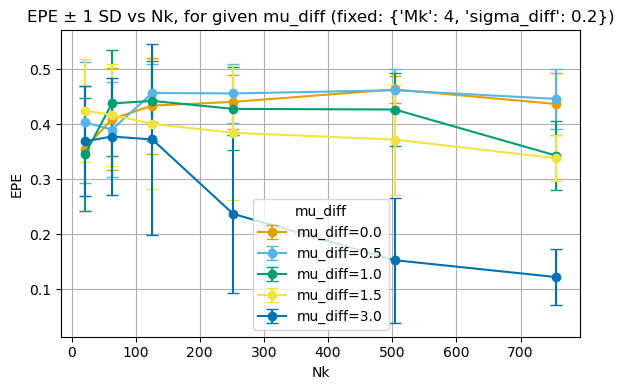

In [62]:
df_epe2 = pd.read_csv("df_epe2.csv", index_col=0)
plot_epe(df_epe2, data_grid2, param="Nk", param2="mu_diff", fixed={"Mk": 4, "sigma_diff": 0.2})

In [322]:
# plot_epe_contours(df_epe2, data_grid2, param="Nk", param2="Mk", 
#                   fixed={'mu_diff': 3.0, 'sigma_diff': 0.3}, threshold=epe_threshold2)

AssertionError: 'Mk' is not a varying parameter

In [ ]:
# convergence: true rSLDS, synthetic fundamental data

model_params3 = dict(n_regimes=2, dim_latent=1, single_subspace=True)

data_grid3 = dict(
    dt_grid         = [1/252],
    mu_diff_EPS_grid = [0.0, 0.2, 0.4],
    mu_PE_grid       = [10.0],
    sigma_EPS_grid   = [0.05],
    sigma_PE_grid    = [0.2],
    sigma_diff_PE_grid  = [0.0, 0.1, 0.2, 0.3],
    theta_PE_grid    = [1.0],
    Mk_grid         = [1, 2, 4, 6, 8],
    Nk_grid         = [21, 63, 126, 252, 504],
)

epe_threshold3=0.1

df_epe3 = compute_epe(
    model_params=model_params3,
    data_grid=data_grid3,
    pipeline_fn=pipeline_true_rSLDS_fundamental_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold3,
    verbose=True
)

In [ ]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    print(df_epe3[df_epe3["threshold_pass"]].loc[:, rep].round(3))
# not enough data? 10x +  cpll = -135841.349  

In [ ]:
plot_epe_contours(df_epe3, data_grid3, param="Nk", param2="Mk", 
                  fixed={"mu_diff_EPS": 1.0, "sigma_diff_PE": 0.2}, threshold=epe_threshold3)

In [ ]:
# convergence: trained rSLDS, synthetic fundamental data

model_params4 = dict(n_regimes=2, dim_latent=1, single_subspace=True)

data_grid4 = dict(
    dt_grid         = [1/252],
    mu_diff_EPS_grid = [0.0, 0.2, 0.4, 0.6, 1.0, 2.0, 3.0],
    mu_PE_grid       = [10.0],
    sigma_EPS_grid   = [0.05],
    sigma_PE_grid    = [0.2],
    sigma_diff_PE_grid  = [0.0, 0.1, 0.2, 0.3],
    theta_PE_grid    = [1.0],
    Mk_grid         = [1, 2, 4, 6, 8],
    Nk_grid         = [21, 63, 126, 252],
)
epe_threshold4=0.25

df_epe4 = compute_epe(
    model_params=model_params4,
    data_grid=data_grid4,
    pipeline_fn=pipeline_trained_rSLDS_fundamental_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold4,
    verbose=True
)

In [ ]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    print(df_epe4[df_epe4["threshold_pass"]].loc[:, rep].round(3))

In [ ]:
plot_epe_contours(df_epe4, data_grid4, param="Nk", param2="Mk", 
                  fixed={"mu_diff_EPS": 1.0, "sigma_diff_PE": 0.2}, threshold=epe_threshold4)

In [51]:
# convergence: trained rSLDS, synthetic data from mixed processes

model_params5 = dict(n_regimes=3, dim_latent=1, single_subspace=True)   ### SET REGIME ###

data_grid5 = dict(
    dt_grid         = [1/252],
    mu_grid         = [0.0, 0.5, 1.0, 1.5, 2.0, 3.0],
    sigma_grid      = [0.0, 0.1, 0.2, 0.3],
    n_regimes_grid  = [2],
    Mk_grid         = [2,3,4],
    Nk_grid         = [21, 63, 126, 252, 504],
)

epe_threshold5=0.20

df_epe5 = compute_epe(
    model_params=model_params5,
    data_grid=data_grid5,
    pipeline_fn=pipeline_train_rSLDS_mixed_process_adapter,
    B=10,
    seed=123,
    epe_threshold=epe_threshold5,
    verbose=True
)

# improvements: run all 4, increase datasize


1/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 21)



ELBO: 107.8: 100%|██████████| 50/50 [00:01<00:00, 34.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 109.7: 100%|██████████| 50/50 [00:01<00:00, 34.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 100.6: 100%|██████████| 50/50 [00:01<00:00, 34.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0098]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-4.4653]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0075]    [-0.0066]    [-0.0068]    

r  (K,) = (3,)
[ 0.0371 -0.0237 -0.0134]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

ELBO: 118.5: 100%|██████████| 50/50 [00:00<00:00, 74.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



2/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0022]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-4.4653]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0110]    [-0.0100]    [-0.0108]    

r  (K,) = (3,)
[ 0.0013 -0.0020  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):    

ELBO: 479.2:  92%|█████████▏| 46/50 [00:02<00:00, 18.99it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 469.1:  96%|█████████▌| 48/50 [00:02<00:00, 19.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 464.2: 100%|██████████| 50/50 [00:02<00:00, 20.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -24732.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0096]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-5.5398]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0006]    [-0.0007]    

r  (K,) = (3,)
[-0.0009 -0.0005  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 467.0: 100%|██████████| 50/50 [00:01<00:00, 48.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



3/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0128]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-5.5398]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0024]    [-0.0014]    [ 0.0008]    

r  (K,) = (3,)
[-0.0010  0.0011 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):   

ELBO: 1123.6: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1109.7: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1121.3: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1111.6:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0031]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.2263]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0046]    [-0.0009]    [-0.0009]    

r  (K,) = (3,)
[-0.0008  0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.167
Accuracy:                         0.833
Adjusted Rand Index (ARI):        0.443
Precision (macro):                0.875
Recall (macro):                   0.833
F1 score (macro):                 0.854
Confusion Matrix :
[[252   0]
 [ 84 168]]

ELBO: 1078.0: 100%|██████████| 50/50 [00:01<00:00, 36.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



4/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.2263]    

As  (K, D, D) = (3, 1, 1)
[ 0.9492]    [ 0.9492]    [ 0.9492]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0067]    [ 0.0024]    [ 0.0105]    

r  (K,) = (3,)
[ 0.0001 -0.0014  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.586
Recall (macro):                   0.583
F1 score (macro):   

ELBO: 2583.6: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0159]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.9160]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0115]    [ 0.0058]    [ 0.0022]    

r  (K,) = (3,)
[ 0.0024 -0.0016 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.320
Accuracy:                         0.680
Adjusted Rand Index (ARI):        0.128
Precision (macro):                0.706
Recall (macro):                   0.680
F1 score (macro):                 0.693
Confusion Matrix :
[[252 252]
 [ 71 433]]

ELBO: 2589.2: 100%|██████████| 50/50 [00:02<00:00, 24.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



5/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0067]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.9156]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0139]    [ 0.0018]    [ 0.0001]    

r  (K,) = (3,)
[ 0.0014 -0.0006 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.507
Recall (macro):                   0.507
F1 score (macro):  

ELBO: 5742.9: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -221935.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0025]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.6065]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0024]    [ 0.0077]    [ 0.0091]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.242
Accuracy:                         0.758
Adjusted Rand Index (ARI):        0.267
Precision (macro):                0.835
Recall (macro):                   0.758
F1 score (macro):                 0.795
Confusion Matrix :
[[1006    2]
 [ 485  5

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 5825.2: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



6/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.6065]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0033]    [-0.0032]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.507
Recall (macro):                   0.507
F1 score (macro):  

ELBO: 9322.6: 100%|██████████| 50/50 [00:12<00:00,  3.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -309177.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0111]    

As  (K, D, D) = (3, 1, 1)
[ 0.9497]    [ 0.9497]    [ 0.9497]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [-0.0006]    [ 0.0108]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.458
Accuracy:                         0.542
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.543
Recall (macro):                   0.542
F1 score (macro):                 0.542
Confusion Matrix :
[[756 756]
 [628 884]]

ELBO: -302341.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0018]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0111]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0108]    [-0.0104]    [-0.0260]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.541
Recall (macro):                   0.540
F1 score (macro):                 0.540
Confusion Matrix :
[[756 756]
 [634 878]]

ELBO: 9324.0: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 189.1:   0%|          | 0/50 [00:00<?, ?it/s]   


7/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0110]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [ 0.0138]    [-0.0215]    

r  (K,) = (3,)
[ 0.0000  0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.461
Accuracy:                         0.539
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.540
Recall (macro):                   0.539
F1 score (macro):    

ELBO: 186.8: 100%|██████████| 50/50 [00:00<00:00, 50.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 197.4: 100%|██████████| 50/50 [00:01<00:00, 47.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 198.4:  88%|████████▊ | 44/50 [00:01<00:00, 40.86it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encounte


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0061]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-4.8589]    

As  (K, D, D) = (3, 1, 1)
[ 0.9497]    [ 0.9497]    [ 0.9497]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [-0.0032]    [-0.0032]    

r  (K,) = (3,)
[-0.0097  0.0036  0.0062]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 63]
 [ 0 63]]

Re

ELBO: 190.5:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 180.8:  90%|█████████ | 45/50 [00:00<00:00, 79.52it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 186.1: 100%|██████████| 50/50 [00:00<00:00, 71.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in sc


8/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0082]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-4.8589]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0021]    [ 0.0026]    [ 0.0030]    

r  (K,) = (3,)
[-0.0104  0.0000  0.0104]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):    

ELBO: 775.6: 100%|██████████| 50/50 [00:02<00:00, 21.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 782.9: 100%|██████████| 50/50 [00:02<00:00, 21.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 770.6:   4%|▍         | 2/50 [00:00<00:02, 19.82it


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.9407]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0018]    [-0.0053]    [-0.0039]    

r  (K,) = (3,)
[ 0.0009 -0.0008 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.541
Recall (macro):                   0.534
F1 score (macro):                 0.538
Confusion Matrix :
[[ 63 126]
 [ 50 139]]

ELBO: 764.7: 100%|██████████| 50/50 [00:01<00:00, 43.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



9/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0051]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.9409]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0062]    [ 0.0066]    [ 0.0033]    

r  (K,) = (3,)
[ 0.0004  0.0005 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.251
Accuracy:                         0.749
Adjusted Rand Index (ARI):        0.246
Precision (macro):                0.833
Recall (macro):                   0.749
F1 score (macro):   

ELBO: 1821.4: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0018]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.6292]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0035]    [-0.0061]    [ 0.0009]    

r  (K,) = (3,)
[-0.0001 -0.0007  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.012
Accuracy:                         0.988
Adjusted Rand Index (ARI):        0.953
Precision (macro):                0.988
Recall (macro):                   0.988
F1 score (macro):                 0.988
Confusion Matrix :
[[369   9]
 [  0 378]]

ELBO: -75113.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1837.8: 100%|██████████| 50/50 [00:01<00:00, 27.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



10/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0024]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.6293]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [ 0.0002]    [ 0.0052]    

r  (K,) = (3,)
[-0.0015 -0.0009  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.212
Accuracy:                         0.788
Adjusted Rand Index (ARI):        0.332
Precision (macro):                0.851
Recall (macro):                   0.788
F1 score (macro):  

ELBO: 4097.3:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4108.8: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyker


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0132]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.3198]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [-0.0100]    [-0.0054]    

r  (K,) = (3,)
[-0.0001  0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.647
Recall (macro):                   0.647
F1 score (macro):                 0.647
Confusion Matrix :
[[500 256]
 [278 478]]

ELBO: 4140.1: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



11/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.3196]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0102]    [ 0.0187]    [-0.0024]    

r  (K,) = (3,)
[-0.0002 -0.0012  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.389
Accuracy:                         0.611
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.612
Recall (macro):                   0.611
F1 score (macro):  

ELBO: 9283.3: 100%|██████████| 50/50 [00:12<00:00,  4.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/f


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0110]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0064]    [-0.0070]    [ 0.0137]    

r  (K,) = (3,)
[ 0.0001  0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.457
Accuracy:                         0.543
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.546
Recall (macro):                   0.543
F1 score (macro):                 0.544
Confusion Matrix :
[[1006  506]
 [ 876  6

ELBO: -289860.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 9307.7:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0110]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0026]    [-0.0036]    [ 0.0174]    

r  (K,) = (3,)
[ 0.0001  0.0002 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.457
Accuracy:                         0.543
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.546
Recall (macro):                   0.543
F1 score (macro):                 0.545
Confusion Matrix :
[[1006  506]
 [ 875  6

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9272.1: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



12/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0111]    

As  (K, D, D) = (3, 1, 1)
[ 0.9497]    [ 0.9497]    [ 0.9497]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0153]    [-0.0039]    [ 0.0057]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.543
Recall (macro):                   0.540
F1 score (macro):  

ELBO: 14891.8: 100%|██████████| 50/50 [00:17<00:00,  2.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -448071.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.4159]    

As  (K, D, D) = (3, 1, 1)
[ 0.9503]    [ 0.9503]    [ 0.9503]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0108]    [ 0.0021]    [ 0.0060]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.340
Accuracy:                         0.660
Adjusted Rand Index (ARI):        0.103
Precision (macro):                0.798
Recall (macro):                   0.660
F1 score (macro):                 0.723
Confusion Matrix :
[[2268    0]
 [1541  7

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -461405.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.4159]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [-0.0074]    [ 0.0008]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.340
Accuracy:                         0.660
Adjusted Rand Index (ARI):        0.103
Precision (macro):                0.798
Recall (macro):                   0.660
F1 score (macro):                 0.723
Confusion Matrix :
[[2268    0]
 [1541  7

ELBO: 14897.7: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 264.0:   0%|          | 0/50 [00:00<?, ?it/s]/s]


13/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4160]    

As  (K, D, D) = (3, 1, 1)
[ 0.9501]    [ 0.9501]    [ 0.9501]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0109]    [-0.0053]    [ 0.0050]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.339
Accuracy:                         0.661
Adjusted Rand Index (ARI):        0.103
Precision (macro):                0.798
Recall (macro):                   0.661
F1 score (macro):   

ELBO: 273.4:  80%|████████  | 40/50 [00:00<00:00, 59.57it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 273.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0026]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.1405]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0073]    [ 0.0076]    [ 0.0057]    

r  (K,) = (3,)
[ 0.0006  0.0012 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[84  0]
 [83  1]]

Re

ELBO: 288.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 277.9:  12%|█▏        | 6/50 [00:00<00:00, 56.12it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 281.3: 100%|██████████| 50/50 [00:00<00:00, 66.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



14/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0026]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-5.1405]    

As  (K, D, D) = (3, 1, 1)
[ 0.9496]    [ 0.9496]    [ 0.9496]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0047]    [ 0.0036]    [ 0.0028]    

r  (K,) = (3,)
[ 0.0042 -0.0005 -0.0037]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):   

ELBO: 1104.2: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1100.3: 100%|██████████| 50/50 [00:02<00:00, 17.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0064]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.2262]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0092]    [-0.0042]    [ 0.0106]    

r  (K,) = (3,)
[-0.0016 -0.0006  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.169
Accuracy:                         0.831
Adjusted Rand Index (ARI):        0.438
Precision (macro):                0.874
Recall (macro):                   0.831
F1 score (macro):                 0.852
Confusion Matrix :
[[167  85]
 [  0 252]]

ELBO: 1130.1: 100%|██████████| 50/50 [00:01<00:00, 40.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



15/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0142]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.2262]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [-0.0064]    [ 0.0022]    

r  (K,) = (3,)
[ 0.0005 -0.0015  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.371
Accuracy:                         0.629
Adjusted Rand Index (ARI):        0.066
Precision (macro):                0.787
Recall (macro):                   0.629
F1 score (macro):  

ELBO: 2526.0: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2557.2: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -104461.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.9156]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0001]    [-0.0025]    [-0.0100]    

r  (K,) = (3,)
[-0.0006 -0.0003  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.202
Accuracy:                         0.798
Adjusted Rand Index (ARI):        0.354
Precision (macro):                0.805
Recall (macro):                   0.798
F1 score (macro):                 0.801
Confusion Matrix :
[[362 142]
 [ 62 442]]

ELBO: 2543.7:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2604.2: 100%|██████████| 50/50 [00:02<00:00, 23.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -195161.6:   0%|          | 0/50 [00:00<?, ?it/s]


16/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.9156]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0195]    [-0.0117]    [-0.0093]    

r  (K,) = (3,)
[ 0.0014 -0.0004 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.018
Accuracy:                         0.982
Adjusted Rand Index (ARI):        0.930
Precision (macro):                0.983
Recall (macro):                   0.982
F1 score (macro):  

ELBO: 5847.7: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divi


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.6065]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0118]    [ 0.0038]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0006 -0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.374
Accuracy:                         0.626
Adjusted Rand Index (ARI):        0.063
Precision (macro):                0.634
Recall (macro):                   0.626
F1 score (macro):                 0.630
Confusion Matrix :
[[756 252]
 [502 506]]

ELBO: 5805.6: 100%|██████████| 50/50 [00:02<00:00, 22.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



17/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.6065]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0031]    [-0.0244]    [-0.0006]    

r  (K,) = (3,)
[ 0.0002 -0.0006  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.242
Accuracy:                         0.758
Adjusted Rand Index (ARI):        0.266
Precision (macro):                0.830
Recall (macro):                   0.758
F1 score (macro):  

ELBO: 12957.5: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0020]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.2983]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0020]    [-0.0086]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.450
Accuracy:                         0.550
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.559
Recall (macro):                   0.550
F1 score (macro):                 0.554
Confusion Matrix :
[[1509  507]
 [1309  7

ELBO: -398864.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 13098.2: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: Run


18/432  combo = (0.003968253968253968, 0.0, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.2983]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0114]    [-0.0238]    [-0.0080]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.326
Accuracy:                         0.674
Adjusted Rand Index (ARI):        0.120
Precision (macro):                0.800
Recall (macro):                   0.674
F1 score (macro):  

ELBO: 20768.3: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 20734.7: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.7033]    

As  (K, D, D) = (3, 1, 1)
[ 0.9501]    [ 0.9501]    [ 0.9501]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0074]    [-0.0019]    [-0.0030]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.509
Recall (macro):                   0.507
F1 score (macro):                 0.508
Confusion Matrix :
[[2266  758]
 [2225  7

ELBO: -605826.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20676.5:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 20771.4:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0022]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.7033]    

As  (K, D, D) = (3, 1, 1)
[ 0.9501]    [ 0.9501]    [ 0.9501]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0092]    [-0.0303]    [-0.0215]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.369
Accuracy:                         0.631
Adjusted Rand Index (ARI):        0.068
Precision (macro):                0.786
Recall (macro):                   0.631
F1 score (macro):                 0.700
Confusion Matrix :
[[3021    3]
 [2230  7

ELBO: 20701.1:   8%|▊         | 4/50 [00:00<00:07,  6.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 20741.6: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 97.0:   0%|          | 0/50 [00:00<?, ?it/s]    


19/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0018]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.7033]    

As  (K, D, D) = (3, 1, 1)
[ 0.9498]    [ 0.9498]    [ 0.9498]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [-0.0032]    [-0.0092]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.508
Recall (macro):                   0.506
F1 score (macro):   

ELBO: 102.0: 100%|██████████| 50/50 [00:00<00:00, 98.27it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 108.9:  26%|██▌       | 13/50 [00:00<00:00, 125.85it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0044]    

inv_etas  (K, N) = (1, 1)
[-4.4624]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0022]    [ 0.0017]    [ 0.0015]    

r  (K,) = (3,)
[-0.0090  0.0024  0.0065]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Re

ELBO: -26084.2:   0%|          | 0/50 [00:00<?, ?it/s]


20/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1190]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-4.4609]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0079]    [ 0.0080]    [ 0.0086]    

r  (K,) = (3,)
[-0.0007 -0.0004  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):   

ELBO: 469.9: 100%|██████████| 50/50 [00:00<00:00, 70.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 459.8: 100%|██████████| 50/50 [00:00<00:00, 69.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -30661.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0056]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-5.5296]    

As  (K, D, D) = (3, 1, 1)
[ 0.9471]    [ 0.9471]    [ 0.9471]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0001]    [ 0.0027]    [ 0.0036]    

r  (K,) = (3,)
[-0.0033  0.0010  0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 468.0: 100%|██████████| 50/50 [00:00<00:00, 95.42it/s] 



21/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-5.5310]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0018]    [ 0.0034]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0024 -0.0004 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.041
Precision (macro):                0.761
Recall (macro):                   0.603
F1 score (macro):  

ELBO: 1087.7: 100%|██████████| 50/50 [00:01<00:00, 41.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1102.1: 100%|██████████| 50/50 [00:01<00:00, 39.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1106.0:  10%|█         | 5/50 [00:00<00:01, 43.33it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.2060]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0020]    [-0.0030]    [ 0.0060]    

r  (K,) = (3,)
[-0.0000  0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[252   0]
 [250   2]]

ELBO: 1099.1: 100%|██████████| 50/50 [00:00<00:00, 58.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



22/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0056]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.2070]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0063]    [-0.0012]    [-0.0033]    

r  (K,) = (3,)
[-0.0006  0.0005  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 2546.9: 100%|██████████| 50/50 [00:02<00:00, 24.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2505.9: 100%|██████████| 50/50 [00:02<00:00, 23.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2531.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -91337.7:   0%|          | 0/50 [00:00<?, ?it/s]4it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0041]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.8736]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0101]    [-0.0037]    [-0.0076]    

r  (K,) = (3,)
[-0.0005  0.0006 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.501
F1 score (macro):                 0.539
Confusion Matrix :
[[503   1]
 [502   2]

ELBO: 2536.5: 100%|██████████| 50/50 [00:01<00:00, 37.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



23/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.8752]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0082]    [-0.0009]    [ 0.0014]    

r  (K,) = (3,)
[ 0.0004 -0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.443
Accuracy:                         0.557
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.757
Recall (macro):                   0.557
F1 score (macro):  

ELBO: 5558.0: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -198525.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0008]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5295]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0044]    [-0.0083]    [-0.0053]    

r  (K,) = (3,)
[ 0.0007 -0.0005 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.711
Recall (macro):                   0.510
F1 score (macro):                 0.594
Confusion Matrix :
[[  22  986]
 [   2 10

ELBO: 5668.9: 100%|██████████| 50/50 [00:02<00:00, 21.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



24/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5280]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [ 0.0121]    [-0.0049]    

r  (K,) = (3,)
[ 0.0003 -0.0006  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):  

ELBO: 9028.8: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/f


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9007]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0050]    [-0.0092]    [-0.0064]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.740
Recall (macro):                   0.512
F1 score (macro):                 0.605
Confusion Matrix :
[[  38 1474]
 [   1 15

ELBO: -299518.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 9021.3: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:


25/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.8998]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0013]    [ 0.0003]    [-0.0111]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.491
Accuracy:                         0.509
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.510
Recall (macro):                   0.509
F1 score (macro):   

ELBO: 188.9:  18%|█▊        | 9/50 [00:00<00:00, 89.09it/s]]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0201]    

ds  (K, N) = (1, 1)
[-0.0046]    

inv_etas  (K, N) = (1, 1)
[-4.8543]    

As  (K, D, D) = (3, 1, 1)
[ 0.9494]    [ 0.9494]    [ 0.9494]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0105]    [-0.0088]    [-0.0096]    

r  (K,) = (3,)
[-0.0044  0.0045 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[63  0]
 [62  1]]

Re

ELBO: 204.2: 100%|██████████| 50/50 [00:00<00:00, 124.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 769.8:   0%|          | 0/50 [00:00<?, ?it/s]   


26/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0292]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-4.8536]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0111]    [-0.0108]    [-0.0095]    

r  (K,) = (3,)
[ 0.0016  0.0010 -0.0026]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.618
Recall (macro):                   0.587
F1 score (macro):   

ELBO: 766.5:  90%|█████████ | 45/50 [00:01<00:00, 48.69it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 759.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 771.5:   0%|          | 0/50 [00:00<?, ?it/s].05it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0012]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.9234]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0055]    [-0.0056]    [-0.0090]    

r  (K,) = (3,)
[-0.0012 -0.0010  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.503
F1 score (macro):                 0.540
Confusion Matrix :
[[  2 187]
 [  1 188]

ELBO: 772.2: 100%|██████████| 50/50 [00:00<00:00, 76.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



27/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0099]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.9244]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0101]    [-0.0130]    [-0.0079]    

r  (K,) = (3,)
[-0.0002  0.0020 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro):  

ELBO: 1762.5: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1797.3: 100%|██████████| 50/50 [00:01<00:00, 30.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1742.6: 100%|██████████| 50/50 [00:01<00:00, 29.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1792.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0181]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.6011]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0095]    [ 0.0115]    [ 0.0060]    

r  (K,) = (3,)
[ 0.0001  0.0006 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.680
Recall (macro):                   0.507
F1 score (macro):                 0.581
Confusion Matrix :
[[377   1]
 [372   6]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1789.3: 100%|██████████| 50/50 [00:01<00:00, 43.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



28/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0018]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.6036]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0135]    [-0.0077]    [-0.0049]    

r  (K,) = (3,)
[-0.0018  0.0004  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):  

ELBO: 4067.7: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.2625]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0109]    [ 0.0028]    [ 0.0036]    

r  (K,) = (3,)
[-0.0008  0.0004  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.650
Recall (macro):                   0.502
F1 score (macro):                 0.567
Confusion Matrix :
[[  4 752]
 [  1 755]]

ELBO: -151450.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4058.9: 100%|██████████| 50/50 [00:01<00:00, 27.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -302157.4:   0%|          | 0/50 [00:00<?, ?it/s]


29/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0073]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.2615]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0046]    [ 0.0046]    [ 0.0094]    

r  (K,) = (3,)
[-0.0002  0.0000  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.342
Accuracy:                         0.658
Adjusted Rand Index (ARI):        0.099
Precision (macro):                0.689
Recall (macro):                   0.658
F1 score (macro):  

ELBO: 8965.0: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8952.2: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1512


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0054]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9005]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [-0.0012]    [-0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.449
Accuracy:                         0.551
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.551
Recall (macro):                   0.551
F1 score (macro):                 0.551
Confusion Matrix :
[[884 628]
 [730 782]]

ELBO: 9000.9: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



30/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.8976]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [-0.0107]    [ 0.0068]    

r  (K,) = (3,)
[-0.0001  0.0007 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.583
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 14139.2: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14221.1: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0030]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.2521]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [ 0.0021]    [ 0.0071]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.529
Recall (macro):                   0.529
F1 score (macro):                 0.529
Confusion Matrix :
[[1237 1031]
 [1105 11

ELBO: 14158.2: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



31/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.2500]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0005]    [-0.0089]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.548
Recall (macro):                   0.548
F1 score (macro):   

ELBO: 277.8:  16%|█▌        | 8/50 [00:00<00:00, 73.95it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0046]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.1343]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [ 0.0064]    [ 0.0058]    

r  (K,) = (3,)
[ 0.0013 -0.0004 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.597
Recall (macro):                   0.560
F1 score (macro):                 0.577
Confusion Matrix :
[[21 63]
 [11 73]]

Re

ELBO: 285.0: 100%|██████████| 50/50 [00:00<00:00, 96.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



32/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0224]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-5.1332]    

As  (K, D, D) = (3, 1, 1)
[ 0.9492]    [ 0.9492]    [ 0.9492]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0089]    [ 0.0056]    [ 0.0098]    

r  (K,) = (3,)
[-0.0036  0.0110 -0.0074]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro):   

ELBO: 1100.2: 100%|██████████| 50/50 [00:01<00:00, 41.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1095.8:  90%|█████████ | 45/50 [00:01<00:00, 41.91it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 1096.0: 100%|██████████| 50/50 [00:01<00:00, 41.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/va


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0019]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.2064]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [ 0.0031]    [ 0.0059]    

r  (K,) = (3,)
[ 0.0003  0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.704
Recall (macro):                   0.516
F1 score (macro):                 0.595
Confusion Matrix :
[[  9 243]
 [  1 251]]

ELBO: 1090.2: 100%|██████████| 50/50 [00:00<00:00, 62.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



33/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.2086]    

As  (K, D, D) = (3, 1, 1)
[ 0.9496]    [ 0.9496]    [ 0.9496]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [ 0.0032]    [-0.0009]    

r  (K,) = (3,)
[-0.0008  0.0009 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 2519.4: 100%|██████████| 50/50 [00:02<00:00, 22.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -100610.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2528.4:   0%|          | 0/50 [00:00<?, ?it/s]  2it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.8755]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0022]    [-0.0036]    [ 0.0098]    

r  (K,) = (3,)
[-0.0006 -0.0009  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.717
Recall (macro):                   0.512
F1 score (macro):                 0.597
Confusion Matrix :
[[ 13 491]
 [  1 503]]

ELBO: 2563.7: 100%|██████████| 50/50 [00:01<00:00, 38.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -213404.0:   0%|          | 0/50 [00:00<?, ?it/s]


34/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.8775]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [-0.0125]    [-0.0093]    

r  (K,) = (3,)
[-0.0002  0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.625
Recall (macro):                   0.502
F1 score (macro):  

ELBO: 5680.6: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/fo


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0070]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.5372]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [-0.0155]    [ 0.0056]    

r  (K,) = (3,)
[-0.0004  0.0014 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.608
Recall (macro):                   0.504
F1 score (macro):                 0.552
Confusion Matrix :
[[1002    6]
 [ 993   

ELBO: -195461.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5718.3: 100%|██████████| 50/50 [00:02<00:00, 21.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



35/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0000]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5328]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [ 0.0092]    [-0.0062]    

r  (K,) = (3,)
[ 0.0000  0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.550
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 12478.5: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in div


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0007]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.1462]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0129]    [ 0.0030]    [ 0.0133]    

r  (K,) = (3,)
[ 0.0003 -0.0000 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.608
Recall (macro):                   0.512
F1 score (macro):                 0.556
Confusion Matrix :
[[  81 1935]
 [  33 19

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12398.9: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



36/432  combo = (0.003968253968253968, 0.0, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0005]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.1497]    

As  (K, D, D) = (3, 1, 1)
[ 0.9494]    [ 0.9494]    [ 0.9494]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0022]    [-0.0095]    [ 0.0159]    

r  (K,) = (3,)
[-0.0003 -0.0008  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.732
Recall (macro):                   0.506
F1 score (macro):  

ELBO: 19443.2: 100%|██████████| 50/50 [00:10<00:00,  4.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -610470.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0000]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4916]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [-0.0073]    [ 0.0068]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.527
Recall (macro):                   0.512
F1 score (macro):                 0.520
Confusion Matrix :
[[2662  362]
 [2587  4

ELBO: 19460.9:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 19546.4:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -586431.0:   0%|          | 0/50 [00:00<?, ?it/s]6it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0005]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4855]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [ 0.0016]    [-0.0134]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.462
Accuracy:                         0.538
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.540
Recall (macro):                   0.538
F1 score (macro):                 0.539
Confusion Matrix :
[[1924 1100]
 [1692 13

ELBO: 19430.7: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



37/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4826]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0153]    [-0.0135]    [-0.0046]    

r  (K,) = (3,)
[ 0.0007 -0.0005 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.739
Recall (macro):                   0.506
F1 score (macro):   

ELBO: 106.6:  20%|██        | 10/50 [00:00<00:00, 85.89it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-4.4516]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0054]    [-0.0058]    [-0.0053]    

r  (K,) = (3,)
[-0.0014  0.0042 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.628
Confusion Matrix :
[[ 3 39]
 [ 0 42]]

Re

ELBO: 107.9: 100%|██████████| 50/50 [00:00<00:00, 112.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -21043.0:   0%|          | 0/50 [00:00<?, ?it/s]


38/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0042]    

ds  (K, N) = (1, 1)
[-0.0062]    

inv_etas  (K, N) = (1, 1)
[-4.4526]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0027]    [ 0.0021]    [ 0.0021]    

r  (K,) = (3,)
[-0.0145  0.0072  0.0074]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):   

ELBO: 460.2: 100%|██████████| 50/50 [00:00<00:00, 67.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 451.7: 100%|██████████| 50/50 [00:00<00:00, 64.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: -24959.4:   0%|          | 0/50 [00:00<?, ?it/s]1it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0045]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-5.4997]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [-0.0001]    [ 0.0015]    

r  (K,) = (3,)
[-0.0002 -0.0007  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.059
Precision (macro):                0.785
Recall (macro):                   0.623
F1 score (macro):                 0.695
Confusion Matrix :
[[ 31  95]
 [  0 126]]

ELBO: 440.5: 100%|██████████| 50/50 [00:00<00:00, 75.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1073.0:   0%|          | 0/50 [00:00<?, ?it/s]  


39/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0018]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.5007]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0051]    [ 0.0038]    [ 0.0047]    

r  (K,) = (3,)
[ 0.0009 -0.0011  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.737
Recall (macro):                   0.560
F1 score (macro):  

ELBO: 1081.0: 100%|██████████| 50/50 [00:01<00:00, 39.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1079.3: 100%|██████████| 50/50 [00:01<00:00, 38.04it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0081]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.1571]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [-0.0012]    [-0.0009]    

r  (K,) = (3,)
[-0.0007  0.0003  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1079.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1084.7: 100%|██████████| 50/50 [00:00<00:00, 58.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



40/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0078]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-6.1510]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0115]    [ 0.0142]    [ 0.0106]    

r  (K,) = (3,)
[ 0.0003 -0.0011  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.761
Recall (macro):                   0.583
F1 score (macro):  

ELBO: 2423.4: 100%|██████████| 50/50 [00:02<00:00, 24.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2359.6: 100%|██████████| 50/50 [00:02<00:00, 23.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2403.5: 100%|██████████| 50/50 [00:02<00:00, 23.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.7674]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0014]    [ 0.0008]    [-0.0074]    

r  (K,) = (3,)
[-0.0005 -0.0004  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 503]
 [  1 503]

ELBO: 2411.2: 100%|██████████| 50/50 [00:01<00:00, 37.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



41/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0043]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.7622]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [ 0.0124]    [ 0.0093]    

r  (K,) = (3,)
[ 0.0007 -0.0005 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.479
Accuracy:                         0.521
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.686
Recall (macro):                   0.521
F1 score (macro):  

ELBO: 5302.1: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3307]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0169]    [ 0.0004]    [ 0.0069]    

r  (K,) = (3,)
[-0.0006  0.0005  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.640
Recall (macro):                   0.502
F1 score (macro):                 0.563
Confusion Matrix :
[[   7 1001]
 [   2 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 5314.6: 100%|██████████| 50/50 [00:02<00:00, 21.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



42/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.3335]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [ 0.0013]    [-0.0072]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.509
Recall (macro):                   0.508
F1 score (macro): 

ELBO: 8284.3: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -306115.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0021]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.6236]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [ 0.0095]    [-0.0148]    

r  (K,) = (3,)
[ 0.0000  0.0008 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion Matrix :
[[   9 1503]
 [   0 15

ELBO: -303145.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8248.5: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



43/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0057]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.6129]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0074]    [-0.0033]    [ 0.0146]    

r  (K,) = (3,)
[ 0.0001 -0.0008  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.555
Recall (macro):                   0.504
F1 score (macro):   

ELBO: 202.8:  58%|█████▊    | 29/50 [00:00<00:00, 61.78it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.8429]    

As  (K, D, D) = (3, 1, 1)
[ 0.9496]    [ 0.9496]    [ 0.9496]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0005]    [-0.0011]    

r  (K,) = (3,)
[ 0.0040  0.0080 -0.0120]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[63  0]
 [62  1]]

Re

ELBO: 175.5: 100%|██████████| 50/50 [00:00<00:00, 119.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


44/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0031]    

ds  (K, N) = (1, 1)
[-0.0051]    

inv_etas  (K, N) = (1, 1)
[-4.8316]    

As  (K, D, D) = (3, 1, 1)
[ 0.9451]    [ 0.9451]    [ 0.9451]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0125]    [ 0.0123]    [ 0.0122]    

r  (K,) = (3,)
[ 0.0063 -0.0013 -0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        -0.005
Precision (macro):                0.526
Recall (macro):                   0.524
F1 score (macro):  

ELBO: 772.2: 100%|██████████| 50/50 [00:01<00:00, 44.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 754.1:  12%|█▏        | 6/50 [00:00<00:00, 51.89it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0055]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-5.8856]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0075]    [ 0.0053]    [ 0.0027]    

r  (K,) = (3,)
[-0.0021 -0.0002  0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.503
F1 score (macro):                 0.540
Confusion Matrix :
[[  2 187]
 [  1 188]

ELBO: 723.7: 100%|██████████| 50/50 [00:00<00:00, 72.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



45/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0266]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-5.8796]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [ 0.0089]    [ 0.0034]    

r  (K,) = (3,)
[ 0.0003  0.0003 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        -0.002
Precision (macro):                0.509
Recall (macro):                   0.508
F1 score (macro): 

ELBO: 1708.6: 100%|██████████| 50/50 [00:01<00:00, 31.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1733.2: 100%|██████████| 50/50 [00:01<00:00, 29.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 1719.5:  92%|█████████▏| 46/50 [00:01<00:00, 29.96it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -71230.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarn


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.5119]    

As  (K, D, D) = (3, 1, 1)
[ 0.9451]    [ 0.9451]    [ 0.9451]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0007]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.483
Accuracy:                         0.517
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.592
Recall (macro):                   0.517
F1 score (macro):                 0.552
Confusion Matrix :
[[366  12]
 [353  25]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 1737.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1729.6: 100%|██████████| 50/50 [00:01<00:00, 45.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -154815.8:   0%|          | 0/50 [00:00<?, ?it/s]


46/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.5234]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [-0.0053]    [ 0.0032]    

r  (K,) = (3,)
[ 0.0008  0.0026 -0.0033]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 3809.5: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3860.5:  98%|█████████▊| 49/50 [00:03<00:00, 17.33it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3845.1: 100%|██████████| 50/50 [00:03<00:00, 16.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -139082.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0010]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.0959]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0032]    [ 0.0027]    [-0.0002]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.519
F1 score (macro):                 0.615
Confusion Matrix :
[[ 28 728]
 [  0 756]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3877.9:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 3871.8: 100%|██████████| 50/50 [00:01<00:00, 26.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -304449.2:   0%|          | 0/50 [00:00<?, ?it/s]


47/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.1049]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0034]    [ 0.0144]    [-0.0037]    

r  (K,) = (3,)
[-0.0015  0.0032 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.696
Recall (macro):                   0.505
F1 score (macro):  

ELBO: 8252.4:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8273.8: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -298253.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.6264]    

As  (K, D, D) = (3, 1, 1)
[ 0.9462]    [ 0.9462]    [ 0.9462]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0101]    [ 0.0102]    [-0.0075]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.709
Recall (macro):                   0.503
F1 score (macro):                 0.589
Confusion Matrix :
[[  11 1501]
 [   1 15

ELBO: 8358.6:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -289254.7:   0%|          | 0/50 [00:00<?, ?it/s]it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6155]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0161]    [-0.0043]    [-0.0005]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.469
Accuracy:                         0.531
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.743
Recall (macro):                   0.531
F1 score (macro):                 0.620
Confusion Matrix :
[[  98 1414]
 [   3 15

ELBO: 8335.0: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



48/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.6197]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0065]    [-0.0064]    [-0.0047]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.030
Precision (macro):                0.588
Recall (macro):                   0.587
F1 score (macro):  

ELBO: 12760.2: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -460826.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0101]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.8764]    

As  (K, D, D) = (3, 1, 1)
[ 0.9466]    [ 0.9466]    [ 0.9466]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0235]    [ 0.0049]    [ 0.0040]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.505
Recall (macro):                   0.505
F1 score (macro):                 0.505
Confusion Matrix :
[[1128 1140]
 [1105 1

ELBO: 12774.8:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0058]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.8777]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0021]    [ 0.0068]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[1054 1214]
 [1053 1

ELBO: 12692.0: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



49/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0040]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.8885]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0102]    [ 0.0022]    [-0.0131]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.477
Accuracy:                         0.523
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.523
Recall (macro):                   0.523
F1 score (macro):   

ELBO: 284.1: 100%|██████████| 50/50 [00:00<00:00, 68.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 274.0: 100%|██████████| 50/50 [00:00<00:00, 69.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 265.7:  16%|█▌        | 8/50 [00:00<00:00, 78.53it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.1187]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0053]    [-0.0043]    

r  (K,) = (3,)
[-0.0016 -0.0018  0.0034]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.446
Accuracy:                         0.554
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.719
Recall (macro):                   0.554
F1 score (macro):                 0.625
Confusion Matrix :
[[10 74]
 [ 1 83]]

Re

ELBO: 270.2: 100%|██████████| 50/50 [00:00<00:00, 102.49it/s]



50/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-5.1152]    

As  (K, D, D) = (3, 1, 1)
[ 0.9494]    [ 0.9494]    [ 0.9494]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0061]    [-0.0067]    [-0.0067]    

r  (K,) = (3,)
[ 0.0002 -0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.650
Recall (macro):                   0.583
F1 score (macro):   

ELBO: 1080.5: 100%|██████████| 50/50 [00:01<00:00, 41.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1055.1: 100%|██████████| 50/50 [00:01<00:00, 38.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1087.9:   0%|          | 0/50 [00:00<?, ?it/s].39it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0064]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-6.1489]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0105]    [-0.0055]    [ 0.0002]    

r  (K,) = (3,)
[-0.0020 -0.0001  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[252   0]
 [250   2]]

ELBO: 1084.1: 100%|██████████| 50/50 [00:00<00:00, 55.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2420.1:   0%|          | 0/50 [00:00<?, ?it/s]/s]


51/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0094]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-6.1428]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0060]    [ 0.0022]    [ 0.0008]    

r  (K,) = (3,)
[ 0.0024 -0.0006 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.770
Recall (macro):                   0.603
F1 score (macro):  

ELBO: 2375.3: 100%|██████████| 50/50 [00:02<00:00, 23.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0018]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.7694]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [-0.0001]    [ 0.0017]    

r  (K,) = (3,)
[-0.0005  0.0000  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):                 0.540
Confusion Matrix :
[[502   2]
 [500   4]

ELBO: -106682.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2432.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2416.2: 100%|██████████| 50/50 [00:01<00:00, 35.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



52/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.7743]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0043]    [-0.0040]    [ 0.0091]    

r  (K,) = (3,)
[ 0.0008  0.0007 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.746
Recall (macro):                   0.536
F1 score (macro):  

ELBO: 5247.7: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -197047.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5231.9:   0%|          | 0/50 [00:00<?, ?it/s]   /var/f


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0096]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.3418]    

As  (K, D, D) = (3, 1, 1)
[ 0.9471]    [ 0.9471]    [ 0.9471]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0132]    [ 0.0085]    [-0.0145]    

r  (K,) = (3,)
[-0.0011 -0.0006  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.558
Recall (macro):                   0.501
F1 score (macro):                 0.528
Confusion Matrix :
[[   8 1000]
 [   5 1

ELBO: 5306.2: 100%|██████████| 50/50 [00:02<00:00, 19.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -390809.7:   0%|          | 0/50 [00:00<?, ?it/s]


53/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0024]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3275]    

As  (K, D, D) = (3, 1, 1)
[ 0.9492]    [ 0.9492]    [ 0.9492]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0056]    [ 0.0076]    [-0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.732
Recall (macro):                   0.519
F1 score (macro):  

ELBO: 11241.2: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encounter


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0119]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.7983]    

As  (K, D, D) = (3, 1, 1)
[ 0.9498]    [ 0.9498]    [ 0.9498]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0035]    [-0.0192]    [-0.0104]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.546
Recall (macro):                   0.536
F1 score (macro):                 0.541
Confusion Matrix :
[[1560  456]
 [1416  6

ELBO: -403226.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11186.5: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



54/432  combo = (0.003968253968253968, 0.0, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.7956]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [-0.0177]    [-0.0089]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.520
Recall (macro):                   0.520
F1 score (macro):  

ELBO: 17193.5: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.0275]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0164]    [ 0.0176]    [-0.0099]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.503
Recall (macro):                   0.503
F1 score (macro):                 0.503
Confusion Matrix :
[[2122  902]
 [2105  

ELBO: -606765.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17314.3: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



55/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0046]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.0340]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0066]    [ 0.0085]    [-0.0092]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.477
Accuracy:                         0.523
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.523
Recall (macro):                   0.523
F1 score (macro):   

ELBO: 105.7:  88%|████████▊ | 44/50 [00:00<00:00, 67.63it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0053]    

inv_etas  (K, N) = (1, 1)
[-4.4373]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [-0.0064]    [-0.0060]    

r  (K,) = (3,)
[-0.0023  0.0064 -0.0040]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Re

ELBO: 105.4: 100%|██████████| 50/50 [00:00<00:00, 116.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



56/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0016]    

ds  (K, N) = (1, 1)
[-0.0043]    

inv_etas  (K, N) = (1, 1)
[-4.4369]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0049]    [ 0.0056]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0086 -0.0101  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.393
Accuracy:                         0.607
Adjusted Rand Index (ARI):        0.041
Precision (macro):                0.780
Recall (macro):                   0.607
F1 score (macro):   

ELBO: 451.7:  90%|█████████ | 45/50 [00:00<00:00, 57.91it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 454.8: 100%|██████████| 50/50 [00:00<00:00, 55.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -27882.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.4622]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0018]    [ 0.0004]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0008 -0.0002 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.437
Accuracy:                         0.563
Adjusted Rand Index (ARI):        0.015
Precision (macro):                0.739
Recall (macro):                   0.563
F1 score (macro):                 0.640
Confusion Matrix :
[[ 17 109]
 [  1 125]]

ELBO: 435.6: 100%|██████████| 50/50 [00:00<00:00, 91.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



57/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0323]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-5.4620]    

As  (K, D, D) = (3, 1, 1)
[ 0.9465]    [ 0.9465]    [ 0.9465]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0033]    

r  (K,) = (3,)
[ 0.0001  0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):  

ELBO: 1051.4:  98%|█████████▊| 49/50 [00:01<00:00, 36.32it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1055.6: 100%|██████████| 50/50 [00:01<00:00, 36.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1025.5:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0013]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.0481]    

As  (K, D, D) = (3, 1, 1)
[ 0.9448]    [ 0.9448]    [ 0.9448]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [ 0.0025]    [-0.0008]    

r  (K,) = (3,)
[ 0.0023 -0.0022 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.258
Accuracy:                         0.742
Adjusted Rand Index (ARI):        0.233
Precision (macro):                0.816
Recall (macro):                   0.742
F1 score (macro):                 0.777
Confusion Matrix :
[[126 126]
 [  4 248]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1006.7: 100%|██████████| 50/50 [00:00<00:00, 53.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2243.7:   0%|          | 0/50 [00:00<?, ?it/s]  


58/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-6.0736]    

As  (K, D, D) = (3, 1, 1)
[ 0.9471]    [ 0.9471]    [ 0.9471]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0137]    [-0.0058]    [-0.0102]    

r  (K,) = (3,)
[-0.0050  0.0054 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro): 

ELBO: 2266.5: 100%|██████████| 50/50 [00:02<00:00, 23.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: 2259.1: 100%|██████████| 50/50 [00:02<00:00, 23.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 2243.5: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4j


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.6015]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0122]    [-0.0026]    [ 0.0047]    

r  (K,) = (3,)
[-0.0028  0.0002  0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion Matrix :
[[  3 501]
 [  0 504]]

ELBO: 2300.3: 100%|██████████| 50/50 [00:01<00:00, 36.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



59/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0003]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.5965]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0041]    [ 0.0098]    [ 0.0170]    

r  (K,) = (3,)
[-0.0022  0.0004  0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.550
Recall (macro):                   0.501
F1 score (macro): 

ELBO: 4836.3: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divid


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0043]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.0632]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0066]    [-0.0012]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.539
Recall (macro):                   0.510
F1 score (macro):                 0.524
Confusion Matrix :
[[945  63]
 [924  84]]

ELBO: 4822.9: 100%|██████████| 50/50 [00:02<00:00, 20.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


60/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.0848]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0136]    [-0.0076]    [-0.0118]    

r  (K,) = (3,)
[ 0.0011 -0.0004 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.510
F1 score (macro):  

ELBO: 7376.3: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0027]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2913]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0115]    [-0.0042]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.461
Accuracy:                         0.539
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.556
Recall (macro):                   0.539
F1 score (macro):                 0.547
Confusion Matrix :
[[1238  274]
 [1121  3

ELBO: 7490.5: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



61/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0045]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2772]    

As  (K, D, D) = (3, 1, 1)
[ 0.9444]    [ 0.9444]    [ 0.9444]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0115]    [-0.0065]    [ 0.0090]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.503
Recall (macro):                   0.503
F1 score (macro):  

ELBO: 195.0: 100%|██████████| 50/50 [00:00<00:00, 95.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 171.5: 100%|██████████| 50/50 [00:00<00:00, 90.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 196.7:  24%|██▍       | 12/50 [00:00<00:00, 114.52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0166]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-4.8156]    

As  (K, D, D) = (3, 1, 1)
[ 0.9463]    [ 0.9463]    [ 0.9463]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0056]    [-0.0055]    

r  (K,) = (3,)
[ 0.0004 -0.0004 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.373
Accuracy:                         0.627
Adjusted Rand Index (ARI):        0.057
Precision (macro):                0.628
Recall (macro):                   0.627
F1 score (macro):                 0.627
Confusion Matrix :
[[37 26]
 [21 42]]

Re

ELBO: 187.7: 100%|██████████| 50/50 [00:00<00:00, 108.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



62/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0185]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-4.8225]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0070]    [ 0.0054]    [ 0.0068]    

r  (K,) = (3,)
[ 0.0025 -0.0042  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.381
Accuracy:                         0.619
Adjusted Rand Index (ARI):        0.052
Precision (macro):                0.677
Recall (macro):                   0.619
F1 score (macro):   

ELBO: 747.1: 100%|██████████| 50/50 [00:01<00:00, 45.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 736.5:  10%|█         | 5/50 [00:00<00:00, 45.32it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0010]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-5.8068]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [ 0.0053]    [ 0.0053]    

r  (K,) = (3,)
[-0.0010  0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 188]
 [  1 188]

ELBO: 747.4: 100%|██████████| 50/50 [00:00<00:00, 63.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -68528.6:   0%|          | 0/50 [00:00<?, ?it/s]


63/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0434]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.8104]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0060]    [ 0.0085]    [ 0.0109]    

r  (K,) = (3,)
[-0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.575
Recall (macro):                   0.540
F1 score (macro):  

ELBO: 1660.4:  92%|█████████▏| 46/50 [00:01<00:00, 26.68it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1641.3: 100%|██████████| 50/50 [00:01<00:00, 26.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -76446.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0077]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.3936]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0153]    [ 0.0042]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0016 -0.0008 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.491
Accuracy:                         0.509
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.661
Recall (macro):                   0.509
F1 score (macro):                 0.575
Confusion Matrix :
[[  9 369]
 [  2 376]]

ELBO: 1635.1: 100%|██████████| 50/50 [00:01<00:00, 41.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3589.5:   0%|          | 0/50 [00:00<?, ?it/s]   


64/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0139]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.3966]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0024]    [ 0.0062]    [ 0.0117]    

r  (K,) = (3,)
[ 0.0008  0.0001 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.718
Recall (macro):                   0.516
F1 score (macro):  

ELBO: 3502.5: 100%|██████████| 50/50 [00:03<00:00, 16.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3522.8:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 3624.7:   6%|▌         | 3/50 [00:00<00:02, 21.82it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0135]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.9134]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [-0.0158]    [ 0.0047]    

r  (K,) = (3,)
[-0.0001 -0.0020  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.755
Recall (macro):                   0.520
F1 score (macro):                 0.616
Confusion Matrix :
[[ 30 726]
 [  0 756]]

ELBO: 3547.9: 100%|██████████| 50/50 [00:01<00:00, 25.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -292087.2:   0%|          | 0/50 [00:00<?, ?it/s]


65/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.9146]    

As  (K, D, D) = (3, 1, 1)
[ 0.9460]    [ 0.9460]    [ 0.9460]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0063]    [ 0.0027]    [-0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.729
Recall (macro):                   0.513
F1 score (macro):  

ELBO: 7406.3: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7432.2: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0147]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2734]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0072]    [-0.0122]    [-0.0116]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.513
Recall (macro):                   0.513
F1 score (macro):                 0.513
Confusion Matrix :
[[831 681]
 [792 720]]

ELBO: 7454.3:  98%|█████████▊| 49/50 [00:03<00:00, 14.19it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 7463.8: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


66/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0088]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2613]    

As  (K, D, D) = (3, 1, 1)
[ 0.9428]    [ 0.9428]    [ 0.9428]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0106]    [-0.0258]    [ 0.0025]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.485
Accuracy:                         0.515
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.553
Recall (macro):                   0.515
F1 score (macro):  

ELBO: 11383.7: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0066]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.4793]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [-0.0046]    [ 0.0082]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.501
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[1557  711]
 [1555  

ELBO: 11342.7: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



67/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0044]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4733]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0088]    [-0.0116]    [-0.0225]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.444
Accuracy:                         0.556
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.557
Recall (macro):                   0.556
F1 score (macro):   

ELBO: 269.3: 100%|██████████| 50/50 [00:00<00:00, 72.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 267.1:  14%|█▍        | 7/50 [00:00<00:00, 62.98it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0048]    

inv_etas  (K, N) = (1, 1)
[-5.0836]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0044]    [ 0.0051]    [ 0.0047]    

r  (K,) = (3,)
[-0.0060  0.0066 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.585
Recall (macro):                   0.506
F1 score (macro):                 0.543
Confusion Matrix :
[[ 2 82]
 [ 1 83]]

R

ELBO: 268.1: 100%|██████████| 50/50 [00:00<00:00, 91.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1004.6:   0%|          | 0/50 [00:00<?, ?it/s]  


68/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0528]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.0932]    

As  (K, D, D) = (3, 1, 1)
[ 0.9407]    [ 0.9407]    [ 0.9407]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0007]    [ 0.0009]    [ 0.0037]    

r  (K,) = (3,)
[-0.0001 -0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):   

ELBO: 1006.7: 100%|██████████| 50/50 [00:01<00:00, 38.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1015.5: 100%|██████████| 50/50 [00:01<00:00, 37.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1019.4: 100%|██████████| 50/50 [00:01<00:00, 36.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0113]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.0582]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0105]    [-0.0034]    [-0.0090]    

r  (K,) = (3,)
[-0.0017  0.0025 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

ELBO: 1008.4: 100%|██████████| 50/50 [00:00<00:00, 52.59it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



69/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0018]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.0450]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0095]    [ 0.0031]    [ 0.0057]    

r  (K,) = (3,)
[-0.0011  0.0010  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.626
Recall (macro):                   0.504
F1 score (macro):  

ELBO: 2255.3:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2257.9:  96%|█████████▌| 48/50 [00:02<00:00, 21.40it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2279.5:   6%|▌         | 3/50 [00:00<00:01, 26.40it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0028]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.6030]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0076]    [ 0.0079]    [ 0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.390
Accuracy:                         0.610
Adjusted Rand Index (ARI):        0.048
Precision (macro):                0.764
Recall (macro):                   0.610
F1 score (macro):                 0.679
Confusion Matrix :
[[115 389]
 [  4 500]]

ELBO: 2207.1: 100%|██████████| 50/50 [00:01<00:00, 37.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4837.4:   0%|          | 0/50 [00:00<?, ?it/s]   


70/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0014]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.6343]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0042]    [-0.0010]    [ 0.0066]    

r  (K,) = (3,)
[ 0.0006  0.0002 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.472
Accuracy:                         0.528
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.726
Recall (macro):                   0.528
F1 score (macro):  

ELBO: 4854.3: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -199703.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/12290


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.0373]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0070]    [ 0.0122]    [-0.0007]    

r  (K,) = (3,)
[ 0.0003 -0.0004  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.753
Recall (macro):                   0.513
F1 score (macro):                 0.610
Confusion Matrix :
[[  26  982]
 [   0 10

ELBO: 4819.9: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -404095.1:   0%|          | 0/50 [00:00<?, ?it/s]


71/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0118]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.0546]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0274]    [ 0.0062]    [ 0.0045]    

r  (K,) = (3,)
[ 0.0012 -0.0005 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.746
Recall (macro):                   0.524
F1 score (macro):  

ELBO: 10086.5: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0046]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.4151]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0093]    [-0.0038]    [-0.0015]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.473
Accuracy:                         0.527
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.527
Recall (macro):                   0.527
F1 score (macro):                 0.527
Confusion Matrix :
[[1018  998]
 [ 911 11

ELBO: 9952.2: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



72/432  combo = (0.003968253968253968, 0.0, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0030]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.4111]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0058]    [ 0.0130]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.540
Recall (macro):                   0.508
F1 score (macro):  

ELBO: 15071.0: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -618112.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0020]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5487]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [-0.0162]    [-0.0161]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.533
Recall (macro):                   0.532
F1 score (macro):                 0.532
Confusion Matrix :
[[1499 1525]
 [1303 17

ELBO: -603568.2:   0%|          | 0/50 [00:00<?, ?it/s]7it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0076]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5608]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0072]    [-0.0124]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.491
Accuracy:                         0.509
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.509
Recall (macro):                   0.509
F1 score (macro):                 0.509
Confusion Matrix :
[[1417 1607]
 [1365 16

ELBO: 15217.8: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



73/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0154]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.5472]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0150]    [-0.0039]    [ 0.0035]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.462
Accuracy:                         0.538
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.552
Recall (macro):                   0.538
F1 score (macro):   

ELBO: 111.6:  86%|████████▌ | 43/50 [00:00<00:00, 97.32it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 118.1:  82%|████████▏ | 41/50 [00:00<00:00, 94.44it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: -7844.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0065]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-4.4648]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0158]    [ 0.0152]    [ 0.0160]    

r  (K,) = (3,)
[ 0.0007 -0.0036  0.0029]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 116.0: 100%|██████████| 50/50 [00:00<00:00, 122.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 470.5:   0%|          | 0/50 [00:00<?, ?it/s].85it/s]


74/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0198]    

ds  (K, N) = (1, 1)
[-0.0037]    

inv_etas  (K, N) = (1, 1)
[-4.4647]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0129]    [ 0.0133]    [ 0.0133]    

r  (K,) = (3,)
[ 0.0050 -0.0022 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):   

ELBO: 471.3:  88%|████████▊ | 44/50 [00:00<00:00, 52.31it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 475.5:  12%|█▏        | 6/50 [00:00<00:00, 52.89it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0172]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.5377]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0033]    [-0.0009]    [-0.0015]    

r  (K,) = (3,)
[-0.0004  0.0003  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

ELBO: 472.0: 100%|██████████| 50/50 [00:00<00:00, 87.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



75/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0239]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.5379]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0056]    [-0.0025]    [-0.0005]    

r  (K,) = (3,)
[ 0.0002 -0.0000 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.274
Accuracy:                         0.726
Adjusted Rand Index (ARI):        0.202
Precision (macro):                0.790
Recall (macro):                   0.726
F1 score (macro):  

ELBO: 1086.0: 100%|██████████| 50/50 [00:01<00:00, 35.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1102.0:  94%|█████████▍| 47/50 [00:01<00:00, 34.89it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1139.2:   8%|▊         | 4/50 [00:00<00:01, 35.53it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0140]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.2223]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0131]    [ 0.0092]    [ 0.0130]    

r  (K,) = (3,)
[-0.0012  0.0022 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion Matrix :
[[252   0]
 [251   1]]

ELBO: 1095.5: 100%|██████████| 50/50 [00:00<00:00, 58.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2577.8:   0%|          | 0/50 [00:00<?, ?it/s]  ]


76/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0097]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.2226]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0003]    [ 0.0080]    

r  (K,) = (3,)
[ 0.0102  0.0022 -0.0124]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.249
Precision (macro):                0.833
Recall (macro):                   0.750
F1 score (macro):  

ELBO: 2548.3:  96%|█████████▌| 48/50 [00:02<00:00, 19.55it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2523.1: 100%|██████████| 50/50 [00:02<00:00, 21.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyker


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0055]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.9078]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [ 0.0106]    [-0.0015]    

r  (K,) = (3,)
[ 0.0003 -0.0009  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.004
Accuracy:                         0.996
Adjusted Rand Index (ARI):        0.984
Precision (macro):                0.996
Recall (macro):                   0.996
F1 score (macro):                 0.996
Confusion Matrix :
[[500   4]
 [  0 504]]

ELBO: 2584.1: 100%|██████████| 50/50 [00:01<00:00, 35.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -217735.5:   0%|          | 0/50 [00:00<?, ?it/s]


77/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0176]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.9089]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0144]    [-0.0031]    [-0.0101]    

r  (K,) = (3,)
[ 0.0003 -0.0003  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.006
Accuracy:                         0.994
Adjusted Rand Index (ARI):        0.976
Precision (macro):                0.994
Recall (macro):                   0.994
F1 score (macro):  

ELBO: 5752.9: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5797.0: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -204483.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5739.8:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0041]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5912]    

As  (K, D, D) = (3, 1, 1)
[ 0.9515]    [ 0.9515]    [ 0.9515]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0013]    [ 0.0056]    [-0.0012]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.263
Accuracy:                         0.737
Adjusted Rand Index (ARI):        0.225
Precision (macro):                0.811
Recall (macro):                   0.737
F1 score (macro):                 0.772
Confusion Matrix :
[[497 511]
 [ 19 989]]

ELBO: 5820.5: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -295626.2:   0%|          | 0/50 [00:00<?, ?it/s]


78/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0103]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.5913]    

As  (K, D, D) = (3, 1, 1)
[ 0.9510]    [ 0.9510]    [ 0.9510]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0116]    [ 0.0078]    [-0.0114]    

r  (K,) = (3,)
[ 0.0002 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.002
Accuracy:                         0.998
Adjusted Rand Index (ARI):        0.990
Precision (macro):                0.998
Recall (macro):                   0.998
F1 score (macro):  

ELBO: 9237.0: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0209]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-8.0043]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0083]    [-0.0004]    [ 0.0109]    

r  (K,) = (3,)
[-0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.127
Accuracy:                         0.873
Adjusted Rand Index (ARI):        0.557
Precision (macro):                0.899
Recall (macro):                   0.873
F1 score (macro):                 0.886
Confusion Matrix :
[[1512    0]
 [ 383 11

ELBO: 9281.7:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9232.4: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



79/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0199]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.0005]    

As  (K, D, D) = (3, 1, 1)
[ 0.9966]    [ 0.9966]    [ 0.9966]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0003]    [-0.0106]    [ 0.0140]    

r  (K,) = (3,)
[ 0.0001  0.0006 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.160
Accuracy:                         0.840
Adjusted Rand Index (ARI):        0.461
Precision (macro):                0.879
Recall (macro):                   0.840
F1 score (macro):   

ELBO: 199.1:  96%|█████████▌| 48/50 [00:00<00:00, 90.25it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 187.2:  76%|███████▌  | 38/50 [00:00<00:00, 69.58it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 189.2: 100%|██████████| 50/50 [00:00<00:00, 71.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0047]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-4.8580]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0012]    [ 0.0018]    [ 0.0002]    

r  (K,) = (3,)
[ 0.0000  0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.389
Accuracy:                         0.611
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.781
Recall (macro):                   0.611
F1 score (macro):                 0.686
Confusion Matrix :
[[14 49]
 [ 0 63]]

Re

ELBO: 190.2: 100%|██████████| 50/50 [00:00<00:00, 110.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



80/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0069]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-4.8580]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [ 0.0113]    [ 0.0118]    

r  (K,) = (3,)
[ 0.0008 -0.0001 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):   

ELBO: 746.5: 100%|██████████| 50/50 [00:01<00:00, 43.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero en


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0131]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.9381]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0065]    [ 0.0085]    [ 0.0048]    

r  (K,) = (3,)
[-0.0001  0.0019 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion Matrix :
[[189   0]
 [188   1]]

ELBO: 777.5: 100%|██████████| 50/50 [00:00<00:00, 66.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



81/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0122]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.9384]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [ 0.0007]    [-0.0006]    

r  (K,) = (3,)
[ 0.0001 -0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.198
Accuracy:                         0.802
Adjusted Rand Index (ARI):        0.362
Precision (macro):                0.825
Recall (macro):                   0.802
F1 score (macro):  

ELBO: 1790.6: 100%|██████████| 50/50 [00:01<00:00, 27.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1817.0: 100%|██████████| 50/50 [00:01<00:00, 27.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1800.4: 100%|██████████| 50/50 [00:01<00:00, 26.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0124]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.6240]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [-0.0022]    [-0.0050]    

r  (K,) = (3,)
[ 0.0053 -0.0015 -0.0037]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.332
Accuracy:                         0.668
Adjusted Rand Index (ARI):        0.112
Precision (macro):                0.800
Recall (macro):                   0.668
F1 score (macro):                 0.728
Confusion Matrix :
[[127 251]
 [  0 378]]

ELBO: 1799.5: 100%|██████████| 50/50 [00:01<00:00, 40.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



82/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0284]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.6245]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0001]    [ 0.0039]    [ 0.0101]    

r  (K,) = (3,)
[-0.0004 -0.0000  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.185
Accuracy:                         0.815
Adjusted Rand Index (ARI):        0.396
Precision (macro):                0.865
Recall (macro):                   0.815
F1 score (macro):  

ELBO: 4118.8: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -139522.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/42128


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0004]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3093]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0075]    [ 0.0087]    [ 0.0201]    

r  (K,) = (3,)
[-0.0003 -0.0003  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.011
Accuracy:                         0.989
Adjusted Rand Index (ARI):        0.956
Precision (macro):                0.989
Recall (macro):                   0.989
F1 score (macro):                 0.989
Confusion Matrix :
[[756   0]
 [ 17 739]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4089.0: 100%|██████████| 50/50 [00:01<00:00, 26.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -287447.7:   0%|          | 0/50 [00:00<?, ?it/s]


83/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3093]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0232]    [ 0.0176]    [ 0.0089]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.974
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):  

ELBO: 9245.0: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9254.7:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0018]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9908]    

As  (K, D, D) = (3, 1, 1)
[ 0.9516]    [ 0.9516]    [ 0.9516]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0070]    [-0.0088]    [-0.0077]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.171
Accuracy:                         0.829
Adjusted Rand Index (ARI):        0.433
Precision (macro):                0.871
Recall (macro):                   0.829
F1 score (macro):                 0.849
Confusion Matrix :
[[1000  512]
 [   5 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9357.0:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 9373.5: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -453634.7:   0%|          | 0/50 [00:00<?, ?it/s]


84/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0047]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9911]    

As  (K, D, D) = (3, 1, 1)
[ 0.9518]    [ 0.9518]    [ 0.9518]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0076]    [-0.0049]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.170
Accuracy:                         0.830
Adjusted Rand Index (ARI):        0.436
Precision (macro):                0.871
Recall (macro):                   0.830
F1 score (macro):  

ELBO: 14782.9: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -444514.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0205]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4083]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0086]    [ 0.0172]    [-0.0029]    

r  (K,) = (3,)
[-0.0000 -0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.229
Accuracy:                         0.771
Adjusted Rand Index (ARI):        0.294
Precision (macro):                0.784
Recall (macro):                   0.771
F1 score (macro):                 0.777
Confusion Matrix :
[[1512  756]
 [ 282 19

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14801.2: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 284.4:   0%|          | 0/50 [00:00<?, ?it/s]   


85/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0165]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.4055]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0077]    [-0.0095]    [ 0.0057]    

r  (K,) = (3,)
[ 0.0008 -0.0014  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.351
Accuracy:                         0.649
Adjusted Rand Index (ARI):        0.089
Precision (macro):                0.649
Recall (macro):               

ELBO: 284.7:  14%|█▍        | 7/50 [00:00<00:00, 67.73it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0024]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.1393]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0051]    [ 0.0059]    [ 0.0038]    

r  (K,) = (3,)
[ 0.0004  0.0017 -0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 84]
 [ 0 84]]

Re

ELBO: 274.8:  80%|████████  | 40/50 [00:00<00:00, 103.07it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 288.2: 100%|██████████| 50/50 [00:00<00:00, 100.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



86/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0028]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.1393]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0015]    [-0.0033]    [-0.0017]    

r  (K,) = (3,)
[ 0.0010 -0.0017  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):   

ELBO: 1098.9: 100%|██████████| 50/50 [00:01<00:00, 34.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -40837.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1134.7:   0%|          | 0/50 [00:00<?, ?it/s]  5it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.2228]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0170]    [-0.0120]    [-0.0081]    

r  (K,) = (3,)
[-0.0002  0.0000  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.157
Accuracy:                         0.843
Adjusted Rand Index (ARI):        0.470
Precision (macro):                0.875
Recall (macro):                   0.843
F1 score (macro):                 0.859
Confusion Matrix :
[[176  76]
 [  3 249]]

ELBO: 1070.8: 100%|██████████| 50/50 [00:00<00:00, 58.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



87/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0077]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.2227]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0003]    [-0.0044]    [-0.0098]    

r  (K,) = (3,)
[-0.0009 -0.0001  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.163
Accuracy:                         0.837
Adjusted Rand Index (ARI):        0.454
Precision (macro):                0.877
Recall (macro):                   0.837
F1 score (macro):  

ELBO: -99414.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0053]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.9088]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0184]    [-0.0086]    [-0.0113]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.017
Accuracy:                         0.983
Adjusted Rand Index (ARI):        0.934
Precision (macro):                0.983
Recall (macro):                   0.983
F1 score (macro):                 0.983
Confusion Matrix :
[[496   8]
 [  9 495]]

ELBO: 2541.5:  94%|█████████▍| 47/50 [00:02<00:00, 18.95it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2536.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2518.0: 100%|██████████| 50/50 [00:01<00:00, 35.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



88/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0113]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.9089]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0160]    [ 0.0033]    [ 0.0124]    

r  (K,) = (3,)
[ 0.0001 -0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.142
Accuracy:                         0.858
Adjusted Rand Index (ARI):        0.513
Precision (macro):                0.882
Recall (macro):                   0.858
F1 score (macro):  

ELBO: -198629.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5944]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0071]    [ 0.0080]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.970
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):                 0.993
Confusion Matrix :
[[1000    8]
 [   7 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5774.7:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5801.5:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1512


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0068]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.5942]    

As  (K, D, D) = (3, 1, 1)
[ 0.9492]    [ 0.9492]    [ 0.9492]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0182]    [-0.0123]    [ 0.0013]    

r  (K,) = (3,)
[ 0.0003  0.0001 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.970
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):                 0.993
Confusion Matrix :
[[ 999    9]
 [   6 10

ELBO: 5793.3: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



89/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0091]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5944]    

As  (K, D, D) = (3, 1, 1)
[ 0.9498]    [ 0.9498]    [ 0.9498]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0074]    [ 0.0013]    [ 0.0045]    

r  (K,) = (3,)
[-0.0004  0.0001  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.970
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):  

ELBO: 12941.8: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -401199.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12950.1:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0284]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.2781]    

As  (K, D, D) = (3, 1, 1)
[ 0.9613]    [ 0.9613]    [ 0.9613]    

bs  (K, D) = (3, 1)
[-0.0000]    [ 0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0163]    [-0.0030]    [-0.0134]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.129
Accuracy:                         0.871
Adjusted Rand Index (ARI):        0.550
Precision (macro):                0.896
Recall (macro):                   0.871
F1 score (macro):                 0.883
Confusion Matrix :
[[1501  515]
 [   6 20

ELBO: 12933.8:   2%|▏         | 1/50 [00:00<00:06,  7.52it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12834.5: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -623292.1:   0%|          | 0/50 [00:00<?, ?it/s]


90/432  combo = (0.003968253968253968, 0.5, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0177]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.2749]    

As  (K, D, D) = (3, 1, 1)
[ 0.9535]    [ 0.9535]    [ 0.9535]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0099]    [ 0.0048]    [ 0.0047]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.896
Recall (macro):                   0.872
F1 score (macro):  

ELBO: 20780.0: 100%|██████████| 50/50 [00:12<00:00,  4.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0172]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-8.6929]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0083]    [ 0.0141]    [-0.0084]    

r  (K,) = (3,)
[-0.0007  0.0015 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.127
Accuracy:                         0.873
Adjusted Rand Index (ARI):        0.556
Precision (macro):                0.899
Recall (macro):                   0.873
F1 score (macro):                 0.886
Confusion M

ELBO: -591310.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20444.6:   2%|▏         | 1/50 [00:00<00:12,  3.78it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -620758.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0169]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.6937]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0031]    [ 0.0042]    [ 0.0015]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.026
Accuracy:                         0.974
Adjusted Rand Index (ARI):        0.899
Precision (macro):                0.975
Recall (macro):                   0.974
F1 score (macro):                 0.975
Confusion Matrix :
[[3021    3]
 [ 153 28

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20714.0: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 108.0:   0%|          | 0/50 [00:00<?, ?it/s]   


91/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0180]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.6936]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [-0.0137]    [-0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.126
Accuracy:                         0.874
Adjusted Rand Index (ARI):        0.559
Precision (macro):                0.899
Recall (macro):                   0.874
F1 score (macro):   

ELBO: 110.0:  82%|████████▏ | 41/50 [00:00<00:00, 69.66it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 107.8:   0%|          | 0/50 [00:00<?, ?it/s]  45it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1259]    

ds  (K, N) = (1, 1)
[-0.0048]    

inv_etas  (K, N) = (1, 1)
[-4.4625]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [ 0.0020]    [ 0.0025]    

r  (K,) = (3,)
[-0.0061  0.0067 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[ 2 40]
 [ 0 42]]

Re

ELBO: 111.7: 100%|██████████| 50/50 [00:00<00:00, 104.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -21786.6:   0%|          | 0/50 [00:00<?, ?it/s]


92/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0091]    

ds  (K, N) = (1, 1)
[-0.0040]    

inv_etas  (K, N) = (1, 1)
[-4.4617]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0065]    [ 0.0073]    [ 0.0069]    

r  (K,) = (3,)
[ 0.0057 -0.0060  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.833
Recall (macro):                   0.750
F1 score (macro):   

ELBO: 465.6:  94%|█████████▍| 47/50 [00:01<00:00, 49.92it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -26635.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0009]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-5.5270]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [-0.0015]    [ 0.0007]    

r  (K,) = (3,)
[ 0.0005  0.0004 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.059
Precision (macro):                0.770
Recall (macro):                   0.623
F1 score (macro):                 0.689
Confusion Matrix :
[[ 32  94]
 [  1 125]]

ELBO: 456.3: 100%|██████████| 50/50 [00:00<00:00, 82.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



93/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0240]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-5.5273]    

As  (K, D, D) = (3, 1, 1)
[ 0.9449]    [ 0.9449]    [ 0.9449]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0042]    [-0.0045]    [-0.0009]    

r  (K,) = (3,)
[ 0.0007 -0.0006 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.075
Precision (macro):                0.790
Recall (macro):                   0.639
F1 score (macro):  

ELBO: 1084.1: 100%|██████████| 50/50 [00:01<00:00, 32.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1091.9: 100%|██████████| 50/50 [00:01<00:00, 32.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1104.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1083.1:   6%|▌         | 3/50 [00:00<00:01, 26.68it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0029]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.2025]    

As  (K, D, D) = (3, 1, 1)
[ 0.9458]    [ 0.9458]    [ 0.9458]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0027]    [ 0.0036]    [-0.0021]    

r  (K,) = (3,)
[-0.0001 -0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.474
Accuracy:                         0.526
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.723
Recall (macro):                   0.526
F1 score (macro):                 0.609
Confusion Matrix :
[[ 14 238]
 [  1 251]]

ELBO: 1094.0: 100%|██████████| 50/50 [00:01<00:00, 49.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2488.0:   0%|          | 0/50 [00:00<?, ?it/s]   


94/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0007]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.2026]    

As  (K, D, D) = (3, 1, 1)
[ 0.9466]    [ 0.9466]    [ 0.9466]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0004]    [-0.0001]    [-0.0054]    

r  (K,) = (3,)
[ 0.0004  0.0005 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro): 

ELBO: 2510.3: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2526.2: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0044]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.8687]    

As  (K, D, D) = (3, 1, 1)
[ 0.9460]    [ 0.9460]    [ 0.9460]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0013]    [-0.0181]    [-0.0013]    

r  (K,) = (3,)
[ 0.0002 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.671
Recall (macro):                   0.548
F1 score (macro):                 0.603
Confusion Matrix :
[[490  14]
 [442  62]]

ELBO: 2502.0: 100%|██████████| 50/50 [00:01<00:00, 34.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



95/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0165]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.8683]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0053]    [ 0.0065]    [ 0.0193]    

r  (K,) = (3,)
[ 0.0020  0.0015 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.694
Recall (macro):                   0.513
F1 score (macro):  

ELBO: 5620.0: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5179]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0095]    [-0.0018]    [ 0.0119]    

r  (K,) = (3,)
[ 0.0003 -0.0008  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.755
Recall (macro):                   0.520
F1 score (macro):                 0.616
Confusion Matrix :
[[  40  968]
 [   0 10

ELBO: 5614.4: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



96/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0096]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.5140]    

As  (K, D, D) = (3, 1, 1)
[ 0.9537]    [ 0.9537]    [ 0.9537]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0165]    [-0.0043]    [-0.0020]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.220
Accuracy:                         0.780
Adjusted Rand Index (ARI):        0.314
Precision (macro):                0.793
Recall (macro):                   0.780
F1 score (macro):  

ELBO: 9010.3: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -296626.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0210]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.8788]    

As  (K, D, D) = (3, 1, 1)
[ 0.9724]    [ 0.9724]    [ 0.9724]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [-0.0061]    [-0.0063]    

r  (K,) = (3,)
[-0.0006  0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.351
Accuracy:                         0.649
Adjusted Rand Index (ARI):        0.088
Precision (macro):                0.660
Recall (macro):                   0.649
F1 score (macro):                 0.655
Confusion Matrix :
[[ 777  735]
 [ 327 11

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8947.3: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 183.9:   0%|          | 0/50 [00:00<?, ?it/s]   


97/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0095]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.8765]    

As  (K, D, D) = (3, 1, 1)
[ 0.9526]    [ 0.9526]    [ 0.9526]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0036]    [ 0.0064]    [-0.0095]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.231
Accuracy:                         0.769
Adjusted Rand Index (ARI):        0.288
Precision (macro):                0.803
Recall (macro):                   0.769
F1 score (macro):   

ELBO: 182.1: 100%|██████████| 50/50 [00:00<00:00, 69.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 199.5:  92%|█████████▏| 46/50 [00:00<00:00, 64.24it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 181.2:  14%|█▍        | 7/50 [00:00<00:00, 69.25it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0044]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-4.8544]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [-0.0067]    [-0.0076]    

r  (K,) = (3,)
[ 0.0042  0.0002 -0.0044]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.028
Precision (macro):                0.736
Recall (macro):                   0.587
F1 score (macro):                 0.653
Confusion Matrix :
[[12 51]
 [ 1 62]]

Re

ELBO: 180.0: 100%|██████████| 50/50 [00:00<00:00, 100.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 776.6:   0%|          | 0/50 [00:00<?, ?it/s]   


98/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0304]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-4.8530]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0107]    [-0.0114]    [-0.0121]    

r  (K,) = (3,)
[ 0.0005  0.0000 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        -0.006
Precision (macro):                0.517
Recall (macro):                   0.516
F1 score (macro):  

ELBO: 774.2: 100%|██████████| 50/50 [00:01<00:00, 40.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 777.5: 100%|██████████| 50/50 [00:01<00:00, 37.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 791.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0076]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.9225]    

As  (K, D, D) = (3, 1, 1)
[ 0.9460]    [ 0.9460]    [ 0.9460]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [ 0.0060]    [ 0.0067]    

r  (K,) = (3,)
[ 0.0083 -0.0053 -0.0031]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.463
Accuracy:                         0.537
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.760
Recall (macro):                   0.537
F1 score (macro):                 0.629
Confusion Matrix :
[[ 14 175]
 [  0 189]]

ELBO: 764.1: 100%|██████████| 50/50 [00:00<00:00, 61.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



99/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-5.9245]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [ 0.0019]    [-0.0024]    

r  (K,) = (3,)
[-0.0016 -0.0004  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):  

ELBO: 1789.8: 100%|██████████| 50/50 [00:01<00:00, 25.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1799.4: 100%|██████████| 50/50 [00:02<00:00, 24.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1785.4: 100%|██████████| 50/50 [00:02<00:00, 23.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -66843.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0170]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.5916]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0021]    [ 0.0062]    [-0.0010]    

r  (K,) = (3,)
[ 0.0000 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.360
Accuracy:                         0.640
Adjusted Rand Index (ARI):        0.078
Precision (macro):                0.762
Recall (macro):                   0.640
F1 score (macro):                 0.696
Confusion Matrix :
[[371   7]
 [265 113]]

ELBO: 1771.0: 100%|██████████| 50/50 [00:01<00:00, 40.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s] [00:00<?, ?it/s]


100/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.5940]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0055]    [-0.0018]    [-0.0009]    

r  (K,) = (3,)
[-0.0006  0.0002  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro): 

ELBO: 4045.5: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4075.2: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0019]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.2493]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0033]    [-0.0113]    

r  (K,) = (3,)
[ 0.0002  0.0005 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.710
Recall (macro):                   0.507
F1 score (macro):                 0.591
Confusion Matrix :
[[ 11 745]
 [  1 755]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4002.8: 100%|██████████| 50/50 [00:02<00:00, 24.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



101/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0067]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.2600]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [-0.0191]    [-0.0127]    

r  (K,) = (3,)
[ 0.0010 -0.0009 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.542
Recall (macro):                   0.506
F1 score (macro): 

ELBO: 8897.9: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0220]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.8769]    

As  (K, D, D) = (3, 1, 1)
[ 0.9564]    [ 0.9564]    [ 0.9564]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0033]    [-0.0246]    [ 0.0145]    

r  (K,) = (3,)
[-0.0004  0.0015 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.277
Accuracy:                         0.723
Adjusted Rand Index (ARI):        0.199
Precision (macro):                0.803
Recall (macro):                   0.723
F1 score (macro):                 0.761
Confusion Matrix :
[[1481   31]
 [ 806  7

ELBO: -308220.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8950.5:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0095]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.8785]    

As  (K, D, D) = (3, 1, 1)
[ 0.9623]    [ 0.9623]    [ 0.9623]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0067]    [-0.0087]    [-0.0139]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.258
Accuracy:                         0.742
Adjusted Rand Index (ARI):        0.233
Precision (macro):                0.745
Recall (macro):                   0.742
F1 score (macro):                 0.743
Confusion Matrix :
[[1206  306]
 [ 475 10

ELBO: 8991.3: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



102/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0043]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.8812]    

As  (K, D, D) = (3, 1, 1)
[ 0.9497]    [ 0.9497]    [ 0.9497]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0030]    [-0.0222]    [ 0.0066]    

r  (K,) = (3,)
[ 0.0000 -0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.341
Accuracy:                         0.659
Adjusted Rand Index (ARI):        0.101
Precision (macro):                0.782
Recall (macro):                   0.659
F1 score (macro): 

ELBO: 14115.0: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -443705.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0175]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.2463]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [-0.0075]    [-0.0120]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.420
Accuracy:                         0.580
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.764
Recall (macro):                   0.580
F1 score (macro):                 0.660
Confusion Matrix :
[[ 371 1897]
 [   6 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14027.6:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0189]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.2440]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0095]    [ 0.0023]    [ 0.0072]    

r  (K,) = (3,)
[ 0.0011 -0.0003 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.278
Accuracy:                         0.722
Adjusted Rand Index (ARI):        0.197
Precision (macro):                0.725
Recall (macro):                   0.722
F1 score (macro):                 0.724
Confusion M

ELBO: 14181.4: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



103/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0207]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-8.2449]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [ 0.0031]    [-0.0056]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.308
Accuracy:                         0.692
Adjusted Rand Index (ARI):        0.147
Precision (macro):                0.692
Recall (macro):              

ELBO: 273.4:  92%|█████████▏| 46/50 [00:00<00:00, 60.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 269.5: 100%|██████████| 50/50 [00:00<00:00, 68.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 274.2: 100%|██████████| 50/50 [00:00<00:00, 63.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -15493.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0054]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.1340]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0011]    [ 0.0010]    

r  (K,) = (3,)
[-0.0011  0.0006  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[84  0]
 [83  1]]

Re

ELBO: 284.3: 100%|██████████| 50/50 [00:00<00:00, 81.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -53056.8:   0%|          | 0/50 [00:00<?, ?it/s]


104/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0138]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-5.1306]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0079]    [-0.0071]    [-0.0070]    

r  (K,) = (3,)
[ 0.0027 -0.0011 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.446
Accuracy:                         0.554
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.764
Recall (macro):                   0.554
F1 score (macro):  

ELBO: 1071.1: 100%|██████████| 50/50 [00:01<00:00, 33.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1115.8: 100%|██████████| 50/50 [00:01<00:00, 34.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1088.3:  88%|████████▊ | 44/50 [00:01<00:00, 31.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1108.7: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.2036]    

As  (K, D, D) = (3, 1, 1)
[ 0.9448]    [ 0.9448]    [ 0.9448]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0023]    [ 0.0038]    [-0.0009]    

r  (K,) = (3,)
[-0.0022  0.0032 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

ELBO: 1055.4: 100%|██████████| 50/50 [00:00<00:00, 52.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



105/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0258]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.2035]    

As  (K, D, D) = (3, 1, 1)
[ 0.9463]    [ 0.9463]    [ 0.9463]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0019]    [ 0.0035]    [ 0.0114]    

r  (K,) = (3,)
[ 0.0004  0.0002 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.515
Recall (macro):                   0.512
F1 score (macro):

ELBO: 2498.6: 100%|██████████| 50/50 [00:02<00:00, 19.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2537.2: 100%|██████████| 50/50 [00:02<00:00, 18.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -104145.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/fol


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0242]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.8718]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [-0.0042]    [-0.0024]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.196
Accuracy:                         0.804
Adjusted Rand Index (ARI):        0.368
Precision (macro):                0.812
Recall (macro):                   0.804
F1 score (macro):                 0.808
Confusion Matrix :
[[447  57]
 [141 363]]

ELBO: 2495.5: 100%|██████████| 50/50 [00:01<00:00, 32.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


106/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.8690]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [-0.0008]    [-0.0123]    

r  (K,) = (3,)
[ 0.0016  0.0004 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.453
Accuracy:                         0.547
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.752
Recall (macro):                   0.547
F1 score (macro): 

ELBO: 5603.9: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0009]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5201]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0085]    [-0.0018]    [ 0.0054]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.457
Accuracy:                         0.543
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.543
F1 score (macro):                 0.634
Confusion Matrix :
[[  86  922]
 [   0 10

ELBO: 5643.4: 100%|██████████| 50/50 [00:02<00:00, 20.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -400111.1:   0%|          | 0/50 [00:00<?, ?it/s]


107/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0053]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.5199]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0110]    [-0.0077]    [-0.0088]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.295
Accuracy:                         0.705
Adjusted Rand Index (ARI):        0.167
Precision (macro):                0.705
Recall (macro):                   0.705
F1 score (macro): 

ELBO: 12375.3: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0339]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-8.1385]    

As  (K, D, D) = (3, 1, 1)
[ 0.9703]    [ 0.9703]    [ 0.9703]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [ 0.0192]    [ 0.0046]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.255
Accuracy:                         0.745
Adjusted Rand Index (ARI):        0.240
Precision (macro):                0.750
Recall (macro):                   0.745
F1 score (macro):                 0.748
Confusion Matrix :
[[1652  364]
 [ 665 13

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12261.8: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



108/432  combo = (0.003968253968253968, 0.5, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0061]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.1290]    

As  (K, D, D) = (3, 1, 1)
[ 0.9646]    [ 0.9646]    [ 0.9646]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [-0.0221]    [ 0.0111]    

r  (K,) = (3,)
[-0.0002  0.0007 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.288
Accuracy:                         0.712
Adjusted Rand Index (ARI):        0.180
Precision (macro):                0.739
Recall (macro):                   0.712
F1 score (macro): 

ELBO: 19358.6: 100%|██████████| 50/50 [00:13<00:00,  3.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -596265.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0182]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4795]    

As  (K, D, D) = (3, 1, 1)
[ 0.9966]    [ 0.9966]    [ 0.9966]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0021]    [-0.0042]    [ 0.0087]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.322
Accuracy:                         0.678
Adjusted Rand Index (ARI):        0.127
Precision (macro):                0.686
Recall (macro):                   0.678
F1 score (macro):                 0.682
Confusion Matrix :
[[1745 1279]
 [ 668 23

ELBO: 19430.5: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



109/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0163]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-8.4782]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0249]    [ 0.0033]    [-0.0069]    

r  (K,) = (3,)
[-0.0009  0.0007  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.034
Precision (macro):                0.724
Recall (macro):              

ELBO: 124.2:  80%|████████  | 40/50 [00:00<00:00, 95.86it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 117.4: 100%|██████████| 50/50 [00:00<00:00, 76.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 111.2:  16%|█▌        | 8/50 [00:00<00:00, 77.20it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0472]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-4.4510]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0031]    [ 0.0029]    [ 0.0026]    

r  (K,) = (3,)
[-0.0019 -0.0005  0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Re

ELBO: 102.1: 100%|██████████| 50/50 [00:00<00:00, 105.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



110/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0356]    

ds  (K, N) = (1, 1)
[-0.0040]    

inv_etas  (K, N) = (1, 1)
[-4.4530]    

As  (K, D, D) = (3, 1, 1)
[ 0.9401]    [ 0.9401]    [ 0.9401]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0012]    [-0.0011]    [-0.0018]    

r  (K,) = (3,)
[ 0.0035  0.0045 -0.0080]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):              

ELBO: 463.4: 100%|██████████| 50/50 [00:01<00:00, 49.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 429.8:   0%|          | 0/50 [00:00<?, ?it/s].76it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0117]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-5.4997]    

As  (K, D, D) = (3, 1, 1)
[ 0.9465]    [ 0.9465]    [ 0.9465]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0006]    [ 0.0033]    [ 0.0016]    

r  (K,) = (3,)
[-0.0029  0.0027  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[126   0]
 [125   1]]

ELBO: 468.5: 100%|██████████| 50/50 [00:00<00:00, 77.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



111/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0124]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.5007]    

As  (K, D, D) = (3, 1, 1)
[ 0.9455]    [ 0.9455]    [ 0.9455]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0072]    [-0.0051]    [-0.0100]    

r  (K,) = (3,)
[ 0.0000  0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.437
Accuracy:                         0.563
Adjusted Rand Index (ARI):        0.015
Precision (macro):                0.767
Recall (macro):                   0.563
F1 score (macro): 

ELBO: 1081.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1052.3:   6%|▌         | 3/50 [00:00<00:01, 24.02it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0075]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.1405]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0021]    [-0.0056]    

r  (K,) = (3,)
[-0.0003  0.0009 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.626
Recall (macro):                   0.504
F1 score (macro):                 0.558
Confusion Matrix :
[[  3 249]
 [  1 251]]

ELBO: 1076.4:  24%|██▍       | 12/50 [00:00<00:01, 34.82it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0020]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.1465]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0030]    [ 0.0068]    [ 0.0008]    

r  (K,) = (3,)
[ 0.0039 -0.0045  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.266
Accuracy:                         0.734
Adjusted Rand Index (ARI):        0.218
Precision (macro):                0.800
Recall (macro):                   0.734
F1 score (macro):                 0.766
Confusion Matrix :
[[126 126]
 [  8 244]]

ELBO: 1072.8: 100%|██████████| 50/50 [00:00<00:00, 53.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2413.4:   0%|          | 0/50 [00:00<?, ?it/s]   


112/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0036]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1423]    

As  (K, D, D) = (3, 1, 1)
[ 0.9460]    [ 0.9460]    [ 0.9460]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0200]    [-0.0096]    [-0.0156]    

r  (K,) = (3,)
[ 0.0016 -0.0017  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.719
Recall (macro):                   0.540
F1 score (macro): 

ELBO: 2401.5: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0015]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.7654]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0094]    [-0.0076]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.651
Recall (macro):                   0.503
F1 score (macro):                 0.567
Confusion Matrix :
[[  4 500]
 [  1 503]]

ELBO: 2393.1: 100%|██████████| 50/50 [00:01<00:00, 34.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



113/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0123]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.7644]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0065]    [ 0.0039]    [-0.0053]    

r  (K,) = (3,)
[-0.0007 -0.0003  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro): 

ELBO: 5300.2: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5291.6:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: -202812.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 5287.0:   0%|


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3305]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0034]    [ 0.0105]    [ 0.0100]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.507
Recall (macro):                   0.500
F1 score (macro):                 0.503
Confusion Matrix :
[[989  19]
 [988  20]

ELBO: 5258.5:   4%|▍         | 2/50 [00:00<00:04, 11.36it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5220.8:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0001]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.3122]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0167]    [ 0.0035]    [ 0.0106]    

r  (K,) = (3,)
[ 0.0011 -0.0003 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.442
Accuracy:                         0.558
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.757
Recall (macro):                   0.558
F1 score (macro):                 0.643
Confusion Matrix :
[[ 119  889]
 [   2 10

ELBO: 5305.5: 100%|██████████| 50/50 [00:02<00:00, 19.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



114/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.3254]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [-0.0141]    [-0.0041]    

r  (K,) = (3,)
[-0.0011  0.0013 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.501
F1 score (macro):

ELBO: 8269.3: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -292572.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0297]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.6075]    

As  (K, D, D) = (3, 1, 1)
[ 0.9656]    [ 0.9656]    [ 0.9656]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0184]    [-0.0127]    [-0.0085]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.060
Precision (macro):                0.701
Recall (macro):                   0.623
F1 score (macro):                 0.660
Confusion M

ELBO: -304594.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.6029]    

As  (K, D, D) = (3, 1, 1)
[ 0.9498]    [ 0.9498]    [ 0.9498]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0051]    [ 0.0074]    [-0.0211]    

r  (K,) = (3,)
[ 0.0008  0.0010 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.578
Recall (macro):                   0.503
F1 score (macro):                 0.538
Confusion Matrix :
[[1502   10]
 [1493   

ELBO: 8242.2: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



115/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0039]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6143]    

As  (K, D, D) = (3, 1, 1)
[ 0.9512]    [ 0.9512]    [ 0.9512]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0150]    [ 0.0043]    [ 0.0109]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.341
Accuracy:                         0.659
Adjusted Rand Index (ARI):        0.101
Precision (macro):                0.679
Recall (macro):                   0.659
F1 score (macro):  

ELBO: 197.0:  16%|█▌        | 8/50 [00:00<00:00, 73.23it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.8416]    

As  (K, D, D) = (3, 1, 1)
[ 0.9492]    [ 0.9492]    [ 0.9492]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0023]    [ 0.0006]    [ 0.0017]    

r  (K,) = (3,)
[ 0.0008 -0.0009  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.389
Accuracy:                         0.611
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.613
Recall (macro):                   0.611
F1 score (macro):                 0.612
Confusion Matrix :
[[42 21]
 [28 35]]

Re

ELBO: 197.1: 100%|██████████| 50/50 [00:00<00:00, 97.20it/s] 



116/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0079]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.8359]    

As  (K, D, D) = (3, 1, 1)
[ 0.9441]    [ 0.9441]    [ 0.9441]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0015]    [-0.0030]    [-0.0033]    

r  (K,) = (3,)
[ 0.0005 -0.0002 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.023
Precision (macro):                0.590
Recall (macro):                   0.587
F1 score (macro):  

ELBO: 771.8:  94%|█████████▍| 47/50 [00:01<00:00, 40.07it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 749.2: 100%|██████████| 50/50 [00:01<00:00, 40.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 759.6:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0047]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.8819]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0031]    [ 0.0000]    [ 0.0020]    

r  (K,) = (3,)
[ 0.0002 -0.0002  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.772
Recall (macro):                   0.579
F1 score (macro):                 0.662
Confusion Matrix :
[[ 30 159]
 [  0 189]]

ELBO: 756.7: 100%|██████████| 50/50 [00:00<00:00, 67.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1715.2:   0%|          | 0/50 [00:00<?, ?it/s]  


117/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0204]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.8882]    

As  (K, D, D) = (3, 1, 1)
[ 0.9439]    [ 0.9439]    [ 0.9439]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0077]    [-0.0174]    [-0.0059]    

r  (K,) = (3,)
[ 0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.533
Recall (macro):                   0.529
F1 score (macro): 

ELBO: 1738.0: 100%|██████████| 50/50 [00:01<00:00, 25.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1741.7: 100%|██████████| 50/50 [00:02<00:00, 24.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0040]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.5020]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0034]    [ 0.0076]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0003 -0.0024  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.459
Accuracy:                         0.541
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.732
Recall (macro):                   0.541
F1 score (macro):                 0.622
Confusion Matrix :
[[ 33 345]
 [  2 376]]

ELBO: 1686.4: 100%|██████████| 50/50 [00:01<00:00, 40.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



118/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0281]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.4946]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0013]    [ 0.0105]    

r  (K,) = (3,)
[-0.0001  0.0012 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.626
Recall (macro):                   0.503
F1 score (macro): 

ELBO: 3837.2: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3839.6: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3779.7: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3869.6:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0006]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.0896]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [ 0.0008]    [-0.0096]    

r  (K,) = (3,)
[ 0.0000  0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.667
Recall (macro):                   0.503
F1 score (macro):                 0.573
Confusion Matrix :
[[  5 751]
 [  1 755]]

ELBO: 3807.6: 100%|██████████| 50/50 [00:01<00:00, 25.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -284095.7:   0%|          | 0/50 [00:00<?, ?it/s]


119/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0171]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.1089]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0167]    [-0.0070]    [ 0.0005]    

r  (K,) = (3,)
[ 0.0006 -0.0000 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.431
Accuracy:                         0.569
Adjusted Rand Index (ARI):        0.019
Precision (macro):                0.688
Recall (macro):                   0.569
F1 score (macro): 

ELBO: 8250.9: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0011]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6331]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0095]    [ 0.0038]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.416
Accuracy:                         0.584
Adjusted Rand Index (ARI):        0.028
Precision (macro):                0.585
Recall (macro):                   0.584
F1 score (macro):                 0.585
Confusion Matrix :
[[948 564]
 [693 819]]

ELBO: 8196.7: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



120/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0213]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.6068]    

As  (K, D, D) = (3, 1, 1)
[ 0.9578]    [ 0.9578]    [ 0.9578]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0034]    [-0.0177]    [-0.0067]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.327
Accuracy:                         0.673
Adjusted Rand Index (ARI):        0.119
Precision (macro):                0.679
Recall (macro):                   0.673
F1 score (macro): 

ELBO: 12686.1: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -453905.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0265]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.8871]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [ 0.0200]    [-0.0053]    

r  (K,) = (3,)
[ 0.0006 -0.0018  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.444
Accuracy:                         0.556
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.646
Recall (macro):                   0.556
F1 score (macro):                 0.598
Confusion Matrix :
[[ 373 1895]
 [ 118 21

ELBO: 12722.5: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



121/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0238]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.8707]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0147]    [-0.0113]    [ 0.0072]    

r  (K,) = (3,)
[ 0.0003 -0.0004  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.436
Accuracy:                         0.564
Adjusted Rand Index (ARI):        0.016
Precision (macro):                0.682
Recall (macro):              

ELBO: 268.3: 100%|██████████| 50/50 [00:00<00:00, 62.86it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0023]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.1118]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0021]    [ 0.0025]    

r  (K,) = (3,)
[-0.0008  0.0003  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[ 1 83]
 [ 0 84]]

Re

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 263.0: 100%|██████████| 50/50 [00:00<00:00, 79.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1052.1:   0%|          | 0/50 [00:00<?, ?it/s]s]


122/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0001]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.1144]    

As  (K, D, D) = (3, 1, 1)
[ 0.9497]    [ 0.9497]    [ 0.9497]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [-0.0014]    [-0.0001]    

r  (K,) = (3,)
[ 0.0007 -0.0000 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.393
Accuracy:                         0.607
Adjusted Rand Index (ARI):        0.043
Precision (macro):                0.719
Recall (macro):                   0.607
F1 score (macro):  

ELBO: 1045.2: 100%|██████████| 50/50 [00:01<00:00, 33.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.4:   8%|▊         | 4/50 [00:00<00:01, 35.37it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0362]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.1415]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0081]    [ 0.0063]    [ 0.0030]    

r  (K,) = (3,)
[-0.0002 -0.0001  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro):                 0.614
Confusion Matrix :
[[252   0]
 [243   9]]

ELBO: 1054.8: 100%|██████████| 50/50 [00:00<00:00, 52.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2467.1:   0%|          | 0/50 [00:00<?, ?it/s]   


123/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0305]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.1530]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [-0.0061]    [-0.0030]    

r  (K,) = (3,)
[ 0.0005 -0.0022  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.442
Accuracy:                         0.558
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.749
Recall (macro):                   0.558
F1 score (macro): 

ELBO: 2395.1:   0%|          | 0/50 [00:00<?, ?it/s]   4it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0127]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.7580]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0105]    [-0.0066]    [ 0.0014]    

r  (K,) = (3,)
[-0.0005 -0.0001  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.651
Recall (macro):                   0.503
F1 score (macro):                 0.567
Confusion Matrix :
[[503   1]
 [500   4]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2386.3:   4%|▍         | 2/50 [00:00<00:02, 18.97it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2412.6:   8%|▊         | 4/50 [00:00<00:02, 19.16it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2397.4:   8%|▊         | 4/50 [00:00<00:02, 19.16it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0031]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.7645]    

As  (K, D, D) = (3, 1, 1)
[ 0.9456]    [ 0.9456]    [ 0.9456]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [ 0.0105]    [ 0.0076]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.759
Recall (macro):                   0.534
F1 score (macro):                 0.627
Confusion Matrix :
[[ 34 470]
 [  0 504]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2416.5: 100%|██████████| 50/50 [00:01<00:00, 31.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



124/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0012]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.7625]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [ 0.0044]    [ 0.0164]    

r  (K,) = (3,)
[-0.0007 -0.0001  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.550
Recall (macro):                   0.501
F1 score (macro):

ELBO: 5269.0: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0006]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.3286]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [-0.0136]    [-0.0129]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.462
Accuracy:                         0.538
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.605
Recall (macro):                   0.538
F1 score (macro):                 0.570
Confusion Matrix :
[[946  62]
 [870 138]]

ELBO: 5212.0: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



125/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.3225]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [ 0.0084]    [ 0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.352
Accuracy:                         0.648
Adjusted Rand Index (ARI):        0.087
Precision (macro):                0.648
Recall (macro):                   0.648
F1 score (macro): 

ELBO: 11255.4: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0145]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.8045]    

As  (K, D, D) = (3, 1, 1)
[ 0.9535]    [ 0.9535]    [ 0.9535]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [-0.0128]    [-0.0045]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.374
Accuracy:                         0.626
Adjusted Rand Index (ARI):        0.063
Precision (macro):                0.660
Recall (macro):                   0.626
F1 score (macro):                 0.643
Confusion Matrix :
[[1730  286]
 [1223  7

ELBO: -387504.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11175.3:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11246.0:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.7799]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [-0.0060]    [ 0.0083]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.478
Accuracy:                         0.522
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.647
Recall (macro):                   0.522
F1 score (macro):                 0.578
Confusion Matrix :
[[ 123 1893]
 [  34 19

ELBO: 11255.8: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



126/432  combo = (0.003968253968253968, 0.5, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0344]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.7899]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0081]    [ 0.0084]    [-0.0067]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.422
Accuracy:                         0.578
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.578
Recall (macro):                   0.578
F1 score (macro): 

ELBO: 17289.9: 100%|██████████| 50/50 [00:12<00:00,  3.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17126.5: 100%|██████████| 50/50 [00:13<00:00,  3.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0293]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.0198]    

As  (K, D, D) = (3, 1, 1)
[ 0.9663]    [ 0.9663]    [ 0.9663]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0031]    [-0.0035]    [ 0.0159]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.401
Accuracy:                         0.599
Adjusted Rand Index (ARI):        0.039
Precision (macro):                0.599
Recall (macro):                   0.599
F1 score (macro):                 0.599
Confusion Matrix :
[[1819 1205]
 [1222 18

ELBO: 17231.4: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



127/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0287]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.0397]    

As  (K, D, D) = (3, 1, 1)
[ 0.9954]    [ 0.9954]    [ 0.9954]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [-0.0068]    [-0.0082]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.399
Accuracy:                         0.601
Adjusted Rand Index (ARI):        0.041
Precision (macro):                0.617
Recall (macro):                   0.601
F1 score (macro):  

ELBO: 108.0:  10%|█         | 5/50 [00:00<00:01, 30.75it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0323]    

ds  (K, N) = (1, 1)
[-0.0039]    

inv_etas  (K, N) = (1, 1)
[-4.4420]    

As  (K, D, D) = (3, 1, 1)
[ 0.9403]    [ 0.9403]    [ 0.9403]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [-0.0000]    [-0.0003]    

r  (K,) = (3,)
[-0.0048  0.0038  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion M

ELBO: 89.2: 100%|██████████| 50/50 [00:00<00:00, 106.15it/s] 



128/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0216]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4291]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [-0.0034]    [-0.0033]    

r  (K,) = (3,)
[-0.0033  0.0021  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):  

ELBO: 444.6: 100%|██████████| 50/50 [00:01<00:00, 48.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0251]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.4376]    

As  (K, D, D) = (3, 1, 1)
[ 0.9465]    [ 0.9465]    [ 0.9465]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0017]    [ 0.0030]    [-0.0010]    

r  (K,) = (3,)
[ 0.0010  0.0036 -0.0046]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

ELBO: 425.8: 100%|██████████| 50/50 [00:00<00:00, 75.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



129/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0049]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.4510]    

As  (K, D, D) = (3, 1, 1)
[ 0.9464]    [ 0.9464]    [ 0.9464]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0002]    [-0.0016]    

r  (K,) = (3,)
[ 0.0014  0.0006 -0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.751
Recall (macro):                   0.583
F1 score (macro): 

ELBO: 1042.8: 100%|██████████| 50/50 [00:01<00:00, 33.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0115]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.0528]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [ 0.0041]    [-0.0012]    

r  (K,) = (3,)
[ 0.0018 -0.0020  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.738
Recall (macro):                   0.540
F1 score (macro):                 0.623
Confusion Matrix :
[[ 21 231]
 [  1 251]]

ELBO: 1029.2: 100%|██████████| 50/50 [00:00<00:00, 54.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



130/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0081]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.0478]    

As  (K, D, D) = (3, 1, 1)
[ 0.9462]    [ 0.9462]    [ 0.9462]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0091]    [-0.0120]    [-0.0134]    

r  (K,) = (3,)
[ 0.0001 -0.0000 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.327
Accuracy:                         0.673
Adjusted Rand Index (ARI):        0.118
Precision (macro):                0.802
Recall (macro):                   0.673
F1 score (macro): 

ELBO: 2246.0: 100%|██████████| 50/50 [00:02<00:00, 18.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0122]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.5962]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0009]    [ 0.0057]    

r  (K,) = (3,)
[ 0.0004  0.0002 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.483
Accuracy:                         0.517
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.707
Recall (macro):                   0.517
F1 score (macro):                 0.597
Confusion Matrix :
[[ 19 485]
 [  2 502]]

ELBO: 2264.2: 100%|██████████| 50/50 [00:01<00:00, 34.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 4855.4:   0%|          | 0/50 [00:00<?, ?it/s]   


131/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0143]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.6121]    

As  (K, D, D) = (3, 1, 1)
[ 0.9530]    [ 0.9530]    [ 0.9530]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0076]    [-0.0002]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.332
Accuracy:                         0.668
Adjusted Rand Index (ARI):        0.112
Precision (macro):                0.676
Recall (macro):                   0.668
F1 score (macro): 

ELBO: 4890.7: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divi


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0007]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.0605]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0158]    [-0.0051]    [ 0.0117]    

r  (K,) = (3,)
[ 0.0004 -0.0005  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.743
Recall (macro):                   0.520
F1 score (macro):                 0.612
Confusion Matrix :
[[  41  967]
 [   1 10

ELBO: 4836.3: 100%|██████████| 50/50 [00:02<00:00, 19.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



132/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0249]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.0695]    

As  (K, D, D) = (3, 1, 1)
[ 0.9517]    [ 0.9517]    [ 0.9517]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0125]    [-0.0096]    [ 0.0060]    

r  (K,) = (3,)
[-0.0005 -0.0003  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.564
Recall (macro):                   0.508
F1 score (macro): 

ELBO: 7415.8: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7426.8: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0064]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2664]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0138]    [-0.0002]    [-0.0100]    

r  (K,) = (3,)
[-0.0016  0.0002  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.601
Confusion Matrix :
[[   5 1507]
 [   0 15

ELBO: -314371.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7336.2:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7333.9:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0126]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2714]    

As  (K, D, D) = (3, 1, 1)
[ 0.9513]    [ 0.9513]    [ 0.9513]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [-0.0076]    [-0.0065]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.571
Recall (macro):                   0.565
F1 score (macro):                 0.568
Confusion Matrix :
[[ 625  887]
 [ 429 10

ELBO: 7406.5: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



133/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0194]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2741]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [ 0.0010]    [-0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.034
Precision (macro):                0.593
Recall (macro):                   0.593
F1 score (macro):  

ELBO: 188.0:  90%|█████████ | 45/50 [00:00<00:00, 72.17it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 180.1: 100%|██████████| 50/50 [00:00<00:00, 71.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 182.1:  14%|█▍        | 7/50 [00:00<00:00, 62.29it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0008]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-4.8229]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [ 0.0064]    [ 0.0075]    

r  (K,) = (3,)
[ 0.0000  0.0019 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[ 3 60]
 [ 0 63]]

Re

ELBO: 180.0: 100%|██████████| 50/50 [00:00<00:00, 97.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -36696.6:   0%|          | 0/50 [00:00<?, ?it/s]


134/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0004]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.8143]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0044]    [-0.0040]    [-0.0048]    

r  (K,) = (3,)
[ 0.0000 -0.0008  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.389
Accuracy:                         0.611
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.781
Recall (macro):                   0.611
F1 score (macro):  

ELBO: 742.8: 100%|██████████| 50/50 [00:01<00:00, 40.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 727.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0007]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.8146]    

As  (K, D, D) = (3, 1, 1)
[ 0.9466]    [ 0.9466]    [ 0.9466]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [-0.0135]    [-0.0140]    

r  (K,) = (3,)
[ 0.0009 -0.0004 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.370
Accuracy:                         0.630
Adjusted Rand Index (ARI):        0.066
Precision (macro):                0.787
Recall (macro):                   0.630
F1 score (macro):                 0.700
Confusion Matrix :
[[ 49 140]
 [  0 189]]

ELBO: 731.4: 100%|██████████| 50/50 [00:01<00:00, 40.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 755.8: 100%|██████████| 50/50 [00:00<00:00, 64.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


135/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0086]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-5.8240]    

As  (K, D, D) = (3, 1, 1)
[ 0.9445]    [ 0.9445]    [ 0.9445]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0040]    [ 0.0005]    

r  (K,) = (3,)
[-0.0002  0.0003 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):

ELBO: 1602.2: 100%|██████████| 50/50 [00:01<00:00, 26.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1635.6:  90%|█████████ | 45/50 [00:02<00:00, 23.03it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0046]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.3965]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [-0.0062]    [ 0.0004]    

r  (K,) = (3,)
[-0.0001  0.0002 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.503
F1 score (macro):                 0.540
Confusion Matrix :
[[376   2]
 [374   4]

ELBO: 1604.6:  96%|█████████▌| 48/50 [00:02<00:00, 24.00it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1617.9: 100%|██████████| 50/50 [00:01<00:00, 44.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3571.6:   0%|          | 0/50 [00:00<?, ?it/s]   


136/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0523]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.3918]    

As  (K, D, D) = (3, 1, 1)
[ 0.9459]    [ 0.9459]    [ 0.9459]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0116]    [ 0.0048]    [ 0.0016]    

r  (K,) = (3,)
[ 0.0013 -0.0003 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.747
Recall (macro):                   0.544
F1 score (macro): 

ELBO: 3550.4:  96%|█████████▌| 48/50 [00:03<00:00, 14.55it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3498.1: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
ELBO: -147517.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folde


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0075]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.8941]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0069]    [-0.0034]    [-0.0188]    

r  (K,) = (3,)
[-0.0003 -0.0006  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.474
Accuracy:                         0.526
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.757
Recall (macro):                   0.526
F1 score (macro):                 0.620
Confusion Matrix :
[[ 39 717]
 [  0 756]]

ELBO: 3549.5: 100%|██████████| 50/50 [00:01<00:00, 25.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



137/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0071]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.8783]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0033]    [-0.0122]    [ 0.0038]    

r  (K,) = (3,)
[ 0.0001 -0.0008  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.485
Accuracy:                         0.515
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.715
Recall (macro):                   0.515
F1 score (macro): 

ELBO: 7422.6: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7493.9: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0025]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2827]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0125]    [ 0.0080]    [ 0.0135]    

r  (K,) = (3,)
[-0.0004  0.0001  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.563
Recall (macro):                   0.501
F1 score (macro):                 0.530
Confusion Matrix :
[[   5 1507]
 [   3 1

ELBO: 7430.1:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7430.5:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7391.2:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divid


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0032]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2806]    

As  (K, D, D) = (3, 1, 1)
[ 0.9495]    [ 0.9495]    [ 0.9495]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0043]    [ 0.0172]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.423
Accuracy:                         0.577
Adjusted Rand Index (ARI):        0.023
Precision (macro):                0.577
Recall (macro):                   0.577
F1 score (macro):                 0.577
Confusion Matrix :
[[885 627]
 [653 859]]

ELBO: 7382.3: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



138/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0413]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.2757]    

As  (K, D, D) = (3, 1, 1)
[ 0.9686]    [ 0.9686]    [ 0.9686]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0106]    [-0.0117]    [-0.0146]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.423
Accuracy:                         0.577
Adjusted Rand Index (ARI):        0.023
Precision (macro):                0.625
Recall (macro):             

ELBO: 11295.9: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0390]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.4865]    

As  (K, D, D) = (3, 1, 1)
[ 0.9935]    [ 0.9935]    [ 0.9935]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0063]    [ 0.0208]    [ 0.0026]    

r  (K,) = (3,)
[-0.0006  0.0008 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.403
Accuracy:                         0.597
Adjusted Rand Index (ARI):        0.037
Precision (macro):                0.597
Recall (macro):                   0.597
F1 score (macro):                 0.597
Confusion Matrix :
[[1331  937]
 [ 893 13

ELBO: 11375.3: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



139/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0307]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.4465]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0034]    [ 0.0183]    [-0.0060]    

r  (K,) = (3,)
[ 0.0003 -0.0006  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.395
Accuracy:                         0.605
Adjusted Rand Index (ARI):        0.044
Precision (macro):                0.619
Recall (macro):                   0.605
F1 score (macro):  

ELBO: 276.7: 100%|██████████| 50/50 [00:00<00:00, 61.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0074]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.0919]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0090]    [-0.0109]    [-0.0104]    

r  (K,) = (3,)
[-0.0087  0.0066  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[84  0]
 [82  2]]

Re

ELBO: 271.9: 100%|██████████| 50/50 [00:00<00:00, 85.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



140/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0139]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-5.0881]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0031]    [ 0.0019]    [ 0.0039]    

r  (K,) = (3,)
[ 0.0004 -0.0035  0.0031]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.387
Accuracy:                         0.613
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.622
Recall (macro):                   0.613
F1 score (macro):  

ELBO: 1014.7:  92%|█████████▏| 46/50 [00:01<00:00, 33.12it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1013.2:  92%|█████████▏| 46/50 [00:01<00:00, 33.12it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -55377.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0205]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.0598]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0040]    [ 0.0030]    

r  (K,) = (3,)
[ 0.0009 -0.0007 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.419
Accuracy:                         0.581
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.642
Recall (macro):                   0.581
F1 score (macro):                 0.610
Confusion Matrix :
[[ 64 188]
 [ 23 229]]

ELBO: 1023.5: 100%|██████████| 50/50 [00:01<00:00, 48.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2258.6:   0%|          | 0/50 [00:00<?, ?it/s]s] 


141/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0089]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.0655]    

As  (K, D, D) = (3, 1, 1)
[ 0.9462]    [ 0.9462]    [ 0.9462]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [ 0.0030]    [ 0.0122]    

r  (K,) = (3,)
[-0.0002 -0.0021  0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.401
Accuracy:                         0.599
Adjusted Rand Index (ARI):        0.039
Precision (macro):                0.778
Recall (macro):                   0.599
F1 score (macro): 

ELBO: 2275.2:  98%|█████████▊| 49/50 [00:02<00:00, 19.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 2308.7: 100%|██████████| 50/50 [00:02<00:00, 19.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2274.6:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0347]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.5996]    

As  (K, D, D) = (3, 1, 1)
[ 0.9437]    [ 0.9437]    [ 0.9437]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [-0.0054]    [ 0.0108]    

r  (K,) = (3,)
[ 0.0000 -0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.392
Accuracy:                         0.608
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.619
Recall (macro):                   0.608
F1 score (macro):                 0.614
Confusion Matrix :
[[229 275]
 [120 384]]

ELBO: 2228.6: 100%|██████████| 50/50 [00:01<00:00, 34.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



142/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0077]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.6218]    

As  (K, D, D) = (3, 1, 1)
[ 0.9459]    [ 0.9459]    [ 0.9459]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0062]    [ 0.0077]    [-0.0053]    

r  (K,) = (3,)
[-0.0009  0.0016 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.625
Recall (macro):                   0.502
F1 score (macro): 

ELBO: 4832.7: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4844.3: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -205459.3:   0%|          | 0/50 [00:00<?, ?it/s


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0318]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.0379]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0109]    [ 0.0083]    [-0.0148]    

r  (K,) = (3,)
[ 0.0002 -0.0006  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.403
Accuracy:                         0.597
Adjusted Rand Index (ARI):        0.037
Precision (macro):                0.609
Recall (macro):                   0.597
F1 score (macro):                 0.603
Confusion Matrix :
[[772 236]
 [577 431]]

ELBO: 4833.2: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



143/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0146]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.0583]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0091]    [-0.0178]    [-0.0051]    

r  (K,) = (3,)
[-0.0028  0.0026  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.536
Recall (macro):                   0.500
F1 score (macro):

ELBO: 10053.2: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -395425.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0017]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3791]    

As  (K, D, D) = (3, 1, 1)
[ 0.9538]    [ 0.9538]    [ 0.9538]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [ 0.0110]    [-0.0014]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.478
Accuracy:                         0.522
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.734
Recall (macro):                   0.522
F1 score (macro):                 0.610
Confusion Matrix :
[[  91 1925]
 [   4 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 10026.9:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0005]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4139]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [ 0.0086]    [ 0.0015]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.455
Accuracy:                         0.545
Adjusted Rand Index (ARI):        0.008
Precision (macro):                0.647
Recall (macro):                   0.545
F1 score (macro):                 0.591
Confusion Matrix :
[[1938   78]
 [1757  2

ELBO: 9975.1:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 10117.7: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



144/432  combo = (0.003968253968253968, 0.5, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0038]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4067]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0150]    [-0.0000]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.442
Accuracy:                         0.558
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.558
Recall (macro):                   0.558
F1 score (macro): 

ELBO: 15082.3: 100%|██████████| 50/50 [00:12<00:00,  3.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -627242.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0107]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5684]    

As  (K, D, D) = (3, 1, 1)
[ 0.9515]    [ 0.9515]    [ 0.9515]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0105]    [-0.0042]    [ 0.0104]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.445
Accuracy:                         0.555
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.558
Recall (macro):                   0.555
F1 score (macro):                 0.556
Confusion Matrix :
[[2009 1015]
 [1676 13

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 15085.2:   2%|▏         | 1/50 [00:00<00:12,  3.93it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 15183.8: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



145/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0011]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5566]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0057]    [ 0.0165]    [ 0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 110.5:  72%|███████▏  | 36/50 [00:00<00:00, 81.33it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -11730.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 117.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELB


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0294]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-4.4641]    

As  (K, D, D) = (3, 1, 1)
[ 0.9461]    [ 0.9461]    [ 0.9461]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0009]    [ 0.0009]    

r  (K,) = (3,)
[-0.0001  0.0022 -0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

ELBO: 110.3:  76%|███████▌  | 38/50 [00:00<00:00, 101.60it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 110.5: 100%|██████████| 50/50 [00:00<00:00, 93.86it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



146/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0102]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-4.4641]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [-0.0051]    [-0.0045]    

r  (K,) = (3,)
[ 0.0009 -0.0018  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):  

ELBO: 437.1:  80%|████████  | 40/50 [00:00<00:00, 40.85it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 479.2:   0%|          | 0/50 [00:00<?, ?it/s].62it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0123]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-5.5357]    

As  (K, D, D) = (3, 1, 1)
[ 0.9432]    [ 0.9432]    [ 0.9432]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0053]    [ 0.0080]    [ 0.0080]    

r  (K,) = (3,)
[-0.0019  0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[126   0]
 [125   1]]

ELBO: 452.7: 100%|██████████| 50/50 [00:00<00:00, 82.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



147/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0122]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.5356]    

As  (K, D, D) = (3, 1, 1)
[ 0.9434]    [ 0.9434]    [ 0.9434]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0028]    [-0.0027]    [ 0.0022]    

r  (K,) = (3,)
[-0.0018  0.0031 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro): 

ELBO: -51074.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0335]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.2179]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0074]    [ 0.0082]    [-0.0009]    

r  (K,) = (3,)
[ 0.0006  0.0008 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[252   0]
 [250   2]]

ELBO: 1103.1: 100%|██████████| 50/50 [00:00<00:00, 51.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



148/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0767]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-6.2191]    

As  (K, D, D) = (3, 1, 1)
[ 0.9445]    [ 0.9445]    [ 0.9445]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0090]    [-0.0058]    [ 0.0050]    

r  (K,) = (3,)
[ 0.0038  0.0017 -0.0055]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.249
Precision (macro):                0.833
Recall (macro):             

ELBO: 2496.4:  96%|█████████▌| 48/50 [00:02<00:00, 17.94it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2518.6: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2565.4:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0317]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.8943]    

As  (K, D, D) = (3, 1, 1)
[ 0.9560]    [ 0.9560]    [ 0.9560]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0093]    [ 0.0077]    [-0.0013]    

r  (K,) = (3,)
[-0.0003  0.0003 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.005
Accuracy:                         0.995
Adjusted Rand Index (ARI):        0.980
Precision (macro):                0.995
Recall (macro):                   0.995
F1 score (macro):                 0.995
Confusion M

ELBO: 2549.5: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5719.5:   0%|          | 0/50 [00:00<?, ?it/s]   


149/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0124]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.8946]    

As  (K, D, D) = (3, 1, 1)
[ 0.9554]    [ 0.9554]    [ 0.9554]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0053]    [ 0.0102]    [-0.0014]    

r  (K,) = (3,)
[ 0.0000  0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.259
Accuracy:                         0.741
Adjusted Rand Index (ARI):        0.232
Precision (macro):                0.826
Recall (macro):                   0.741
F1 score (macro): 

ELBO: 5795.6: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -209383.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0338]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.5961]    

As  (K, D, D) = (3, 1, 1)
[ 0.9963]    [ 0.9963]    [ 0.9963]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0033]    [ 0.0143]    [ 0.0092]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.067
Accuracy:                         0.933
Adjusted Rand Index (ARI):        0.750
Precision (macro):                0.941
Recall (macro):                   0.933
F1 score (macro):                 0.937
Confusion M

ELBO: -194213.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5795.3: 100%|██████████| 50/50 [00:02<00:00, 18.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -303465.4:   0%|          | 0/50 [00:00<?, ?it/s]


150/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0461]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.5926]    

As  (K, D, D) = (3, 1, 1)
[ 0.9952]    [ 0.9952]    [ 0.9952]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0092]    [-0.0078]    

r  (K,) = (3,)
[ 0.0002  0.0007 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.242
Precision (macro):                0.831
Recall (macro):             

ELBO: 9275.6: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0344]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.9978]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0007]    [ 0.0095]    [ 0.0171]    

r  (K,) = (3,)
[ 0.0007 -0.0001 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.388
Accuracy:                         0.612
Adjusted Rand Index (ARI):        0.050
Precision (macro):                0.619
Recall (macro):                   0.612
F1 score (macro):                 0.616
Confusion Matrix :
[[ 748  764]
 [ 408 11

ELBO: 9258.8: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 186.8:   0%|          | 0/50 [00:00<?, ?it/s]   


151/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0359]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.9983]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0112]    [-0.0107]    [-0.0114]    

r  (K,) = (3,)
[ 0.0014 -0.0007 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):  

ELBO: 202.2:  84%|████████▍ | 42/50 [00:00<00:00, 73.82it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 173.5:  84%|████████▍ | 42/50 [00:00<00:00, 73.82it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 190.3: 100%|██████████| 50/50 [0


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0084]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.8569]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [ 0.0037]    [ 0.0033]    

r  (K,) = (3,)
[-0.0004 -0.0000  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 63]
 [ 0 63]]

Re

ELBO: 193.7: 100%|██████████| 50/50 [00:00<00:00, 106.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



152/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0256]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.8570]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0099]    [ 0.0089]    [ 0.0104]    

r  (K,) = (3,)
[-0.0014  0.0060 -0.0046]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):  

ELBO: 757.0: 100%|██████████| 50/50 [00:01<00:00, 40.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 752.3:  98%|█████████▊| 49/50 [00:01<00:00, 39.69it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 778.1: 100%|██████████| 50/50 [00:01<00:00, 38.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in div


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0167]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.9344]    

As  (K, D, D) = (3, 1, 1)
[ 0.9444]    [ 0.9444]    [ 0.9444]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0014]    [-0.0010]    [ 0.0003]    

r  (K,) = (3,)
[ 0.0001 -0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.212
Accuracy:                         0.788
Adjusted Rand Index (ARI):        0.331
Precision (macro):                0.826
Recall (macro):                   0.788
F1 score (macro):                 0.807
Confusion Matrix :
[[117  72]
 [  8 181]]

ELBO: 766.1: 100%|██████████| 50/50 [00:00<00:00, 66.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



153/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0048]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-5.9341]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0062]    [ 0.0020]    [-0.0031]    

r  (K,) = (3,)
[-0.0059 -0.0004  0.0063]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro): 

ELBO: 1789.3: 100%|██████████| 50/50 [00:02<00:00, 24.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0163]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.6155]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0105]    [-0.0011]    [ 0.0049]    

r  (K,) = (3,)
[-0.0000  0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.183
Accuracy:                         0.817
Adjusted Rand Index (ARI):        0.402
Precision (macro):                0.856
Recall (macro):                   0.817
F1 score (macro):                 0.836
Confusion Matrix :
[[247 131]
 [  7 371]]

ELBO: -81938.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1814.1:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1780.9: 100%|██████████| 50/50 [00:01<00:00, 42.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



154/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0292]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.6148]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0153]    [-0.0088]    [-0.0202]    

r  (K,) = (3,)
[-0.0001  0.0007 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.185
Accuracy:                         0.815
Adjusted Rand Index (ARI):        0.396
Precision (macro):                0.865
Recall (macro):                   0.815
F1 score (macro): 

ELBO: 4081.0: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -147003.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0314]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2990]    

As  (K, D, D) = (3, 1, 1)
[ 0.9914]    [ 0.9914]    [ 0.9914]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0072]    [-0.0010]    [ 0.0069]    

r  (K,) = (3,)
[-0.0002  0.0004 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.974
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):                 0.993
Confusion M

ELBO: 4116.8: 100%|██████████| 50/50 [00:02<00:00, 23.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



155/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0569]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.3072]    

As  (K, D, D) = (3, 1, 1)
[ 0.9902]    [ 0.9902]    [ 0.9902]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0166]    [-0.0092]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0001 -0.0001  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.974
Precision (macro):                0.993
Recall (macro):             

ELBO: 9272.3: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9153.8:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0421]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-8.0007]    

As  (K, D, D) = (3, 1, 1)
[ 0.9957]    [ 0.9957]    [ 0.9957]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0052]    [ 0.0026]    [ 0.0048]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.171
Accuracy:                         0.829
Adjusted Rand Index (ARI):        0.434
Precision (macro):                0.873
Recall (macro):                   0.829
F1 score (macro):                 0.851
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9308.5: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -450842.1:   0%|          | 0/50 [00:00<?, ?it/s]


156/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0367]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.9973]    

As  (K, D, D) = (3, 1, 1)
[ 0.9962]    [ 0.9962]    [ 0.9962]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0065]    [ 0.0012]    [ 0.0072]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.003
Accuracy:                         0.997
Adjusted Rand Index (ARI):        0.988
Precision (macro):                0.997
Recall (macro):             

ELBO: 14773.6: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -454667.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0387]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-8.3988]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0026]    [-0.0094]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.187
Accuracy:                         0.813
Adjusted Rand Index (ARI):        0.392
Precision (macro):                0.864
Recall (macro):                   0.813
F1 score (macro):                 0.838
Confusion Matrix :
[[2268    0]
 [ 848 14

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14786.1: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



157/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0347]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-8.3970]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0179]    [ 0.0045]    [-0.0058]    

r  (K,) = (3,)
[ 0.0004 -0.0000 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):  

ELBO: 284.5:  86%|████████▌ | 43/50 [00:00<00:00, 62.60it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 283.2: 100%|██████████| 50/50 [00:00<00:00, 61.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 258.5:  88%|████████▊ | 44/50 [00:00<00:00, 62.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 279.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0088]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.1376]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0038]    [ 0.0024]    [ 0.0044]    

r  (K,) = (3,)
[-0.0007  0.0030 -0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 84]
 [ 0 84]]

Re

ELBO: 278.7: 100%|██████████| 50/50 [00:00<00:00, 87.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
  0%|          | 0/50 [00:00<?, ?it/s][00:00<?, ?it/s]


158/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0135]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.1378]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0016]    [ 0.0001]    [-0.0002]    

r  (K,) = (3,)
[-0.0077  0.0053  0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):  

ELBO: 1105.1: 100%|██████████| 50/50 [00:01<00:00, 33.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1072.3: 100%|██████████| 50/50 [00:01<00:00, 32.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1111.2:  96%|█████████▌| 48/50 [00:01<00:00, 30.67it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1114.9: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/421


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0088]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.2169]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0041]    [ 0.0041]    

r  (K,) = (3,)
[ 0.0004 -0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.157
Accuracy:                         0.843
Adjusted Rand Index (ARI):        0.470
Precision (macro):                0.856
Recall (macro):                   0.843
F1 score (macro):                 0.849
Confusion Matrix :
[[189  63]
 [ 16 236]]

ELBO: 1114.3: 100%|██████████| 50/50 [00:00<00:00, 55.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



159/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0302]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.2174]    

As  (K, D, D) = (3, 1, 1)
[ 0.9433]    [ 0.9433]    [ 0.9433]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0036]    [-0.0032]    [ 0.0098]    

r  (K,) = (3,)
[-0.0018 -0.0016  0.0034]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro): 

ELBO: 2526.4: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2561.7: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0053]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.8962]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0036]    [ 0.0119]    [ 0.0135]    

r  (K,) = (3,)
[-0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.138
Accuracy:                         0.862
Adjusted Rand Index (ARI):        0.524
Precision (macro):                0.886
Recall (macro):                   0.862
F1 score (macro):                 0.874
Confusion Matrix :
[[372 132]
 [  7 497]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2546.7: 100%|██████████| 50/50 [00:01<00:00, 33.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



160/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0232]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.8984]    

As  (K, D, D) = (3, 1, 1)
[ 0.9503]    [ 0.9503]    [ 0.9503]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0045]    [-0.0040]    [ 0.0153]    

r  (K,) = (3,)
[ 0.0000  0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.144
Accuracy:                         0.856
Adjusted Rand Index (ARI):        0.507
Precision (macro):                0.881
Recall (macro):                   0.856
F1 score (macro): 

ELBO: 5727.9: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -191529.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0417]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.5907]    

As  (K, D, D) = (3, 1, 1)
[ 0.9914]    [ 0.9914]    [ 0.9914]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0030]    [ 0.0072]    [ 0.0148]    

r  (K,) = (3,)
[-0.0004  0.0000  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.029
Accuracy:                         0.971
Adjusted Rand Index (ARI):        0.888
Precision (macro):                0.973
Recall (macro):                   0.971
F1 score (macro):                 0.972
Confusion Matrix :
[[1008    0]
 [  58  9

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5743.6:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5674.4:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5705.1:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0370]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.5915]    

As  (K, D, D) = (3, 1, 1)
[ 0.9925]    [ 0.9925]    [ 0.9925]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0057]    [-0.0028]    [ 0.0025]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.134
Accuracy:                         0.866
Adjusted Rand Index (ARI):        0.536
Precision (macro):                0.890
Recall (macro):                   0.866
F1 score (macro):                 0.878
Confusion M

ELBO: 5719.1: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -377257.8:   0%|          | 0/50 [00:00<?, ?it/s]


161/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0384]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5916]    

As  (K, D, D) = (3, 1, 1)
[ 0.9915]    [ 0.9915]    [ 0.9915]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0081]    [ 0.0033]    [-0.0188]    

r  (K,) = (3,)
[ 0.0000 -0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.133
Accuracy:                         0.867
Adjusted Rand Index (ARI):        0.539
Precision (macro):                0.894
Recall (macro):             

ELBO: -386532.3:   0%|          | 0/50 [00:00<?, ?it/s]45it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0364]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-8.2830]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [ 0.0006]    [ 0.0017]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.129
Accuracy:                         0.871
Adjusted Rand Index (ARI):        0.551
Precision (macro):                0.898
Recall (macro):                   0.871
F1 score (macro):                 0.884
Confusion M

ELBO: -400775.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12791.5:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0339]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.2844]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0023]    [-0.0042]    [ 0.0018]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[1499  517]
 [   0 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12931.2: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -609916.3:   0%|          | 0/50 [00:00<?, ?it/s]


162/432  combo = (0.003968253968253968, 1.0, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0363]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.2768]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9961]    [ 0.9961]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0157]    [-0.0045]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.002
Accuracy:                         0.998
Adjusted Rand Index (ARI):        0.993
Precision (macro):                0.998
Recall (macro):                   0.998
F1 score (macro): 

ELBO: 20492.4: 100%|██████████| 50/50 [00:13<00:00,  3.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0363]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-8.6814]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0031]    [ 0.0110]    [-0.0140]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.555
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion M

ELBO: -582888.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20013.3:   2%|▏         | 1/50 [00:00<00:11,  4.14it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20528.8: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


163/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0355]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-8.6801]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [-0.0122]    [-0.0026]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.127
Accuracy:                         0.873
Adjusted Rand Index (ARI):        0.556
Precision (macro):                0.898
Recall (macro):                   0.873
F1 score (macro):  

ELBO: 107.0:  98%|█████████▊| 49/50 [00:00<00:00, 76.86it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 107.2: 100%|██████████| 50/50 [00:00<00:00, 75.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 117.8:   0%|          | 0/50 [00:00<?, ?it/s].52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0200]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-4.4613]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0004]    [-0.0003]    [-0.0004]    

r  (K,) = (3,)
[-0.0000 -0.0009  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.016
Precision (macro):                0.586
Recall (macro):                   0.583
F1 score (macro):                 0.585
Confusion M

ELBO: 107.6: 100%|██████████| 50/50 [00:00<00:00, 111.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 106.5: 100%|██████████| 50/50 [00:00<00:00, 96.37it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 464.7:   0%|          | 0/50 [00:00<?, ?it/s]   


164/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4619]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0017]    [ 0.0026]    [ 0.0023]    

r  (K,) = (3,)
[-0.0004  0.0003  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):  

ELBO: 461.2:  96%|█████████▌| 48/50 [00:01<00:00, 45.74it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 453.2: 100%|██████████| 50/50 [00:01<00:00, 46.50it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0505]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.5250]    

As  (K, D, D) = (3, 1, 1)
[ 0.9391]    [ 0.9391]    [ 0.9391]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0109]    [-0.0034]    [ 0.0107]    

r  (K,) = (3,)
[ 0.0142  0.0031 -0.0173]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.772
Recall (macro):                   0.579
F1 score (macro):                 0.662
Confusion M

ELBO: 475.2: 100%|██████████| 50/50 [00:00<00:00, 73.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



165/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0186]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.5256]    

As  (K, D, D) = (3, 1, 1)
[ 0.9389]    [ 0.9389]    [ 0.9389]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0049]    [ 0.0010]    [-0.0011]    

r  (K,) = (3,)
[-0.0003  0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.656
Recall (macro):             

ELBO: 1097.1: 100%|██████████| 50/50 [00:01<00:00, 32.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1092.0: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -50274.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0171]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1951]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0006]    [ 0.0050]    [ 0.0018]    

r  (K,) = (3,)
[ 0.0012 -0.0013  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.520
F1 score (macro):                 0.616
Confusion Matrix :
[[ 10 242]
 [  0 252]]

ELBO: 1075.4: 100%|██████████| 50/50 [00:00<00:00, 50.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -97730.4:   0%|          | 0/50 [00:00<?, ?it/s]]


166/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0070]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1948]    

As  (K, D, D) = (3, 1, 1)
[ 0.9465]    [ 0.9465]    [ 0.9465]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0093]    [ 0.0035]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0009 -0.0002 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.678
Recall (macro):                   0.518
F1 score (macro): 

ELBO: 2479.8: 100%|██████████| 50/50 [00:02<00:00, 18.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2473.1: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0247]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.8603]    

As  (K, D, D) = (3, 1, 1)
[ 0.9568]    [ 0.9568]    [ 0.9568]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0138]    [ 0.0021]    [-0.0011]    

r  (K,) = (3,)
[ 0.0010 -0.0007 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.318
Accuracy:                         0.682
Adjusted Rand Index (ARI):        0.131
Precision (macro):                0.803
Recall (macro):                   0.682
F1 score (macro):                 0.737
Confusion Matrix :
[[184 320]
 [  1 503]]

ELBO: 2502.2: 100%|██████████| 50/50 [00:01<00:00, 32.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -197454.0:   0%|          | 0/50 [00:00<?, ?it/s]


167/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0133]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.8548]    

As  (K, D, D) = (3, 1, 1)
[ 0.9635]    [ 0.9635]    [ 0.9635]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0138]    [ 0.0070]    [ 0.0004]    

r  (K,) = (3,)
[-0.0021  0.0016  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.686
Recall (macro):                   0.511
F1 score (macro): 

ELBO: 5609.5: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0346]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5210]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [-0.0121]    [-0.0058]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.074
Accuracy:                         0.926
Adjusted Rand Index (ARI):        0.726
Precision (macro):                0.926
Recall (macro):                   0.926
F1 score (macro):                 0.926
Confusion Matrix :
[[927  81]
 [ 68 940]]

ELBO: 5649.6: 100%|██████████| 50/50 [00:02<00:00, 18.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -300541.5:   0%|          | 0/50 [00:00<?, ?it/s]


168/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0377]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.5235]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [-0.0035]    [-0.0159]    

r  (K,) = (3,)
[-0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.083
Accuracy:                         0.917
Adjusted Rand Index (ARI):        0.694
Precision (macro):                0.924
Recall (macro):                   0.917
F1 score (macro): 

ELBO: 8884.3: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8787.2:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0428]    

ds  (K, N) = (1, 1)
[ 0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.8856]    

As  (K, D, D) = (3, 1, 1)
[ 0.9963]    [ 0.9963]    [ 0.9963]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0062]    [-0.0002]    [ 0.0018]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.415
Accuracy:                         0.585
Adjusted Rand Index (ARI):        0.029
Precision (macro):                0.773
Recall (macro):                   0.585
F1 score (macro):                 0.666
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8948.7: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



169/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0323]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.8720]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0074]    [-0.0133]    [ 0.0088]    

r  (K,) = (3,)
[-0.0001 -0.0002  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.291
Accuracy:                         0.709
Adjusted Rand Index (ARI):        0.174
Precision (macro):                0.813
Recall (macro):              

ELBO: 187.3: 100%|██████████| 50/50 [00:00<00:00, 63.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 190.3: 100%|██████████| 50/50 [00:00<00:00, 66.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0083]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.8533]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0014]    [ 0.0016]    

r  (K,) = (3,)
[-0.0012  0.0005  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[ 1 62]
 [ 0 63]]

Re

ELBO: 203.2: 100%|██████████| 50/50 [00:00<00:00, 101.21it/s]



170/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0154]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-4.8513]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0034]    [ 0.0001]    [ 0.0009]    

r  (K,) = (3,)
[-0.0148  0.0050  0.0097]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):  

ELBO: 753.0: 100%|██████████| 50/50 [00:01<00:00, 38.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 773.6:   0%|          | 0/50 [00:00<?, ?it/s]/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0040]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.9202]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [ 0.0019]    [ 0.0056]    

r  (K,) = (3,)
[-0.0013  0.0015 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[  3 186]
 [  0 189]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 780.8: 100%|██████████| 50/50 [00:00<00:00, 64.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



171/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0058]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-5.9211]    

As  (K, D, D) = (3, 1, 1)
[ 0.9455]    [ 0.9455]    [ 0.9455]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0005]    [-0.0031]    [-0.0082]    

r  (K,) = (3,)
[-0.0017 -0.0004  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.503
F1 score (macro):

ELBO: 1759.4: 100%|██████████| 50/50 [00:02<00:00, 23.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1792.8: 100%|██████████| 50/50 [00:02<00:00, 23.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1780.1:   6%|▌         | 3/50 [00:00<00:01, 26.3


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0102]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.5862]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0084]    [ 0.0121]    [ 0.0174]    

r  (K,) = (3,)
[ 0.0006  0.0001 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.692
Recall (macro):                   0.516
F1 score (macro):                 0.591
Confusion Matrix :
[[ 14 364]
 [  2 376]]

ELBO: 1772.3: 100%|██████████| 50/50 [00:01<00:00, 40.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



172/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0264]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.5831]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [ 0.0109]    [ 0.0021]    

r  (K,) = (3,)
[-0.0001 -0.0019  0.0020]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.389
Accuracy:                         0.611
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.776
Recall (macro):                   0.611
F1 score (macro): 

ELBO: 3997.8: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -140184.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0248]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2402]    

As  (K, D, D) = (3, 1, 1)
[ 0.9628]    [ 0.9628]    [ 0.9628]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0096]    [ 0.0199]    [ 0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.097
Accuracy:                         0.903
Adjusted Rand Index (ARI):        0.651
Precision (macro):                0.917
Recall (macro):                   0.903
F1 score (macro):                 0.910
Confusion Matrix :
[[751   5]
 [141 615]]

ELBO: 3985.7:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4019.8: 100%|██████████| 50/50 [00:02<00:00, 23.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



173/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0425]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2380]    

As  (K, D, D) = (3, 1, 1)
[ 0.9690]    [ 0.9690]    [ 0.9690]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0108]    [-0.0031]    [ 0.0137]    

r  (K,) = (3,)
[ 0.0002 -0.0006  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.392
Accuracy:                         0.608
Adjusted Rand Index (ARI):        0.047
Precision (macro):                0.634
Recall (macro):                   0.608
F1 score (macro): 

ELBO: 8948.0: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8821.0:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0398]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.8866]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0079]    [-0.0011]    [-0.0116]    

r  (K,) = (3,)
[-0.0003 -0.0000  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.130
Accuracy:                         0.870
Adjusted Rand Index (ARI):        0.548
Precision (macro):                0.876
Recall (macro):                   0.870
F1 score (macro):                 0.873
Confusion Matrix :
[[1411  101]
 [ 292 12

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -307216.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8942.9: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -448653.6:   0%|          | 0/50 [00:00<?, ?it/s]


174/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0384]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.8787]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0024]    [-0.0046]    [ 0.0050]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.142
Accuracy:                         0.858
Adjusted Rand Index (ARI):        0.513
Precision (macro):                0.873
Recall (macro):                   0.858
F1 score (macro): 

ELBO: 14082.1: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -455471.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0404]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-8.2380]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0042]    [-0.0034]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.205
Accuracy:                         0.795
Adjusted Rand Index (ARI):        0.349
Precision (macro):                0.824
Recall (macro):                   0.795
F1 score (macro):                 0.809
Confusion Matrix :
[[1468  800]
 [ 128 21

ELBO: 14079.4: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



175/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0318]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-8.2304]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0119]    [ 0.0048]    [ 0.0190]    

r  (K,) = (3,)
[ 0.0016 -0.0001 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.410
Accuracy:                         0.590
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.775
Recall (macro):                   0.590
F1 score (macro):  

ELBO: 262.8:  90%|█████████ | 45/50 [00:00<00:00, 64.70it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 267.4: 100%|██████████| 50/50 [00:00<00:00, 63.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 274.3:  12%|█▏        | 6/50 [00:00<00:00, 56.54it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0046]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.1313]    

As  (K, D, D) = (3, 1, 1)
[ 0.9487]    [ 0.9487]    [ 0.9487]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0022]    [ 0.0030]    

r  (K,) = (3,)
[-0.0008  0.0008 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro):                 0.614
Confusion Matrix :
[[84  0]
 [81  3]]

Re

ELBO: 273.5: 100%|██████████| 50/50 [00:00<00:00, 87.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



176/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0166]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-5.1314]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0001]    [-0.0035]    [ 0.0009]    

r  (K,) = (3,)
[-0.0000  0.0002 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):  

ELBO: 1127.7: 100%|██████████| 50/50 [00:01<00:00, 29.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1082.6:  90%|█████████ | 45/50 [00:01<00:00, 29.64it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1085.6: 100%|██████████| 50/50 [00:01<00:00, 28.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0092]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1959]    

As  (K, D, D) = (3, 1, 1)
[ 0.9445]    [ 0.9445]    [ 0.9445]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0077]    [-0.0146]    [-0.0127]    

r  (K,) = (3,)
[ 0.0006 -0.0004 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.472
Accuracy:                         0.528
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.702
Recall (macro):                   0.528
F1 score (macro):                 0.602
Confusion Matrix :
[[ 16 236]
 [  2 250]]

ELBO: 1094.6: 100%|██████████| 50/50 [00:01<00:00, 48.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -94702.1:   0%|          | 0/50 [00:00<?, ?it/s] 


177/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0094]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1988]    

As  (K, D, D) = (3, 1, 1)
[ 0.9454]    [ 0.9454]    [ 0.9454]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0143]    [ 0.0025]    [-0.0092]    

r  (K,) = (3,)
[ 0.0009 -0.0011  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.345
Accuracy:                         0.655
Adjusted Rand Index (ARI):        0.095
Precision (macro):                0.796
Recall (macro):                   0.655
F1 score (macro): 

ELBO: 2533.1: 100%|██████████| 50/50 [00:02<00:00, 19.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0073]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.8577]    

As  (K, D, D) = (3, 1, 1)
[ 0.9509]    [ 0.9509]    [ 0.9509]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0114]    [ 0.0014]    [ 0.0089]    

r  (K,) = (3,)
[-0.0016  0.0003  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.651
Recall (macro):                   0.503
F1 score (macro):                 0.567
Confusion M

ELBO: 2486.2: 100%|██████████| 50/50 [00:01<00:00, 32.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



178/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0549]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.8590]    

As  (K, D, D) = (3, 1, 1)
[ 0.9524]    [ 0.9524]    [ 0.9524]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0004]    [-0.0129]    [ 0.0045]    

r  (K,) = (3,)
[-0.0001  0.0005 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.293
Accuracy:                         0.707
Adjusted Rand Index (ARI):        0.171
Precision (macro):                0.811
Recall (macro):                   0.707
F1 score (macro): 

ELBO: 5566.1: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5614.0: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -190964.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0463]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-7.5144]    

As  (K, D, D) = (3, 1, 1)
[ 0.9912]    [ 0.9912]    [ 0.9912]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0190]    [-0.0117]    [-0.0028]    

r  (K,) = (3,)
[ 0.0003  0.0000 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.135
Accuracy:                         0.865
Adjusted Rand Index (ARI):        0.533
Precision (macro):                0.892
Recall (macro):                   0.865
F1 score (macro):                 0.878
Confusion M

ELBO: 5607.4: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -390735.3:   0%|          | 0/50 [00:00<?, ?it/s]


179/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0425]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.5092]    

As  (K, D, D) = (3, 1, 1)
[ 0.9926]    [ 0.9926]    [ 0.9926]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0040]    [-0.0133]    [-0.0030]    

r  (K,) = (3,)
[ 0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.112
Accuracy:                         0.888
Adjusted Rand Index (ARI):        0.602
Precision (macro):                0.899
Recall (macro):             

ELBO: 12362.9: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0352]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-8.1423]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0013]    [-0.0119]    

r  (K,) = (3,)
[-0.0001 -0.0002  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.149
Accuracy:                         0.851
Adjusted Rand Index (ARI):        0.493
Precision (macro):                0.851
Recall (macro):                   0.851
F1 score (macro):                 0.851
Confusion Matrix :
[[1714  302]
 [ 299 17

ELBO: -391958.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12246.7:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12337.5: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


180/432  combo = (0.003968253968253968, 1.0, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0364]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-8.1374]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0128]    [ 0.0139]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.218
Accuracy:                         0.782
Adjusted Rand Index (ARI):        0.318
Precision (macro):                0.831
Recall (macro):             

ELBO: 19463.2: 100%|██████████| 50/50 [00:13<00:00,  3.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -599745.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0370]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-8.4769]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0323]    [ 0.0157]    [ 0.0191]    

r  (K,) = (3,)
[ 0.0026 -0.0012 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.400
Accuracy:                         0.600
Adjusted Rand Index (ARI):        0.040
Precision (macro):                0.777
Recall (macro):                   0.600
F1 score (macro):                 0.677
Confusion Matrix :
[[ 607 2417]
 [   1 30

ELBO: -585328.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 19527.4: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



181/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0307]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4845]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0025]    [ 0.0012]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.396
Accuracy:                         0.604
Adjusted Rand Index (ARI):        0.043
Precision (macro):                0.775
Recall (macro):                   0.604
F1 score (macro):  

ELBO: 108.0: 100%|██████████| 50/50 [00:00<00:00, 77.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -8225.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 103.9:   0%|          | 0/50 [00:00<?, ?it/s].60it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0074]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.4526]    

As  (K, D, D) = (3, 1, 1)
[ 0.9494]    [ 0.9494]    [ 0.9494]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0025]    [-0.0022]    [-0.0020]    

r  (K,) = (3,)
[-0.0084  0.0014  0.0070]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[ 1 41]
 [ 0 42]]

Re

ELBO: 95.2: 100%|██████████| 50/50 [00:00<00:00, 127.56it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



182/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0389]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-4.4530]    

As  (K, D, D) = (3, 1, 1)
[ 0.9461]    [ 0.9461]    [ 0.9461]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [-0.0029]    [-0.0018]    

r  (K,) = (3,)
[ 0.0045 -0.0102  0.0057]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):  

ELBO: 446.5: 100%|██████████| 50/50 [00:01<00:00, 48.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 459.9:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0260]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.4942]    

As  (K, D, D) = (3, 1, 1)
[ 0.9398]    [ 0.9398]    [ 0.9398]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [ 0.0071]    [ 0.0086]    

r  (K,) = (3,)
[-0.0003 -0.0002  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  2 124]
 [  2 124]

ELBO: 462.4: 100%|██████████| 50/50 [00:00<00:00, 71.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -44505.8:   0%|          | 0/50 [00:00<?, ?it/s]


183/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0156]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-5.4979]    

As  (K, D, D) = (3, 1, 1)
[ 0.9416]    [ 0.9416]    [ 0.9416]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0010]    [ 0.0008]    [-0.0032]    

r  (K,) = (3,)
[ 0.0005  0.0005 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.560
Recall (macro):                   0.560
F1 score (macro): 

ELBO: 1050.4: 100%|██████████| 50/50 [00:01<00:00, 30.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divid


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0317]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1434]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0074]    [ 0.0062]    

r  (K,) = (3,)
[-0.0004  0.0002  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.472
Accuracy:                         0.528
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.757
Recall (macro):                   0.528
F1 score (macro):                 0.622
Confusion Matrix :
[[ 14 238]
 [  0 252]]

ELBO: 1052.2: 100%|██████████| 50/50 [00:00<00:00, 52.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -98553.3:   0%|          | 0/50 [00:00<?, ?it/s] 


184/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0250]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1393]    

As  (K, D, D) = (3, 1, 1)
[ 0.9437]    [ 0.9437]    [ 0.9437]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0047]    [ 0.0068]    [-0.0083]    

r  (K,) = (3,)
[-0.0021 -0.0033  0.0053]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.312
Accuracy:                         0.688
Adjusted Rand Index (ARI):        0.141
Precision (macro):                0.803
Recall (macro):             

ELBO: 2388.5: 100%|██████████| 50/50 [00:02<00:00, 18.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2419.2: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0311]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.7460]    

As  (K, D, D) = (3, 1, 1)
[ 0.9556]    [ 0.9556]    [ 0.9556]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [-0.0170]    [ 0.0024]    

r  (K,) = (3,)
[-0.0001  0.0009 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.410
Accuracy:                         0.590
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.775
Recall (macro):                   0.590
F1 score (macro):                 0.670
Confusion M

ELBO: 2371.2: 100%|██████████| 50/50 [00:01<00:00, 31.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5251.6:   0%|          | 0/50 [00:00<?, ?it/s]   


185/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0643]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.7514]    

As  (K, D, D) = (3, 1, 1)
[ 0.9521]    [ 0.9521]    [ 0.9521]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0107]    [-0.0002]    [-0.0231]    

r  (K,) = (3,)
[-0.0000 -0.0006  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.286
Accuracy:                         0.714
Adjusted Rand Index (ARI):        0.183
Precision (macro):                0.740
Recall (macro):                   0.714
F1 score (macro): 

ELBO: 5249.0: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0489]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.3317]    

As  (K, D, D) = (3, 1, 1)
[ 0.9953]    [ 0.9953]    [ 0.9953]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [ 0.0025]    [-0.0058]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.420
Accuracy:                         0.580
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.766
Recall (macro):                   0.580
F1 score (macro):                 0.660
Confusion M

ELBO: 5192.5: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



186/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0342]    

ds  (K, N) = (1, 1)
[-0.0070]    

inv_etas  (K, N) = (1, 1)
[-7.3250]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0006]    [-0.0006]    [-0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0002]    [ 0.0172]    

r  (K,) = (3,)
[-0.0021 -0.0022  0.0043]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.461
Accuracy:                         0.539
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.760
Recall (macro):             

ELBO: 8238.1: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8157.2: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0355]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.6177]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0091]    [-0.0028]    [ 0.0043]    

r  (K,) = (3,)
[-0.0004 -0.0000  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.758
Recall (macro):                   0.532
F1 score (macro):                 0.625
Confusion M

ELBO: 8097.1:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -294168.0:   0%|          | 0/50 [00:00<?, ?it/s]it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0364]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.6084]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0127]    [-0.0086]    [ 0.0086]    

r  (K,) = (3,)
[ 0.0015 -0.0023  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.507
F1 score (macro):                 0.605
Confusion Matrix :
[[  20 1492]
 [   0 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8169.3: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



187/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0379]    

ds  (K, N) = (1, 1)
[ 0.0031]    

inv_etas  (K, N) = (1, 1)
[-7.6153]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0011]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.486
Accuracy:                         0.514
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.753
Recall (macro):              

ELBO: 174.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0825]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-4.8380]    

As  (K, D, D) = (3, 1, 1)
[ 0.9491]    [ 0.9491]    [ 0.9491]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0096]    [ 0.0093]    [ 0.0080]    

r  (K,) = (3,)
[ 0.0108  0.0057 -0.0165]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.023
Precision (macro):                0.590
Recall (macro):                   0.587
F1 score (macro):                 0.588
Confusion Matrix :
[[32 31]
 [21 42]]

Re

ELBO: 179.5: 100%|██████████| 50/50 [00:00<00:00, 80.33it/s]



188/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0053]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-4.8420]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0095]    [-0.0083]    [-0.0097]    

r  (K,) = (3,)
[ 0.0085 -0.0206  0.0121]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.333
Accuracy:                         0.667
Adjusted Rand Index (ARI):        0.104
Precision (macro):                0.667
Recall (macro):                   0.667
F1 score (macro):  

ELBO: 747.1:  92%|█████████▏| 46/50 [00:01<00:00, 30.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 749.5:  92%|█████████▏| 46/50 [00:01<00:00, 30.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -35464.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0155]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.8825]    

As  (K, D, D) = (3, 1, 1)
[ 0.9455]    [ 0.9455]    [ 0.9455]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0013]    [ 0.0048]    [ 0.0032]    

r  (K,) = (3,)
[-0.0004  0.0004  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.608
Confusion Matrix :
[[  4 185]
 [  0 189]]

ELBO: 759.6: 100%|██████████| 50/50 [00:00<00:00, 59.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1703.3:   0%|          | 0/50 [00:00<?, ?it/s]  


189/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0452]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-5.8738]    

As  (K, D, D) = (3, 1, 1)
[ 0.9437]    [ 0.9437]    [ 0.9437]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0060]    [ 0.0079]    [-0.0030]    

r  (K,) = (3,)
[-0.0008 -0.0014  0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.418
Accuracy:                         0.582
Adjusted Rand Index (ARI):        0.026
Precision (macro):                0.772
Recall (macro):                   0.582
F1 score (macro): 

ELBO: 1700.2: 100%|██████████| 50/50 [00:02<00:00, 23.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1709.2: 100%|██████████| 50/50 [00:02<00:00, 23.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -63545.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0338]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.4989]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0084]    [ 0.0062]    [ 0.0114]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.212
Accuracy:                         0.788
Adjusted Rand Index (ARI):        0.332
Precision (macro):                0.833
Recall (macro):                   0.788
F1 score (macro):                 0.810
Confusion Matrix :
[[229 149]
 [ 11 367]]

ELBO: 1729.6: 100%|██████████| 50/50 [00:01<00:00, 38.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



190/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0384]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.5040]    

As  (K, D, D) = (3, 1, 1)
[ 0.9504]    [ 0.9504]    [ 0.9504]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0100]    [ 0.0036]    [ 0.0023]    

r  (K,) = (3,)
[-0.0003  0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.730
Recall (macro):                   0.579
F1 score (macro): 

ELBO: 3783.6: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -160281.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -149197.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0477]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.0907]    

As  (K, D, D) = (3, 1, 1)
[ 0.9596]    [ 0.9596]    [ 0.9596]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0101]    [-0.0015]    [ 0.0219]    

r  (K,) = (3,)
[ 0.0000  0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.257
Accuracy:                         0.743
Adjusted Rand Index (ARI):        0.236
Precision (macro):                0.743
Recall (macro):                   0.743
F1 score (macro):                 0.743
Confusion Matrix :
[[570 186]
 [202 554]]

ELBO: 3811.5: 100%|██████████| 50/50 [00:02<00:00, 24.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -286499.0:   0%|          | 0/50 [00:00<?, ?it/s]


191/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0694]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.0915]    

As  (K, D, D) = (3, 1, 1)
[ 0.9852]    [ 0.9852]    [ 0.9852]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0055]    [-0.0150]    [-0.0018]    

r  (K,) = (3,)
[ 0.0004 -0.0014  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.738
Recall (macro):             

ELBO: 8180.8: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -291083.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0359]    

ds  (K, N) = (1, 1)
[ 0.0040]    

inv_etas  (K, N) = (1, 1)
[-7.6102]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [-0.0045]    [ 0.0026]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.470
Accuracy:                         0.530
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.753
Recall (macro):                   0.530
F1 score (macro):                 0.622
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -309387.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0456]    

ds  (K, N) = (1, 1)
[ 0.0036]    

inv_etas  (K, N) = (1, 1)
[-7.6135]    

As  (K, D, D) = (3, 1, 1)
[ 0.9948]    [ 0.9948]    [ 0.9948]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0010]    [ 0.0063]    [-0.0035]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.438
Accuracy:                         0.562
Adjusted Rand Index (ARI):        0.016
Precision (macro):                0.767
Recall (macro):                   0.562
F1 score (macro):                 0.649
Confusion M

ELBO: 8226.6: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



192/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0454]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.6137]    

As  (K, D, D) = (3, 1, 1)
[ 0.9943]    [ 0.9943]    [ 0.9943]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0088]    [ 0.0041]    [ 0.0025]    

r  (K,) = (3,)
[-0.0004  0.0002  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.715
Recall (macro):             

ELBO: 12710.0: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -443396.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0394]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.8673]    

As  (K, D, D) = (3, 1, 1)
[ 0.9962]    [ 0.9962]    [ 0.9962]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0050]    [ 0.0021]    [ 0.0047]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.033
Precision (macro):                0.774
Recall (macro):                   0.591
F1 score (macro):                 0.670
Confusion M

ELBO: 12499.0:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0350]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.8669]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0003]    [-0.0167]    [ 0.0052]    

r  (K,) = (3,)
[-0.0001  0.0003 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.422
Accuracy:                         0.578
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.771
Recall (macro):                   0.578
F1 score (macro):                 0.661
Confusion Matrix :
[[ 356 1912]
 [   0 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12649.0: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


193/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0440]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.8629]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0019]    [ 0.0110]    [-0.0147]    

r  (K,) = (3,)
[-0.0002 -0.0010  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.341
Accuracy:                         0.659
Adjusted Rand Index (ARI):        0.101
Precision (macro):                0.767
Recall (macro):              

ELBO: 267.2:  82%|████████▏ | 41/50 [00:00<00:00, 49.88it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.1149]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0056]    [-0.0044]    

r  (K,) = (3,)
[-0.0004 -0.0011  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.429
Accuracy:                         0.571
Adjusted Rand Index (ARI):        0.019
Precision (macro):                0.734
Recall (macro):                   0.571
F1 score (macro):                 0.643
Confusion Matrix :
[[13 71]
 [ 1 83]]

Re

ELBO: 275.0: 100%|██████████| 50/50 [00:00<00:00, 83.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



194/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0130]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.1092]    

As  (K, D, D) = (3, 1, 1)
[ 0.9448]    [ 0.9448]    [ 0.9448]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0094]    [ 0.0100]    [ 0.0084]    

r  (K,) = (3,)
[ 0.0002  0.0015 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):  

ELBO: 1086.7:  96%|█████████▌| 48/50 [00:01<00:00, 30.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1043.0: 100%|██████████| 50/50 [00:01<00:00, 31.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1063.2:  10%|█         | 5/50 [00:00<00:01, 41.39


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0592]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.1485]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0081]    [-0.0039]    [-0.0025]    

r  (K,) = (3,)
[-0.0011  0.0003  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

ELBO: 1072.7: 100%|██████████| 50/50 [00:00<00:00, 51.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2391.5:   0%|          | 0/50 [00:00<?, ?it/s]   


195/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0191]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1431]    

As  (K, D, D) = (3, 1, 1)
[ 0.9447]    [ 0.9447]    [ 0.9447]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0017]    [-0.0095]    

r  (K,) = (3,)
[ 0.0026  0.0019 -0.0045]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.779
Recall (macro):                   0.603
F1 score (macro): 

ELBO: 2383.6: 100%|██████████| 50/50 [00:02<00:00, 18.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2403.2: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -99184.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 246


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0085]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.7455]    

As  (K, D, D) = (3, 1, 1)
[ 0.9528]    [ 0.9528]    [ 0.9528]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0068]    [ 0.0001]    [ 0.0147]    

r  (K,) = (3,)
[-0.0000 -0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.453
Accuracy:                         0.547
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.762
Recall (macro):                   0.547
F1 score (macro):                 0.637
Confusion Matrix :
[[ 47 457]
 [  0 504]]

ELBO: 2403.0: 100%|██████████| 50/50 [00:01<00:00, 31.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



196/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0307]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.7543]    

As  (K, D, D) = (3, 1, 1)
[ 0.9525]    [ 0.9525]    [ 0.9525]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0128]    [-0.0076]    [ 0.0045]    

r  (K,) = (3,)
[-0.0006 -0.0002  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.724
Recall (macro):                   0.536
F1 score (macro): 

ELBO: 5275.1: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5220.2: 100%|██████████| 50/50 [00:04<00:00, 10.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -195682.7:   0%|          | 0/50 [00:00<?, ?it/s


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0468]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.3191]    

As  (K, D, D) = (3, 1, 1)
[ 0.9788]    [ 0.9788]    [ 0.9788]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [ 0.0089]    [-0.0033]    

r  (K,) = (3,)
[ 0.0002 -0.0003  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.310
Accuracy:                         0.690
Adjusted Rand Index (ARI):        0.144
Precision (macro):                0.700
Recall (macro):                   0.690
F1 score (macro):                 0.695
Confusion M

ELBO: -183781.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5256.4: 100%|██████████| 50/50 [00:02<00:00, 19.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



197/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0431]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-7.3185]    

As  (K, D, D) = (3, 1, 1)
[ 0.9900]    [ 0.9900]    [ 0.9900]    

bs  (K, D) = (3, 1)
[ 0.0007]    [ 0.0007]    [ 0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0049]    [ 0.0003]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.327
Accuracy:                         0.673
Adjusted Rand Index (ARI):        0.119
Precision (macro):                0.786
Recall (macro):             

ELBO: 11185.2: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0346]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.8016]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9961]    [ 0.9961]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0094]    [-0.0097]    [ 0.0002]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.355
Accuracy:                         0.645
Adjusted Rand Index (ARI):        0.084
Precision (macro):                0.731
Recall (macro):                   0.645
F1 score (macro):                 0.685
Confusion M

ELBO: 11217.9: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



198/432  combo = (0.003968253968253968, 1.0, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0412]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-7.7957]    

As  (K, D, D) = (3, 1, 1)
[ 0.9950]    [ 0.9950]    [ 0.9950]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0146]    [-0.0022]    [-0.0152]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.261
Accuracy:                         0.739
Adjusted Rand Index (ARI):        0.228
Precision (macro):                0.748
Recall (macro):             

ELBO: 17234.7: 100%|██████████| 50/50 [00:13<00:00,  3.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -617655.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0353]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-8.0195]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0116]    [ 0.0101]    [ 0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.439
Accuracy:                         0.561
Adjusted Rand Index (ARI):        0.015
Precision (macro):                0.757
Recall (macro):                   0.561
F1 score (macro):                 0.645
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -612840.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0325]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-8.0356]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [ 0.0119]    [-0.0126]    

r  (K,) = (3,)
[-0.0001 -0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.380
Accuracy:                         0.620
Adjusted Rand Index (ARI):        0.058
Precision (macro):                0.751
Recall (macro):                   0.620
F1 score (macro):                 0.680
Confusion Matrix :
[[ 785 2239]
 [  57 29

ELBO: 16933.8:   2%|▏         | 1/50 [00:00<00:12,  4.05it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17211.0: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 101.5:   0%|          | 0/50 [00:00<?, ?it/s]/s]


199/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0464]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.0101]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9961]    [ 0.9961]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0053]    [ 0.0046]    [-0.0172]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.448
Accuracy:                         0.552
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.764
Recall (macro):                   0.552
F1 score (macro):  

ELBO: 99.4:  88%|████████▊ | 44/50 [00:00<00:00, 79.09it/s] /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 108.3: 100%|██████████| 50/50 [00:00<00:00, 74.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 104.9:  18%|█▊        | 9/50 [00:00<00:00, 85.45it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1146]    

ds  (K, N) = (1, 1)
[-0.0074]    

inv_etas  (K, N) = (1, 1)
[-4.4460]    

As  (K, D, D) = (3, 1, 1)
[ 0.9408]    [ 0.9408]    [ 0.9408]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0090]    [-0.0082]    [-0.0085]    

r  (K,) = (3,)
[-0.0028  0.0023  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[42  0]
 [41  1]]

Re

ELBO: 108.1: 100%|██████████| 50/50 [00:00<00:00, 108.65it/s]



200/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0292]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-4.4286]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [-0.0010]    [ 0.0015]    

r  (K,) = (3,)
[-0.0001 -0.0037  0.0038]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        -0.012
Precision (macro):                0.512
Recall (macro):                   0.512
F1 score (macro): 

ELBO: 445.9:  94%|█████████▍| 47/50 [00:01<00:00, 51.79it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 451.9: 100%|██████████| 50/50 [00:01<00:00, 48.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -25194.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0159]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.4449]    

As  (K, D, D) = (3, 1, 1)
[ 0.9407]    [ 0.9407]    [ 0.9407]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [ 0.0011]    [-0.0007]    

r  (K,) = (3,)
[ 0.0017 -0.0017 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.041
Precision (macro):                0.779
Recall (macro):                   0.603
F1 score (macro):                 0.680
Confusion M

ELBO: 447.3: 100%|██████████| 50/50 [00:00<00:00, 74.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



201/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0065]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-5.4542]    

As  (K, D, D) = (3, 1, 1)
[ 0.9459]    [ 0.9459]    [ 0.9459]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0047]    [-0.0058]    [-0.0083]    

r  (K,) = (3,)
[ 0.0045  0.0014 -0.0059]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.321
Accuracy:                         0.679
Adjusted Rand Index (ARI):        0.125
Precision (macro):                0.705
Recall (macro):                   0.679
F1 score (macro): 

ELBO: 1015.8: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1038.7: 100%|██████████| 50/50 [00:01<00:00, 31.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 995.1: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0150]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.0589]    

As  (K, D, D) = (3, 1, 1)
[ 0.9455]    [ 0.9455]    [ 0.9455]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0117]    [-0.0046]    [-0.0024]    

r  (K,) = (3,)
[ 0.0040 -0.0012 -0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.403
Accuracy:                         0.597
Adjusted Rand Index (ARI):        0.037
Precision (macro):                0.777
Recall (macro):                   0.597
F1 score (macro):                 0.675
Confusion Matrix :
[[ 49 203]
 [  0 252]]

ELBO: 1033.2: 100%|██████████| 50/50 [00:00<00:00, 50.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



202/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0273]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.0723]    

As  (K, D, D) = (3, 1, 1)
[ 0.9465]    [ 0.9465]    [ 0.9465]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0020]    [ 0.0042]    [-0.0034]    

r  (K,) = (3,)
[ 0.0006  0.0017 -0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):

ELBO: 2216.0: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2246.9:  98%|█████████▊| 49/50 [00:02<00:00, 17.38it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -98809.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0162]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-6.6192]    

As  (K, D, D) = (3, 1, 1)
[ 0.9454]    [ 0.9454]    [ 0.9454]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0066]    [-0.0105]    [ 0.0009]    

r  (K,) = (3,)
[-0.0004  0.0005 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.491
Accuracy:                         0.509
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.635
Recall (macro):                   0.509
F1 score (macro):                 0.565
Confusion Matrix :
[[500   4]
 [491  13]]

ELBO: 2301.5: 100%|██████████| 50/50 [00:01<00:00, 32.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4716.1:   0%|          | 0/50 [00:00<?, ?it/s]   


203/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0068]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.6068]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0056]    [ 0.0010]    [ 0.0069]    

r  (K,) = (3,)
[-0.0023  0.0001  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro): 

ELBO: 4762.7: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0313]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.0601]    

As  (K, D, D) = (3, 1, 1)
[ 0.9950]    [ 0.9950]    [ 0.9950]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [ 0.0045]    [ 0.0103]    

r  (K,) = (3,)
[-0.0004  0.0001  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.429
Accuracy:                         0.571
Adjusted Rand Index (ARI):        0.020
Precision (macro):                0.619
Recall (macro):                   0.571
F1 score (macro):                 0.594
Confusion M

ELBO: 4749.9:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0409]    

ds  (K, N) = (1, 1)
[ 0.0053]    

inv_etas  (K, N) = (1, 1)
[-7.0698]    

As  (K, D, D) = (3, 1, 1)
[ 0.9952]    [ 0.9952]    [ 0.9952]    

bs  (K, D) = (3, 1)
[ 0.0007]    [ 0.0007]    [ 0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [ 0.0017]    [-0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.609
Confusion M

ELBO: 4822.6: 100%|██████████| 50/50 [00:02<00:00, 18.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s] [00:00<?, ?it/s]


204/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0413]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-7.0508]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0043]    [-0.0037]    [ 0.0054]    

r  (K,) = (3,)
[ 0.0001 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.283
Accuracy:                         0.717
Adjusted Rand Index (ARI):        0.188
Precision (macro):                0.724
Recall (macro):             

ELBO: 7444.1: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -301849.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0560]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.2912]    

As  (K, D, D) = (3, 1, 1)
[ 0.9734]    [ 0.9734]    [ 0.9734]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0045]    [ 0.0015]    [-0.0095]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.388
Accuracy:                         0.612
Adjusted Rand Index (ARI):        0.050
Precision (macro):                0.612
Recall (macro):                   0.612
F1 score (macro):                 0.612
Confusion Matrix :
[[915 597]
 [577 935]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7465.0: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



205/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0445]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.2881]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0149]    [-0.0057]    [ 0.0134]    

r  (K,) = (3,)
[-0.0006 -0.0001  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.034
Precision (macro):                0.629
Recall (macro):                   0.593
F1 score (macro):  

ELBO: 186.9:  92%|█████████▏| 46/50 [00:00<00:00, 53.30it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 188.9:  16%|█▌        | 8/50 [00:00<00:00, 73.21it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0574]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-4.8120]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0070]    [-0.0077]    [-0.0074]    

r  (K,) = (3,)
[ 0.0142 -0.0122 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 63]
 [ 0 63]]

Re

ELBO: 173.6: 100%|██████████| 50/50 [00:00<00:00, 97.80it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



206/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0031]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.8146]    

As  (K, D, D) = (3, 1, 1)
[ 0.9460]    [ 0.9460]    [ 0.9460]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0043]    [-0.0051]    [-0.0053]    

r  (K,) = (3,)
[-0.0095  0.0032  0.0063]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):  

ELBO: 735.0:  96%|█████████▌| 48/50 [00:01<00:00, 34.34it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 745.6: 100%|██████████| 50/50 [00:01<00:00, 35.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 748.7: 100%|██████████| 50/50 [00:01<00:00, 35.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -35171.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0213]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.8022]    

As  (K, D, D) = (3, 1, 1)
[ 0.9468]    [ 0.9468]    [ 0.9468]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [ 0.0054]    [ 0.0086]    

r  (K,) = (3,)
[-0.0031 -0.0010  0.0042]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 188]
 [  1 188]

ELBO: 733.4:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 710.0: 100%|██████████| 50/50 [00:00<00:00, 55.48it/s]



207/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0096]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.8308]    

As  (K, D, D) = (3, 1, 1)
[ 0.9463]    [ 0.9463]    [ 0.9463]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0164]    [ 0.0155]    [ 0.0203]    

r  (K,) = (3,)
[ 0.0026  0.0049 -0.0075]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro): 

ELBO: 1640.5:  94%|█████████▍| 47/50 [00:02<00:00, 23.67it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1645.5:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
ELBO: 1639.7: 100%|██████████| 50/50 [00:02<00:00, 22.79it/s]
/var/folders/qp/ls92wl


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0002]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.3901]    

As  (K, D, D) = (3, 1, 1)
[ 0.9434]    [ 0.9434]    [ 0.9434]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [ 0.0065]    [-0.0071]    

r  (K,) = (3,)
[ 0.0005 -0.0038  0.0034]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.427
Accuracy:                         0.573
Adjusted Rand Index (ARI):        0.021
Precision (macro):                0.753
Recall (macro):                   0.573
F1 score (macro):                 0.651
Confusion Matrix :
[[ 57 321]
 [  2 376]]

ELBO: 1640.1: 100%|██████████| 50/50 [00:01<00:00, 39.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



208/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0139]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.4080]    

As  (K, D, D) = (3, 1, 1)
[ 0.9477]    [ 0.9477]    [ 0.9477]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0113]    [-0.0008]    [ 0.0097]    

r  (K,) = (3,)
[ 0.0008 -0.0013  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.487
Accuracy:                         0.513
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.712
Recall (macro):                   0.513
F1 score (macro): 

ELBO: 3506.4: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3508.1: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.8744]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0078]    [ 0.0036]    [ 0.0038]    

r  (K,) = (3,)
[ 0.0011 -0.0005 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.425
Accuracy:                         0.575
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.766
Recall (macro):                   0.575
F1 score (macro):                 0.657
Confusion Matrix :
[[114 642]
 [  1 755]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3529.3: 100%|██████████| 50/50 [00:02<00:00, 23.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -293614.8:   0%|          | 0/50 [00:00<?, ?it/s]


209/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0753]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.8742]    

As  (K, D, D) = (3, 1, 1)
[ 0.9863]    [ 0.9863]    [ 0.9863]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0120]    [-0.0029]    [ 0.0049]    

r  (K,) = (3,)
[ 0.0005 -0.0005  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.605
Recall (macro):             

ELBO: 7357.4: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0467]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.2696]    

As  (K, D, D) = (3, 1, 1)
[ 0.9890]    [ 0.9890]    [ 0.9890]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0139]    [-0.0012]    [-0.0016]    

r  (K,) = (3,)
[ 0.0006 -0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.627
Recall (macro):                   0.603
F1 score (macro):                 0.615
Confusion Matrix :
[[ 584  928]
 [ 272 12

ELBO: 7369.2: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



210/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0347]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.2479]    

As  (K, D, D) = (3, 1, 1)
[ 0.9956]    [ 0.9956]    [ 0.9956]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0084]    [-0.0031]    [ 0.0169]    

r  (K,) = (3,)
[ 0.0000 -0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.391
Accuracy:                         0.609
Adjusted Rand Index (ARI):        0.048
Precision (macro):                0.758
Recall (macro):             

ELBO: 11236.9: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -450728.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0426]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.4728]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [-0.0078]    [ 0.0107]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.391
Accuracy:                         0.609
Adjusted Rand Index (ARI):        0.047
Precision (macro):                0.759
Recall (macro):                   0.609
F1 score (macro):                 0.675
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11159.5:   2%|▏         | 1/50 [00:00<00:10,  4.48it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11272.0:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0398]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.4521]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0036]    [-0.0123]    [ 0.0051]    

r  (K,) = (3,)
[ 0.0000 -0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.386
Accuracy:                         0.614
Adjusted Rand Index (ARI):        0.052
Precision (macro):                0.636
Recall (macro):                   0.614
F1 score (macro):                 0.625
Confusion Matrix :
[[ 943 1325]
 [ 425 18

ELBO: 11275.2: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 271.4:   0%|          | 0/50 [00:00<?, ?it/s]/s]


211/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0352]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.4789]    

As  (K, D, D) = (3, 1, 1)
[ 0.9957]    [ 0.9957]    [ 0.9957]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0213]    [ 0.0083]    [-0.0047]    

r  (K,) = (3,)
[ 0.0002 -0.0002 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.402
Accuracy:                         0.598
Adjusted Rand Index (ARI):        0.038
Precision (macro):                0.603
Recall (macro):                   0.598
F1 score (macro):  

ELBO: 271.8:   0%|          | 0/50 [00:00<?, ?it/s].70it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0057]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-5.0883]    

As  (K, D, D) = (3, 1, 1)
[ 0.9493]    [ 0.9493]    [ 0.9493]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [-0.0018]    [-0.0023]    

r  (K,) = (3,)
[-0.0006  0.0006  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro):                 0.614
Confusion Matrix :
[[ 3 81]
 [ 0 84]]

Re

ELBO: 244.2: 100%|██████████| 50/50 [00:00<00:00, 81.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



212/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0091]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-5.0797]    

As  (K, D, D) = (3, 1, 1)
[ 0.9447]    [ 0.9447]    [ 0.9447]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0160]    [ 0.0150]    [ 0.0150]    

r  (K,) = (3,)
[-0.0102  0.0049  0.0054]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):  

ELBO: 1012.2: 100%|██████████| 50/50 [00:01<00:00, 32.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1031.5: 100%|██████████| 50/50 [00:01<00:00, 31.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1046.3:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0134]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-6.0563]    

As  (K, D, D) = (3, 1, 1)
[ 0.9484]    [ 0.9484]    [ 0.9484]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [-0.0082]    [ 0.0019]    

r  (K,) = (3,)
[ 0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.580
Recall (macro):                   0.560
F1 score (macro):                 0.570
Confusion Matrix :
[[ 77 175]
 [ 47 205]]

ELBO: 1023.9: 100%|██████████| 50/50 [00:00<00:00, 52.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



213/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0057]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.0443]    

As  (K, D, D) = (3, 1, 1)
[ 0.9448]    [ 0.9448]    [ 0.9448]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0031]    [-0.0018]    

r  (K,) = (3,)
[-0.0020 -0.0014  0.0034]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):

ELBO: 2275.2: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -103070.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2236.4:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0016]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.5858]    

As  (K, D, D) = (3, 1, 1)
[ 0.9414]    [ 0.9414]    [ 0.9414]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0098]    [-0.0037]    [ 0.0021]    

r  (K,) = (3,)
[-0.0028  0.0000  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  2 502]
 [  2 502]

ELBO: 2244.0: 100%|██████████| 50/50 [00:01<00:00, 31.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



214/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0347]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.6145]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0014]    [ 0.0174]    [ 0.0121]    

r  (K,) = (3,)
[ 0.0026 -0.0021 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.483
Accuracy:                         0.517
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.517
F1 score (macro): 

ELBO: 4825.8: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0648]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-7.0751]    

As  (K, D, D) = (3, 1, 1)
[ 0.9889]    [ 0.9889]    [ 0.9889]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [-0.0105]    [-0.0004]    

r  (K,) = (3,)
[-0.0001  0.0003 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.348
Accuracy:                         0.652
Adjusted Rand Index (ARI):        0.092
Precision (macro):                0.671
Recall (macro):                   0.652
F1 score (macro):                 0.661
Confusion M

ELBO: -197685.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -221876.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4876.9: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/f


215/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0180]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.0557]    

As  (K, D, D) = (3, 1, 1)
[ 0.9557]    [ 0.9557]    [ 0.9557]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0205]    [-0.0096]    [-0.0002]    

r  (K,) = (3,)
[ 0.0002 -0.0000 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.657
Recall (macro):                   0.639
F1 score (macro): 

ELBO: 10023.5: 100%|██████████| 50/50 [00:09<00:00,  5.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0375]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.4206]    

As  (K, D, D) = (3, 1, 1)
[ 0.9953]    [ 0.9953]    [ 0.9953]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0161]    [ 0.0042]    [-0.0067]    

r  (K,) = (3,)
[-0.0003  0.0003 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.369
Accuracy:                         0.631
Adjusted Rand Index (ARI):        0.069
Precision (macro):                0.637
Recall (macro):                   0.631
F1 score (macro):                 0.634
Confusion Matrix :
[[1058  958]
 [ 529 14

ELBO: 10064.5: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



216/432  combo = (0.003968253968253968, 1.0, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0368]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.3997]    

As  (K, D, D) = (3, 1, 1)
[ 0.9939]    [ 0.9939]    [ 0.9939]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0102]    [ 0.0027]    [ 0.0120]    

r  (K,) = (3,)
[ 0.0001 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.643
Recall (macro):             

ELBO: 15252.1: 100%|██████████| 50/50 [00:13<00:00,  3.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -604897.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0523]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.5384]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [-0.0069]    [-0.0095]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.411
Accuracy:                         0.589
Adjusted Rand Index (ARI):        0.031
Precision (macro):                0.661
Recall (macro):                   0.589
F1 score (macro):                 0.623
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 15011.1:   2%|▏         | 1/50 [00:00<00:12,  3.96it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -608011.2:   0%|          | 0/50 [00:00<?, ?it/s]9it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0471]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-7.5402]    

As  (K, D, D) = (3, 1, 1)
[ 0.9955]    [ 0.9955]    [ 0.9955]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0141]    [-0.0072]    [ 0.0098]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.420
Accuracy:                         0.580
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.634
Recall (macro):                   0.580
F1 score (macro):                 0.605
Confusion M

ELBO: 15155.7: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



217/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0453]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.5467]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0010]    [-0.0098]    [ 0.0176]    

r  (K,) = (3,)
[ 0.0001  0.0004 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.410
Accuracy:                         0.590
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.616
Recall (macro):                   0.590
F1 score (macro):  

ELBO: 115.3: 100%|██████████| 50/50 [00:00<00:00, 67.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -8117.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 98.4:   0%|          | 0/50 [00:00<?, ?it/s]    


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0327]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4627]    

As  (K, D, D) = (3, 1, 1)
[ 0.9454]    [ 0.9454]    [ 0.9454]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0043]    [-0.0035]    [-0.0041]    

r  (K,) = (3,)
[-0.0020  0.0025 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

ELBO: 107.1: 100%|██████████| 50/50 [00:00<00:00, 102.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
  0%|          | 0/50 [00:00<?, ?it/s]


218/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0600]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.4627]    

As  (K, D, D) = (3, 1, 1)
[ 0.9463]    [ 0.9463]    [ 0.9463]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0101]    [ 0.0088]    [ 0.0089]    

r  (K,) = (3,)
[ 0.0008 -0.0005 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.274
Accuracy:                         0.726
Adjusted Rand Index (ARI):        0.197
Precision (macro):                0.784
Recall (macro):                   0.726
F1 score (macro):  

ELBO: 469.9:  80%|████████  | 40/50 [00:01<00:00, 38.87it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 448.6: 100%|██████████| 50/50 [00:01<00:00, 47.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 480.7:  10%|█         | 5/50 [00:00<00:00, 48.42it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0327]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.5330]    

As  (K, D, D) = (3, 1, 1)
[ 0.9443]    [ 0.9443]    [ 0.9443]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0013]    [ 0.0015]    [ 0.0066]    

r  (K,) = (3,)
[-0.0006 -0.0006  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion M

ELBO: 491.3: 100%|██████████| 50/50 [00:00<00:00, 73.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



219/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0191]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.5320]    

As  (K, D, D) = (3, 1, 1)
[ 0.9432]    [ 0.9432]    [ 0.9432]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [-0.0084]    [-0.0012]    

r  (K,) = (3,)
[ 0.0011  0.0024 -0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro): 

ELBO: 1116.8: 100%|██████████| 50/50 [00:01<00:00, 31.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -47369.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0077]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.2091]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0021]    [ 0.0093]    

r  (K,) = (3,)
[ 0.0008  0.0005 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.010
Accuracy:                         0.990
Adjusted Rand Index (ARI):        0.961
Precision (macro):                0.990
Recall (macro):                   0.990
F1 score (macro):                 0.990
Confusion M

ELBO: 1111.2: 100%|██████████| 50/50 [00:00<00:00, 51.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



220/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0302]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.2076]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0051]    [-0.0043]    

r  (K,) = (3,)
[ 0.0007  0.0011 -0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro): 

ELBO: -99340.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2505.1:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0579]    

ds  (K, N) = (1, 1)
[-0.0058]    

inv_etas  (K, N) = (1, 1)
[-6.9015]    

As  (K, D, D) = (3, 1, 1)
[ 0.9931]    [ 0.9931]    [ 0.9931]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0166]    [-0.0070]    [-0.0020]    

r  (K,) = (3,)
[ 0.0004 -0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.395
Accuracy:                         0.605
Adjusted Rand Index (ARI):        0.043
Precision (macro):                0.610
Recall (macro):                   0.605
F1 score (macro):                 0.608
Confusion M

ELBO: 2534.1:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2514.3:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2500.8: 100%|██████████| 50/50 [00:01<00:00, 30.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



221/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0699]    

ds  (K, N) = (1, 1)
[ 0.0064]    

inv_etas  (K, N) = (1, 1)
[-6.8974]    

As  (K, D, D) = (3, 1, 1)
[ 0.9905]    [ 0.9905]    [ 0.9905]    

bs  (K, D) = (3, 1)
[-0.0010]    [-0.0010]    [-0.0010]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0206]    [-0.0113]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0031 -0.0026 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.363
Accuracy:                         0.637
Adjusted Rand Index (ARI):        0.074
Precision (macro):                0.651
Recall (macro):             

ELBO: 5798.0: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -187730.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0578]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-7.5872]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0028]    [ 0.0085]    [-0.0009]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.002
Accuracy:                         0.998
Adjusted Rand Index (ARI):        0.992
Precision (macro):                0.998
Recall (macro):                   0.998
F1 score (macro):                 0.998
Confusion Matrix :
[[1007    1]
 [   3 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5797.7: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


222/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0521]    

ds  (K, N) = (1, 1)
[ 0.0042]    

inv_etas  (K, N) = (1, 1)
[-7.5875]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [ 0.0164]    [-0.0129]    

r  (K,) = (3,)
[-0.0004  0.0023 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.094
Accuracy:                         0.906
Adjusted Rand Index (ARI):        0.660
Precision (macro):                0.921
Recall (macro):             

ELBO: 9194.0: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0472]    

ds  (K, N) = (1, 1)
[ 0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.9844]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [-0.0089]    [-0.0148]    

r  (K,) = (3,)
[ 0.0003 -0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion M

ELBO: -291955.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9185.0: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



223/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0525]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.9828]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0028]    [ 0.0069]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.304
Accuracy:                         0.696
Adjusted Rand Index (ARI):        0.154
Precision (macro):                0.734
Recall (macro):                   0.696
F1 score (macro):  

ELBO: 196.1: 100%|██████████| 50/50 [00:00<00:00, 65.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 191.8:  88%|████████▊ | 44/50 [00:00<00:00, 62.61it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 182.4:  84%|████████▍ | 42/50 [00:00<00:00, 52.95it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 199.4:   0%|          | 0/50 [00:00<?, ?it/s].53it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0264]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-4.8554]    

As  (K, D, D) = (3, 1, 1)
[ 0.9433]    [ 0.9433]    [ 0.9433]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0078]    [-0.0102]    [-0.0068]    

r  (K,) = (3,)
[ 0.0014 -0.0063  0.0049]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.007
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[42 21]
 [42 21]]

R

ELBO: 192.4: 100%|██████████| 50/50 [00:00<00:00, 91.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 775.8:   0%|          | 0/50 [00:00<?, ?it/s]   


224/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0132]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.8554]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0031]    [-0.0047]    [-0.0039]    

r  (K,) = (3,)
[-0.0065  0.0071 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):              

ELBO: 778.1: 100%|██████████| 50/50 [00:01<00:00, 37.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 796.0:  96%|█████████▌| 48/50 [00:01<00:00, 36.42it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -35369.3:   0%|          | 0/50 [00:00<?, ?it/s]it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0106]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.9276]    

As  (K, D, D) = (3, 1, 1)
[ 0.9382]    [ 0.9382]    [ 0.9382]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0022]    [-0.0018]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0003 -0.0004  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.026
Accuracy:                         0.974
Adjusted Rand Index (ARI):        0.897
Precision (macro):                0.975
Recall (macro):                   0.974
F1 score (macro):                 0.974
Confusion M

ELBO: 751.0: 100%|██████████| 50/50 [00:00<00:00, 61.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -74688.4:   0%|          | 0/50 [00:00<?, ?it/s]


225/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0467]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.9280]    

As  (K, D, D) = (3, 1, 1)
[ 0.9404]    [ 0.9404]    [ 0.9404]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0041]    [-0.0044]    [ 0.0015]    

r  (K,) = (3,)
[ 0.0007  0.0008 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro): 

ELBO: 1764.2: 100%|██████████| 50/50 [00:02<00:00, 24.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1835.6:  96%|█████████▌| 48/50 [00:02<00:00, 23.01it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1771.7: 100%|██████████| 50/50 [00:02<00:00, 22.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0062]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.6010]    

As  (K, D, D) = (3, 1, 1)
[ 0.9532]    [ 0.9532]    [ 0.9532]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0018]    [-0.0064]    [ 0.0099]    

r  (K,) = (3,)
[ 0.0000  0.0010 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.184
Accuracy:                         0.816
Adjusted Rand Index (ARI):        0.399
Precision (macro):                0.866
Recall (macro):                   0.816
F1 score (macro):                 0.840
Confusion Matrix :
[[239 139]
 [  0 378]]

ELBO: 1798.9: 100%|██████████| 50/50 [00:01<00:00, 39.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



226/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0145]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.6027]    

As  (K, D, D) = (3, 1, 1)
[ 0.9543]    [ 0.9543]    [ 0.9543]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [-0.0015]    [-0.0049]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.011
Accuracy:                         0.989
Adjusted Rand Index (ARI):        0.958
Precision (macro):                0.989
Recall (macro):                   0.989
F1 score (macro): 

ELBO: 4084.8: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0514]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.2967]    

As  (K, D, D) = (3, 1, 1)
[ 0.9939]    [ 0.9939]    [ 0.9939]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0122]    [-0.0241]    [-0.0035]    

r  (K,) = (3,)
[-0.0001  0.0006 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.176
Accuracy:                         0.824
Adjusted Rand Index (ARI):        0.420
Precision (macro):                0.868
Recall (macro):                   0.824
F1 score (macro):                 0.846
Confusion M

ELBO: 4136.2: 100%|██████████| 50/50 [00:02<00:00, 23.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



227/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0572]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-7.3046]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [ 0.0061]    [-0.0051]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.005
Accuracy:                         0.995
Adjusted Rand Index (ARI):        0.979
Precision (macro):                0.995
Recall (macro):             

ELBO: 9142.2: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0468]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9860]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0103]    [ 0.0161]    [-0.0061]    

r  (K,) = (3,)
[ 0.0000  0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.002
Accuracy:                         0.998
Adjusted Rand Index (ARI):        0.993
Precision (macro):                0.998
Recall (macro):                   0.998
F1 score (macro):                 0.998
Confusion M

ELBO: -275429.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8951.1:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9228.9: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/


228/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0618]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.9855]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0121]    [ 0.0132]    [ 0.0118]    

r  (K,) = (3,)
[-0.0010  0.0005  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.107
Accuracy:                         0.893
Adjusted Rand Index (ARI):        0.617
Precision (macro):                0.912
Recall (macro):             

ELBO: 14651.1: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0547]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-8.3886]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0098]    [ 0.0135]    [ 0.0046]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.002
Accuracy:                         0.998
Adjusted Rand Index (ARI):        0.994
Precision (macro):                0.998
Recall (macro):                   0.998
F1 score (macro):                 0.998
Confusion M

ELBO: -444211.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14678.2: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



229/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0490]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.3855]    

As  (K, D, D) = (3, 1, 1)
[ 0.9977]    [ 0.9977]    [ 0.9977]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0007]    [-0.0010]    [ 0.0103]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):  

ELBO: 280.4: 100%|██████████| 50/50 [00:00<00:00, 61.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 293.1: 100%|██████████| 50/50 [00:00<00:00, 60.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 264.9:  12%|█▏        | 6/50 [00:00<00:00, 56.39it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0199]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.1354]    

As  (K, D, D) = (3, 1, 1)
[ 0.9472]    [ 0.9472]    [ 0.9472]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0021]    [-0.0039]    [-0.0030]    

r  (K,) = (3,)
[-0.0002  0.0002  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.280
Accuracy:                         0.720
Adjusted Rand Index (ARI):        0.191
Precision (macro):                0.821
Recall (macro):                   0.720
F1 score (macro):                 0.767
Confusion Matrix :
[[37 47]
 [ 0 84]]

Re

ELBO: 268.4: 100%|██████████| 50/50 [00:00<00:00, 86.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



230/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0077]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.1355]    

As  (K, D, D) = (3, 1, 1)
[ 0.9463]    [ 0.9463]    [ 0.9463]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0002]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.256
Accuracy:                         0.744
Adjusted Rand Index (ARI):        0.235
Precision (macro):                0.831
Recall (macro):                   0.744
F1 score (macro):  

ELBO: 1082.1: 100%|██████████| 50/50 [00:01<00:00, 29.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1085.7: 100%|██████████| 50/50 [00:01<00:00, 27.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1073.2:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0212]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.2106]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0121]    [-0.0096]    [-0.0061]    

r  (K,) = (3,)
[ 0.0002  0.0000 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.024
Accuracy:                         0.976
Adjusted Rand Index (ARI):        0.907
Precision (macro):                0.976
Recall (macro):                   0.976
F1 score (macro):                 0.976
Confusion Matrix :
[[243   9]
 [  3 249]]

ELBO: 1069.6: 100%|██████████| 50/50 [00:00<00:00, 50.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



231/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0185]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.2089]    

As  (K, D, D) = (3, 1, 1)
[ 0.9433]    [ 0.9433]    [ 0.9433]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0167]    [ 0.0072]    [-0.0073]    

r  (K,) = (3,)
[ 0.0040  0.0006 -0.0046]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.369
Accuracy:                         0.631
Adjusted Rand Index (ARI):        0.068
Precision (macro):                0.788
Recall (macro):             

ELBO: 2494.3: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -91822.1:   0%|          | 0/50 [00:00<?, ?it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0142]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.8792]    

As  (K, D, D) = (3, 1, 1)
[ 0.9583]    [ 0.9583]    [ 0.9583]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [-0.0051]    [-0.0048]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.015
Accuracy:                         0.985
Adjusted Rand Index (ARI):        0.941
Precision (macro):                0.985
Recall (macro):                   0.985
F1 score (macro):                 0.985
Confusion Matrix :
[[496   8]
 [  7 497]]

ELBO: 2501.5:   4%|▍         | 2/50 [00:00<00:02, 16.44it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2526.7: 100%|██████████| 50/50 [00:01<00:00, 31.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



232/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0176]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.8802]    

As  (K, D, D) = (3, 1, 1)
[ 0.9591]    [ 0.9591]    [ 0.9591]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0103]    [ 0.0016]    [ 0.0132]    

r  (K,) = (3,)
[-0.0002  0.0009 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.143
Accuracy:                         0.857
Adjusted Rand Index (ARI):        0.510
Precision (macro):                0.886
Recall (macro):                   0.857
F1 score (macro): 

ELBO: 5728.2: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5714.0: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0789]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5870]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0100]    [ 0.0065]    [-0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.132
Accuracy:                         0.868
Adjusted Rand Index (ARI):        0.540
Precision (macro):                0.894
Recall (macro):                   0.868
F1 score (macro):                 0.880
Confusion Matrix :
[[ 745  263]
 [   4 10

ELBO: -191706.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5747.1: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -397250.4:   0%|          | 0/50 [00:00<?, ?it/s]


233/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0566]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.5888]    

As  (K, D, D) = (3, 1, 1)
[ 0.9939]    [ 0.9939]    [ 0.9939]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0043]    [-0.0041]    [ 0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.006
Accuracy:                         0.994
Adjusted Rand Index (ARI):        0.976
Precision (macro):                0.994
Recall (macro):                   0.994
F1 score (macro): 

ELBO: 12883.5: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12285.2:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0525]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-8.2726]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0142]    [-0.0128]    [-0.0016]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.994
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion Matrix :
[[2012    4]
 [   2 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12780.1: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -580600.6:   0%|          | 0/50 [00:00<?, ?it/s]


234/432  combo = (0.003968253968253968, 1.5, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0516]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.2701]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0116]    [ 0.0096]    [-0.0001]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro): 

ELBO: 20447.3: 100%|██████████| 50/50 [00:13<00:00,  3.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0558]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.6680]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0214]    [ 0.0188]    [-0.0117]    

r  (K,) = (3,)
[-0.0004  0.0006 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.555
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[2252  772]
 [   0 30

ELBO: -581126.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -606769.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0503]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-8.6730]    

As  (K, D, D) = (3, 1, 1)
[ 0.9979]    [ 0.9979]    [ 0.9979]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0034]    [-0.0039]    [-0.0098]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.187
Accuracy:                         0.813
Adjusted Rand Index (ARI):        0.393
Precision (macro):                0.819
Recall (macro):                   0.813
F1 score (macro):                 0.816
Confusion Matrix :
[[2257  767]
 [ 361 26

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20418.4: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 104.2:   0%|          | 0/50 [00:00<?, ?it/s]  


235/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0530]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-8.6735]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0029]    [-0.0117]    [-0.0071]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.127
Accuracy:                         0.873
Adjusted Rand Index (ARI):        0.556
Precision (macro):                0.898
Recall (macro):                   0.873
F1 score (macro):  

ELBO: 104.3:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0095]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-4.4606]    

As  (K, D, D) = (3, 1, 1)
[ 0.9482]    [ 0.9482]    [ 0.9482]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0001]    [ 0.0010]    

r  (K,) = (3,)
[-0.0003  0.0043 -0.0040]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[ 2 40]
 [ 0 42]]

Re

ELBO: 110.6: 100%|██████████| 50/50 [00:00<00:00, 102.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 460.7:   0%|          | 0/50 [00:00<?, ?it/s]   


236/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0591]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4602]    

As  (K, D, D) = (3, 1, 1)
[ 0.9483]    [ 0.9483]    [ 0.9483]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0013]    [ 0.0008]    

r  (K,) = (3,)
[ 0.0076 -0.0118  0.0042]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.310
Accuracy:                         0.690
Adjusted Rand Index (ARI):        0.136
Precision (macro):                0.723
Recall (macro):                   0.690
F1 score (macro):  

ELBO: 473.6: 100%|██████████| 50/50 [00:01<00:00, 48.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 483.9:   0%|          | 0/50 [00:00<?, ?it/s].01it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0121]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.5215]    

As  (K, D, D) = (3, 1, 1)
[ 0.9421]    [ 0.9421]    [ 0.9421]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0119]    [-0.0052]    [-0.0116]    

r  (K,) = (3,)
[-0.0004  0.0007 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion M

ELBO: 453.0: 100%|██████████| 50/50 [00:00<00:00, 74.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1104.4:   0%|          | 0/50 [00:00<?, ?it/s]  


237/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0097]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.5221]    

As  (K, D, D) = (3, 1, 1)
[ 0.9459]    [ 0.9459]    [ 0.9459]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [-0.0061]    [-0.0068]    

r  (K,) = (3,)
[ 0.0006 -0.0001 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.282
Accuracy:                         0.718
Adjusted Rand Index (ARI):        0.188
Precision (macro):                0.812
Recall (macro):                   0.718
F1 score (macro): 

ELBO: 1074.1: 100%|██████████| 50/50 [00:01<00:00, 30.59it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -46397.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0423]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1902]    

As  (K, D, D) = (3, 1, 1)
[ 0.9501]    [ 0.9501]    [ 0.9501]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [-0.0090]    [-0.0031]    

r  (K,) = (3,)
[ 0.0004 -0.0009  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.425
Accuracy:                         0.575
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.770
Recall (macro):                   0.575
F1 score (macro):                 0.659
Confusion M

ELBO: 1056.5:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1042.9: 100%|██████████| 50/50 [00:00<00:00, 50.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -100833.6:   0%|          | 0/50 [00:00<?, ?it/s]


238/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0304]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1893]    

As  (K, D, D) = (3, 1, 1)
[ 0.9549]    [ 0.9549]    [ 0.9549]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0047]    [-0.0138]    

r  (K,) = (3,)
[-0.0004 -0.0009  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.514
Recall (macro):            

ELBO: 2461.9: 100%|██████████| 50/50 [00:02<00:00, 17.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2498.3:  96%|█████████▌| 48/50 [00:02<00:00, 17.07it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2527.2:   4%|▍         | 2/50 [00:00<00:02, 17.86it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2513.7:   4%|▍         | 2/50 [00:00<00:02, 17.86it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0462]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-6.8607]    

As  (K, D, D) = (3, 1, 1)
[ 0.9928]    [ 0.9928]    [ 0.9928]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0135]    [-0.0076]    [-0.0022]    

r  (K,) = (3,)
[-0.0007  0.0000  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.104
Accuracy:                         0.896
Adjusted Rand Index (ARI):        0.626
Precision (macro):                0.913
Recall (macro):                   0.896
F1 score (macro):                 0.904
Confusion M

ELBO: 2511.2: 100%|██████████| 50/50 [00:01<00:00, 28.21it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



239/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0461]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.8627]    

As  (K, D, D) = (3, 1, 1)
[ 0.9935]    [ 0.9935]    [ 0.9935]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [-0.0014]    [-0.0056]    

r  (K,) = (3,)
[ 0.0021 -0.0005 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.477
Accuracy:                         0.523
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.523
F1 score (macro): 

ELBO: 5567.7: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0525]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.5126]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0074]    [ 0.0104]    [ 0.0064]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.073
Accuracy:                         0.927
Adjusted Rand Index (ARI):        0.728
Precision (macro):                0.927
Recall (macro):                   0.927
F1 score (macro):                 0.927
Confusion Matrix :
[[924  84]
 [ 64 944]]

ELBO: 5602.5: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -286094.6:   0%|          | 0/50 [00:00<?, ?it/s]


240/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0543]    

ds  (K, N) = (1, 1)
[ 0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.5072]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0059]    [-0.0023]    [ 0.0167]    

r  (K,) = (3,)
[-0.0002 -0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.229
Accuracy:                         0.771
Adjusted Rand Index (ARI):        0.293
Precision (macro):                0.843
Recall (macro):             

ELBO: 8910.4: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8620.7:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0494]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.8851]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [-0.0055]    [-0.0084]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.239
Accuracy:                         0.761
Adjusted Rand Index (ARI):        0.272
Precision (macro):                0.838
Recall (macro):                   0.761
F1 score (macro):                 0.797
Confusion Matrix :
[[ 790  722]
 [   1 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8925.5: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



241/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0574]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.8712]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0104]    [-0.0075]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.122
Accuracy:                         0.878
Adjusted Rand Index (ARI):        0.570
Precision (macro):                0.890
Recall (macro):                   0.878
F1 score (macro):  

ELBO: 185.0: 100%|██████████| 50/50 [00:00<00:00, 64.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 199.8:  84%|████████▍ | 42/50 [00:00<00:00, 59.59it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -12504.3:   0%|          | 0/50 [00:00<?, ?it/s]9it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0320]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.8499]    

As  (K, D, D) = (3, 1, 1)
[ 0.9433]    [ 0.9433]    [ 0.9433]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0002]    [-0.0009]    [-0.0016]    

r  (K,) = (3,)
[-0.0044  0.0008  0.0037]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[63  0]
 [62  1]]

Re

ELBO: 750.3:   0%|          | 0/50 [00:00<?, ?it/s]/s]


242/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0805]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-4.8488]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0011]    [ 0.0016]    

r  (K,) = (3,)
[-0.0009  0.0001  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):  

ELBO: 749.7: 100%|██████████| 50/50 [00:01<00:00, 35.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 746.7: 100%|██████████| 50/50 [00:01<00:00, 35.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 750.0:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0136]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.9134]    

As  (K, D, D) = (3, 1, 1)
[ 0.9447]    [ 0.9447]    [ 0.9447]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0051]    [ 0.0075]    [ 0.0038]    

r  (K,) = (3,)
[ 0.0001 -0.0005  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.742
Recall (macro):                   0.579
F1 score (macro):                 0.651
Confusion Matrix :
[[ 32 157]
 [  2 187]]

ELBO: 754.1: 100%|██████████| 50/50 [00:00<00:00, 59.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1750.1:   0%|          | 0/50 [00:00<?, ?it/s]  


243/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0058]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.9107]    

As  (K, D, D) = (3, 1, 1)
[ 0.9390]    [ 0.9390]    [ 0.9390]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0047]    [ 0.0084]    [-0.0084]    

r  (K,) = (3,)
[-0.0002  0.0006 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.370
Accuracy:                         0.630
Adjusted Rand Index (ARI):        0.066
Precision (macro):                0.787
Recall (macro):                   0.630
F1 score (macro): 

ELBO: 1757.9: 100%|██████████| 50/50 [00:02<00:00, 21.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -75730.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0091]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.5744]    

As  (K, D, D) = (3, 1, 1)
[ 0.9515]    [ 0.9515]    [ 0.9515]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0056]    [ 0.0021]    [-0.0075]    

r  (K,) = (3,)
[ 0.0009 -0.0025  0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.467
Accuracy:                         0.533
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.740
Recall (macro):                   0.533
F1 score (macro):                 0.620
Confusion Matrix :
[[ 26 352]
 [  1 377]]

ELBO: 1743.2: 100%|██████████| 50/50 [00:01<00:00, 37.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



244/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0648]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-6.5784]    

As  (K, D, D) = (3, 1, 1)
[ 0.9550]    [ 0.9550]    [ 0.9550]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0041]    [ 0.0003]    [-0.0116]    

r  (K,) = (3,)
[-0.0001 -0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.148
Accuracy:                         0.852
Adjusted Rand Index (ARI):        0.495
Precision (macro):                0.884
Recall (macro):             

ELBO: 3998.3: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0744]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.2496]    

As  (K, D, D) = (3, 1, 1)
[ 0.9908]    [ 0.9908]    [ 0.9908]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [ 0.0040]    [ 0.0156]    

r  (K,) = (3,)
[ 0.0009  0.0002 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.167
Accuracy:                         0.833
Adjusted Rand Index (ARI):        0.442
Precision (macro):                0.859
Recall (macro):                   0.833
F1 score (macro):                 0.845
Confusion M

ELBO: 4042.3: 100%|██████████| 50/50 [00:02<00:00, 23.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



245/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0731]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.2498]    

As  (K, D, D) = (3, 1, 1)
[ 0.9924]    [ 0.9924]    [ 0.9924]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0005]    [-0.0046]    [-0.0064]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.024
Accuracy:                         0.976
Adjusted Rand Index (ARI):        0.907
Precision (macro):                0.977
Recall (macro):                   0.976
F1 score (macro): 

ELBO: 8905.0: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -296205.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0535]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-7.8692]    

As  (K, D, D) = (3, 1, 1)
[ 0.9966]    [ 0.9966]    [ 0.9966]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0049]    [ 0.0022]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.140
Accuracy:                         0.860
Adjusted Rand Index (ARI):        0.519
Precision (macro):                0.889
Recall (macro):                   0.860
F1 score (macro):                 0.874
Confusion M

ELBO: 8968.9: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



246/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0506]    

ds  (K, N) = (1, 1)
[ 0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.8760]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0025]    [-0.0032]    [-0.0011]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.313
Accuracy:                         0.687
Adjusted Rand Index (ARI):        0.139
Precision (macro):                0.807
Recall (macro):             

ELBO: 14048.5: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -451556.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0538]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.2360]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0083]    [-0.0079]    [ 0.0116]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.197
Accuracy:                         0.803
Adjusted Rand Index (ARI):        0.368
Precision (macro):                0.858
Recall (macro):                   0.803
F1 score (macro):                 0.830
Confusion Matrix :
[[1380  888]
 [   4 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 13506.8:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0427]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.2280]    

As  (K, D, D) = (3, 1, 1)
[ 0.9980]    [ 0.9980]    [ 0.9980]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0129]    [ 0.0008]    [-0.0096]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.287
Accuracy:                         0.713
Adjusted Rand Index (ARI):        0.181
Precision (macro):                0.817
Recall (macro):                   0.713
F1 score (macro):                 0.761
Confusion Matrix :
[[ 965 1303]
 [   1 22

ELBO: 14019.0: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



247/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0518]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-8.2226]    

As  (K, D, D) = (3, 1, 1)
[ 0.9977]    [ 0.9977]    [ 0.9977]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [ 0.0096]    [-0.0061]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.261
Accuracy:                         0.739
Adjusted Rand Index (ARI):        0.229
Precision (macro):                0.827
Recall (macro):                   0.739
F1 score (macro):  

ELBO: 260.7: 100%|██████████| 50/50 [00:00<00:00, 65.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 278.5: 100%|██████████| 50/50 [00:00<00:00, 64.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 286.8:  12%|█▏        | 6/50 [00:00<00:00, 57.77it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0134]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.1302]    

As  (K, D, D) = (3, 1, 1)
[ 0.9481]    [ 0.9481]    [ 0.9481]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0041]    [-0.0067]    [-0.0023]    

r  (K,) = (3,)
[ 0.0001 -0.0011  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        -0.005
Precision (macro):                0.518
Recall (macro):                   0.518
F1 score (macro):                 0.518
Confusion Matrix :
[[42 42]
 [39 45]]

R

ELBO: 283.6: 100%|██████████| 50/50 [00:00<00:00, 77.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


248/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0084]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.1280]    

As  (K, D, D) = (3, 1, 1)
[ 0.9478]    [ 0.9478]    [ 0.9478]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [-0.0051]    [-0.0048]    

r  (K,) = (3,)
[-0.0042  0.0029  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):  

ELBO: 1076.2: 100%|██████████| 50/50 [00:01<00:00, 30.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1087.9:  94%|█████████▍| 47/50 [00:01<00:00, 27.83it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1107.9:   6%|▌         | 3/50 [00:00<00:01, 29.27it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1916]    

As  (K, D, D) = (3, 1, 1)
[ 0.9440]    [ 0.9440]    [ 0.9440]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0077]    [ 0.0109]    [ 0.0149]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.208
Accuracy:                         0.792
Adjusted Rand Index (ARI):        0.339
Precision (macro):                0.845
Recall (macro):                   0.792
F1 score (macro):                 0.817
Confusion Matrix :
[[249   3]
 [102 150]]

ELBO: 1079.0: 100%|██████████| 50/50 [00:00<00:00, 50.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



249/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0869]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-6.1949]    

As  (K, D, D) = (3, 1, 1)
[ 0.9435]    [ 0.9435]    [ 0.9435]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [-0.0115]    [-0.0057]    

r  (K,) = (3,)
[-0.0016  0.0027 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro): 

ELBO: 2460.4: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2486.7: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2539.1: 100%|██████████| 50/50 [00:02<00:00, 18.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0888]    

ds  (K, N) = (1, 1)
[ 0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.8590]    

As  (K, D, D) = (3, 1, 1)
[ 0.9794]    [ 0.9794]    [ 0.9794]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0057]    [-0.0054]    [-0.0015]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.078
Accuracy:                         0.922
Adjusted Rand Index (ARI):        0.711
Precision (macro):                0.931
Recall (macro):                   0.922
F1 score (macro):                 0.926
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2504.4: 100%|██████████| 50/50 [00:01<00:00, 31.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



250/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1005]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.8543]    

As  (K, D, D) = (3, 1, 1)
[ 0.9741]    [ 0.9741]    [ 0.9741]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0029]    [-0.0071]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.180
Accuracy:                         0.820
Adjusted Rand Index (ARI):        0.410
Precision (macro):                0.826
Recall (macro):             

ELBO: 5599.1: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0653]    

ds  (K, N) = (1, 1)
[ 0.0042]    

inv_etas  (K, N) = (1, 1)
[-7.5071]    

As  (K, D, D) = (3, 1, 1)
[ 0.9920]    [ 0.9920]    [ 0.9920]    

bs  (K, D) = (3, 1)
[-0.0007]    [-0.0007]    [-0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0082]    [-0.0123]    [-0.0139]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.260
Accuracy:                         0.740
Adjusted Rand Index (ARI):        0.229
Precision (macro):                0.829
Recall (macro):                   0.740
F1 score (macro):                 0.782
Confusion M

ELBO: 5609.8: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



251/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0702]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.5108]    

As  (K, D, D) = (3, 1, 1)
[ 0.9924]    [ 0.9924]    [ 0.9924]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [ 0.0022]    [-0.0013]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.052
Accuracy:                         0.948
Adjusted Rand Index (ARI):        0.804
Precision (macro):                0.952
Recall (macro):             

ELBO: 12300.4: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -409900.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0519]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-8.1291]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0091]    [-0.0061]    [-0.0077]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.076
Accuracy:                         0.924
Adjusted Rand Index (ARI):        0.719
Precision (macro):                0.931
Recall (macro):                   0.924
F1 score (macro):                 0.928
Confusion Matrix :
[[1734  282]
 [  24 19

ELBO: 11976.8:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12385.7: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



252/432  combo = (0.003968253968253968, 1.5, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0520]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-8.1301]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [ 0.0039]    [-0.0159]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.070
Accuracy:                         0.930
Adjusted Rand Index (ARI):        0.741
Precision (macro):                0.937
Recall (macro):                   0.930
F1 score (macro): 

ELBO: 19226.7: 100%|██████████| 50/50 [00:13<00:00,  3.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -571960.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0476]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.4585]    

As  (K, D, D) = (3, 1, 1)
[ 0.9977]    [ 0.9977]    [ 0.9977]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0102]    [ 0.0035]    [-0.0195]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.392
Accuracy:                         0.608
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.780
Recall (macro):                   0.608
F1 score (macro):                 0.683
Confusion Matrix :
[[ 651 2373]
 [   0 30

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -582867.2:   0%|          | 0/50 [00:00<?, ?it/s]4it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0549]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-8.4650]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0030]    [ 0.0061]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.307
Accuracy:                         0.693
Adjusted Rand Index (ARI):        0.150
Precision (macro):                0.810
Recall (macro):                   0.693
F1 score (macro):                 0.747
Confusion Matrix :
[[1170 1854]
 [   0 30

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 19314.9: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


253/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0571]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.4683]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0020]    [ 0.0011]    [-0.0152]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.280
Accuracy:                         0.720
Adjusted Rand Index (ARI):        0.193
Precision (macro):                0.820
Recall (macro):                   0.720
F1 score (macro):  

ELBO: 116.8:  16%|█▌        | 8/50 [00:00<00:00, 79.21it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0033]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4497]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0005]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0077 -0.0090  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.012
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[21 21]
 [21 21]]

R

ELBO: 108.7: 100%|██████████| 50/50 [00:00<00:00, 102.45it/s]



254/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0119]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-4.4518]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0023]    [-0.0010]    [-0.0017]    

r  (K,) = (3,)
[ 0.0006 -0.0006  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.286
Accuracy:                         0.714
Adjusted Rand Index (ARI):        0.176
Precision (macro):                0.762
Recall (macro):                   0.714
F1 score (macro):  

ELBO: 458.4: 100%|██████████| 50/50 [00:01<00:00, 47.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 444.2: 100%|██████████| 50/50 [00:01<00:00, 44.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -26900.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0111]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4904]    

As  (K, D, D) = (3, 1, 1)
[ 0.9430]    [ 0.9430]    [ 0.9430]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0033]    [-0.0001]    [ 0.0073]    

r  (K,) = (3,)
[ 0.0001  0.0020 -0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion M

ELBO: 471.7: 100%|██████████| 50/50 [00:00<00:00, 68.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



255/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0159]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-5.5021]    

As  (K, D, D) = (3, 1, 1)
[ 0.9430]    [ 0.9430]    [ 0.9430]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0099]    [ 0.0008]    [ 0.0087]    

r  (K,) = (3,)
[-0.0024  0.0040 -0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro): 

ELBO: 1056.6: 100%|██████████| 50/50 [00:01<00:00, 27.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1042.9: 100%|██████████| 50/50 [00:01<00:00, 27.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1059.7:   8%|▊         | 4/50 [00:00<00:01, 32.8


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1173]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1290]    

As  (K, D, D) = (3, 1, 1)
[ 0.9506]    [ 0.9506]    [ 0.9506]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0021]    [-0.0047]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.321
Accuracy:                         0.679
Adjusted Rand Index (ARI):        0.126
Precision (macro):                0.777
Recall (macro):                   0.679
F1 score (macro):                 0.724
Confusion M

ELBO: 1065.4: 100%|██████████| 50/50 [00:01<00:00, 47.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



256/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0165]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-6.1277]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0264]    [ 0.0008]    [-0.0028]    

r  (K,) = (3,)
[ 0.0091 -0.0055 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.462
Accuracy:                         0.538
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.760
Recall (macro):                   0.538
F1 score (macro): 

ELBO: 2379.8: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2362.6: 100%|██████████| 50/50 [00:02<00:00, 17.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyke


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0491]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.7530]    

As  (K, D, D) = (3, 1, 1)
[ 0.9886]    [ 0.9886]    [ 0.9886]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [-0.0062]    [ 0.0004]    

r  (K,) = (3,)
[-0.0003  0.0004 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.784
Recall (macro):                   0.639
F1 score (macro):                 0.704
Confusion M

ELBO: 2398.4: 100%|██████████| 50/50 [00:01<00:00, 31.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -203222.0:   0%|          | 0/50 [00:00<?, ?it/s]


257/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0769]    

ds  (K, N) = (1, 1)
[ 0.0039]    

inv_etas  (K, N) = (1, 1)
[-6.7464]    

As  (K, D, D) = (3, 1, 1)
[ 0.9924]    [ 0.9924]    [ 0.9924]    

bs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0008]    [ 0.0008]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0104]    [ 0.0209]    [ 0.0023]    

r  (K,) = (3,)
[ 0.0001 -0.0008  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.144
Accuracy:                         0.856
Adjusted Rand Index (ARI):        0.507
Precision (macro):                0.882
Recall (macro):             

ELBO: 5261.2: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -203431.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0646]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-7.3139]    

As  (K, D, D) = (3, 1, 1)
[ 0.9947]    [ 0.9947]    [ 0.9947]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0084]    [ 0.0072]    [ 0.0110]    

r  (K,) = (3,)
[ 0.0003 -0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.201
Accuracy:                         0.799
Adjusted Rand Index (ARI):        0.358
Precision (macro):                0.834
Recall (macro):                   0.799
F1 score (macro):                 0.816
Confusion Matrix :
[[642 366]
 [ 39 969]]

ELBO: 5255.6: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



258/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0566]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.3142]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [ 0.0024]    [ 0.0106]    

r  (K,) = (3,)
[ 0.0003  0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.214
Accuracy:                         0.786
Adjusted Rand Index (ARI):        0.326
Precision (macro):                0.790
Recall (macro):                   0.786
F1 score (macro): 

ELBO: 8199.7: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0528]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6010]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0156]    [-0.0085]    [ 0.0085]    

r  (K,) = (3,)
[-0.0012 -0.0004  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.722
Recall (macro):                   0.505
F1 score (macro):                 0.594
Confusion Matrix :
[[  16 1496]
 [   1 15

ELBO: 7984.4:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7982.5:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0536]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.6116]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0010]    [-0.0058]    [-0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.376
Accuracy:                         0.624
Adjusted Rand Index (ARI):        0.061
Precision (macro):                0.775
Recall (macro):                   0.624
F1 score (macro):                 0.691
Confusion Matrix :
[[ 382 1130]
 [   8 15

ELBO: 8203.2: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



259/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0588]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6087]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [ 0.0058]    [-0.0127]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.775
Recall (macro):                   0.603
F1 score (macro):  

ELBO: 198.7: 100%|██████████| 50/50 [00:00<00:00, 72.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 179.6:  94%|█████████▍| 47/50 [00:00<00:00, 67.91it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 187.4: 100%|██████████| 50/50 [00:00<00:00, 65.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encounte


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0035]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.8391]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0027]    [ 0.0030]    [ 0.0011]    

r  (K,) = (3,)
[-0.0003 -0.0005  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        -0.006
Precision (macro):                0.518
Recall (macro):                   0.516
F1 score (macro):                 0.517
Confusion Matrix :
[[21 42]
 [19 44]]

R

ELBO: 187.5: 100%|██████████| 50/50 [00:00<00:00, 81.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 748.3:   0%|          | 0/50 [00:00<?, ?it/s]   


260/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0075]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.8331]    

As  (K, D, D) = (3, 1, 1)
[ 0.9449]    [ 0.9449]    [ 0.9449]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0060]    [-0.0055]    [-0.0067]    

r  (K,) = (3,)
[ 0.0002  0.0022 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):  

ELBO: 743.4: 100%|██████████| 50/50 [00:01<00:00, 37.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 735.5: 100%|██████████| 50/50 [00:01<00:00, 34.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 755.3:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0257]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.8700]    

As  (K, D, D) = (3, 1, 1)
[ 0.9399]    [ 0.9399]    [ 0.9399]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0091]    [ 0.0055]    [ 0.0079]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.331
Accuracy:                         0.669
Adjusted Rand Index (ARI):        0.113
Precision (macro):                0.745
Recall (macro):                   0.669
F1 score (macro):                 0.705
Confusion M

ELBO: 714.5: 100%|██████████| 50/50 [00:00<00:00, 54.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


261/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0041]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.8720]    

As  (K, D, D) = (3, 1, 1)
[ 0.9435]    [ 0.9435]    [ 0.9435]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0030]    [-0.0089]    [ 0.0002]    

r  (K,) = (3,)
[ 0.0001 -0.0006  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.503
F1 score (macro):

ELBO: 1695.6: 100%|██████████| 50/50 [00:02<00:00, 23.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1669.2:  96%|█████████▌| 48/50 [00:02<00:00, 22.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1695.6: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0141]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.4995]    

As  (K, D, D) = (3, 1, 1)
[ 0.9566]    [ 0.9566]    [ 0.9566]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0039]    [-0.0098]    [ 0.0005]    

r  (K,) = (3,)
[-0.0001  0.0007 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.507
F1 score (macro):                 0.605
Confusion Matrix :
[[  5 373]
 [  0 378]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1714.3: 100%|██████████| 50/50 [00:01<00:00, 39.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



262/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0234]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.4913]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0025]    [-0.0065]    [ 0.0073]    

r  (K,) = (3,)
[ 0.0003  0.0010 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.507
F1 score (macro): 

ELBO: 3808.7: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -152264.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0860]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.0905]    

As  (K, D, D) = (3, 1, 1)
[ 0.9895]    [ 0.9895]    [ 0.9895]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [ 0.0130]    [ 0.0121]    

r  (K,) = (3,)
[ 0.0006 -0.0003 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.464
Accuracy:                         0.536
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.759
Recall (macro):                   0.536
F1 score (macro):                 0.629
Confusion M

ELBO: 3776.9: 100%|██████████| 50/50 [00:02<00:00, 23.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



263/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0505]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.0961]    

As  (K, D, D) = (3, 1, 1)
[ 0.9930]    [ 0.9930]    [ 0.9930]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0186]    [ 0.0113]    [-0.0046]    

r  (K,) = (3,)
[ 0.0002  0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.175
Accuracy:                         0.825
Adjusted Rand Index (ARI):        0.423
Precision (macro):                0.841
Recall (macro):                   0.825
F1 score (macro): 

ELBO: 8234.6:  98%|█████████▊| 49/50 [00:07<00:00,  7.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8115.4: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -307530.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0545]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.6054]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0233]    [-0.0012]    [ 0.0041]    

r  (K,) = (3,)
[-0.0001  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.263
Accuracy:                         0.737
Adjusted Rand Index (ARI):        0.225
Precision (macro):                0.806
Recall (macro):                   0.737
F1 score (macro):                 0.770
Confusion M

ELBO: 8149.3: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



264/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0487]    

ds  (K, N) = (1, 1)
[-0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.6012]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0012]    [ 0.0055]    [-0.0028]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.250
Precision (macro):                0.750
Recall (macro):             

ELBO: 12601.7: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0557]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.8648]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [-0.0108]    [ 0.0094]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.415
Accuracy:                         0.585
Adjusted Rand Index (ARI):        0.029
Precision (macro):                0.772
Recall (macro):                   0.585
F1 score (macro):                 0.666
Confusion Matrix :
[[ 387 1881]
 [   1 22

ELBO: -435155.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12554.3: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



265/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0606]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.8622]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0072]    [ 0.0077]    [-0.0074]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.385
Accuracy:                         0.615
Adjusted Rand Index (ARI):        0.053
Precision (macro):                0.780
Recall (macro):                   0.615
F1 score (macro):  

ELBO: 282.3:  10%|█         | 5/50 [00:00<00:00, 49.21it/s]]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.1114]    

As  (K, D, D) = (3, 1, 1)
[ 0.9494]    [ 0.9494]    [ 0.9494]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0013]    [ 0.0019]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0001 -0.0012  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.429
Accuracy:                         0.571
Adjusted Rand Index (ARI):        0.019
Precision (macro):                0.769
Recall (macro):                   0.571
F1 score (macro):                 0.656
Confusion Matrix :
[[12 72]
 [ 0 84]]

Re

ELBO: 264.7: 100%|██████████| 50/50 [00:00<00:00, 71.35it/s]



266/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0316]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.1072]    

As  (K, D, D) = (3, 1, 1)
[ 0.9397]    [ 0.9397]    [ 0.9397]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [-0.0031]    [-0.0044]    

r  (K,) = (3,)
[ 0.0015  0.0000 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.411
Accuracy:                         0.589
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.600
Recall (macro):                   0.589
F1 score (macro):  

ELBO: 1029.0: 100%|██████████| 50/50 [00:01<00:00, 32.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1051.3:  94%|█████████▍| 47/50 [00:01<00:00, 28.85it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1056.3: 100%|██████████| 50/50 [00:01<00:00, 29.40it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0582]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.1374]    

As  (K, D, D) = (3, 1, 1)
[ 0.9473]    [ 0.9473]    [ 0.9473]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [ 0.0071]    [ 0.0074]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.337
Accuracy:                         0.663
Adjusted Rand Index (ARI):        0.105
Precision (macro):                0.730
Recall (macro):                   0.663
F1 score (macro):                 0.695
Confusion Matrix :
[[235  17]
 [153  99]]

ELBO: 1058.9: 100%|██████████| 50/50 [00:01<00:00, 47.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



267/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0090]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.1358]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0050]    [ 0.0003]    [-0.0091]    

r  (K,) = (3,)
[ 0.0000 -0.0002  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.762
Recall (macro):                   0.548
F1 score (macro): 

ELBO: 2412.9: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2348.7:  96%|█████████▌| 48/50 [00:02<00:00, 16.11it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2375.0:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0270]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7430]    

As  (K, D, D) = (3, 1, 1)
[ 0.9515]    [ 0.9515]    [ 0.9515]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0054]    [-0.0010]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0005 -0.0010  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.433
Accuracy:                         0.567
Adjusted Rand Index (ARI):        0.018
Precision (macro):                0.768
Recall (macro):                   0.567
F1 score (macro):                 0.653
Confusion Matrix :
[[ 68 436]
 [  0 504]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2422.8: 100%|██████████| 50/50 [00:01<00:00, 31.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



268/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0205]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.7495]    

As  (K, D, D) = (3, 1, 1)
[ 0.9589]    [ 0.9589]    [ 0.9589]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0072]    [ 0.0091]    [-0.0058]    

r  (K,) = (3,)
[ 0.0008 -0.0014  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.467
Accuracy:                         0.533
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.720
Recall (macro):                   0.533
F1 score (macro): 

ELBO: 5266.5: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -200358.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0516]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.3251]    

As  (K, D, D) = (3, 1, 1)
[ 0.9925]    [ 0.9925]    [ 0.9925]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0158]    [-0.0154]    [-0.0033]    

r  (K,) = (3,)
[ 0.0002  0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.232
Accuracy:                         0.768
Adjusted Rand Index (ARI):        0.287
Precision (macro):                0.808
Recall (macro):                   0.768
F1 score (macro):                 0.787
Confusion M

ELBO: 5218.1: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -406652.7:   0%|          | 0/50 [00:00<?, ?it/s]


269/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0710]    

ds  (K, N) = (1, 1)
[ 0.0035]    

inv_etas  (K, N) = (1, 1)
[-7.3041]    

As  (K, D, D) = (3, 1, 1)
[ 0.9916]    [ 0.9916]    [ 0.9916]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [-0.0008]    [-0.0038]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.247
Accuracy:                         0.753
Adjusted Rand Index (ARI):        0.257
Precision (macro):                0.824
Recall (macro):             

ELBO: 11148.5: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -426787.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0592]    

ds  (K, N) = (1, 1)
[-0.0045]    

inv_etas  (K, N) = (1, 1)
[-7.8251]    

As  (K, D, D) = (3, 1, 1)
[ 0.9956]    [ 0.9956]    [ 0.9956]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0052]    [-0.0000]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.232
Accuracy:                         0.768
Adjusted Rand Index (ARI):        0.288
Precision (macro):                0.771
Recall (macro):                   0.768
F1 score (macro):                 0.770
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11133.2: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



270/432  combo = (0.003968253968253968, 1.5, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0564]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.7887]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9961]    [ 0.9961]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0149]    [-0.0087]    [ 0.0117]    

r  (K,) = (3,)
[ 0.0005  0.0002 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.247
Accuracy:                         0.753
Adjusted Rand Index (ARI):        0.255
Precision (macro):                0.786
Recall (macro):             

ELBO: 17079.0: 100%|██████████| 50/50 [00:13<00:00,  3.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0555]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-8.0250]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0011]    [-0.0071]    [-0.0043]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.395
Accuracy:                         0.605
Adjusted Rand Index (ARI):        0.044
Precision (macro):                0.777
Recall (macro):                   0.605
F1 score (macro):                 0.680
Confusion Matrix :
[[ 638 2386]
 [   3 30

ELBO: -605626.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0576]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-8.0279]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0000]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [-0.0044]    [ 0.0070]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.448
Accuracy:                         0.552
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.761
Recall (macro):                   0.552
F1 score (macro):                 0.640
Confusion Matrix :
[[ 317 2707]
 [   2 30

ELBO: 17062.4: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 96.7:   0%|          | 0/50 [00:00<?, ?it/s]    


271/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0590]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-8.0265]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9964]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0144]    [-0.0048]    [-0.0132]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.326
Accuracy:                         0.674
Adjusted Rand Index (ARI):        0.121
Precision (macro):                0.794
Recall (macro):                   0.674
F1 score (macro):  

ELBO: 102.0: 100%|██████████| 50/50 [00:00<00:00, 75.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 113.4:  12%|█▏        | 6/50 [00:00<00:00, 59.75it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0143]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-4.4400]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0028]    [ 0.0023]    [ 0.0025]    

r  (K,) = (3,)
[ 0.0006 -0.0004 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        -0.010
Precision (macro):                0.524
Recall (macro):                   0.524
F1 score (macro):                 0.524
Confusion Matrix :
[[23 19]
 [21 21]]

R

ELBO: 117.4: 100%|██████████| 50/50 [00:00<00:00, 97.53it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



272/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0736]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.4250]    

As  (K, D, D) = (3, 1, 1)
[ 0.9476]    [ 0.9476]    [ 0.9476]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0072]    [ 0.0083]    [ 0.0078]    

r  (K,) = (3,)
[ 0.0261 -0.0215 -0.0045]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.381
Accuracy:                         0.619
Adjusted Rand Index (ARI):        0.052
Precision (macro):                0.784
Recall (macro):                   0.619
F1 score (macro):  

ELBO: 460.7:  12%|█▏        | 6/50 [00:00<00:00, 52.52it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0273]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.4574]    

As  (K, D, D) = (3, 1, 1)
[ 0.9432]    [ 0.9432]    [ 0.9432]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0126]    [-0.0144]    [-0.0118]    

r  (K,) = (3,)
[-0.0001  0.0004 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[126   0]
 [124   2]]

ELBO: 443.1: 100%|██████████| 50/50 [00:00<00:00, 69.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



273/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0158]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.4340]    

As  (K, D, D) = (3, 1, 1)
[ 0.9388]    [ 0.9388]    [ 0.9388]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0019]    [ 0.0119]    

r  (K,) = (3,)
[-0.0000 -0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.008
Precision (macro):                0.727
Recall (macro):             

ELBO: 1023.1: 100%|██████████| 50/50 [00:01<00:00, 31.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 995.4:   0%|          | 0/50 [00:00<?, ?it/s] .24it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0164]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.0410]    

As  (K, D, D) = (3, 1, 1)
[ 0.9426]    [ 0.9426]    [ 0.9426]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [-0.0032]    [-0.0076]    

r  (K,) = (3,)
[ 0.0003  0.0007 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  2 250]
 [  0 252]]

ELBO: 1024.7: 100%|██████████| 50/50 [00:00<00:00, 51.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



274/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0055]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.0454]    

As  (K, D, D) = (3, 1, 1)
[ 0.9446]    [ 0.9446]    [ 0.9446]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [-0.0088]    [ 0.0061]    

r  (K,) = (3,)
[ 0.0001 -0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.365
Accuracy:                         0.635
Adjusted Rand Index (ARI):        0.071
Precision (macro):                0.682
Recall (macro):                   0.635
F1 score (macro): 

ELBO: 2230.4: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2243.9:  94%|█████████▍| 47/50 [00:02<00:00, 16.84it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2227.3:  98%|█████████▊| 49/50 [00:02<00:00, 17.30it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in d


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0630]    

ds  (K, N) = (1, 1)
[ 0.0052]    

inv_etas  (K, N) = (1, 1)
[-6.6309]    

As  (K, D, D) = (3, 1, 1)
[ 0.9924]    [ 0.9924]    [ 0.9924]    

bs  (K, D) = (3, 1)
[-0.0008]    [-0.0008]    [-0.0008]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [-0.0161]    [-0.0079]    

r  (K,) = (3,)
[ 0.0006 -0.0009  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.413
Accuracy:                         0.587
Adjusted Rand Index (ARI):        0.030
Precision (macro):                0.711
Recall (macro):                   0.587
F1 score (macro):                 0.643
Confusion M

ELBO: 2238.4: 100%|██████████| 50/50 [00:01<00:00, 32.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -196800.9:   0%|          | 0/50 [00:00<?, ?it/s]


275/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0385]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.5891]    

As  (K, D, D) = (3, 1, 1)
[ 0.9612]    [ 0.9612]    [ 0.9612]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0191]    [ 0.0142]    [-0.0004]    

r  (K,) = (3,)
[ 0.0036 -0.0033 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.482
Accuracy:                         0.518
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.755
Recall (macro):                   0.518
F1 score (macro): 

ELBO: 4782.1: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -198089.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0703]    

ds  (K, N) = (1, 1)
[ 0.0042]    

inv_etas  (K, N) = (1, 1)
[-7.0688]    

As  (K, D, D) = (3, 1, 1)
[ 0.9946]    [ 0.9946]    [ 0.9946]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0005]    [ 0.0003]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.033
Precision (macro):                0.751
Recall (macro):                   0.591
F1 score (macro):                 0.661
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4805.3: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -302734.4:   0%|          | 0/50 [00:00<?, ?it/s]


276/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0579]    

ds  (K, N) = (1, 1)
[ 0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.0570]    

As  (K, D, D) = (3, 1, 1)
[ 0.9954]    [ 0.9954]    [ 0.9954]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0150]    [ 0.0039]    [-0.0102]    

r  (K,) = (3,)
[ 0.0006 -0.0009  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.724
Recall (macro):             

ELBO: 7378.0: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -312467.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0535]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2742]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0103]    [-0.0055]    [-0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.759
Recall (macro):                   0.534
F1 score (macro):                 0.627
Confusion M

ELBO: 7365.0: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



277/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0641]    

ds  (K, N) = (1, 1)
[ 0.0029]    

inv_etas  (K, N) = (1, 1)
[-7.2876]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0188]    [ 0.0045]    [ 0.0005]    

r  (K,) = (3,)
[-0.0014  0.0009  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.387
Accuracy:                         0.613
Adjusted Rand Index (ARI):        0.051
Precision (macro):                0.705
Recall (macro):              

ELBO: 170.1: 100%|██████████| 50/50 [00:00<00:00, 64.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -13200.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0002]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.8115]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0016]    [-0.0014]    [-0.0004]    

r  (K,) = (3,)
[ 0.0002  0.0001 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.605
Recall (macro):                   0.603
F1 score (macro):                 0.604
Confusion Matrix :
[[42 21]
 [29 34]]

Re

ELBO: 176.6: 100%|██████████| 50/50 [00:00<00:00, 98.73it/s] 



278/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0044]    

ds  (K, N) = (1, 1)
[-0.0032]    

inv_etas  (K, N) = (1, 1)
[-4.8152]    

As  (K, D, D) = (3, 1, 1)
[ 0.9454]    [ 0.9454]    [ 0.9454]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0007]    [ 0.0013]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0104 -0.0109  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.452
Accuracy:                         0.548
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.550
Recall (macro):                   0.548
F1 score (macro):  

ELBO: 700.8: 100%|██████████| 50/50 [00:01<00:00, 35.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -42438.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0139]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.8036]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0025]    [ 0.0029]    [ 0.0033]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.495
Accuracy:                         0.505
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.505
F1 score (macro):                 0.604
Confusion Matrix :
[[  2 187]
 [  0 189]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 737.6: 100%|██████████| 50/50 [00:00<00:00, 61.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



279/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0822]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.8142]    

As  (K, D, D) = (3, 1, 1)
[ 0.9375]    [ 0.9375]    [ 0.9375]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0012]    [ 0.0177]    [ 0.0075]    

r  (K,) = (3,)
[-0.0013  0.0015 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):             

ELBO: 1607.7: 100%|██████████| 50/50 [00:02<00:00, 23.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1611.9:  96%|█████████▌| 48/50 [00:02<00:00, 22.00it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1654.4: 100%|██████████| 50/50 [00:02<00:00, 22.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -78879.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0395]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.3607]    

As  (K, D, D) = (3, 1, 1)
[ 0.9527]    [ 0.9527]    [ 0.9527]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0107]    [ 0.0018]    [-0.0017]    

r  (K,) = (3,)
[-0.0003  0.0002  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.759
Recall (macro):                   0.534
F1 score (macro):                 0.627
Confusion M

ELBO: 1641.4: 100%|██████████| 50/50 [00:01<00:00, 39.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



280/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0497]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.3470]    

As  (K, D, D) = (3, 1, 1)
[ 0.9568]    [ 0.9568]    [ 0.9568]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [ 0.0122]    [-0.0009]    

r  (K,) = (3,)
[ 0.0018 -0.0053  0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.406
Accuracy:                         0.594
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.769
Recall (macro):             

ELBO: 3541.2: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3498.0:  96%|█████████▌| 48/50 [00:03<00:00, 12.68it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3478.7: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -142068.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0798]    

ds  (K, N) = (1, 1)
[ 0.0057]    

inv_etas  (K, N) = (1, 1)
[-6.8842]    

As  (K, D, D) = (3, 1, 1)
[ 0.9918]    [ 0.9918]    [ 0.9918]    

bs  (K, D) = (3, 1)
[ 0.0007]    [ 0.0007]    [ 0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [ 0.0082]    [ 0.0134]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.376
Accuracy:                         0.624
Adjusted Rand Index (ARI):        0.061
Precision (macro):                0.783
Recall (macro):                   0.624
F1 score (macro):                 0.694
Confusion M

ELBO: 3514.0: 100%|██████████| 50/50 [00:02<00:00, 21.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



281/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0944]    

ds  (K, N) = (1, 1)
[ 0.0022]    

inv_etas  (K, N) = (1, 1)
[-6.8790]    

As  (K, D, D) = (3, 1, 1)
[ 0.9905]    [ 0.9905]    [ 0.9905]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0091]    [ 0.0130]    [ 0.0118]    

r  (K,) = (3,)
[-0.0009  0.0005  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.238
Accuracy:                         0.762
Adjusted Rand Index (ARI):        0.274
Precision (macro):                0.772
Recall (macro):             

ELBO: 7417.0: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0672]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-7.2869]    

As  (K, D, D) = (3, 1, 1)
[ 0.9951]    [ 0.9951]    [ 0.9951]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0018]    [-0.0019]    [ 0.0088]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.340
Accuracy:                         0.660
Adjusted Rand Index (ARI):        0.103
Precision (macro):                0.706
Recall (macro):                   0.660
F1 score (macro):                 0.682
Confusion M

ELBO: 7383.2: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



282/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0647]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.2914]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0055]    [-0.0067]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.267
Accuracy:                         0.733
Adjusted Rand Index (ARI):        0.217
Precision (macro):                0.752
Recall (macro):             

ELBO: 11300.8: 100%|██████████| 50/50 [00:10<00:00,  4.66it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0626]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.4427]    

As  (K, D, D) = (3, 1, 1)
[ 0.9963]    [ 0.9963]    [ 0.9963]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0023]    [-0.0017]    [ 0.0135]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.435
Accuracy:                         0.565
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.768
Recall (macro):                   0.565
F1 score (macro):                 0.651
Confusion Matrix :
[[ 297 1971]
 [   0 22

ELBO: 11167.6:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11230.5:   4%|▍         | 2/50 [00:00<00:09,  4.96it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0523]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.4372]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0114]    [-0.0044]    [ 0.0051]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.061
Precision (macro):                0.682
Recall (macro):                   0.623
F1 score (macro):                 0.652
Confusion Matrix :
[[ 770 1498]
 [ 210 20

ELBO: 11334.6: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -15970.8:   0%|          | 0/50 [00:00<?, ?it/s]


283/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0606]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-7.4594]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0017]    [ 0.0021]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.365
Accuracy:                         0.635
Adjusted Rand Index (ARI):        0.073
Precision (macro):                0.709
Recall (macro):              

ELBO: 263.9:  86%|████████▌ | 43/50 [00:00<00:00, 44.52it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 271.6:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0015]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.0659]    

As  (K, D, D) = (3, 1, 1)
[ 0.9488]    [ 0.9488]    [ 0.9488]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0023]    [ 0.0005]    

r  (K,) = (3,)
[ 0.0005 -0.0014  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.446
Accuracy:                         0.554
Adjusted Rand Index (ARI):        0.010
Precision (macro):                0.719
Recall (macro):                   0.554
F1 score (macro):                 0.625
Confusion Matrix :
[[10 74]
 [ 1 83]]

Re

ELBO: 263.2: 100%|██████████| 50/50 [00:00<00:00, 80.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



284/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0003]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.0787]    

As  (K, D, D) = (3, 1, 1)
[ 0.9499]    [ 0.9499]    [ 0.9499]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0038]    [ 0.0043]    [ 0.0040]    

r  (K,) = (3,)
[ 0.0013 -0.0015  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.381
Accuracy:                         0.619
Adjusted Rand Index (ARI):        0.051
Precision (macro):                0.628
Recall (macro):                   0.619
F1 score (macro):  

ELBO: 1005.3: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 980.6:  90%|█████████ | 45/50 [00:01<00:00, 27.96it/s] /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1025.9:  98%|█████████▊| 49/50 [00:01<00:00, 29.38it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1042.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0481]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.0372]    

As  (K, D, D) = (3, 1, 1)
[ 0.9431]    [ 0.9431]    [ 0.9431]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0042]    [ 0.0135]    [ 0.0128]    

r  (K,) = (3,)
[-0.0021  0.0012  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

ELBO: 993.3: 100%|██████████| 50/50 [00:01<00:00, 49.18it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



285/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0667]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.0606]    

As  (K, D, D) = (3, 1, 1)
[ 0.9469]    [ 0.9469]    [ 0.9469]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [-0.0031]    [-0.0056]    

r  (K,) = (3,)
[ 0.0007 -0.0000 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.544
F1 score (macro): 

ELBO: 2224.2: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0376]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.6130]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0084]    [ 0.0124]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0002  0.0008 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.493
Accuracy:                         0.507
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.507
F1 score (macro):                 0.606
Confusion Matrix :
[[  7 497]
 [  0 504]]

ELBO: 2255.6: 100%|██████████| 50/50 [00:01<00:00, 29.12it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



286/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0672]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.5713]    

As  (K, D, D) = (3, 1, 1)
[ 0.9748]    [ 0.9748]    [ 0.9748]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0069]    [ 0.0028]    [ 0.0218]    

r  (K,) = (3,)
[-0.0000 -0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.289
Accuracy:                         0.711
Adjusted Rand Index (ARI):        0.178
Precision (macro):                0.795
Recall (macro):             

ELBO: 4790.0: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0707]    

ds  (K, N) = (1, 1)
[-0.0070]    

inv_etas  (K, N) = (1, 1)
[-7.0607]    

As  (K, D, D) = (3, 1, 1)
[ 0.9893]    [ 0.9893]    [ 0.9893]    

bs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0008]    [ 0.0008]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0067]    [-0.0059]    [-0.0113]    

r  (K,) = (3,)
[-0.0019  0.0004  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.411
Accuracy:                         0.589
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.741
Recall (macro):                   0.589
F1 score (macro):                 0.657
Confusion M

ELBO: 4783.0: 100%|██████████| 50/50 [00:02<00:00, 17.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -431508.8:   0%|          | 0/50 [00:00<?, ?it/s]


287/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0776]    

ds  (K, N) = (1, 1)
[ 0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.0876]    

As  (K, D, D) = (3, 1, 1)
[ 0.9904]    [ 0.9904]    [ 0.9904]    

bs  (K, D) = (3, 1)
[-0.0006]    [-0.0006]    [-0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0204]    [-0.0160]    [ 0.0061]    

r  (K,) = (3,)
[ 0.0005  0.0003 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.328
Accuracy:                         0.672
Adjusted Rand Index (ARI):        0.118
Precision (macro):                0.766
Recall (macro):             

ELBO: 9896.3: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -434605.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9816.0:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0530]    

ds  (K, N) = (1, 1)
[-0.0040]    

inv_etas  (K, N) = (1, 1)
[-7.3892]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0147]    [ 0.0002]    [-0.0138]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.262
Accuracy:                         0.738
Adjusted Rand Index (ARI):        0.226
Precision (macro):                0.750
Recall (macro):                   0.738
F1 score (macro):                 0.744
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -385676.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0704]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.4110]    

As  (K, D, D) = (3, 1, 1)
[ 0.9947]    [ 0.9947]    [ 0.9947]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [ 0.0016]    [-0.0019]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.293
Accuracy:                         0.707
Adjusted Rand Index (ARI):        0.171
Precision (macro):                0.713
Recall (macro):                   0.707
F1 score (macro):                 0.710
Confusion M

ELBO: 10048.9: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



288/432  combo = (0.003968253968253968, 1.5, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0562]    

ds  (K, N) = (1, 1)
[-0.0053]    

inv_etas  (K, N) = (1, 1)
[-7.3956]    

As  (K, D, D) = (3, 1, 1)
[ 0.9945]    [ 0.9945]    [ 0.9945]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [-0.0095]    [-0.0148]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.332
Accuracy:                         0.668
Adjusted Rand Index (ARI):        0.113
Precision (macro):                0.763
Recall (macro):             

ELBO: 15001.1: 100%|██████████| 50/50 [00:13<00:00,  3.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -599542.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0696]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.5509]    

As  (K, D, D) = (3, 1, 1)
[ 0.9956]    [ 0.9956]    [ 0.9956]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0130]    [-0.0074]    [ 0.0181]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.454
Accuracy:                         0.546
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.749
Recall (macro):                   0.546
F1 score (macro):                 0.632
Confusion M

ELBO: 14983.9:   2%|▏         | 1/50 [00:00<00:12,  3.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14875.0:   4%|▍         | 2/50 [00:00<00:12,  3.91it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 15260.8: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


289/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0610]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.5514]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [-0.0042]    [ 0.0224]    

r  (K,) = (3,)
[-0.0001 -0.0002  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.390
Accuracy:                         0.610
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.738
Recall (macro):              

ELBO: 108.9:  88%|████████▊ | 44/50 [00:00<00:00, 61.99it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 99.4: 100%|██████████| 50/50 [00:00<00:00, 65.77it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 113.2: 100%|██████████| 50/50 [00:00<00:00, 63.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountere


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0514]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-4.4619]    

As  (K, D, D) = (3, 1, 1)
[ 0.9405]    [ 0.9405]    [ 0.9405]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0049]    [-0.0049]    

r  (K,) = (3,)
[ 0.0026 -0.0013 -0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

ELBO: 108.5: 100%|██████████| 50/50 [00:00<00:00, 102.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



290/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0101]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-4.4622]    

As  (K, D, D) = (3, 1, 1)
[ 0.9375]    [ 0.9375]    [ 0.9375]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0065]    [ 0.0056]    [ 0.0059]    

r  (K,) = (3,)
[ 0.0047 -0.0040 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):              

ELBO: 467.4: 100%|██████████| 50/50 [00:01<00:00, 45.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 437.6: 100%|██████████| 50/50 [00:01<00:00, 45.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 461.6:  90%|█████████ | 45/50 [00:01<00:00, 43.20it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 467.5:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1050]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.5323]    

As  (K, D, D) = (3, 1, 1)
[ 0.9397]    [ 0.9397]    [ 0.9397]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0030]    [-0.0001]    [ 0.0015]    

r  (K,) = (3,)
[-0.0008  0.0009 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion M

ELBO: 450.7: 100%|██████████| 50/50 [00:00<00:00, 63.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



291/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1607]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-5.5290]    

As  (K, D, D) = (3, 1, 1)
[ 0.9430]    [ 0.9430]    [ 0.9430]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [-0.0026]    [ 0.0021]    

r  (K,) = (3,)
[ 0.0040 -0.0052  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.250
Accuracy:                         0.750
Adjusted Rand Index (ARI):        0.248
Precision (macro):                0.833
Recall (macro):             

ELBO: 1080.6: 100%|██████████| 50/50 [00:01<00:00, 29.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1104.3: 100%|██████████| 50/50 [00:01<00:00, 29.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1104.1: 100%|██████████| 50/50 [00:01<00:00, 29.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0173]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.1986]    

As  (K, D, D) = (3, 1, 1)
[ 0.9550]    [ 0.9550]    [ 0.9550]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0195]    [-0.0078]    [-0.0090]    

r  (K,) = (3,)
[ 0.0062 -0.0036 -0.0026]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.248
Accuracy:                         0.752
Adjusted Rand Index (ARI):        0.253
Precision (macro):                0.834
Recall (macro):                   0.752
F1 score (macro):                 0.791
Confusion Matrix :
[[127 125]
 [  0 252]]

ELBO: 1071.1: 100%|██████████| 50/50 [00:01<00:00, 45.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



292/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0343]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.2014]    

As  (K, D, D) = (3, 1, 1)
[ 0.9622]    [ 0.9622]    [ 0.9622]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0071]    [-0.0142]    [-0.0088]    

r  (K,) = (3,)
[-0.0006  0.0008 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.151
Accuracy:                         0.849
Adjusted Rand Index (ARI):        0.487
Precision (macro):                0.884
Recall (macro):                   0.849
F1 score (macro): 

ELBO: 2515.5: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2540.5: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -105649.3:   0%|          | 0/50 [00:00<?, ?it/s


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0735]    

ds  (K, N) = (1, 1)
[ 0.0042]    

inv_etas  (K, N) = (1, 1)
[-6.8929]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0104]    [-0.0123]    [-0.0057]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.004
Accuracy:                         0.996
Adjusted Rand Index (ARI):        0.984
Precision (macro):                0.996
Recall (macro):                   0.996
F1 score (macro):                 0.996
Confusion M

ELBO: 2544.7: 100%|██████████| 50/50 [00:01<00:00, 29.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



293/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0961]    

ds  (K, N) = (1, 1)
[-0.0061]    

inv_etas  (K, N) = (1, 1)
[-6.9012]    

As  (K, D, D) = (3, 1, 1)
[ 0.9921]    [ 0.9921]    [ 0.9921]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0076]    [ 0.0073]    [-0.0116]    

r  (K,) = (3,)
[ 0.0004 -0.0013  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.005
Accuracy:                         0.995
Adjusted Rand Index (ARI):        0.980
Precision (macro):                0.995
Recall (macro):             

ELBO: 5723.1:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5771.8: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0651]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.5898]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0060]    [-0.0098]    [ 0.0059]    

r  (K,) = (3,)
[ 0.0002 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion Matrix :
[[1007    1]
 [   1 10

ELBO: 5779.1: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



294/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0725]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.5825]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0051]    [ 0.0136]    

r  (K,) = (3,)
[-0.0001 -0.0002  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.832
Recall (macro):             

ELBO: 9212.4: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8636.3:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0665]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.9775]    

As  (K, D, D) = (3, 1, 1)
[ 0.9977]    [ 0.9977]    [ 0.9977]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0103]    [ 0.0067]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.245
Precision (macro):                0.832
Recall (macro):                   0.747
F1 score (macro):                 0.787
Confusion Matrix :
[[ 748  764]
 [   0 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -311076.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8653.5:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0688]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.9782]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0075]    [ 0.0252]    [-0.0149]    

r  (K,) = (3,)
[ 0.0004 -0.0012  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.244
Precision (macro):                0.831
Recall (macro):                   0.747
F1 score (macro):                 0.787
Confusion M

ELBO: 9200.0: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



295/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0618]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.9775]    

As  (K, D, D) = (3, 1, 1)
[ 0.9979]    [ 0.9979]    [ 0.9979]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0010]    [-0.0151]    [ 0.0244]    

r  (K,) = (3,)
[ 0.0001  0.0006 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.831
Recall (macro):                   0.747
F1 score (macro):  

ELBO: 190.4: 100%|██████████| 50/50 [00:00<00:00, 61.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 193.2:  88%|████████▊ | 44/50 [00:00<00:00, 54.50it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 190.8:   0%|          | 0/50 [00:00<?, ?it/s]/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0067]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.8537]    

As  (K, D, D) = (3, 1, 1)
[ 0.9390]    [ 0.9390]    [ 0.9390]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [-0.0033]    [-0.0044]    

r  (K,) = (3,)
[ 0.0050 -0.0056  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.007
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[21 42]
 [21 42]]

R

ELBO: 189.1: 100%|██████████| 50/50 [00:00<00:00, 100.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



296/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0816]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-4.8542]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0083]    [-0.0094]    [-0.0080]    

r  (K,) = (3,)
[ 0.0009 -0.0028  0.0018]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.007
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro): 

ELBO: 782.4: 100%|██████████| 50/50 [00:01<00:00, 35.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 781.8:   8%|▊         | 4/50 [00:00<00:01, 33.25it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0457]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.9211]    

As  (K, D, D) = (3, 1, 1)
[ 0.9431]    [ 0.9431]    [ 0.9431]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0035]    [ 0.0030]    [-0.0099]    

r  (K,) = (3,)
[-0.0048 -0.0043  0.0091]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion M

ELBO: 747.6: 100%|██████████| 50/50 [00:00<00:00, 58.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



297/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1466]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.9233]    

As  (K, D, D) = (3, 1, 1)
[ 0.9464]    [ 0.9464]    [ 0.9464]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0051]    [-0.0009]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0010 -0.0007 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.333
Accuracy:                         0.667
Adjusted Rand Index (ARI):        0.110
Precision (macro):                0.800
Recall (macro):                   0.667
F1 score (macro): 

ELBO: 1807.5: 100%|██████████| 50/50 [00:02<00:00, 21.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1801.1: 100%|██████████| 50/50 [00:02<00:00, 20.50it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0610]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.6056]    

As  (K, D, D) = (3, 1, 1)
[ 0.9808]    [ 0.9808]    [ 0.9808]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [ 0.0056]    [ 0.0065]    

r  (K,) = (3,)
[ 0.0004 -0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.016
Accuracy:                         0.984
Adjusted Rand Index (ARI):        0.937
Precision (macro):                0.985
Recall (macro):                   0.984
F1 score (macro):                 0.984
Confusion M

ELBO: 1809.1: 100%|██████████| 50/50 [00:01<00:00, 37.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -141574.1:   0%|          | 0/50 [00:00<?, ?it/s]


298/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0954]    

ds  (K, N) = (1, 1)
[-0.0049]    

inv_etas  (K, N) = (1, 1)
[-6.6065]    

As  (K, D, D) = (3, 1, 1)
[ 0.9788]    [ 0.9788]    [ 0.9788]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0114]    [ 0.0002]    [-0.0009]    

r  (K,) = (3,)
[-0.0003  0.0001  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.325
Accuracy:                         0.675
Adjusted Rand Index (ARI):        0.121
Precision (macro):                0.803
Recall (macro):             

ELBO: 4130.0: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4095.9: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -138022.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0829]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.2968]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0056]    [ 0.0203]    [ 0.0084]    

r  (K,) = (3,)
[ 0.0003 -0.0003 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.971
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):                 0.993
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3995.3:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4095.4: 100%|██████████| 50/50 [00:02<00:00, 22.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



299/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0912]    

ds  (K, N) = (1, 1)
[-0.0063]    

inv_etas  (K, N) = (1, 1)
[-7.2926]    

As  (K, D, D) = (3, 1, 1)
[ 0.9933]    [ 0.9933]    [ 0.9933]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0123]    [ 0.0167]    [ 0.0144]    

r  (K,) = (3,)
[ 0.0002 -0.0001 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.038
Accuracy:                         0.962
Adjusted Rand Index (ARI):        0.855
Precision (macro):                0.965
Recall (macro):             

ELBO: 9175.9: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8844.7:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0663]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.9720]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0243]    [ 0.0164]    [-0.0009]    

r  (K,) = (3,)
[ 0.0008 -0.0007 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.170
Accuracy:                         0.830
Adjusted Rand Index (ARI):        0.436
Precision (macro):                0.873
Recall (macro):                   0.830
F1 score (macro):                 0.851
Confusion M

ELBO: 9165.5: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -477020.1:   0%|          | 0/50 [00:00<?, ?it/s]


300/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0677]    

ds  (K, N) = (1, 1)
[ 0.0060]    

inv_etas  (K, N) = (1, 1)
[-7.9822]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0150]    [-0.0160]    [ 0.0076]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.005
Accuracy:                         0.995
Adjusted Rand Index (ARI):        0.982
Precision (macro):                0.995
Recall (macro):             

ELBO: 14636.7: 100%|██████████| 50/50 [00:10<00:00,  4.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -457980.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0736]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-8.3763]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0007]    [-0.0282]    [ 0.0050]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.100
Accuracy:                         0.900
Adjusted Rand Index (ARI):        0.639
Precision (macro):                0.916
Recall (macro):                   0.900
F1 score (macro):                 0.908
Confusion Matrix :
[[2266    2]
 [ 453 18

ELBO: 13471.8:   2%|▏         | 1/50 [00:00<00:09,  4.99it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14600.5: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


301/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0650]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.3775]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0129]    [-0.0002]    [-0.0093]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):  

ELBO: 285.4: 100%|██████████| 50/50 [00:00<00:00, 50.59it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 275.4:  10%|█         | 5/50 [00:00<00:00, 49.35it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0115]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.1332]    

As  (K, D, D) = (3, 1, 1)
[ 0.9458]    [ 0.9458]    [ 0.9458]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0045]    [ 0.0002]    [ 0.0017]    

r  (K,) = (3,)
[-0.0007  0.0005  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.387
Accuracy:                         0.613
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.782
Recall (macro):                   0.613
F1 score (macro):                 0.687
Confusion Matrix :
[[19 65]
 [ 0 84]]

Re

ELBO: 263.8: 100%|██████████| 50/50 [00:00<00:00, 78.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



302/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0256]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.1332]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0097]    [ 0.0103]    [ 0.0121]    

r  (K,) = (3,)
[ 0.0018  0.0007 -0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.375
Accuracy:                         0.625
Adjusted Rand Index (ARI):        0.057
Precision (macro):                0.633
Recall (macro):                   0.625
F1 score (macro):  

ELBO: 1098.8: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1102.9:  98%|█████████▊| 49/50 [00:01<00:00, 30.66it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1073.7: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -55292.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0612]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.2037]    

As  (K, D, D) = (3, 1, 1)
[ 0.9432]    [ 0.9432]    [ 0.9432]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0107]    [ 0.0042]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.030
Accuracy:                         0.970
Adjusted Rand Index (ARI):        0.884
Precision (macro):                0.970
Recall (macro):                   0.970
F1 score (macro):                 0.970
Confusion M

ELBO: 1119.5: 100%|██████████| 50/50 [00:00<00:00, 52.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



303/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0249]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.2001]    

As  (K, D, D) = (3, 1, 1)
[ 0.9464]    [ 0.9464]    [ 0.9464]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0040]    [ 0.0001]    [ 0.0046]    

r  (K,) = (3,)
[-0.0001  0.0002 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.153
Accuracy:                         0.847
Adjusted Rand Index (ARI):        0.481
Precision (macro):                0.881
Recall (macro):                   0.847
F1 score (macro): 

ELBO: 2493.2: 100%|██████████| 50/50 [00:02<00:00, 17.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2503.1: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1019]    

ds  (K, N) = (1, 1)
[ 0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.8780]    

As  (K, D, D) = (3, 1, 1)
[ 0.9814]    [ 0.9814]    [ 0.9814]    

bs  (K, D) = (3, 1)
[-0.0006]    [-0.0006]    [-0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0067]    [-0.0042]    [-0.0126]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.015
Accuracy:                         0.985
Adjusted Rand Index (ARI):        0.941
Precision (macro):                0.985
Recall (macro):                   0.985
F1 score (macro):                 0.985
Confusion M

ELBO: 2562.4: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2473.8:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2493.6: 100%|██████████| 50/50 [00:01<00:00, 28.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



304/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0861]    

ds  (K, N) = (1, 1)
[-0.0089]    

inv_etas  (K, N) = (1, 1)
[-6.8759]    

As  (K, D, D) = (3, 1, 1)
[ 0.9825]    [ 0.9825]    [ 0.9825]    

bs  (K, D) = (3, 1)
[-0.0015]    [-0.0015]    [-0.0015]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0035]    [-0.0095]    [ 0.0039]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.355
Accuracy:                         0.645
Adjusted Rand Index (ARI):        0.083
Precision (macro):                0.792
Recall (macro):             

ELBO: 5697.0: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0907]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.5707]    

As  (K, D, D) = (3, 1, 1)
[ 0.9934]    [ 0.9934]    [ 0.9934]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [-0.0145]    [-0.0034]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.133
Accuracy:                         0.867
Adjusted Rand Index (ARI):        0.537
Precision (macro):                0.892
Recall (macro):                   0.867
F1 score (macro):                 0.879
Confusion M

ELBO: 5666.9: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



305/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0808]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5770]    

As  (K, D, D) = (3, 1, 1)
[ 0.9942]    [ 0.9942]    [ 0.9942]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0038]    [-0.0069]    

r  (K,) = (3,)
[ 0.0003  0.0002 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.009
Accuracy:                         0.991
Adjusted Rand Index (ARI):        0.963
Precision (macro):                0.991
Recall (macro):                   0.991
F1 score (macro): 

ELBO: 12867.9: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0708]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-8.2647]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0051]    [-0.0050]    [-0.0053]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.129
Accuracy:                         0.871
Adjusted Rand Index (ARI):        0.551
Precision (macro):                0.898
Recall (macro):                   0.871
F1 score (macro):                 0.884
Confusion M

ELBO: 12051.4:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -404172.7:   0%|          | 0/50 [00:00<?, ?it/s]2it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0725]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-8.2642]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [ 0.0226]    [ 0.0033]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[1499  517]
 [   0 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12889.1: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -606158.9:   0%|          | 0/50 [00:00<?, ?it/s]


306/432  combo = (0.003968253968253968, 2.0, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0688]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-8.2572]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0032]    [-0.0249]    [ 0.0073]    

r  (K,) = (3,)
[ 0.0001 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):             

ELBO: 18420.7:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0693]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-8.2625]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0041]    [ 0.0119]    [ 0.0014]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[1499  517]
 [   0 20

ELBO: 20390.8: 100%|██████████| 50/50 [00:14<00:00,  3.51it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0680]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.6561]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0125]    [-0.0103]    [ 0.0046]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.127
Accuracy:                         0.873
Adjusted Rand Index (ARI):        0.556
Precision (macro):                0.899
Recall (macro):                   0.873
F1 score (macro):                 0.885
Confusion Matrix :
[[2254  770]
 [   0 30

ELBO: -579004.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -587463.8:   0%|          | 0/50 [00:00<?, ?it/s]7it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0665]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-8.6592]    

As  (K, D, D) = (3, 1, 1)
[ 0.9978]    [ 0.9978]    [ 0.9978]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0229]    [-0.0105]    [ 0.0107]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.101
Accuracy:                         0.899
Adjusted Rand Index (ARI):        0.638
Precision (macro):                0.916
Recall (macro):                   0.899
F1 score (macro):                 0.907
Confusion Matrix :
[[3021    3]
 [ 606 24

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 18405.5:   4%|▍         | 2/50 [00:00<00:11,  4.03it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20366.1: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 112.4:   0%|          | 0/50 [00:00<?, ?it/s]   


307/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0715]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.6597]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0119]    [ 0.0073]    [ 0.0044]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.995
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):  

ELBO: 111.5:  92%|█████████▏| 46/50 [00:00<00:00, 61.18it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 118.1:  84%|████████▍ | 42/50 [00:00<00:00, 57.46it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 94.0:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0074]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.4590]    

As  (K, D, D) = (3, 1, 1)
[ 0.9464]    [ 0.9464]    [ 0.9464]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0032]    [-0.0029]    [-0.0028]    

r  (K,) = (3,)
[-0.0087  0.0036  0.0051]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

ELBO: 101.5: 100%|██████████| 50/50 [00:00<00:00, 97.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 472.3:   0%|          | 0/50 [00:00<?, ?it/s]   


308/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0399]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.4588]    

As  (K, D, D) = (3, 1, 1)
[ 0.9437]    [ 0.9437]    [ 0.9437]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0026]    [ 0.0024]    [ 0.0041]    

r  (K,) = (3,)
[-0.0005 -0.0007  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):  

ELBO: 478.7: 100%|██████████| 50/50 [00:01<00:00, 45.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 443.4:   0%|          | 0/50 [00:00<?, ?it/s]/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0670]    

ds  (K, N) = (1, 1)
[-0.0024]    

inv_etas  (K, N) = (1, 1)
[-5.5198]    

As  (K, D, D) = (3, 1, 1)
[ 0.9421]    [ 0.9421]    [ 0.9421]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [-0.0039]    [-0.0063]    

r  (K,) = (3,)
[-0.0017  0.0001  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion Matrix :
[[  1 125]
 [  0 126]]

ELBO: 461.4: 100%|██████████| 50/50 [00:00<00:00, 74.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



309/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0357]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.5193]    

As  (K, D, D) = (3, 1, 1)
[ 0.9388]    [ 0.9388]    [ 0.9388]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [-0.0083]    [-0.0079]    

r  (K,) = (3,)
[ 0.0006 -0.0004 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.433
Accuracy:                         0.567
Adjusted Rand Index (ARI):        0.017
Precision (macro):                0.742
Recall (macro):                   0.567
F1 score (macro): 

ELBO: 1098.1:  96%|█████████▌| 48/50 [00:01<00:00, 31.47it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1095.3: 100%|██████████| 50/50 [00:01<00:00, 29.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1065.1: 100%|██████████| 50/50 [00:01<00:00, 28.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1066.2:   8%|▊         | 4/50 [00:00<00:01, 32.37it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0131]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1813]    

As  (K, D, D) = (3, 1, 1)
[ 0.9522]    [ 0.9522]    [ 0.9522]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0058]    [ 0.0014]    [-0.0017]    

r  (K,) = (3,)
[-0.0028  0.0026  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[  1 251]
 [  1 251]

ELBO: 1058.6: 100%|██████████| 50/50 [00:01<00:00, 48.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



310/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0334]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.1808]    

As  (K, D, D) = (3, 1, 1)
[ 0.9536]    [ 0.9536]    [ 0.9536]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0067]    [-0.0112]    [-0.0096]    

r  (K,) = (3,)
[-0.0048  0.0027  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro): 

ELBO: 2462.4: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0836]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.8634]    

As  (K, D, D) = (3, 1, 1)
[ 0.9910]    [ 0.9910]    [ 0.9910]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0015]    [ 0.0138]    

r  (K,) = (3,)
[ 0.0000  0.0000 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.009
Accuracy:                         0.991
Adjusted Rand Index (ARI):        0.965
Precision (macro):                0.991
Recall (macro):                   0.991
F1 score (macro):                 0.991
Confusion M

ELBO: 2455.0: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



311/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0751]    

ds  (K, N) = (1, 1)
[ 0.0070]    

inv_etas  (K, N) = (1, 1)
[-6.8523]    

As  (K, D, D) = (3, 1, 1)
[ 0.9947]    [ 0.9947]    [ 0.9947]    

bs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0008]    [ 0.0008]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0185]    [ 0.0084]    [-0.0055]    

r  (K,) = (3,)
[-0.0012 -0.0001  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.011
Accuracy:                         0.989
Adjusted Rand Index (ARI):        0.957
Precision (macro):                0.989
Recall (macro):             

ELBO: 5645.4: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5579.1: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0608]    

ds  (K, N) = (1, 1)
[ 0.0026]    

inv_etas  (K, N) = (1, 1)
[-7.5020]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0035]    [-0.0094]    [ 0.0094]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.241
Precision (macro):                0.831
Recall (macro):                   0.746
F1 score (macro):                 0.786
Confusion M

ELBO: -196831.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5649.8: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -288217.5:   0%|          | 0/50 [00:00<?, ?it/s]


312/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0674]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.5104]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [ 0.0017]    [ 0.0150]    

r  (K,) = (3,)
[-0.0004 -0.0002  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.446
Accuracy:                         0.554
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.764
Recall (macro):             

ELBO: 8805.8: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0677]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.8710]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0003]    [ 0.0005]    [ 0.0080]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.212
Accuracy:                         0.788
Adjusted Rand Index (ARI):        0.332
Precision (macro):                0.851
Recall (macro):                   0.788
F1 score (macro):                 0.819
Confusion Matrix :
[[ 872  640]
 [   0 15

ELBO: 8790.6: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 198.3:   0%|          | 0/50 [00:00<?, ?it/s]   


313/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0841]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.8643]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [ 0.0111]    [-0.0152]    

r  (K,) = (3,)
[-0.0000  0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.149
Accuracy:                         0.851
Adjusted Rand Index (ARI):        0.493
Precision (macro):                0.885
Recall (macro):                   0.851
F1 score (macro):  

ELBO: 187.5:  80%|████████  | 40/50 [00:00<00:00, 50.04it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 177.2:  14%|█▍        | 7/50 [00:00<00:00, 66.66it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0099]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-4.8472]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0004]    [-0.0009]    [ 0.0002]    

r  (K,) = (3,)
[-0.0007 -0.0062  0.0068]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.365
Accuracy:                         0.635
Adjusted Rand Index (ARI):        0.069
Precision (macro):                0.789
Recall (macro):                   0.635
F1 score (macro):                 0.704
Confusion Matrix :
[[17 46]
 [ 0 63]]

Re

ELBO: 167.4: 100%|██████████| 50/50 [00:00<00:00, 88.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



314/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0136]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-4.8493]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0080]    [ 0.0097]    [ 0.0097]    

r  (K,) = (3,)
[-0.0071  0.0036  0.0035]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):  

ELBO: 785.9:  92%|█████████▏| 46/50 [00:01<00:00, 35.44it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 780.4: 100%|██████████| 50/50 [00:01<00:00, 35.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0282]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.9083]    

As  (K, D, D) = (3, 1, 1)
[ 0.9425]    [ 0.9425]    [ 0.9425]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0009]    [-0.0032]    [ 0.0037]    

r  (K,) = (3,)
[-0.0001 -0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.535
Recall (macro):                   0.534
F1 score (macro):                 0.535
Confusion Matrix :
[[ 88 101]
 [ 75 114]]

ELBO: -35944.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 760.6: 100%|██████████| 50/50 [00:00<00:00, 56.45it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



315/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0243]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.9075]    

As  (K, D, D) = (3, 1, 1)
[ 0.9445]    [ 0.9445]    [ 0.9445]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0028]    [-0.0028]    [-0.0023]    

r  (K,) = (3,)
[-0.0004  0.0002  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.479
Accuracy:                         0.521
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.672
Recall (macro):                   0.521
F1 score (macro): 

ELBO: 1788.7: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1764.1:  90%|█████████ | 45/50 [00:02<00:00, 20.64it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1771.6: 100%|██████████| 50/50 [00:02<00:00, 20.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1773.3:   6%|▌         | 3/50 [00:00<00:01, 24.26it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0859]    

ds  (K, N) = (1, 1)
[ 0.0026]    

inv_etas  (K, N) = (1, 1)
[-6.5804]    

As  (K, D, D) = (3, 1, 1)
[ 0.9796]    [ 0.9796]    [ 0.9796]    

bs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0008]    [ 0.0008]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0032]    [-0.0029]    [-0.0095]    

r  (K,) = (3,)
[ 0.0035  0.0001 -0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.336
Accuracy:                         0.664
Adjusted Rand Index (ARI):        0.107
Precision (macro):                0.799
Recall (macro):                   0.664
F1 score (macro):                 0.725
Confusion M

ELBO: 1778.6: 100%|██████████| 50/50 [00:01<00:00, 36.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



316/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0525]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.5620]    

As  (K, D, D) = (3, 1, 1)
[ 0.9805]    [ 0.9805]    [ 0.9805]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0089]    [-0.0017]    [ 0.0167]    

r  (K,) = (3,)
[ 0.0017  0.0006 -0.0023]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.239
Accuracy:                         0.761
Adjusted Rand Index (ARI):        0.271
Precision (macro):                0.838
Recall (macro):             

ELBO: 4029.1: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3950.2:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0789]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.2391]    

As  (K, D, D) = (3, 1, 1)
[ 0.9934]    [ 0.9934]    [ 0.9934]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0045]    [-0.0097]    [-0.0128]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.009
Accuracy:                         0.991
Adjusted Rand Index (ARI):        0.966
Precision (macro):                0.991
Recall (macro):                   0.991
F1 score (macro):                 0.991
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3943.7: 100%|██████████| 50/50 [00:02<00:00, 21.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -280770.7:   0%|          | 0/50 [00:00<?, ?it/s]


317/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0825]    

ds  (K, N) = (1, 1)
[-0.0015]    

inv_etas  (K, N) = (1, 1)
[-7.2429]    

As  (K, D, D) = (3, 1, 1)
[ 0.9945]    [ 0.9945]    [ 0.9945]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0172]    [ 0.0044]    [-0.0027]    

r  (K,) = (3,)
[-0.0004  0.0003  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.014
Accuracy:                         0.986
Adjusted Rand Index (ARI):        0.945
Precision (macro):                0.986
Recall (macro):                   0.986
F1 score (macro): 

ELBO: 8889.8: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -295528.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0718]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.8715]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0011]    [ 0.0145]    [-0.0033]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.044
Accuracy:                         0.956
Adjusted Rand Index (ARI):        0.832
Precision (macro):                0.959
Recall (macro):                   0.956
F1 score (macro):                 0.958
Confusion Matrix :
[[1381  131]
 [   2 15

ELBO: 8819.8: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



318/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0728]    

ds  (K, N) = (1, 1)
[-0.0049]    

inv_etas  (K, N) = (1, 1)
[-7.8792]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0100]    [-0.0102]    [-0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.066
Accuracy:                         0.934
Adjusted Rand Index (ARI):        0.753
Precision (macro):                0.939
Recall (macro):             

ELBO: 13976.8: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0826]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-8.2150]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0103]    [ 0.0003]    [ 0.0049]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.296
Accuracy:                         0.704
Adjusted Rand Index (ARI):        0.166
Precision (macro):                0.813
Recall (macro):                   0.704
F1 score (macro):                 0.754
Confusion M

ELBO: -431494.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -454008.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14050.3: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/


319/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0714]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-8.2162]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0035]    [ 0.0017]    [ 0.0091]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.164
Accuracy:                         0.836
Adjusted Rand Index (ARI):        0.450
Precision (macro):                0.874
Recall (macro):              

ELBO: 285.6: 100%|██████████| 50/50 [00:00<00:00, 58.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 279.5: 100%|██████████| 50/50 [00:01<00:00, 48.60it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0221]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.1259]    

As  (K, D, D) = (3, 1, 1)
[ 0.9453]    [ 0.9453]    [ 0.9453]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0054]    [-0.0028]    [-0.0045]    

r  (K,) = (3,)
[-0.0061  0.0074 -0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.552
Recall (macro):                   0.506
F1 score (macro):                 0.528
Confusion Matrix :
[[ 3 81]
 [ 2 82]]

R

ELBO: 265.8: 100%|██████████| 50/50 [00:00<00:00, 80.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]0:00<?, ?it/s]  


320/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0160]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.1247]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0020]    [ 0.0027]    [-0.0027]    

r  (K,) = (3,)
[ 0.0026  0.0039 -0.0065]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):  

ELBO: 1080.5: 100%|██████████| 50/50 [00:01<00:00, 33.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1089.5: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1082.6: 100%|██████████| 50/50 [00:01<00:00, 30.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1089.5:  94%|█████████▍| 47/50 [00:01<00:00, 28.40it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1079.7: 100%|██████████| 50/50 [00:01<00:00, 28.14it/s]
/var/f


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0113]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.1811]    

As  (K, D, D) = (3, 1, 1)
[ 0.9456]    [ 0.9456]    [ 0.9456]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0000]    [ 0.0068]    [ 0.0103]    

r  (K,) = (3,)
[ 0.0002 -0.0000 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.141
Accuracy:                         0.859
Adjusted Rand Index (ARI):        0.515
Precision (macro):                0.890
Recall (macro):                   0.859
F1 score (macro):                 0.874
Confusion Matrix :
[[181  71]
 [  0 252]]

ELBO: 1078.0: 100%|██████████| 50/50 [00:01<00:00, 49.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



321/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0070]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-6.1839]    

As  (K, D, D) = (3, 1, 1)
[ 0.9435]    [ 0.9435]    [ 0.9435]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0061]    [ 0.0080]    [ 0.0013]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.087
Accuracy:                         0.913
Adjusted Rand Index (ARI):        0.681
Precision (macro):                0.915
Recall (macro):             

ELBO: 2468.0: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1161]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.8585]    

As  (K, D, D) = (3, 1, 1)
[ 0.9817]    [ 0.9817]    [ 0.9817]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0049]    [ 0.0095]    [ 0.0068]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.020
Accuracy:                         0.980
Adjusted Rand Index (ARI):        0.922
Precision (macro):                0.980
Recall (macro):                   0.980
F1 score (macro):                 0.980
Confusion Matrix :
[[496   8]
 [ 12 492]]

ELBO: 2493.8: 100%|██████████| 50/50 [00:01<00:00, 31.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



322/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1246]    

ds  (K, N) = (1, 1)
[ 0.0035]    

inv_etas  (K, N) = (1, 1)
[-6.8587]    

As  (K, D, D) = (3, 1, 1)
[ 0.9826]    [ 0.9826]    [ 0.9826]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0084]    [ 0.0057]    [-0.0035]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.103
Accuracy:                         0.897
Adjusted Rand Index (ARI):        0.630
Precision (macro):                0.912
Recall (macro):             

ELBO: 5532.1: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5593.3: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -204389.7:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0819]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-7.5039]    

As  (K, D, D) = (3, 1, 1)
[ 0.9941]    [ 0.9941]    [ 0.9941]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0003]    [-0.0157]    [ 0.0070]    

r  (K,) = (3,)
[-0.0001  0.0003 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.066
Accuracy:                         0.934
Adjusted Rand Index (ARI):        0.753
Precision (macro):                0.941
Recall (macro):                   0.934
F1 score (macro):                 0.937
Confusion Matrix :
[[1003    5]
 [ 128  8

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5612.0: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



323/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0747]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.5052]    

As  (K, D, D) = (3, 1, 1)
[ 0.9938]    [ 0.9938]    [ 0.9938]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0080]    [ 0.0163]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.015
Accuracy:                         0.985
Adjusted Rand Index (ARI):        0.939
Precision (macro):                0.985
Recall (macro):                   0.985
F1 score (macro): 

ELBO: 12211.1: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -407482.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0618]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-8.1159]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [ 0.0113]    [ 0.0072]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.122
Accuracy:                         0.878
Adjusted Rand Index (ARI):        0.571
Precision (macro):                0.901
Recall (macro):                   0.878
F1 score (macro):                 0.889
Confusion Matrix :
[[1525  491]
 [   2 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11619.8:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12203.7: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



324/432  combo = (0.003968253968253968, 2.0, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0722]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-8.1200]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [-0.0080]    [ 0.0142]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.091
Accuracy:                         0.909
Adjusted Rand Index (ARI):        0.671
Precision (macro):                0.923
Recall (macro):                   0.909
F1 score (macro): 

ELBO: 19232.0: 100%|██████████| 50/50 [00:14<00:00,  3.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0731]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.4461]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0057]    [ 0.0082]    [-0.0137]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.270
Accuracy:                         0.730
Adjusted Rand Index (ARI):        0.211
Precision (macro):                0.824
Recall (macro):                   0.730
F1 score (macro):                 0.774
Confusion Matrix :
[[1393 1631]
 [   2 30

ELBO: -583523.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17797.9:   2%|▏         | 1/50 [00:00<00:13,  3.58it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0810]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.4551]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0095]    [ 0.0179]    [-0.0144]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.233
Accuracy:                         0.767
Adjusted Rand Index (ARI):        0.284
Precision (macro):                0.841
Recall (macro):                   0.767
F1 score (macro):                 0.802
Confusion Matrix :
[[1614 1410]
 [   1 30

ELBO: 19151.3: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 118.1:   0%|          | 0/50 [00:00<?, ?it/s]   


325/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0749]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-8.4553]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0160]    [ 0.0006]    [-0.0108]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.210
Accuracy:                         0.790
Adjusted Rand Index (ARI):        0.336
Precision (macro):                0.852
Recall (macro):                   0.790
F1 score (macro):  

ELBO: 112.0: 100%|██████████| 50/50 [00:00<00:00, 68.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 109.3: 100%|██████████| 50/50 [00:00<00:00, 65.15it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.2046]    

ds  (K, N) = (1, 1)
[-0.0037]    

inv_etas  (K, N) = (1, 1)
[-4.4462]    

As  (K, D, D) = (3, 1, 1)
[ 0.9311]    [ 0.9311]    [ 0.9311]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [-0.0033]    [-0.0024]    

r  (K,) = (3,)
[ 0.0032 -0.0154  0.0122]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion Matrix :
[[ 0 42]
 [ 0 42]]

Re

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 38.0: 100%|██████████| 50/50 [00:00<00:00, 81.91it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide



326/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0250]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-4.4522]    

As  (K, D, D) = (3, 1, 1)
[ 0.9456]    [ 0.9456]    [ 0.9456]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [ 0.0045]    [ 0.0049]    

r  (K,) = (3,)
[ 0.0026 -0.0002 -0.0024]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.393
Accuracy:                         0.607
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.612
Recall (macro):                   0.607
F1 score (macro):  

ELBO: 428.5: 100%|██████████| 50/50 [00:01<00:00, 43.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -29822.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0298]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4924]    

As  (K, D, D) = (3, 1, 1)
[ 0.9470]    [ 0.9470]    [ 0.9470]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0012]    [ 0.0031]    [ 0.0070]    

r  (K,) = (3,)
[-0.0009 -0.0002  0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[  3 123]
 [  0 126]]

ELBO: 459.6: 100%|██████████| 50/50 [00:00<00:00, 69.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



327/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0104]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.4847]    

As  (K, D, D) = (3, 1, 1)
[ 0.9374]    [ 0.9374]    [ 0.9374]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [ 0.0077]    [ 0.0088]    

r  (K,) = (3,)
[-0.0014  0.0004  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):            

ELBO: 984.9:  98%|█████████▊| 49/50 [00:01<00:00, 28.82it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 984.2: 100%|██████████| 50/50 [00:01<00:00, 28.21it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0619]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.1263]    

As  (K, D, D) = (3, 1, 1)
[ 0.9605]    [ 0.9605]    [ 0.9605]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0048]    [ 0.0028]    [-0.0049]    

r  (K,) = (3,)
[-0.0008  0.0016 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):                 0.605
Confusion Matrix :
[[  3 249]
 [  0 252]]

ELBO: 1071.2:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1042.4: 100%|██████████| 50/50 [00:01<00:00, 41.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2350.5:   0%|          | 0/50 [00:00<?, ?it/s]   


328/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0113]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.1162]    

As  (K, D, D) = (3, 1, 1)
[ 0.9526]    [ 0.9526]    [ 0.9526]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0104]    [-0.0012]    [-0.0120]    

r  (K,) = (3,)
[ 0.0002 -0.0005  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.760
Recall (macro):             

ELBO: 2430.9: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2399.5: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2373.8: 100%|██████████| 50/50 [00:02<00:00, 17.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0941]    

ds  (K, N) = (1, 1)
[-0.0061]    

inv_etas  (K, N) = (1, 1)
[-6.7541]    

As  (K, D, D) = (3, 1, 1)
[ 0.9944]    [ 0.9944]    [ 0.9944]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0032]    [ 0.0050]    [ 0.0079]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.150
Accuracy:                         0.850
Adjusted Rand Index (ARI):        0.490
Precision (macro):                0.883
Recall (macro):                   0.850
F1 score (macro):                 0.866
Confusion Matrix :
[[502   2]
 [149 355]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2405.0: 100%|██████████| 50/50 [00:01<00:00, 30.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



329/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0748]    

ds  (K, N) = (1, 1)
[-0.0132]    

inv_etas  (K, N) = (1, 1)
[-6.7701]    

As  (K, D, D) = (3, 1, 1)
[ 0.9922]    [ 0.9922]    [ 0.9922]    

bs  (K, D) = (3, 1)
[ 0.0010]    [ 0.0010]    [ 0.0010]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [ 0.0224]    [-0.0084]    

r  (K,) = (3,)
[-0.0006 -0.0038  0.0044]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.379
Accuracy:                         0.621
Adjusted Rand Index (ARI):        0.058
Precision (macro):                0.784
Recall (macro):             

ELBO: 5237.2:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -194577.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0763]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.3152]    

As  (K, D, D) = (3, 1, 1)
[ 0.9956]    [ 0.9956]    [ 0.9956]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0132]    [ 0.0050]    [ 0.0076]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.116
Accuracy:                         0.884
Adjusted Rand Index (ARI):        0.591
Precision (macro):                0.885
Recall (macro):                   0.884
F1 score (macro):                 0.885
Confusion Matrix :
[[904 104]
 [129 879]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5140.2:   4%|▍         | 2/50 [00:00<00:04, 10.78it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0733]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-7.3165]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [ 0.0030]    [-0.0026]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.163
Accuracy:                         0.837
Adjusted Rand Index (ARI):        0.453
Precision (macro):                0.861
Recall (macro):                   0.837
F1 score (macro):                 0.849
Confusion Matrix :
[[714 294]
 [ 35 973]]

ELBO: 5179.1: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -301379.2:   0%|          | 0/50 [00:00<?, ?it/s]


330/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0788]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.3047]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0063]    [-0.0078]    [-0.0105]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.225
Accuracy:                         0.775
Adjusted Rand Index (ARI):        0.302
Precision (macro):                0.837
Recall (macro):                   0.775
F1 score (macro): 

ELBO: 8217.4: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8154.0: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -313738.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7855.4:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0764]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-7.6026]    

As  (K, D, D) = (3, 1, 1)
[ 0.9966]    [ 0.9966]    [ 0.9966]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0128]    [-0.0111]    [ 0.0056]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.354
Accuracy:                         0.646
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.791
Recall (macro):                   0.646
F1 score (macro):                 0.711
Confusion Matrix :
[[ 445 1067]
 [   2 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7783.1:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0697]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.6059]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9972]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0018]    [ 0.0203]    [ 0.0093]    

r  (K,) = (3,)
[ 0.0007 -0.0007  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.033
Precision (macro):                0.775
Recall (macro):                   0.591
F1 score (macro):                 0.671
Confusion Matrix :
[[ 276 1236]
 [   0 15

ELBO: 8210.6: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 189.4:   0%|          | 0/50 [00:00<?, ?it/s]/s]


331/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0900]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.5943]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0067]    [-0.0068]    [-0.0017]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.383
Accuracy:                         0.617
Adjusted Rand Index (ARI):        0.055
Precision (macro):                0.773
Recall (macro):                   0.617
F1 score (macro):  

ELBO: 165.1:  14%|█▍        | 7/50 [00:00<00:00, 60.73it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0773]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-4.8288]    

As  (K, D, D) = (3, 1, 1)
[ 0.9425]    [ 0.9425]    [ 0.9425]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0060]    [ 0.0058]    [ 0.0051]    

r  (K,) = (3,)
[-0.0006 -0.0002  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion M

ELBO: 183.1: 100%|██████████| 50/50 [00:00<00:00, 90.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



332/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0207]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-4.8306]    

As  (K, D, D) = (3, 1, 1)
[ 0.9399]    [ 0.9399]    [ 0.9399]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [ 0.0026]    [ 0.0040]    

r  (K,) = (3,)
[-0.0015 -0.0001  0.0016]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.756
Recall (macro):              

ELBO: 751.5: 100%|██████████| 50/50 [00:01<00:00, 36.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0324]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-5.8609]    

As  (K, D, D) = (3, 1, 1)
[ 0.9437]    [ 0.9437]    [ 0.9437]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0014]    [ 0.0017]    [ 0.0033]    

r  (K,) = (3,)
[ 0.0006 -0.0001 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.479
Accuracy:                         0.521
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.672
Recall (macro):                   0.521
F1 score (macro):                 0.587
Confusion Matrix :
[[ 10 179]
 [  2 187]]

ELBO: 737.6: 100%|██████████| 50/50 [00:00<00:00, 59.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



333/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0255]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.8659]    

As  (K, D, D) = (3, 1, 1)
[ 0.9451]    [ 0.9451]    [ 0.9451]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0100]    [-0.0098]    [-0.0041]    

r  (K,) = (3,)
[ 0.0008  0.0007 -0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.024
Precision (macro):                0.772
Recall (macro):             

ELBO: 1714.4:  94%|█████████▍| 47/50 [00:02<00:00, 21.88it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1691.7: 100%|██████████| 50/50 [00:02<00:00, 20.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -74253.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
E


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0059]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-6.4890]    

As  (K, D, D) = (3, 1, 1)
[ 0.9559]    [ 0.9559]    [ 0.9559]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0019]    [-0.0048]    [-0.0018]    

r  (K,) = (3,)
[-0.0002  0.0005 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion Matrix :
[[  2 376]
 [  0 378]]

ELBO: 1688.2: 100%|██████████| 50/50 [00:01<00:00, 37.20it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



334/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0938]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.4862]    

As  (K, D, D) = (3, 1, 1)
[ 0.9757]    [ 0.9757]    [ 0.9757]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [-0.0051]    [ 0.0019]    

r  (K,) = (3,)
[-0.0001  0.0002 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.198
Accuracy:                         0.802
Adjusted Rand Index (ARI):        0.363
Precision (macro):                0.853
Recall (macro):             

ELBO: 3768.6: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0820]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.0894]    

As  (K, D, D) = (3, 1, 1)
[ 0.9941]    [ 0.9941]    [ 0.9941]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0066]    [-0.0007]    [-0.0120]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.148
Accuracy:                         0.852
Adjusted Rand Index (ARI):        0.495
Precision (macro):                0.884
Recall (macro):                   0.852
F1 score (macro):                 0.868
Confusion M

ELBO: 3817.8: 100%|██████████| 50/50 [00:02<00:00, 22.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



335/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0883]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.0849]    

As  (K, D, D) = (3, 1, 1)
[ 0.9918]    [ 0.9918]    [ 0.9918]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0022]    [-0.0165]    [-0.0034]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.241
Accuracy:                         0.759
Adjusted Rand Index (ARI):        0.268
Precision (macro):                0.803
Recall (macro):                   0.759
F1 score (macro): 

ELBO: 8142.2: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -297705.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0731]    

ds  (K, N) = (1, 1)
[ 0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.6075]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0057]    [ 0.0050]    [ 0.0043]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.086
Precision (macro):                0.793
Recall (macro):                   0.647
F1 score (macro):                 0.713
Confusion M

ELBO: 8203.6: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -446229.1:   0%|          | 0/50 [00:00<?, ?it/s]


336/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0884]    

ds  (K, N) = (1, 1)
[-0.0073]    

inv_etas  (K, N) = (1, 1)
[-7.6097]    

As  (K, D, D) = (3, 1, 1)
[ 0.9953]    [ 0.9953]    [ 0.9953]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0040]    [ 0.0068]    [-0.0131]    

r  (K,) = (3,)
[ 0.0001  0.0002 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.160
Accuracy:                         0.840
Adjusted Rand Index (ARI):        0.463
Precision (macro):                0.857
Recall (macro):             

ELBO: 12584.3: 100%|██████████| 50/50 [00:10<00:00,  4.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -443793.5:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0845]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.8592]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [ 0.0053]    [ 0.0042]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.409
Accuracy:                         0.591
Adjusted Rand Index (ARI):        0.033
Precision (macro):                0.775
Recall (macro):                   0.591
F1 score (macro):                 0.671
Confusion Matrix :
[[ 414 1854]
 [   0 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12692.7: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 274.7:   0%|          | 0/50 [00:00<?, ?it/s]/s]


337/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0618]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.8643]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0075]    [-0.0065]    [-0.0124]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.421
Accuracy:                         0.579
Adjusted Rand Index (ARI):        0.025
Precision (macro):                0.772
Recall (macro):                   0.579
F1 score (macro):  

ELBO: 263.4: 100%|██████████| 50/50 [00:00<00:00, 53.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 275.4:  88%|████████▊ | 44/50 [00:01<00:00, 49.29it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0777]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-5.1043]    

As  (K, D, D) = (3, 1, 1)
[ 0.9354]    [ 0.9354]    [ 0.9354]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0041]    [ 0.0066]    [ 0.0064]    

r  (K,) = (3,)
[ 0.0039 -0.0022 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.411
Accuracy:                         0.589
Adjusted Rand Index (ARI):        0.029
Precision (macro):                0.665
Recall (macro):                   0.589
F1 score (macro):                 0.625
Confusion M

ELBO: 278.7: 100%|██████████| 50/50 [00:00<00:00, 81.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



338/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0240]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.1043]    

As  (K, D, D) = (3, 1, 1)
[ 0.9406]    [ 0.9406]    [ 0.9406]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0049]    [ 0.0050]    [ 0.0040]    

r  (K,) = (3,)
[ 0.0006  0.0008 -0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.494
Accuracy:                         0.506
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.506
F1 score (macro):  

ELBO: 1045.9: 100%|██████████| 50/50 [00:01<00:00, 29.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1062.2: 100%|██████████| 50/50 [00:01<00:00, 29.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1061.9:  96%|█████████▌| 48/50 [00:01<00:00, 28.73it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1050.4: 100%|██████████| 50/50 [00:01<00:00, 28.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/421


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0962]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-6.1320]    

As  (K, D, D) = (3, 1, 1)
[ 0.9542]    [ 0.9542]    [ 0.9542]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0068]    [-0.0135]    [-0.0247]    

r  (K,) = (3,)
[ 0.0001  0.0000 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.133
Accuracy:                         0.867
Adjusted Rand Index (ARI):        0.538
Precision (macro):                0.878
Recall (macro):                   0.867
F1 score (macro):                 0.873
Confusion Matrix :
[[240  12]
 [ 55 197]]

ELBO: 1052.1: 100%|██████████| 50/50 [00:01<00:00, 48.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -104855.3:   0%|          | 0/50 [00:00<?, ?it/s]


339/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0330]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1308]    

As  (K, D, D) = (3, 1, 1)
[ 0.9366]    [ 0.9366]    [ 0.9366]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0167]    [-0.0077]    [ 0.0127]    

r  (K,) = (3,)
[ 0.0002  0.0001 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.391
Accuracy:                         0.609
Adjusted Rand Index (ARI):        0.046
Precision (macro):                0.616
Recall (macro):                   0.609
F1 score (macro): 

ELBO: 2367.8: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1238]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-6.7513]    

As  (K, D, D) = (3, 1, 1)
[ 0.9803]    [ 0.9803]    [ 0.9803]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0129]    [-0.0053]    [-0.0099]    

r  (K,) = (3,)
[-0.0046  0.0015  0.0031]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion M

ELBO: 2357.8: 100%|██████████| 50/50 [00:01<00:00, 28.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -201937.4:   0%|          | 0/50 [00:00<?, ?it/s]


340/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0660]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.7145]    

As  (K, D, D) = (3, 1, 1)
[ 0.9833]    [ 0.9833]    [ 0.9833]    

bs  (K, D) = (3, 1)
[-0.0007]    [-0.0007]    [-0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0037]    [-0.0049]    [-0.0033]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.096
Accuracy:                         0.904
Adjusted Rand Index (ARI):        0.652
Precision (macro):                0.906
Recall (macro):             

ELBO: 5189.2:  98%|█████████▊| 49/50 [00:05<00:00,  7.67it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5254.3: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0845]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.3207]    

As  (K, D, D) = (3, 1, 1)
[ 0.9933]    [ 0.9933]    [ 0.9933]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0038]    [ 0.0016]    [ 0.0090]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.057
Accuracy:                         0.943
Adjusted Rand Index (ARI):        0.786
Precision (macro):                0.944
Recall (macro):                   0.943
F1 score (macro):                 0.943
Confusion Matrix :
[[957  51]
 [ 63 945]]

ELBO: 5211.9: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



341/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0876]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.3163]    

As  (K, D, D) = (3, 1, 1)
[ 0.9929]    [ 0.9929]    [ 0.9929]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0047]    [-0.0086]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.182
Accuracy:                         0.818
Adjusted Rand Index (ARI):        0.404
Precision (macro):                0.866
Recall (macro):             

ELBO: 11183.6: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0887]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.7970]    

As  (K, D, D) = (3, 1, 1)
[ 0.9950]    [ 0.9950]    [ 0.9950]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0109]    [ 0.0133]    [ 0.0177]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.122
Accuracy:                         0.878
Adjusted Rand Index (ARI):        0.571
Precision (macro):                0.881
Recall (macro):                   0.878
F1 score (macro):                 0.879
Confusion Matrix :
[[1687  329]
 [ 163 18

ELBO: -419478.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11047.6: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



342/432  combo = (0.003968253968253968, 2.0, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0687]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.7735]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0173]    [-0.0020]    [-0.0069]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.252
Accuracy:                         0.748
Adjusted Rand Index (ARI):        0.245
Precision (macro):                0.827
Recall (macro):                   0.748
F1 score (macro): 

ELBO: 17116.0: 100%|██████████| 50/50 [00:13<00:00,  3.57it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0856]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-8.0155]    

As  (K, D, D) = (3, 1, 1)
[ 0.9963]    [ 0.9963]    [ 0.9963]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0016]    [-0.0074]    [ 0.0063]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.322
Accuracy:                         0.678
Adjusted Rand Index (ARI):        0.127
Precision (macro):                0.797
Recall (macro):                   0.678
F1 score (macro):                 0.733
Confusion Matrix :
[[1097 1927]
 [  18 30

ELBO: -605715.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17059.3: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 107.5:   0%|          | 0/50 [00:00<?, ?it/s]   


343/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0823]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.0172]    

As  (K, D, D) = (3, 1, 1)
[ 0.9966]    [ 0.9966]    [ 0.9966]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0085]    [ 0.0109]    [ 0.0077]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.416
Accuracy:                         0.584
Adjusted Rand Index (ARI):        0.028
Precision (macro):                0.772
Recall (macro):                   0.584
F1 score (macro):  

ELBO: 98.8:   0%|          | 0/50 [00:00<?, ?it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0005]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-4.4423]    

As  (K, D, D) = (3, 1, 1)
[ 0.9490]    [ 0.9490]    [ 0.9490]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0023]    [ 0.0016]    [ 0.0024]    

r  (K,) = (3,)
[ 0.0007 -0.0017  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.310
Accuracy:                         0.690
Adjusted Rand Index (ARI):        0.138
Precision (macro):                0.783
Recall (macro):                   0.690
F1 score (macro):                 0.734
Confusion Matrix :
[[17 25]
 [ 1 41]]

Re

ELBO: 462.1:   0%|          | 0/50 [00:00<?, ?it/s]   


344/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0044]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-4.4213]    

As  (K, D, D) = (3, 1, 1)
[ 0.9455]    [ 0.9455]    [ 0.9455]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0006]    [-0.0002]    [ 0.0002]    

r  (K,) = (3,)
[-0.0043 -0.0003  0.0045]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.766
Recall (macro):                   0.560
F1 score (macro):  

ELBO: 457.0: 100%|██████████| 50/50 [00:01<00:00, 48.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 453.4:  10%|█         | 5/50 [00:00<00:00, 46.88it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0665]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.4505]    

As  (K, D, D) = (3, 1, 1)
[ 0.9434]    [ 0.9434]    [ 0.9434]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0003]    [-0.0057]    [-0.0011]    

r  (K,) = (3,)
[ 0.0004 -0.0007  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.544
F1 score (macro):                 0.634
Confusion M

ELBO: 442.2: 100%|██████████| 50/50 [00:00<00:00, 75.11it/s]



345/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0438]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.4427]    

As  (K, D, D) = (3, 1, 1)
[ 0.9398]    [ 0.9398]    [ 0.9398]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0058]    [ 0.0076]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0041 -0.0043  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.456
Accuracy:                         0.544
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.723
Recall (macro):                   0.544
F1 score (macro): 

ELBO: 1015.2:  94%|█████████▍| 47/50 [00:01<00:00, 29.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 991.6: 100%|██████████| 50/50 [00:01<00:00, 29.86it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1019.7: 100%|██████████| 50/50 [00:01<00:00, 28.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 985.6:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0244]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-6.0597]    

As  (K, D, D) = (3, 1, 1)
[ 0.9500]    [ 0.9500]    [ 0.9500]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [-0.0060]    [-0.0069]    

r  (K,) = (3,)
[ 0.0003 -0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.446
Accuracy:                         0.554
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.679
Recall (macro):                   0.554
F1 score (macro):                 0.610
Confusion Matrix :
[[ 34 218]
 [  7 245]]

ELBO: 995.1: 100%|██████████| 50/50 [00:01<00:00, 47.80it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



346/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0267]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.0394]    

As  (K, D, D) = (3, 1, 1)
[ 0.9403]    [ 0.9403]    [ 0.9403]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0026]    [-0.0104]    [-0.0135]    

r  (K,) = (3,)
[-0.0016  0.0004  0.0012]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):

ELBO: 2278.7: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2289.9:  96%|█████████▌| 48/50 [00:02<00:00, 16.19it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2271.5: 100%|██████████| 50/50 [00:02<00:00, 16.98it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2287.0: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/421


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1077]    

ds  (K, N) = (1, 1)
[ 0.0035]    

inv_etas  (K, N) = (1, 1)
[-6.5902]    

As  (K, D, D) = (3, 1, 1)
[ 0.9904]    [ 0.9904]    [ 0.9904]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0094]    [-0.0052]    [-0.0068]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.269
Accuracy:                         0.731
Adjusted Rand Index (ARI):        0.213
Precision (macro):                0.819
Recall (macro):                   0.731
F1 score (macro):                 0.773
Confusion M

ELBO: 2205.8: 100%|██████████| 50/50 [00:01<00:00, 30.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



347/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1031]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.5752]    

As  (K, D, D) = (3, 1, 1)
[ 0.9861]    [ 0.9861]    [ 0.9861]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0141]    [ 0.0141]    [ 0.0066]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.212
Accuracy:                         0.788
Adjusted Rand Index (ARI):        0.330
Precision (macro):                0.820
Recall (macro):                   0.788
F1 score (macro): 

ELBO: 4835.5: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -202984.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0869]    

ds  (K, N) = (1, 1)
[-0.0060]    

inv_etas  (K, N) = (1, 1)
[-7.0582]    

As  (K, D, D) = (3, 1, 1)
[ 0.9952]    [ 0.9952]    [ 0.9952]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0055]    [ 0.0146]    [ 0.0128]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.224
Accuracy:                         0.776
Adjusted Rand Index (ARI):        0.304
Precision (macro):                0.777
Recall (macro):                   0.776
F1 score (macro):                 0.776
Confusion M

ELBO: 4680.8:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4797.1: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



348/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0952]    

ds  (K, N) = (1, 1)
[ 0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.0464]    

As  (K, D, D) = (3, 1, 1)
[ 0.9954]    [ 0.9954]    [ 0.9954]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [-0.0091]    [ 0.0000]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.426
Accuracy:                         0.574
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.770
Recall (macro):             

ELBO: 7363.8: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7215.9:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0700]    

ds  (K, N) = (1, 1)
[ 0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.2837]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0042]    [-0.0020]    [ 0.0112]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.744
Recall (macro):                   0.516
F1 score (macro):                 0.609
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7398.9: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



349/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0739]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-7.2651]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0090]    [-0.0003]    [ 0.0111]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.758
Recall (macro):              

ELBO: 191.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 168.2:  16%|█▌        | 8/50 [00:00<00:00, 75.15it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0152]    

ds  (K, N) = (1, 1)
[ 0.0003]    

inv_etas  (K, N) = (1, 1)
[-4.8109]    

As  (K, D, D) = (3, 1, 1)
[ 0.9485]    [ 0.9485]    [ 0.9485]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0080]    [-0.0077]    [-0.0089]    

r  (K,) = (3,)
[ 0.0001  0.0002 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.460
Accuracy:                         0.540
Adjusted Rand Index (ARI):        0.005
Precision (macro):                0.760
Recall (macro):                   0.540
F1 score (macro):                 0.631
Confusion Matrix :
[[63  0]
 [58  5]]

Re

ELBO: 172.5: 100%|██████████| 50/50 [00:00<00:00, 98.71it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



350/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0054]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-4.8166]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [-0.0002]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0005 -0.0005 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.333
Accuracy:                         0.667
Adjusted Rand Index (ARI):        0.107
Precision (macro):                0.800
Recall (macro):                   0.667
F1 score (macro):  

ELBO: 742.9:  90%|█████████ | 45/50 [00:01<00:00, 36.41it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 733.0: 100%|██████████| 50/50 [00:01<00:00, 35.28it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 733.6:  10%|█         | 5/50 [00:00<00:01, 41.20it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0226]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.8006]    

As  (K, D, D) = (3, 1, 1)
[ 0.9462]    [ 0.9462]    [ 0.9462]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0084]    [-0.0104]    [-0.0067]    

r  (K,) = (3,)
[ 0.0000 -0.0004  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.032
Precision (macro):                0.627
Recall (macro):                   0.593
F1 score (macro):                 0.609
Confusion Matrix :
[[ 63 126]
 [ 28 161]]

ELBO: 716.5: 100%|██████████| 50/50 [00:00<00:00, 61.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



351/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0061]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.7915]    

As  (K, D, D) = (3, 1, 1)
[ 0.9434]    [ 0.9434]    [ 0.9434]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [-0.0024]    [-0.0023]    

r  (K,) = (3,)
[ 0.0023 -0.0012 -0.0011]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.399
Accuracy:                         0.601
Adjusted Rand Index (ARI):        0.040
Precision (macro):                0.778
Recall (macro):                   0.601
F1 score (macro): 

ELBO: 1621.3: 100%|██████████| 50/50 [00:02<00:00, 22.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1611.1:   4%|▍         | 2/50 [00:00<00:02, 19.45it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1077]    

ds  (K, N) = (1, 1)
[ 0.0029]    

inv_etas  (K, N) = (1, 1)
[-6.3537]    

As  (K, D, D) = (3, 1, 1)
[ 0.9787]    [ 0.9787]    [ 0.9787]    

bs  (K, D) = (3, 1)
[-0.0010]    [-0.0010]    [-0.0010]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0137]    [-0.0064]    [-0.0069]    

r  (K,) = (3,)
[-0.0006  0.0003  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.406
Accuracy:                         0.594
Adjusted Rand Index (ARI):        0.035
Precision (macro):                0.769
Recall (macro):                   0.594
F1 score (macro):                 0.670
Confusion M

ELBO: 1595.8: 100%|██████████| 50/50 [00:01<00:00, 37.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



352/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1189]    

ds  (K, N) = (1, 1)
[-0.0043]    

inv_etas  (K, N) = (1, 1)
[-6.3701]    

As  (K, D, D) = (3, 1, 1)
[ 0.9808]    [ 0.9808]    [ 0.9808]    

bs  (K, D) = (3, 1)
[-0.0006]    [-0.0006]    [-0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0064]    [-0.0005]    [ 0.0126]    

r  (K,) = (3,)
[ 0.0000  0.0000 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.171
Accuracy:                         0.829
Adjusted Rand Index (ARI):        0.433
Precision (macro):                0.846
Recall (macro):             

ELBO: 3565.3: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3502.0:  96%|█████████▌| 48/50 [00:03<00:00, 10.72it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3513.6: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0989]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-6.8649]    

As  (K, D, D) = (3, 1, 1)
[ 0.9909]    [ 0.9909]    [ 0.9909]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0116]    [-0.0069]    [ 0.0040]    

r  (K,) = (3,)
[-0.0004  0.0005 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.244
Accuracy:                         0.756
Adjusted Rand Index (ARI):        0.262
Precision (macro):                0.825
Recall (macro):                   0.756
F1 score (macro):                 0.789
Confusion Matrix :
[[746  10]
 [359 397]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3480.9: 100%|██████████| 50/50 [00:02<00:00, 23.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



353/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0997]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-6.8838]    

As  (K, D, D) = (3, 1, 1)
[ 0.9929]    [ 0.9929]    [ 0.9929]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0007]    [ 0.0008]    [-0.0034]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.366
Accuracy:                         0.634
Adjusted Rand Index (ARI):        0.072
Precision (macro):                0.775
Recall (macro):             

ELBO: 7332.7: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -305321.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1012]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.2776]    

As  (K, D, D) = (3, 1, 1)
[ 0.9935]    [ 0.9935]    [ 0.9935]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0034]    [ 0.0160]    [-0.0054]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.304
Accuracy:                         0.696
Adjusted Rand Index (ARI):        0.153
Precision (macro):                0.808
Recall (macro):                   0.696
F1 score (macro):                 0.748
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7346.4: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -432921.5:   0%|          | 0/50 [00:00<?, ?it/s]


354/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0928]    

ds  (K, N) = (1, 1)
[ 0.0041]    

inv_etas  (K, N) = (1, 1)
[-7.3110]    

As  (K, D, D) = (3, 1, 1)
[ 0.9954]    [ 0.9954]    [ 0.9954]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0086]    [ 0.0045]    [ 0.0056]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.383
Accuracy:                         0.617
Adjusted Rand Index (ARI):        0.055
Precision (macro):                0.779
Recall (macro):             

ELBO: 11250.3: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11292.1: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -447154.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0734]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.4525]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0149]    [ 0.0046]    [ 0.0029]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.461
Accuracy:                         0.539
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.755
Recall (macro):                   0.539
F1 score (macro):                 0.629
Confusion Matrix :
[[ 180 2088]
 [   2 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -446529.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 10870.3:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11171.7: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


355/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0782]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.4454]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0079]    [ 0.0048]    [ 0.0156]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.725
Recall (macro):                   0.504
F1 score (macro):  

ELBO: 272.8: 100%|██████████| 50/50 [00:00<00:00, 64.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 263.1:   0%|          | 0/50 [00:00<?, ?it/s]2.98it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0025]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.0864]    

As  (K, D, D) = (3, 1, 1)
[ 0.9442]    [ 0.9442]    [ 0.9442]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [ 0.0076]    [ 0.0082]    

r  (K,) = (3,)
[-0.0020  0.0024 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion M

ELBO: 276.2:  88%|████████▊ | 44/50 [00:00<00:00, 49.11it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 273.2: 100%|██████████| 50/50 [00:00<00:00, 69.44it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1003.5:   0%|          | 0/50 [00:00<?, ?it/s]s]


356/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0096]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.0852]    

As  (K, D, D) = (3, 1, 1)
[ 0.9456]    [ 0.9456]    [ 0.9456]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0085]    [-0.0079]    [-0.0087]    

r  (K,) = (3,)
[-0.0027  0.0109 -0.0082]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.470
Accuracy:                         0.530
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.686
Recall (macro):                   0.530
F1 score (macro):  

ELBO: 1003.5: 100%|██████████| 50/50 [00:01<00:00, 29.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1041.2: 100%|██████████| 50/50 [00:01<00:00, 28.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 995.8:  96%|█████████▌| 48/50 [00:01<00:00, 23.66it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1004.9: 100%|██████████| 50/50 [00:01<00:00, 26.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0108]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.0374]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0142]    [ 0.0045]    [ 0.0119]    

r  (K,) = (3,)
[-0.0008  0.0012 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.584
Recall (macro):                   0.502
F1 score (macro):                 0.540
Confusion 

ELBO: 1034.5: 100%|██████████| 50/50 [00:00<00:00, 52.56it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



357/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0135]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.0337]    

As  (K, D, D) = (3, 1, 1)
[ 0.9461]    [ 0.9461]    [ 0.9461]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [ 0.0095]    [ 0.0005]    

r  (K,) = (3,)
[ 0.0001 -0.0006  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.407
Accuracy:                         0.593
Adjusted Rand Index (ARI):        0.034
Precision (macro):                0.776
Recall (macro):                   0.593
F1 score (macro): 

ELBO: 2279.2: 100%|██████████| 50/50 [00:02<00:00, 18.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2264.4: 100%|██████████| 50/50 [00:02<00:00, 18.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -101381.0:   0%|          | 0/50 [00:00<?, ?it/s


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0077]    

ds  (K, N) = (1, 1)
[ 0.0000]    

inv_etas  (K, N) = (1, 1)
[-6.5888]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0146]    [ 0.0113]    [ 0.0061]    

r  (K,) = (3,)
[ 0.0005  0.0001 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.481
Accuracy:                         0.519
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.731
Recall (macro):                   0.519
F1 score (macro):                 0.607
Confusion Matrix :
[[ 20 484]
 [  1 503]]

ELBO: 2270.2: 100%|██████████| 50/50 [00:01<00:00, 32.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



358/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1126]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.6113]    

As  (K, D, D) = (3, 1, 1)
[ 0.9806]    [ 0.9806]    [ 0.9806]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0018]    [ 0.0145]    [-0.0128]    

r  (K,) = (3,)
[ 0.0000 -0.0001  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.239
Accuracy:                         0.761
Adjusted Rand Index (ARI):        0.272
Precision (macro):                0.765
Recall (macro):             

ELBO: 4833.9: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4773.0:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykern


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0909]    

ds  (K, N) = (1, 1)
[ 0.0046]    

inv_etas  (K, N) = (1, 1)
[-7.0537]    

As  (K, D, D) = (3, 1, 1)
[ 0.9926]    [ 0.9926]    [ 0.9926]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0121]    [ 0.0154]    [-0.0023]    

r  (K,) = (3,)
[-0.0003  0.0004 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.206
Accuracy:                         0.794
Adjusted Rand Index (ARI):        0.345
Precision (macro):                0.795
Recall (macro):                   0.794
F1 score (macro):                 0.794
Confusion M

ELBO: 4824.7: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



359/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1061]    

ds  (K, N) = (1, 1)
[ 0.0026]    

inv_etas  (K, N) = (1, 1)
[-7.0638]    

As  (K, D, D) = (3, 1, 1)
[ 0.9910]    [ 0.9910]    [ 0.9910]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0064]    [ 0.0089]    [ 0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.265
Accuracy:                         0.735
Adjusted Rand Index (ARI):        0.221
Precision (macro):                0.807
Recall (macro):             

ELBO: 9976.1: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -398099.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0854]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.4003]    

As  (K, D, D) = (3, 1, 1)
[ 0.9948]    [ 0.9948]    [ 0.9948]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0081]    [-0.0065]    [-0.0058]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.307
Accuracy:                         0.693
Adjusted Rand Index (ARI):        0.148
Precision (macro):                0.775
Recall (macro):                   0.693
F1 score (macro):                 0.731
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9720.4:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -402468.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0924]    

ds  (K, N) = (1, 1)
[ 0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.4096]    

As  (K, D, D) = (3, 1, 1)
[ 0.9941]    [ 0.9941]    [ 0.9941]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0066]    [-0.0008]    [-0.0133]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.270
Accuracy:                         0.730
Adjusted Rand Index (ARI):        0.212
Precision (macro):                0.787
Recall (macro):                   0.730
F1 score (macro):                 0.758
Confusion M

ELBO: 9922.8: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



360/432  combo = (0.003968253968253968, 2.0, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0720]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.4043]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0140]    [-0.0069]    [-0.0039]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.417
Accuracy:                         0.583
Adjusted Rand Index (ARI):        0.027
Precision (macro):                0.773
Recall (macro):                   0.583
F1 score (macro): 

ELBO: 15091.8: 100%|██████████| 50/50 [00:13<00:00,  3.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -634242.1:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0739]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.5534]    

As  (K, D, D) = (3, 1, 1)
[ 0.9971]    [ 0.9971]    [ 0.9971]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0181]    [ 0.0043]    [ 0.0103]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.061
Precision (macro):                0.772
Recall (macro):                   0.623
F1 score (macro):                 0.690
Confusion Matrix :
[[ 766 2258]
 [  21 30

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 15173.4: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



361/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0953]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-7.5595]    

As  (K, D, D) = (3, 1, 1)
[ 0.9946]    [ 0.9946]    [ 0.9946]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0020]    [-0.0106]    [-0.0277]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.325
Accuracy:                         0.675
Adjusted Rand Index (ARI):        0.122
Precision (macro):                0.729
Recall (macro):                   0.675
F1 score (macro):  

ELBO: 115.3: 100%|██████████| 50/50 [00:00<00:00, 76.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 107.8: 100%|██████████| 50/50 [00:00<00:00, 73.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 112.5: 100%|██████████| 50/50 [00:00<00:00, 70.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 104.7:   0%|          | 0/50 [00:00<?, ?it/s].54it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0320]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-4.4597]    

As  (K, D, D) = (3, 1, 1)
[ 0.9303]    [ 0.9303]    [ 0.9303]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0027]    [-0.0021]    [-0.0031]    

r  (K,) = (3,)
[-0.0002  0.0019 -0.0017]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.250
Recall (macro):                   0.500
F1 score (macro):                 0.333
Confusion M

ELBO: 108.2: 100%|██████████| 50/50 [00:00<00:00, 106.42it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



362/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0562]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4601]    

As  (K, D, D) = (3, 1, 1)
[ 0.9364]    [ 0.9364]    [ 0.9364]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0072]    [-0.0062]    [-0.0071]    

r  (K,) = (3,)
[ 0.0011 -0.0019  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.012
Precision (macro):                0.500
Recall (macro):             

ELBO: 474.3: 100%|██████████| 50/50 [00:01<00:00, 46.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 454.8: 100%|██████████| 50/50 [00:01<00:00, 43.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -29353.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0440]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.5201]    

As  (K, D, D) = (3, 1, 1)
[ 0.9414]    [ 0.9414]    [ 0.9414]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0069]    [-0.0030]    [ 0.0001]    

r  (K,) = (3,)
[-0.0008  0.0001  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.278
Accuracy:                         0.722
Adjusted Rand Index (ARI):        0.195
Precision (macro):                0.821
Recall (macro):                   0.722
F1 score (macro):                 0.769
Confusion M

ELBO: 450.3: 100%|██████████| 50/50 [00:00<00:00, 72.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



363/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0595]    

ds  (K, N) = (1, 1)
[ 0.0019]    

inv_etas  (K, N) = (1, 1)
[-5.5173]    

As  (K, D, D) = (3, 1, 1)
[ 0.9480]    [ 0.9480]    [ 0.9480]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0025]    [-0.0050]    [ 0.0034]    

r  (K,) = (3,)
[-0.0005 -0.0016  0.0021]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.240
Precision (macro):                0.825
Recall (macro):                   0.746
F1 score (macro): 

ELBO: 1088.5:  92%|█████████▏| 46/50 [00:01<00:00, 27.19it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1104.9: 100%|██████████| 50/50 [00:01<00:00, 28.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1092.8:   0%|          | 0/50 [00:00<?, ?it/s]  /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
E


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1443]    

ds  (K, N) = (1, 1)
[-0.0026]    

inv_etas  (K, N) = (1, 1)
[-6.2017]    

As  (K, D, D) = (3, 1, 1)
[ 0.9817]    [ 0.9817]    [ 0.9817]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0098]    [-0.0145]    [ 0.0144]    

r  (K,) = (3,)
[-0.0022  0.0060 -0.0038]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion M

ELBO: 1086.5: 100%|██████████| 50/50 [00:01<00:00, 46.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



364/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1237]    

ds  (K, N) = (1, 1)
[ 0.0079]    

inv_etas  (K, N) = (1, 1)
[-6.1957]    

As  (K, D, D) = (3, 1, 1)
[ 0.9823]    [ 0.9823]    [ 0.9823]    

bs  (K, D) = (3, 1)
[ 0.0014]    [ 0.0014]    [ 0.0014]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0021]    [ 0.0113]    [ 0.0094]    

r  (K,) = (3,)
[ 0.0008 -0.0006 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.560
Recall (macro):             

ELBO: 2502.1: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1620]    

ds  (K, N) = (1, 1)
[-0.0117]    

inv_etas  (K, N) = (1, 1)
[-6.8923]    

As  (K, D, D) = (3, 1, 1)
[ 0.9923]    [ 0.9923]    [ 0.9922]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0039]    [ 0.0109]    [-0.0038]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.268
Accuracy:                         0.732
Adjusted Rand Index (ARI):        0.215
Precision (macro):                0.826
Recall (macro):                   0.732
F1 score (macro):                 0.776
Confusion M

ELBO: 2537.7: 100%|██████████| 50/50 [00:01<00:00, 31.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



365/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1028]    

ds  (K, N) = (1, 1)
[ 0.0049]    

inv_etas  (K, N) = (1, 1)
[-6.8847]    

As  (K, D, D) = (3, 1, 1)
[ 0.9951]    [ 0.9951]    [ 0.9951]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0076]    [-0.0053]    [-0.0058]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.258
Accuracy:                         0.742
Adjusted Rand Index (ARI):        0.234
Precision (macro):                0.828
Recall (macro):             

ELBO: 5744.3: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5233.6:   0%|          | 0/50 [00:00<?, ?it/s]   /var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5332.2:   4%|▍         | 2/50 [00:00<00:04, 11.02it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1067]    

ds  (K, N) = (1, 1)
[-0.0009]    

inv_etas  (K, N) = (1, 1)
[-7.5714]    

As  (K, D, D) = (3, 1, 1)
[ 0.9969]    [ 0.9969]    [ 0.9969]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0122]    [-0.0030]    [-0.0118]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion Matrix :
[[1007    1]
 [   1 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5273.1:   0%|          | 0/50 [00:00<?, ?it/s]   it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0977]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.5666]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0057]    [-0.0001]    [ 0.0052]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.832
Recall (macro):                   0.747
F1 score (macro):                 0.787
Confusion M

ELBO: 5640.3: 100%|██████████| 50/50 [00:02<00:00, 18.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -307690.0:   0%|          | 0/50 [00:00<?, ?it/s]


366/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1046]    

ds  (K, N) = (1, 1)
[-0.0025]    

inv_etas  (K, N) = (1, 1)
[-7.5727]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0119]    [-0.0045]    [-0.0125]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.994
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro): 

ELBO: 9093.6: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -288766.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8073.4:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]/


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1098]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-7.9610]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0195]    [-0.0098]    [ 0.0174]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.253
Accuracy:                         0.747
Adjusted Rand Index (ARI):        0.243
Precision (macro):                0.831
Recall (macro):                   0.747
F1 score (macro):                 0.787
Confusion Matrix :
[[ 747  765]
 [   1 15

ELBO: 9053.2: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



367/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0961]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-7.9644]    

As  (K, D, D) = (3, 1, 1)
[ 0.9978]    [ 0.9978]    [ 0.9978]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0036]    [ 0.0033]    [ 0.0036]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.308
Accuracy:                         0.692
Adjusted Rand Index (ARI):        0.147
Precision (macro):                0.728
Recall (macro):                   0.692
F1 score (macro):  

ELBO: 187.6:  70%|███████   | 35/50 [00:00<00:00, 59.49it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 180.5:  72%|███████▏  | 36/50 [00:00<00:00, 54.61it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 182.2:  12%|█▏        | 6/50 [00:00<00:00, 51.73it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0259]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.8494]    

As  (K, D, D) = (3, 1, 1)
[ 0.9413]    [ 0.9413]    [ 0.9413]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0006]    [ 0.0007]    [ 0.0007]    

r  (K,) = (3,)
[ 0.0013 -0.0007 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.007
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion Matrix :
[[42 21]
 [42 21]]

R

ELBO: 202.6: 100%|██████████| 50/50 [00:00<00:00, 83.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



368/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1105]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-4.8485]    

As  (K, D, D) = (3, 1, 1)
[ 0.9366]    [ 0.9366]    [ 0.9366]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0036]    [ 0.0052]    [ 0.0048]    

r  (K,) = (3,)
[-0.0010  0.0008  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):              

ELBO: 752.1: 100%|██████████| 50/50 [00:01<00:00, 37.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 743.3:  96%|█████████▌| 48/50 [00:01<00:00, 33.21it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 762.0: 100%|██████████| 50/50 [00:01<00:00, 34.72it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0245]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-5.9071]    

As  (K, D, D) = (3, 1, 1)
[ 0.9421]    [ 0.9421]    [ 0.9421]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0008]    [-0.0105]    [-0.0003]    

r  (K,) = (3,)
[ 0.0004 -0.0009  0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.021
Accuracy:                         0.979
Adjusted Rand Index (ARI):        0.917
Precision (macro):                0.980
Recall (macro):                   0.979
F1 score (macro):                 0.979
Confusion M

ELBO: 744.2: 100%|██████████| 50/50 [00:00<00:00, 55.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



369/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1646]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-5.9161]    

As  (K, D, D) = (3, 1, 1)
[ 0.9449]    [ 0.9449]    [ 0.9449]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [ 0.0063]    [-0.0013]    

r  (K,) = (3,)
[ 0.0001 -0.0002  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.034
Accuracy:                         0.966
Adjusted Rand Index (ARI):        0.867
Precision (macro):                0.967
Recall (macro):             

ELBO: 1740.7: 100%|██████████| 50/50 [00:02<00:00, 21.88it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1750.0:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1277]    

ds  (K, N) = (1, 1)
[ 0.0048]    

inv_etas  (K, N) = (1, 1)
[-6.5999]    

As  (K, D, D) = (3, 1, 1)
[ 0.9881]    [ 0.9881]    [ 0.9881]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0053]    [-0.0107]    [-0.0024]    

r  (K,) = (3,)
[-0.0001  0.0003 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion M

ELBO: 1777.9: 100%|██████████| 50/50 [00:01<00:00, 35.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



370/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1560]    

ds  (K, N) = (1, 1)
[-0.0067]    

inv_etas  (K, N) = (1, 1)
[-6.5870]    

As  (K, D, D) = (3, 1, 1)
[ 0.9871]    [ 0.9871]    [ 0.9871]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0037]    [ 0.0121]    [-0.0037]    

r  (K,) = (3,)
[-0.0001  0.0020 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.499
Accuracy:                         0.501
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):             

ELBO: 3998.5: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -146131.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1135]    

ds  (K, N) = (1, 1)
[ 0.0033]    

inv_etas  (K, N) = (1, 1)
[-7.2892]    

As  (K, D, D) = (3, 1, 1)
[ 0.9950]    [ 0.9950]    [ 0.9950]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0011]    [-0.0036]    [ 0.0171]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.006
Accuracy:                         0.994
Adjusted Rand Index (ARI):        0.976
Precision (macro):                0.994
Recall (macro):                   0.994
F1 score (macro):                 0.994
Confusion M

ELBO: 4025.2: 100%|██████████| 50/50 [00:02<00:00, 23.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -292635.2:   0%|          | 0/50 [00:00<?, ?it/s]


371/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1169]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.2862]    

As  (K, D, D) = (3, 1, 1)
[ 0.9948]    [ 0.9948]    [ 0.9948]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0053]    [-0.0126]    [-0.0105]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.004
Accuracy:                         0.996
Adjusted Rand Index (ARI):        0.984
Precision (macro):                0.996
Recall (macro):                   0.996
F1 score (macro): 

ELBO: 9041.3: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1189]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.9695]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0093]    [ 0.0025]    [ 0.0106]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.169
Accuracy:                         0.831
Adjusted Rand Index (ARI):        0.437
Precision (macro):                0.874
Recall (macro):                   0.831
F1 score (macro):                 0.852
Confusion Matrix :
[[1000  512]
 [   0 15

ELBO: -294545.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 9139.0: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -440853.7:   0%|          | 0/50 [00:00<?, ?it/s]


372/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1033]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-7.9659]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0023]    [-0.0172]    [-0.0149]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.170
Accuracy:                         0.830
Adjusted Rand Index (ARI):        0.436
Precision (macro):                0.873
Recall (macro):                   0.830
F1 score (macro): 

ELBO: 14540.0: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1050]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.3583]    

As  (K, D, D) = (3, 1, 1)
[ 0.9978]    [ 0.9978]    [ 0.9978]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0014]    [-0.0067]    [ 0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion Matrix :
[[2266    2]
 [   2 22

ELBO: 12382.0:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12350.0:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1100]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.3527]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0078]    [-0.0169]    [-0.0016]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.001
Accuracy:                         0.999
Adjusted Rand Index (ARI):        0.996
Precision (macro):                0.999
Recall (macro):                   0.999
F1 score (macro):                 0.999
Confusion Matrix :
[[2266    2]
 [   2 22

ELBO: 14437.8: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 276.3:   0%|          | 0/50 [00:00<?, ?it/s]   


373/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1035]    

ds  (K, N) = (1, 1)
[-0.0042]    

inv_etas  (K, N) = (1, 1)
[-8.3532]    

As  (K, D, D) = (3, 1, 1)
[ 0.9976]    [ 0.9976]    [ 0.9976]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0123]    [ 0.0080]    [-0.0035]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.132
Accuracy:                         0.868
Adjusted Rand Index (ARI):        0.543
Precision (macro):                0.895
Recall (macro):                   0.868
F1 score (macro):  

ELBO: 292.1: 100%|██████████| 50/50 [00:00<00:00, 61.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 280.0: 100%|██████████| 50/50 [00:00<00:00, 57.78it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 285.1:  14%|█▍        | 7/50 [00:00<00:00, 69.63it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0249]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.1275]    

As  (K, D, D) = (3, 1, 1)
[ 0.9450]    [ 0.9450]    [ 0.9450]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [ 0.0011]    [ 0.0010]    

r  (K,) = (3,)
[ 0.0000 -0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.101
Accuracy:                         0.899
Adjusted Rand Index (ARI):        0.634
Precision (macro):                0.899
Recall (macro):                   0.899
F1 score (macro):                 0.899
Confusion Matrix :
[[76  8]
 [ 9 75]]

Re

ELBO: 273.8: 100%|██████████| 50/50 [00:00<00:00, 82.43it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



374/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0290]    

ds  (K, N) = (1, 1)
[ 0.0016]    

inv_etas  (K, N) = (1, 1)
[-5.1260]    

As  (K, D, D) = (3, 1, 1)
[ 0.9409]    [ 0.9409]    [ 0.9409]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0145]    [ 0.0127]    [ 0.0130]    

r  (K,) = (3,)
[ 0.0012 -0.0008 -0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.375
Accuracy:                         0.625
Adjusted Rand Index (ARI):        0.057
Precision (macro):                0.633
Recall (macro):                   0.625
F1 score (macro):  

ELBO: 1071.2: 100%|██████████| 50/50 [00:01<00:00, 29.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1070.5: 100%|██████████| 50/50 [00:01<00:00, 29.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1077.7:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0608]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1785]    

As  (K, D, D) = (3, 1, 1)
[ 0.9486]    [ 0.9486]    [ 0.9486]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0079]    [-0.0094]    [-0.0021]    

r  (K,) = (3,)
[-0.0027  0.0024  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.496
Accuracy:                         0.504
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.504
F1 score (macro):                 0.603
Confusion M

ELBO: 1115.9: 100%|██████████| 50/50 [00:01<00:00, 49.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



375/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1309]    

ds  (K, N) = (1, 1)
[ 0.0029]    

inv_etas  (K, N) = (1, 1)
[-6.1778]    

As  (K, D, D) = (3, 1, 1)
[ 0.9509]    [ 0.9509]    [ 0.9509]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0101]    [-0.0046]    [-0.0109]    

r  (K,) = (3,)
[ 0.0035 -0.0008 -0.0027]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.373
Accuracy:                         0.627
Adjusted Rand Index (ARI):        0.064
Precision (macro):                0.786
Recall (macro):                   0.627
F1 score (macro): 

ELBO: 2535.1: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1625]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-6.8778]    

As  (K, D, D) = (3, 1, 1)
[ 0.9863]    [ 0.9863]    [ 0.9863]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0082]    [-0.0100]    [ 0.0131]    

r  (K,) = (3,)
[ 0.0001 -0.0004  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.014
Accuracy:                         0.986
Adjusted Rand Index (ARI):        0.945
Precision (macro):                0.986
Recall (macro):                   0.986
F1 score (macro):                 0.986
Confusion Matrix :
[[495   9]
 [  5 499]]

ELBO: 2481.6: 100%|██████████| 50/50 [00:01<00:00, 32.37it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



376/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1522]    

ds  (K, N) = (1, 1)
[-0.0184]    

inv_etas  (K, N) = (1, 1)
[-6.8659]    

As  (K, D, D) = (3, 1, 1)
[ 0.9860]    [ 0.9860]    [ 0.9860]    

bs  (K, D) = (3, 1)
[-0.0017]    [-0.0017]    [-0.0017]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0216]    [-0.0106]    [-0.0077]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.377
Accuracy:                         0.623
Adjusted Rand Index (ARI):        0.060
Precision (macro):                0.777
Recall (macro):             

ELBO: 5631.3: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -192519.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1076]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.5639]    

As  (K, D, D) = (3, 1, 1)
[ 0.9954]    [ 0.9954]    [ 0.9954]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0047]    [-0.0130]    [-0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.133
Accuracy:                         0.867
Adjusted Rand Index (ARI):        0.539
Precision (macro):                0.892
Recall (macro):                   0.867
F1 score (macro):                 0.880
Confusion Matrix :
[[ 746  262]
 [   6 10

ELBO: 5658.9: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -383063.7:   0%|          | 0/50 [00:00<?, ?it/s]


377/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0961]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.5644]    

As  (K, D, D) = (3, 1, 1)
[ 0.9956]    [ 0.9956]    [ 0.9956]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0108]    [ 0.0104]    [-0.0018]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.131
Accuracy:                         0.869
Adjusted Rand Index (ARI):        0.545
Precision (macro):                0.896
Recall (macro):                   0.869
F1 score (macro): 

ELBO: 12734.6: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12694.0: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1095]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.2429]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0079]    [-0.0043]    [-0.0047]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.553
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[1499  517]
 [   0 20

ELBO: -384703.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11139.8:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12101.8:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0976]    

ds  (K, N) = (1, 1)
[-0.0016]    

inv_etas  (K, N) = (1, 1)
[-8.2403]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0008]    [-0.0072]    [ 0.0069]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.554
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[1500  516]
 [   0 20

ELBO: 12696.4: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -603990.9:   0%|          | 0/50 [00:00<?, ?it/s]


378/432  combo = (0.003968253968253968, 3.0, 0.0, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1001]    

ds  (K, N) = (1, 1)
[ 0.0028]    

inv_etas  (K, N) = (1, 1)
[-8.2414]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0170]    [ 0.0096]    [-0.0086]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.003
Accuracy:                         0.997
Adjusted Rand Index (ARI):        0.989
Precision (macro):                0.997
Recall (macro):             

ELBO: 20023.0: 100%|██████████| 50/50 [00:13<00:00,  3.62it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1065]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-8.6330]    

As  (K, D, D) = (3, 1, 1)
[ 0.9978]    [ 0.9978]    [ 0.9978]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0082]    [-0.0029]    [ 0.0200]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.554
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[2252  772]
 [   1 30

ELBO: 18111.3:   4%|▍         | 2/50 [00:00<00:12,  3.82it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -592014.2:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1236]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-8.6343]    

As  (K, D, D) = (3, 1, 1)
[ 0.9974]    [ 0.9974]    [ 0.9974]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0057]    [ 0.0046]    [-0.0051]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.555
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):                 0.885
Confusion Matrix :
[[2256  768]
 [   4 30

ELBO: 20089.1:   6%|▌         | 3/50 [00:00<00:12,  3.88it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 20037.0: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 114.2:   0%|          | 0/50 [00:00<?, ?it/s]  


379/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1158]    

ds  (K, N) = (1, 1)
[-0.0017]    

inv_etas  (K, N) = (1, 1)
[-8.6339]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0141]    [-0.0058]    [-0.0177]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.128
Accuracy:                         0.872
Adjusted Rand Index (ARI):        0.555
Precision (macro):                0.898
Recall (macro):                   0.872
F1 score (macro):  

ELBO: 102.9: 100%|██████████| 50/50 [00:00<00:00, 79.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 97.6: 100%|██████████| 50/50 [00:00<00:00, 67.22it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 117.2:  14%|█▍        | 7/50 [00:00<00:00, 67.41it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0223]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-4.4558]    

As  (K, D, D) = (3, 1, 1)
[ 0.9332]    [ 0.9332]    [ 0.9332]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0097]    [ 0.0078]    [ 0.0106]    

r  (K,) = (3,)
[ 0.0015 -0.0080  0.0064]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.298
Accuracy:                         0.702
Adjusted Rand Index (ARI):        0.157
Precision (macro):                0.813
Recall (macro):                   0.702
F1 score (macro):                 0.754
Confusion M

ELBO: 108.5: 100%|██████████| 50/50 [00:00<00:00, 93.61it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 469.5:   0%|          | 0/50 [00:00<?, ?it/s]   


380/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0219]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4562]    

As  (K, D, D) = (3, 1, 1)
[ 0.9396]    [ 0.9396]    [ 0.9396]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [-0.0044]    [ 0.0003]    

r  (K,) = (3,)
[ 0.0022  0.0107 -0.0129]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        -0.001
Precision (macro):                0.586
Recall (macro):             

ELBO: 451.3:   0%|          | 0/50 [00:00<?, ?it/s].73it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0326]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-5.5139]    

As  (K, D, D) = (3, 1, 1)
[ 0.9435]    [ 0.9435]    [ 0.9435]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0057]    [-0.0014]    [-0.0006]    

r  (K,) = (3,)
[ 0.0010 -0.0004 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.254
Accuracy:                         0.746
Adjusted Rand Index (ARI):        0.240
Precision (macro):                0.825
Recall (macro):                   0.746
F1 score (macro):                 0.783
Confusion Matrix :
[[ 63  63]
 [  1 125]]

ELBO: 438.3: 100%|██████████| 50/50 [00:00<00:00, 70.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1056.4:   0%|          | 0/50 [00:00<?, ?it/s]  


381/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0228]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-5.5117]    

As  (K, D, D) = (3, 1, 1)
[ 0.9399]    [ 0.9399]    [ 0.9399]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [ 0.0004]    [ 0.0101]    

r  (K,) = (3,)
[ 0.0011  0.0009 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.290
Accuracy:                         0.710
Adjusted Rand Index (ARI):        0.175
Precision (macro):                0.817
Recall (macro):             

ELBO: 1089.7: 100%|██████████| 50/50 [00:01<00:00, 30.33it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1068.7: 100%|██████████| 50/50 [00:01<00:00, 29.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1071.6:  94%|█████████▍| 47/50 [00:01<00:00, 28.35it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1106.0: 100%|██████████| 50/50 [00:01<00:00, 28.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/421


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1593]    

ds  (K, N) = (1, 1)
[-0.0033]    

inv_etas  (K, N) = (1, 1)
[-6.1790]    

As  (K, D, D) = (3, 1, 1)
[ 0.9814]    [ 0.9814]    [ 0.9814]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0028]    [ 0.0021]    [ 0.0077]    

r  (K,) = (3,)
[-0.0042 -0.0002  0.0044]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.498
Accuracy:                         0.502
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.750
Recall (macro):                   0.502
F1 score (macro):                 0.602
Confusion M

ELBO: 1077.1: 100%|██████████| 50/50 [00:01<00:00, 49.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2391.1:   0%|          | 0/50 [00:00<?, ?it/s]   


382/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1439]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-6.1699]    

As  (K, D, D) = (3, 1, 1)
[ 0.9831]    [ 0.9831]    [ 0.9831]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0141]    [-0.0007]    [ 0.0040]    

r  (K,) = (3,)
[ 0.0032 -0.0025 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.284
Accuracy:                         0.716
Adjusted Rand Index (ARI):        0.186
Precision (macro):                0.819
Recall (macro):                   0.716
F1 score (macro): 

ELBO: 2461.1: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2467.7:  94%|█████████▍| 47/50 [00:02<00:00, 16.21it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -100906.4:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1228]    

ds  (K, N) = (1, 1)
[ 0.0042]    

inv_etas  (K, N) = (1, 1)
[-6.8456]    

As  (K, D, D) = (3, 1, 1)
[ 0.9938]    [ 0.9938]    [ 0.9938]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0075]    [-0.0195]    [ 0.0038]    

r  (K,) = (3,)
[ 0.0000 -0.0007  0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.047
Accuracy:                         0.953
Adjusted Rand Index (ARI):        0.822
Precision (macro):                0.954
Recall (macro):                   0.953
F1 score (macro):                 0.954
Confusion M

ELBO: 2486.4: 100%|██████████| 50/50 [00:01<00:00, 31.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -194031.0:   0%|          | 0/50 [00:00<?, ?it/s]


383/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1206]    

ds  (K, N) = (1, 1)
[-0.0062]    

inv_etas  (K, N) = (1, 1)
[-6.8431]    

As  (K, D, D) = (3, 1, 1)
[ 0.9945]    [ 0.9945]    [ 0.9945]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0015]    [-0.0034]    [-0.0010]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.073
Accuracy:                         0.927
Adjusted Rand Index (ARI):        0.728
Precision (macro):                0.930
Recall (macro):                   0.927
F1 score (macro): 

ELBO: 5586.0: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -191372.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1081]    

ds  (K, N) = (1, 1)
[-0.0013]    

inv_etas  (K, N) = (1, 1)
[-7.5018]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0022]    [-0.0208]    [-0.0101]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.005
Accuracy:                         0.995
Adjusted Rand Index (ARI):        0.980
Precision (macro):                0.995
Recall (macro):                   0.995
F1 score (macro):                 0.995
Confusion Matrix :
[[1000    8]
 [   2 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5151.7:   2%|▏         | 1/50 [00:00<00:06,  7.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5376.5:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1085]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-7.4906]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0065]    [-0.0081]    [-0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.025
Accuracy:                         0.975
Adjusted Rand Index (ARI):        0.903
Precision (macro):                0.976
Recall (macro):                   0.975
F1 score (macro):                 0.976
Confusion Matrix :
[[ 959   49]
 [   1 10

ELBO: 5554.7: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -301698.0:   0%|          | 0/50 [00:00<?, ?it/s]


384/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1121]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-7.4869]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0002]    [-0.0016]    [-0.0066]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.011
Accuracy:                         0.989
Adjusted Rand Index (ARI):        0.955
Precision (macro):                0.989
Recall (macro):                   0.989
F1 score (macro): 

ELBO: 8775.9: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -282763.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7815.1:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1127]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.8541]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0058]    [ 0.0095]    [ 0.0028]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.071
Accuracy:                         0.929
Adjusted Rand Index (ARI):        0.736
Precision (macro):                0.937
Recall (macro):                   0.929
F1 score (macro):                 0.933
Confusion Matrix :
[[1299  213]
 [   2 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7878.2:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1103]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.8601]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [-0.0231]    [ 0.0028]    

r  (K,) = (3,)
[ 0.0002 -0.0005  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.156
Accuracy:                         0.844
Adjusted Rand Index (ARI):        0.473
Precision (macro):                0.881
Recall (macro):                   0.844
F1 score (macro):                 0.862
Confusion Matrix :
[[1040  472]
 [   0 15

ELBO: 8866.1: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



385/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1104]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.8542]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0126]    [ 0.0054]    [-0.0057]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.151
Accuracy:                         0.849
Adjusted Rand Index (ARI):        0.488
Precision (macro):                0.884
Recall (macro):                   0.849
F1 score (macro):  

ELBO: 193.2: 100%|██████████| 50/50 [00:00<00:00, 65.63it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 193.5:  82%|████████▏ | 41/50 [00:00<00:00, 57.44it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 195.8:  10%|█         | 5/50 [00:00<00:00, 49.69it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0256]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-4.8404]    

As  (K, D, D) = (3, 1, 1)
[ 0.9311]    [ 0.9311]    [ 0.9311]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0035]    [-0.0044]    [-0.0029]    

r  (K,) = (3,)
[-0.0005  0.0045 -0.0040]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion M

ELBO: 170.3: 100%|██████████| 50/50 [00:00<00:00, 84.14it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



386/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0328]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-4.8448]    

As  (K, D, D) = (3, 1, 1)
[ 0.9413]    [ 0.9413]    [ 0.9413]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0063]    [ 0.0053]    [ 0.0066]    

r  (K,) = (3,)
[ 0.0005 -0.0018  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.040
Precision (macro):                0.779
Recall (macro):                   0.603
F1 score (macro):  

ELBO: 758.4: 100%|██████████| 50/50 [00:01<00:00, 38.60it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 743.7: 100%|██████████| 50/50 [00:01<00:00, 35.49it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 755.8: 100%|██████████| 50/50 [00:01<00:00, 36.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 756.3:   8%|▊         | 4/50 [00:00<00:01, 32.61it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0163]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-5.8953]    

As  (K, D, D) = (3, 1, 1)
[ 0.9438]    [ 0.9438]    [ 0.9438]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0016]    [ 0.0050]    [ 0.0029]    

r  (K,) = (3,)
[-0.0005  0.0006 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.608
Confusion M

ELBO: 719.3: 100%|██████████| 50/50 [00:00<00:00, 53.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:77: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/1229095923.py:112: RuntimeWarning: overflow encountered in exp
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



387/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0353]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-5.8916]    

As  (K, D, D) = (3, 1, 1)
[ 0.9529]    [ 0.9529]    [ 0.9529]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0030]    [-0.0058]    [-0.0126]    

r  (K,) = (3,)
[-0.0002  0.0000  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.077
Accuracy:                         0.923
Adjusted Rand Index (ARI):        0.716
Precision (macro):                0.926
Recall (macro):             

ELBO: 1724.6: 100%|██████████| 50/50 [00:02<00:00, 22.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1249]    

ds  (K, N) = (1, 1)
[ 0.0047]    

inv_etas  (K, N) = (1, 1)
[-6.5622]    

As  (K, D, D) = (3, 1, 1)
[ 0.9874]    [ 0.9874]    [ 0.9874]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0100]    [ 0.0061]    [-0.0210]    

r  (K,) = (3,)
[ 0.0006  0.0004 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.037
Accuracy:                         0.963
Adjusted Rand Index (ARI):        0.857
Precision (macro):                0.964
Recall (macro):                   0.963
F1 score (macro):                 0.963
Confusion M

ELBO: 1762.6: 100%|██████████| 50/50 [00:01<00:00, 37.97it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3809.0:   0%|          | 0/50 [00:00<?, ?it/s]   


388/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1317]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-6.5692]    

As  (K, D, D) = (3, 1, 1)
[ 0.9842]    [ 0.9842]    [ 0.9842]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [-0.0041]    [-0.0147]    

r  (K,) = (3,)
[ 0.0003  0.0000 -0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.019
Accuracy:                         0.981
Adjusted Rand Index (ARI):        0.927
Precision (macro):                0.981
Recall (macro):                   0.981
F1 score (macro): 

ELBO: 4023.5: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -152780.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1345]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.2220]    

As  (K, D, D) = (3, 1, 1)
[ 0.9940]    [ 0.9940]    [ 0.9940]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0066]    [-0.0172]    [ 0.0031]    

r  (K,) = (3,)
[ 0.0005 -0.0009  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.023
Accuracy:                         0.977
Adjusted Rand Index (ARI):        0.909
Precision (macro):                0.978
Recall (macro):                   0.977
F1 score (macro):                 0.977
Confusion Matrix :
[[723  33]
 [  2 754]]

ELBO: 3983.5: 100%|██████████| 50/50 [00:02<00:00, 22.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



389/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1278]    

ds  (K, N) = (1, 1)
[ 0.0030]    

inv_etas  (K, N) = (1, 1)
[-7.2375]    

As  (K, D, D) = (3, 1, 1)
[ 0.9943]    [ 0.9943]    [ 0.9943]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0020]    [-0.0134]    [-0.0006]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.028
Accuracy:                         0.972
Adjusted Rand Index (ARI):        0.892
Precision (macro):                0.973
Recall (macro):             

ELBO: 8842.4: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -282781.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1012]    

ds  (K, N) = (1, 1)
[ 0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.8583]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0126]    [-0.0105]    [ 0.0025]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.087
Accuracy:                         0.913
Adjusted Rand Index (ARI):        0.683
Precision (macro):                0.926
Recall (macro):                   0.913
F1 score (macro):                 0.920
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8768.0: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


390/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0982]    

ds  (K, N) = (1, 1)
[-0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.8646]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0129]    [-0.0092]    [ 0.0032]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.046
Accuracy:                         0.954
Adjusted Rand Index (ARI):        0.826
Precision (macro):                0.958
Recall (macro):                   0.954
F1 score (macro): 

ELBO: 13927.0: 100%|██████████| 50/50 [00:10<00:00,  4.75it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 13905.8: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -456616.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12000.1:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1222]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-8.2005]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0098]    [ 0.0011]    [ 0.0074]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.192
Accuracy:                         0.808
Adjusted Rand Index (ARI):        0.380
Precision (macro):                0.861
Recall (macro):                   0.808
F1 score (macro):                 0.834
Confusion Matrix :
[[1400  868]
 [   1 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12281.5:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1161]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-8.2133]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0018]    [-0.0070]    [-0.0068]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.120
Accuracy:                         0.880
Adjusted Rand Index (ARI):        0.577
Precision (macro):                0.903
Recall (macro):                   0.880
F1 score (macro):                 0.891
Confusion Matrix :
[[1724  544]
 [   1 22

ELBO: 13848.6: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 277.4:   0%|          | 0/50 [00:00<?, ?it/s]/s]


391/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1183]    

ds  (K, N) = (1, 1)
[-0.0029]    

inv_etas  (K, N) = (1, 1)
[-8.2036]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0071]    [ 0.0047]    [ 0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.136
Accuracy:                         0.864
Adjusted Rand Index (ARI):        0.530
Precision (macro):                0.892
Recall (macro):                   0.864
F1 score (macro):  

ELBO: 275.8: 100%|██████████| 50/50 [00:00<00:00, 59.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 283.3: 100%|██████████| 50/50 [00:00<00:00, 59.54it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 266.0:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0073]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.1228]    

As  (K, D, D) = (3, 1, 1)
[ 0.9445]    [ 0.9445]    [ 0.9445]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0023]    [ 0.0029]    [ 0.0014]    

r  (K,) = (3,)
[-0.0003 -0.0020  0.0022]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.393
Accuracy:                         0.607
Adjusted Rand Index (ARI):        0.044
Precision (macro):                0.780
Recall (macro):                   0.607
F1 score (macro):                 0.683
Confusion Matrix :
[[18 66]
 [ 0 84]]

Re

ELBO: 281.7: 100%|██████████| 50/50 [00:00<00:00, 89.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



392/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1016]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.1199]    

As  (K, D, D) = (3, 1, 1)
[ 0.9424]    [ 0.9424]    [ 0.9424]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0046]    [-0.0004]    [ 0.0030]    

r  (K,) = (3,)
[ 0.0037 -0.0047  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.387
Accuracy:                         0.613
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.782
Recall (macro):                   0.613
F1 score (macro):  

ELBO: 1079.9:  96%|█████████▌| 48/50 [00:01<00:00, 30.07it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1079.0: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1066.6: 100%|██████████| 50/50 [00:01<00:00, 27.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -44423.6:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0265]    

ds  (K, N) = (1, 1)
[ 0.0009]    

inv_etas  (K, N) = (1, 1)
[-6.1573]    

As  (K, D, D) = (3, 1, 1)
[ 0.9457]    [ 0.9457]    [ 0.9457]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0119]    [-0.0119]    [-0.0012]    

r  (K,) = (3,)
[-0.0007 -0.0007  0.0014]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.442
Accuracy:                         0.558
Adjusted Rand Index (ARI):        0.012
Precision (macro):                0.648
Recall (macro):                   0.558
F1 score (macro):                 0.599
Confusion Matrix :
[[ 42 210]
 [ 13 239]]

ELBO: 1060.3: 100%|██████████| 50/50 [00:01<00:00, 47.29it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



393/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0282]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1588]    

As  (K, D, D) = (3, 1, 1)
[ 0.9521]    [ 0.9521]    [ 0.9521]    

bs  (K, D) = (3, 1)
[-0.0005]    [-0.0005]    [-0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0121]    [-0.0054]    [-0.0095]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.139
Accuracy:                         0.861
Adjusted Rand Index (ARI):        0.521
Precision (macro):                0.875
Recall (macro):             

ELBO: 2466.7: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2468.7: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -92736.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1457]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.8316]    

As  (K, D, D) = (3, 1, 1)
[ 0.9870]    [ 0.9870]    [ 0.9870]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0090]    [ 0.0080]    [-0.0036]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.018
Accuracy:                         0.982
Adjusted Rand Index (ARI):        0.930
Precision (macro):                0.982
Recall (macro):                   0.982
F1 score (macro):                 0.982
Confusion Matrix :
[[496   8]
 [ 10 494]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2457.2: 100%|██████████| 50/50 [00:01<00:00, 30.80it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5180.9:   0%|          | 0/50 [00:00<?, ?it/s]   


394/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1571]    

ds  (K, N) = (1, 1)
[ 0.0021]    

inv_etas  (K, N) = (1, 1)
[-6.8421]    

As  (K, D, D) = (3, 1, 1)
[ 0.9877]    [ 0.9877]    [ 0.9877]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0106]    [-0.0079]    [ 0.0009]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.048
Accuracy:                         0.952
Adjusted Rand Index (ARI):        0.818
Precision (macro):                0.954
Recall (macro):             

ELBO: 5479.6: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5454.6: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5256.4:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1104]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.4907]    

As  (K, D, D) = (3, 1, 1)
[ 0.9952]    [ 0.9952]    [ 0.9952]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0165]    [-0.0162]    [-0.0218]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.007
Accuracy:                         0.993
Adjusted Rand Index (ARI):        0.972
Precision (macro):                0.993
Recall (macro):                   0.993
F1 score (macro):                 0.993
Confusion Matrix :
[[1002    6]
 [   8 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5517.6: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



395/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1272]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-7.4886]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0067]    [ 0.0007]    [ 0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.065
Accuracy:                         0.935
Adjusted Rand Index (ARI):        0.757
Precision (macro):                0.941
Recall (macro):                   0.935
F1 score (macro): 

ELBO: 12195.3: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -399065.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1109]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-8.1021]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0177]    [-0.0127]    [-0.0110]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.039
Accuracy:                         0.961
Adjusted Rand Index (ARI):        0.851
Precision (macro):                0.964
Recall (macro):                   0.961
F1 score (macro):                 0.963
Confusion Matrix :
[[1862  154]
 [   2 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 12198.6: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



396/432  combo = (0.003968253968253968, 3.0, 0.1, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1007]    

ds  (K, N) = (1, 1)
[-0.0023]    

inv_etas  (K, N) = (1, 1)
[-8.1015]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0007]    [ 0.0028]    [-0.0007]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.067
Accuracy:                         0.933
Adjusted Rand Index (ARI):        0.748
Precision (macro):                0.940
Recall (macro):                   0.933
F1 score (macro): 

ELBO: -574297.8:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1153]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-8.1128]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0166]    [ 0.0038]    [-0.0023]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.067
Accuracy:                         0.933
Adjusted Rand Index (ARI):        0.751
Precision (macro):                0.941
Recall (macro):                   0.933
F1 score (macro):                 0.937
Confusion Matrix :
[[1747  269]
 [   0 20

ELBO: 18994.1: 100%|██████████| 50/50 [00:13<00:00,  3.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -570622.3:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1082]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-8.4396]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0083]    [-0.0176]    [-0.0074]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.180
Accuracy:                         0.820
Adjusted Rand Index (ARI):        0.411
Precision (macro):                0.868
Recall (macro):                   0.820
F1 score (macro):                 0.843
Confusion Matrix :
[[1939 1085]
 [   1 30

ELBO: 16410.0:   2%|▏         | 1/50 [00:00<00:12,  3.83it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 16417.2:   4%|▍         | 2/50 [00:00<00:12,  3.90it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 19136.8: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in 


397/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1141]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-8.4332]    

As  (K, D, D) = (3, 1, 1)
[ 0.9975]    [ 0.9975]    [ 0.9975]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0094]    [-0.0079]    [ 0.0140]    

r  (K,) = (3,)
[ 0.0003  0.0002 -0.0005]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.237
Accuracy:                         0.763
Adjusted Rand Index (ARI):        0.277
Precision (macro):                0.839
Recall (macro):                   0.763
F1 score (macro):  

ELBO: 108.6:  78%|███████▊  | 39/50 [00:00<00:00, 68.36it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 105.5:  98%|█████████▊| 49/50 [00:00<00:00, 57.89it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0667]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-4.4472]    

As  (K, D, D) = (3, 1, 1)
[ 0.9391]    [ 0.9391]    [ 0.9391]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0064]    [-0.0060]    [-0.0064]    

r  (K,) = (3,)
[-0.0007  0.0015 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.476
Accuracy:                         0.524
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.756
Recall (macro):                   0.524
F1 score (macro):                 0.619
Confusion Matrix :
[[42  0]
 [40  2]]

Re

ELBO: 109.4: 100%|██████████| 50/50 [00:00<00:00, 86.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 452.8:   0%|          | 0/50 [00:00<?, ?it/s]/s]


398/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0188]    

ds  (K, N) = (1, 1)
[-0.0031]    

inv_etas  (K, N) = (1, 1)
[-4.4489]    

As  (K, D, D) = (3, 1, 1)
[ 0.9447]    [ 0.9447]    [ 0.9447]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0078]    [-0.0079]    [-0.0086]    

r  (K,) = (3,)
[-0.0078 -0.0041  0.0119]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):  

ELBO: 458.6:  10%|█         | 5/50 [00:00<00:01, 40.88it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0904]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.4813]    

As  (K, D, D) = (3, 1, 1)
[ 0.9438]    [ 0.9438]    [ 0.9438]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0025]    [ 0.0014]    [ 0.0092]    

r  (K,) = (3,)
[ 0.0038  0.0010 -0.0047]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.425
Accuracy:                         0.575
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.770
Recall (macro):                   0.575
F1 score (macro):                 0.659
Confusion M

ELBO: 462.7: 100%|██████████| 50/50 [00:00<00:00, 66.47it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1031.7:   0%|          | 0/50 [00:00<?, ?it/s]  


399/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0537]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.4790]    

As  (K, D, D) = (3, 1, 1)
[ 0.9454]    [ 0.9454]    [ 0.9454]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0044]    [-0.0037]    [ 0.0015]    

r  (K,) = (3,)
[ 0.0026  0.0018 -0.0043]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.385
Accuracy:                         0.615
Adjusted Rand Index (ARI):        0.049
Precision (macro):                0.622
Recall (macro):                   0.615
F1 score (macro): 

ELBO: 1041.7: 100%|██████████| 50/50 [00:01<00:00, 29.11it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1035.1: 100%|██████████| 50/50 [00:01<00:00, 26.85it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -49265.3:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1841]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-6.1183]    

As  (K, D, D) = (3, 1, 1)
[ 0.9845]    [ 0.9845]    [ 0.9845]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0096]    [-0.0018]    [ 0.0019]    

r  (K,) = (3,)
[-0.0005  0.0004  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion M

ELBO: 1038.4: 100%|██████████| 50/50 [00:01<00:00, 48.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2324.6:   0%|          | 0/50 [00:00<?, ?it/s]   


400/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0352]    

ds  (K, N) = (1, 1)
[-0.0038]    

inv_etas  (K, N) = (1, 1)
[-6.1141]    

As  (K, D, D) = (3, 1, 1)
[ 0.9839]    [ 0.9839]    [ 0.9839]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0029]    [ 0.0051]    [-0.0131]    

r  (K,) = (3,)
[-0.0011 -0.0016  0.0028]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.458
Accuracy:                         0.542
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):             

ELBO: 2384.0:  98%|█████████▊| 49/50 [00:02<00:00, 17.20it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2389.7: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipyker


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1208]    

ds  (K, N) = (1, 1)
[-0.0056]    

inv_etas  (K, N) = (1, 1)
[-6.7370]    

As  (K, D, D) = (3, 1, 1)
[ 0.9919]    [ 0.9919]    [ 0.9919]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0204]    [-0.0050]    [-0.0073]    

r  (K,) = (3,)
[ 0.0018 -0.0011 -0.0007]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.462
Accuracy:                         0.538
Adjusted Rand Index (ARI):        0.006
Precision (macro):                0.760
Recall (macro):                   0.538
F1 score (macro):                 0.630
Confusion M

ELBO: 2388.6: 100%|██████████| 50/50 [00:01<00:00, 30.36it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4917.1:   0%|          | 0/50 [00:00<?, ?it/s]   


401/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1427]    

ds  (K, N) = (1, 1)
[ 0.0101]    

inv_etas  (K, N) = (1, 1)
[-6.7396]    

As  (K, D, D) = (3, 1, 1)
[ 0.9933]    [ 0.9933]    [ 0.9933]    

bs  (K, D) = (3, 1)
[-0.0006]    [-0.0006]    [-0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0013]    [ 0.0234]    [-0.0042]    

r  (K,) = (3,)
[ 0.0003 -0.0009  0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.479
Accuracy:                         0.521
Adjusted Rand Index (ARI):        0.002
Precision (macro):                0.755
Recall (macro):             

ELBO: 5218.9: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -195079.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1129]    

ds  (K, N) = (1, 1)
[ 0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.2983]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0090]    [-0.0006]    [-0.0026]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.312
Accuracy:                         0.688
Adjusted Rand Index (ARI):        0.142
Precision (macro):                0.808
Recall (macro):                   0.688
F1 score (macro):                 0.744
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5272.4: 100%|██████████| 50/50 [00:02<00:00, 18.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



402/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1046]    

ds  (K, N) = (1, 1)
[ 0.0058]    

inv_etas  (K, N) = (1, 1)
[-7.3130]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0006]    [-0.0108]    [ 0.0129]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.789
Recall (macro):             

ELBO: 8106.7: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -282605.9:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1103]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.5843]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0101]    [ 0.0001]    [-0.0027]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.391
Accuracy:                         0.609
Adjusted Rand Index (ARI):        0.047
Precision (macro):                0.776
Recall (macro):                   0.609
F1 score (macro):                 0.682
Confusion Matrix :
[[ 332 1180]
 [   3 15

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 8174.6: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



403/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1334]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-7.5841]    

As  (K, D, D) = (3, 1, 1)
[ 0.9960]    [ 0.9960]    [ 0.9960]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0075]    [ 0.0039]    [-0.0073]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.247
Accuracy:                         0.753
Adjusted Rand Index (ARI):        0.255
Precision (macro):                0.835
Recall (macro):                   0.753
F1 score (macro):  

ELBO: 155.0:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0138]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-4.8310]    

As  (K, D, D) = (3, 1, 1)
[ 0.9416]    [ 0.9416]    [ 0.9416]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [ 0.0049]    [ 0.0040]    

r  (K,) = (3,)
[ 0.0016  0.0024 -0.0040]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro):                 0.606
Confusion Matrix :
[[ 1 62]
 [ 0 63]]

Re

ELBO: 181.1: 100%|██████████| 50/50 [00:00<00:00, 84.82it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 740.1:   0%|          | 0/50 [00:00<?, ?it/s]/s]


404/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0752]    

ds  (K, N) = (1, 1)
[ 0.0027]    

inv_etas  (K, N) = (1, 1)
[-4.8296]    

As  (K, D, D) = (3, 1, 1)
[ 0.9393]    [ 0.9393]    [ 0.9393]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0043]    [-0.0072]    [-0.0060]    

r  (K,) = (3,)
[-0.0021  0.0018  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):              

ELBO: 710.0: 100%|██████████| 50/50 [00:01<00:00, 36.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 754.4: 100%|██████████| 50/50 [00:01<00:00, 34.70it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 733.0:  92%|█████████▏| 46/50 [00:01<00:00, 33.69it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in div


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1287]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.8472]    

As  (K, D, D) = (3, 1, 1)
[ 0.9462]    [ 0.9462]    [ 0.9462]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0110]    [-0.0039]    [-0.0063]    

r  (K,) = (3,)
[ 0.0006 -0.0005 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.431
Accuracy:                         0.569
Adjusted Rand Index (ARI):        0.018
Precision (macro):                0.768
Recall (macro):                   0.569
F1 score (macro):                 0.654
Confusion M

ELBO: 746.8: 100%|██████████| 50/50 [00:00<00:00, 58.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



405/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0258]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.8532]    

As  (K, D, D) = (3, 1, 1)
[ 0.9411]    [ 0.9411]    [ 0.9411]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0034]    [-0.0061]    [ 0.0186]    

r  (K,) = (3,)
[ 0.0001  0.0001 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.439
Accuracy:                         0.561
Adjusted Rand Index (ARI):        0.014
Precision (macro):                0.746
Recall (macro):             

ELBO: 1684.8: 100%|██████████| 50/50 [00:02<00:00, 21.96it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1701.5: 100%|██████████| 50/50 [00:02<00:00, 21.53it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1635.4:   0%|          | 0/50 [00:00<?, ?it/s]  


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1236]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.4905]    

As  (K, D, D) = (3, 1, 1)
[ 0.9847]    [ 0.9847]    [ 0.9847]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [-0.0027]    [ 0.0094]    

r  (K,) = (3,)
[ 0.0003 -0.0006  0.0004]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.397
Accuracy:                         0.603
Adjusted Rand Index (ARI):        0.042
Precision (macro):                0.646
Recall (macro):                   0.603
F1 score (macro):                 0.624
Confusion Matrix :
[[330  48]
 [252 126]]

ELBO: 1660.3: 100%|██████████| 50/50 [00:01<00:00, 37.71it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



406/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1651]    

ds  (K, N) = (1, 1)
[-0.0062]    

inv_etas  (K, N) = (1, 1)
[-6.4885]    

As  (K, D, D) = (3, 1, 1)
[ 0.9827]    [ 0.9827]    [ 0.9827]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0165]    [-0.0017]    [-0.0002]    

r  (K,) = (3,)
[-0.0005  0.0002  0.0003]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.112
Accuracy:                         0.888
Adjusted Rand Index (ARI):        0.600
Precision (macro):                0.895
Recall (macro):             

ELBO: 3588.3:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1203]    

ds  (K, N) = (1, 1)
[-0.0012]    

inv_etas  (K, N) = (1, 1)
[-7.0860]    

As  (K, D, D) = (3, 1, 1)
[ 0.9943]    [ 0.9943]    [ 0.9943]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0076]    [-0.0044]    [-0.0018]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.047
Accuracy:                         0.953
Adjusted Rand Index (ARI):        0.821
Precision (macro):                0.953
Recall (macro):                   0.953
F1 score (macro):                 0.953
Confusion Matrix :
[[711  45]
 [ 26 730]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3637.0:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 3758.9: 100%|██████████| 50/50 [00:02<00:00, 22.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -307805.7:   0%|          | 0/50 [00:00<?, ?it/s]


407/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1353]    

ds  (K, N) = (1, 1)
[-0.0005]    

inv_etas  (K, N) = (1, 1)
[-7.0774]    

As  (K, D, D) = (3, 1, 1)
[ 0.9946]    [ 0.9946]    [ 0.9946]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0011]    [ 0.0056]    [-0.0024]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.017
Accuracy:                         0.983
Adjusted Rand Index (ARI):        0.932
Precision (macro):                0.983
Recall (macro):                   0.983
F1 score (macro): 

ELBO: 8134.9: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0962]    

ds  (K, N) = (1, 1)
[-0.0004]    

inv_etas  (K, N) = (1, 1)
[-7.5876]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0040]    [-0.0280]    [ 0.0083]    

r  (K,) = (3,)
[ 0.0001 -0.0003  0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.130
Accuracy:                         0.870
Adjusted Rand Index (ARI):        0.549
Precision (macro):                0.897
Recall (macro):                   0.870
F1 score (macro):                 0.884
Confusion Matrix :
[[1120  392]
 [   0 15

ELBO: 8066.3: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



408/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1173]    

ds  (K, N) = (1, 1)
[ 0.0021]    

inv_etas  (K, N) = (1, 1)
[-7.5989]    

As  (K, D, D) = (3, 1, 1)
[ 0.9962]    [ 0.9962]    [ 0.9962]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0204]    [ 0.0250]    [ 0.0031]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.282
Accuracy:                         0.718
Adjusted Rand Index (ARI):        0.189
Precision (macro):                0.820
Recall (macro):             

ELBO: 12565.6: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -446257.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1091]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.8579]    

As  (K, D, D) = (3, 1, 1)
[ 0.9972]    [ 0.9972]    [ 0.9972]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0032]    [-0.0118]    [ 0.0018]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.326
Accuracy:                         0.674
Adjusted Rand Index (ARI):        0.122
Precision (macro):                0.802
Recall (macro):                   0.674
F1 score (macro):                 0.733
Confusion Matrix :
[[ 793 1475]
 [   2 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -464830.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1248]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.8432]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [-0.0004]    [ 0.0008]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.304
Accuracy:                         0.696
Adjusted Rand Index (ARI):        0.153
Precision (macro):                0.811
Recall (macro):                   0.696
F1 score (macro):                 0.749
Confusion Matrix :
[[ 888 1380]
 [   0 22

ELBO: 12580.9: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


409/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1155]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.8501]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0031]    [-0.0060]    [-0.0050]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.340
Accuracy:                         0.660
Adjusted Rand Index (ARI):        0.102
Precision (macro):                0.797
Recall (macro):                   0.660
F1 score (macro):  

ELBO: 248.5:  12%|█▏        | 6/50 [00:00<00:00, 52.73it/s]]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0567]    

ds  (K, N) = (1, 1)
[ 0.0005]    

inv_etas  (K, N) = (1, 1)
[-5.1047]    

As  (K, D, D) = (3, 1, 1)
[ 0.9432]    [ 0.9432]    [ 0.9432]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0054]    [-0.0068]    [-0.0034]    

r  (K,) = (3,)
[-0.0009 -0.0063  0.0073]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.440
Accuracy:                         0.560
Adjusted Rand Index (ARI):        0.013
Precision (macro):                0.766
Recall (macro):                   0.560
F1 score (macro):                 0.647
Confusion Matrix :
[[10 74]
 [ 0 84]]

Re

ELBO: 263.5: 100%|██████████| 50/50 [00:00<00:00, 72.77it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



410/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0411]    

ds  (K, N) = (1, 1)
[-0.0000]    

inv_etas  (K, N) = (1, 1)
[-5.1043]    

As  (K, D, D) = (3, 1, 1)
[ 0.9289]    [ 0.9289]    [ 0.9289]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0024]    [-0.0044]    [-0.0034]    

r  (K,) = (3,)
[ 0.0004 -0.0004  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.005
Precision (macro):                0.500
Recall (macro):             

ELBO: 1047.8: 100%|██████████| 50/50 [00:01<00:00, 31.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1073.8: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1033.7: 100%|██████████| 50/50 [00:01<00:00, 30.65it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0748]    

ds  (K, N) = (1, 1)
[ 0.0012]    

inv_etas  (K, N) = (1, 1)
[-6.1028]    

As  (K, D, D) = (3, 1, 1)
[ 0.9509]    [ 0.9509]    [ 0.9509]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0013]    [ 0.0015]    [ 0.0016]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.135
Accuracy:                         0.865
Adjusted Rand Index (ARI):        0.532
Precision (macro):                0.865
Recall (macro):                   0.865
F1 score (macro):                 0.865
Confusion Matrix :
[[222  30]
 [ 38 214]]

ELBO: 1045.3: 100%|██████████| 50/50 [00:01<00:00, 49.18it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



411/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0395]    

ds  (K, N) = (1, 1)
[ 0.0004]    

inv_etas  (K, N) = (1, 1)
[-6.1109]    

As  (K, D, D) = (3, 1, 1)
[ 0.9479]    [ 0.9479]    [ 0.9479]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0007]    [-0.0029]    [ 0.0007]    

r  (K,) = (3,)
[-0.0001  0.0009 -0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro): 

ELBO: 2347.2: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1466]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.7361]    

As  (K, D, D) = (3, 1, 1)
[ 0.9849]    [ 0.9849]    [ 0.9849]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0096]    [ 0.0057]    [ 0.0189]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.032
Accuracy:                         0.968
Adjusted Rand Index (ARI):        0.877
Precision (macro):                0.968
Recall (macro):                   0.968
F1 score (macro):                 0.968
Confusion M

ELBO: -108915.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2403.5: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



412/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1640]    

ds  (K, N) = (1, 1)
[-0.0041]    

inv_etas  (K, N) = (1, 1)
[-6.7351]    

As  (K, D, D) = (3, 1, 1)
[ 0.9837]    [ 0.9837]    [ 0.9837]    

bs  (K, D) = (3, 1)
[ 0.0003]    [ 0.0003]    [ 0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0148]    [-0.0026]    [-0.0021]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.124
Accuracy:                         0.876
Adjusted Rand Index (ARI):        0.565
Precision (macro):                0.899
Recall (macro):             

ELBO: 5148.2: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5181.7: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 5023.7:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1496]    

ds  (K, N) = (1, 1)
[ 0.0023]    

inv_etas  (K, N) = (1, 1)
[-7.2985]    

As  (K, D, D) = (3, 1, 1)
[ 0.9928]    [ 0.9928]    [ 0.9928]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [-0.0014]    [ 0.0011]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.025
Accuracy:                         0.975
Adjusted Rand Index (ARI):        0.903
Precision (macro):                0.976
Recall (macro):                   0.975
F1 score (macro):                 0.975
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4991.2:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -202831.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1125]    

ds  (K, N) = (1, 1)
[ 0.0040]    

inv_etas  (K, N) = (1, 1)
[-7.3075]    

As  (K, D, D) = (3, 1, 1)
[ 0.9942]    [ 0.9942]    [ 0.9942]    

bs  (K, D) = (3, 1)
[-0.0003]    [-0.0003]    [-0.0003]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0048]    [ 0.0039]    [-0.0073]    

r  (K,) = (3,)
[-0.0005 -0.0004  0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.497
Accuracy:                         0.503
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.751
Recall (macro):                   0.503
F1 score (macro):                 0.602
Confusion M

ELBO: 5158.8: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



413/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1251]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2956]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0167]    [ 0.0082]    [ 0.0025]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.030
Accuracy:                         0.970
Adjusted Rand Index (ARI):        0.884
Precision (macro):                0.971
Recall (macro):                   0.970
F1 score (macro): 

ELBO: 11029.9: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -404323.6:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1130]    

ds  (K, N) = (1, 1)
[-0.0001]    

inv_etas  (K, N) = (1, 1)
[-7.7821]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0099]    [-0.0052]    [-0.0093]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.268
Accuracy:                         0.732
Adjusted Rand Index (ARI):        0.215
Precision (macro):                0.825
Recall (macro):                   0.732
F1 score (macro):                 0.776
Confusion Matrix :
[[ 934 1082]
 [   0 20

ELBO: 11062.9: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



414/432  combo = (0.003968253968253968, 3.0, 0.2, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1086]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.7912]    

As  (K, D, D) = (3, 1, 1)
[ 0.9963]    [ 0.9963]    [ 0.9963]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [-0.0195]    [-0.0019]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.214
Accuracy:                         0.786
Adjusted Rand Index (ARI):        0.328
Precision (macro):                0.850
Recall (macro):                   0.786
F1 score (macro): 

ELBO: 16979.3: 100%|██████████| 50/50 [00:13<00:00,  3.66it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -585517.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1216]    

ds  (K, N) = (1, 1)
[-0.0003]    

inv_etas  (K, N) = (1, 1)
[-8.0203]    

As  (K, D, D) = (3, 1, 1)
[ 0.9968]    [ 0.9968]    [ 0.9968]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0027]    [-0.0157]    [ 0.0027]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.285
Accuracy:                         0.715
Adjusted Rand Index (ARI):        0.185
Precision (macro):                0.818
Recall (macro):                   0.715
F1 score (macro):                 0.763
Confusion Matrix :
[[1302 1722]
 [   1 30

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -594578.5:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1220]    

ds  (K, N) = (1, 1)
[-0.0022]    

inv_etas  (K, N) = (1, 1)
[-8.0108]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0068]    [-0.0100]    [-0.0092]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.275
Accuracy:                         0.725
Adjusted Rand Index (ARI):        0.202
Precision (macro):                0.823
Recall (macro):                   0.725
F1 score (macro):                 0.771
Confusion Matrix :
[[1360 1664]
 [   0 30

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 17019.5: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 111.4:   0%|          | 0/50 [00:00<?, ?it/s]s]


415/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1147]    

ds  (K, N) = (1, 1)
[-0.0020]    

inv_etas  (K, N) = (1, 1)
[-8.0012]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0076]    [-0.0069]    [-0.0004]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.390
Accuracy:                         0.610
Adjusted Rand Index (ARI):        0.048
Precision (macro):                0.781
Recall (macro):                   0.610
F1 score (macro):  

ELBO: 98.6: 100%|██████████| 50/50 [00:00<00:00, 71.61it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 107.8: 100%|██████████| 50/50 [00:00<00:00, 77.15it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 111.8: 100%|██████████| 50/50 [00:00<00:00, 72.55it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 115.7: 100%|██████████| 50/50 [00:00<00:00, 71.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/2475829983.py:62: RuntimeWarning: invalid value encountered in scalar divide
ELBO: 111.0:  16%|█▌        | 8/50 [00:00<00:00, 74.05it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0027]    

ds  (K, N) = (1, 1)
[-0.0007]    

inv_etas  (K, N) = (1, 1)
[-4.4287]    

As  (K, D, D) = (3, 1, 1)
[ 0.9415]    [ 0.9415]    [ 0.9415]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0022]    [ 0.0015]    [ 0.0016]    

r  (K,) = (3,)
[-0.0033  0.0020  0.0013]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.512
F1 score (macro):                 0.609
Confusion Matrix :
[[42  0]
 [41  1]]

Re

ELBO: 102.5: 100%|██████████| 50/50 [00:00<00:00, 99.40it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



416/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0251]    

ds  (K, N) = (1, 1)
[ 0.0031]    

inv_etas  (K, N) = (1, 1)
[-4.4289]    

As  (K, D, D) = (3, 1, 1)
[ 0.9269]    [ 0.9269]    [ 0.9269]    

bs  (K, D) = (3, 1)
[ 0.0005]    [ 0.0005]    [ 0.0005]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0006]    [ 0.0009]    [ 0.0000]    

r  (K,) = (3,)
[-0.0002  0.0002 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):              

ELBO: 436.9:  88%|████████▊ | 44/50 [00:01<00:00, 45.55it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 430.4:  96%|█████████▌| 48/50 [00:01<00:00, 44.74it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 440.0: 100%|██████████| 50/50 [00:01<00:00, 45.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -26331.9:   0%|          | 0/50 [00:00<?, ?it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0628]    

ds  (K, N) = (1, 1)
[-0.0014]    

inv_etas  (K, N) = (1, 1)
[-5.4312]    

As  (K, D, D) = (3, 1, 1)
[ 0.9474]    [ 0.9474]    [ 0.9474]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0025]    [ 0.0010]    [ 0.0050]    

r  (K,) = (3,)
[ 0.0001  0.0007 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.472
Accuracy:                         0.528
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.702
Recall (macro):                   0.528
F1 score (macro):                 0.602
Confusion M

ELBO: 449.9: 100%|██████████| 50/50 [00:00<00:00, 69.74it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



417/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0665]    

ds  (K, N) = (1, 1)
[-0.0030]    

inv_etas  (K, N) = (1, 1)
[-5.4469]    

As  (K, D, D) = (3, 1, 1)
[ 0.9467]    [ 0.9467]    [ 0.9467]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0087]    [ 0.0034]    [ 0.0081]    

r  (K,) = (3,)
[ 0.0002 -0.0003  0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.480
Accuracy:                         0.520
Adjusted Rand Index (ARI):        -0.002
Precision (macro):                0.520
Recall (macro):            

ELBO: 1004.7:  96%|█████████▌| 48/50 [00:01<00:00, 26.05it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1013.6:  90%|█████████ | 45/50 [00:01<00:00, 27.03it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 983.8: 100%|██████████| 50/50 [00:01<00:00, 26.85it/s] 



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1197]    

ds  (K, N) = (1, 1)
[-0.0011]    

inv_etas  (K, N) = (1, 1)
[-6.0422]    

As  (K, D, D) = (3, 1, 1)
[ 0.9834]    [ 0.9834]    [ 0.9834]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0012]    [ 0.0089]    [-0.0082]    

r  (K,) = (3,)
[ 0.0001  0.0018 -0.0019]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.490
Accuracy:                         0.510
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.510
F1 score (macro):                 0.608
Confusion M

ELBO: 1007.4: 100%|██████████| 50/50 [00:01<00:00, 44.87it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



418/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1474]    

ds  (K, N) = (1, 1)
[-0.0174]    

inv_etas  (K, N) = (1, 1)
[-6.0443]    

As  (K, D, D) = (3, 1, 1)
[ 0.9824]    [ 0.9824]    [ 0.9824]    

bs  (K, D) = (3, 1)
[-0.0016]    [-0.0016]    [-0.0016]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0119]    [ 0.0049]    [ 0.0084]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):            

ELBO: 2219.0:  98%|█████████▊| 49/50 [00:02<00:00, 16.84it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2173.8:   4%|▍         | 2/50 [00:00<00:02, 19.18it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1032]    

ds  (K, N) = (1, 1)
[ 0.0077]    

inv_etas  (K, N) = (1, 1)
[-6.5936]    

As  (K, D, D) = (3, 1, 1)
[ 0.9938]    [ 0.9938]    [ 0.9938]    

bs  (K, D) = (3, 1)
[-0.0007]    [-0.0007]    [-0.0007]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0062]    [ 0.0023]    [ 0.0001]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.458
Accuracy:                         0.542
Adjusted Rand Index (ARI):        0.007
Precision (macro):                0.761
Recall (macro):                   0.542
F1 score (macro):                 0.633
Confusion M

ELBO: 2294.9: 100%|██████████| 50/50 [00:01<00:00, 30.67it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



419/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1577]    

ds  (K, N) = (1, 1)
[ 0.0084]    

inv_etas  (K, N) = (1, 1)
[-6.6184]    

As  (K, D, D) = (3, 1, 1)
[ 0.9903]    [ 0.9903]    [ 0.9903]    

bs  (K, D) = (3, 1)
[ 0.0006]    [ 0.0006]    [ 0.0006]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0033]    [-0.0007]    [-0.0035]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.266
Accuracy:                         0.734
Adjusted Rand Index (ARI):        0.219
Precision (macro):                0.823
Recall (macro):             

ELBO: 4780.5: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4815.2: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -207863.1:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0924]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.0687]    

As  (K, D, D) = (3, 1, 1)
[ 0.9970]    [ 0.9970]    [ 0.9970]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0156]    [ 0.0027]    [ 0.0096]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.241
Accuracy:                         0.759
Adjusted Rand Index (ARI):        0.268
Precision (macro):                0.837
Recall (macro):                   0.759
F1 score (macro):                 0.796
Confusion Matrix :
[[ 523  485]
 [   1 10

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4754.3: 100%|██████████| 50/50 [00:02<00:00, 16.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -289896.4:   0%|          | 0/50 [00:00<?, ?it/s]


420/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 2, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1205]    

ds  (K, N) = (1, 1)
[-0.0063]    

inv_etas  (K, N) = (1, 1)
[-7.0490]    

As  (K, D, D) = (3, 1, 1)
[ 0.9961]    [ 0.9961]    [ 0.9961]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0160]    [-0.0052]    [-0.0122]    

r  (K,) = (3,)
[-0.0013  0.0004  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.790
Recall (macro):             

ELBO: 7344.7: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1202]    

ds  (K, N) = (1, 1)
[-0.0051]    

inv_etas  (K, N) = (1, 1)
[-7.2827]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0328]    [ 0.0082]    [-0.0202]    

r  (K,) = (3,)
[-0.0005  0.0007 -0.0002]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.455
Accuracy:                         0.545
Adjusted Rand Index (ARI):        0.008
Precision (macro):                0.758
Recall (macro):                   0.545
F1 score (macro):                 0.634
Confusion Matrix :
[[ 138 1374]
 [   1 15

ELBO: -318418.8:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 6891.8:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_1512


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1317]    

ds  (K, N) = (1, 1)
[ 0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2492]    

As  (K, D, D) = (3, 1, 1)
[ 0.9958]    [ 0.9958]    [ 0.9958]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0049]    [ 0.0143]    [-0.0094]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.448
Accuracy:                         0.552
Adjusted Rand Index (ARI):        0.011
Precision (macro):                0.764
Recall (macro):                   0.552
F1 score (macro):                 0.641
Confusion Matrix :
[[ 157 1355]
 [   0 15

ELBO: 7403.3: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 184.5:   0%|          | 0/50 [00:00<?, ?it/s]   


421/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1145]    

ds  (K, N) = (1, 1)
[-0.0006]    

inv_etas  (K, N) = (1, 1)
[-7.2721]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0045]    [-0.0030]    [-0.0160]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.369
Accuracy:                         0.631
Adjusted Rand Index (ARI):        0.069
Precision (macro):                0.787
Recall (macro):                   0.631
F1 score (macro):  

ELBO: 186.9:  86%|████████▌ | 43/50 [00:00<00:00, 57.15it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 179.9:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0503]    

ds  (K, N) = (1, 1)
[ 0.0022]    

inv_etas  (K, N) = (1, 1)
[-4.8045]    

As  (K, D, D) = (3, 1, 1)
[ 0.9475]    [ 0.9475]    [ 0.9475]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0020]    [ 0.0012]    [ 0.0023]    

r  (K,) = (3,)
[-0.0002  0.0011 -0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.484
Accuracy:                         0.516
Adjusted Rand Index (ARI):        0.001
Precision (macro):                0.754
Recall (macro):                   0.516
F1 score (macro):                 0.613
Confusion Matrix :
[[63  0]
 [61  2]]

Re

ELBO: 171.7: 100%|██████████| 50/50 [00:00<00:00, 77.90it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



422/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0326]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-4.8031]    

As  (K, D, D) = (3, 1, 1)
[ 0.9428]    [ 0.9428]    [ 0.9428]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0136]    [-0.0122]    [-0.0146]    

r  (K,) = (3,)
[ 0.0001 -0.0011  0.0009]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.429
Accuracy:                         0.571
Adjusted Rand Index (ARI):        0.018
Precision (macro):                0.769
Recall (macro):                   0.571
F1 score (macro):  

ELBO: 712.5: 100%|██████████| 50/50 [00:01<00:00, 33.46it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 733.0:  98%|█████████▊| 49/50 [00:01<00:00, 31.57it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 750.5: 100%|██████████| 50/50 [00:01<00:00, 33.38it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in div


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1498]    

ds  (K, N) = (1, 1)
[ 0.0013]    

inv_etas  (K, N) = (1, 1)
[-5.8069]    

As  (K, D, D) = (3, 1, 1)
[ 0.9391]    [ 0.9391]    [ 0.9391]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0135]    [ 0.0039]    [-0.0028]    

r  (K,) = (3,)
[-0.0028  0.0003  0.0025]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.489
Accuracy:                         0.511
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):                   0.511
F1 score (macro):                 0.608
Confusion Matrix :
[[  4 185]
 [  0 189]]

ELBO: 707.6: 100%|██████████| 50/50 [00:00<00:00, 58.93it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
  0%|          | 0/50 [00:00<?, ?it/s]


423/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0799]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-5.7941]    

As  (K, D, D) = (3, 1, 1)
[ 0.9449]    [ 0.9449]    [ 0.9449]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0063]    [-0.0006]    [-0.0026]    

r  (K,) = (3,)
[-0.0022  0.0007  0.0015]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.492
Accuracy:                         0.508
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.752
Recall (macro):                   0.508
F1 score (macro): 

ELBO: 1621.9:  94%|█████████▍| 47/50 [00:02<00:00, 22.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1633.7:  94%|█████████▍| 47/50 [00:02<00:00, 22.09it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1654.8: 100%|██████████| 50/50 [00:02<00:00, 21.32it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in d


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1473]    

ds  (K, N) = (1, 1)
[ 0.0024]    

inv_etas  (K, N) = (1, 1)
[-6.3727]    

As  (K, D, D) = (3, 1, 1)
[ 0.9863]    [ 0.9863]    [ 0.9863]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0016]    [-0.0016]    [ 0.0115]    

r  (K,) = (3,)
[ 0.0005  0.0005 -0.0010]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.471
Accuracy:                         0.529
Adjusted Rand Index (ARI):        0.003
Precision (macro):                0.757
Recall (macro):                   0.529
F1 score (macro):                 0.623
Confusion M

ELBO: 1599.2: 100%|██████████| 50/50 [00:01<00:00, 37.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



424/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.2095]    

ds  (K, N) = (1, 1)
[-0.0157]    

inv_etas  (K, N) = (1, 1)
[-6.3635]    

As  (K, D, D) = (3, 1, 1)
[ 0.9843]    [ 0.9843]    [ 0.9843]    

bs  (K, D) = (3, 1)
[ 0.0010]    [ 0.0010]    [ 0.0010]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0089]    [-0.0053]    [ 0.0026]    

r  (K,) = (3,)
[ 0.0004 -0.0005  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.468
Accuracy:                         0.532
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.723
Recall (macro):             

ELBO: 3450.0: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1641]    

ds  (K, N) = (1, 1)
[ 0.0007]    

inv_etas  (K, N) = (1, 1)
[-6.8786]    

As  (K, D, D) = (3, 1, 1)
[ 0.9931]    [ 0.9931]    [ 0.9931]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0059]    [ 0.0044]    [ 0.0076]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.181
Accuracy:                         0.819
Adjusted Rand Index (ARI):        0.406
Precision (macro):                0.848
Recall (macro):                   0.819
F1 score (macro):                 0.833
Confusion M

ELBO: 3536.4: 100%|██████████| 50/50 [00:02<00:00, 23.34it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



425/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1246]    

ds  (K, N) = (1, 1)
[ 0.0001]    

inv_etas  (K, N) = (1, 1)
[-6.8689]    

As  (K, D, D) = (3, 1, 1)
[ 0.9942]    [ 0.9942]    [ 0.9942]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0121]    [ 0.0124]    [-0.0069]    

r  (K,) = (3,)
[-0.0002  0.0003 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.200
Accuracy:                         0.800
Adjusted Rand Index (ARI):        0.360
Precision (macro):                0.850
Recall (macro):             

ELBO: 7219.0: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7339.8: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1058]    

ds  (K, N) = (1, 1)
[-0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.2589]    

As  (K, D, D) = (3, 1, 1)
[ 0.9967]    [ 0.9967]    [ 0.9967]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0009]    [ 0.0033]    [-0.0050]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.189
Accuracy:                         0.811
Adjusted Rand Index (ARI):        0.387
Precision (macro):                0.842
Recall (macro):                   0.811
F1 score (macro):                 0.826
Confusion Matrix :
[[1000  512]
 [  59 14

ELBO: 6962.4:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 7407.5:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1217]    

ds  (K, N) = (1, 1)
[-0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.2977]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0191]    [-0.0025]    [-0.0036]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.240
Accuracy:                         0.760
Adjusted Rand Index (ARI):        0.269
Precision (macro):                0.825
Recall (macro):                   0.760
F1 score (macro):                 0.791
Confusion Matrix :
[[ 809  703]
 [  24 14

ELBO: 7344.8: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



426/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 3, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1297]    

ds  (K, N) = (1, 1)
[-0.0027]    

inv_etas  (K, N) = (1, 1)
[-7.2681]    

As  (K, D, D) = (3, 1, 1)
[ 0.9955]    [ 0.9955]    [ 0.9955]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0289]    [-0.0127]    [ 0.0088]    

r  (K,) = (3,)
[-0.0007  0.0007 -0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.361
Accuracy:                         0.639
Adjusted Rand Index (ARI):        0.077
Precision (macro):                0.790
Recall (macro):                   0.639
F1 score (macro): 

ELBO: 11249.2: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -453320.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1093]    

ds  (K, N) = (1, 1)
[ 0.0034]    

inv_etas  (K, N) = (1, 1)
[-7.4672]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0078]    [-0.0065]    [-0.0026]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.402
Accuracy:                         0.598
Adjusted Rand Index (ARI):        0.039
Precision (macro):                0.777
Recall (macro):                   0.598
F1 score (macro):                 0.676
Confusion M

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 10584.7:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1247]    

ds  (K, N) = (1, 1)
[-0.0028]    

inv_etas  (K, N) = (1, 1)
[-7.4413]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0017]    [-0.0042]    [-0.0132]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.388
Accuracy:                         0.612
Adjusted Rand Index (ARI):        0.050
Precision (macro):                0.775
Recall (macro):                   0.612
F1 score (macro):                 0.684
Confusion Matrix :
[[ 513 1755]
 [   7 22

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 11121.6: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 275.3:   0%|          | 0/50 [00:00<?, ?it/s]/s]


427/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 21)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1003]    

ds  (K, N) = (1, 1)
[-0.0019]    

inv_etas  (K, N) = (1, 1)
[-7.4461]    

As  (K, D, D) = (3, 1, 1)
[ 0.9973]    [ 0.9973]    [ 0.9973]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0085]    [ 0.0002]    [ 0.0087]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.453
Accuracy:                         0.547
Adjusted Rand Index (ARI):        0.009
Precision (macro):                0.762
Recall (macro):                   0.547
F1 score (macro):  

ELBO: 262.3:  10%|█         | 5/50 [00:00<00:00, 47.46it/s]


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0071]    

ds  (K, N) = (1, 1)
[ 0.0018]    

inv_etas  (K, N) = (1, 1)
[-5.0640]    

As  (K, D, D) = (3, 1, 1)
[ 0.9439]    [ 0.9439]    [ 0.9439]    

bs  (K, D) = (3, 1)
[ 0.0000]    [ 0.0000]    [ 0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0036]    [ 0.0023]    [ 0.0046]    

r  (K,) = (3,)
[ 0.0007 -0.0066  0.0059]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.423
Accuracy:                         0.577
Adjusted Rand Index (ARI):        0.022
Precision (macro):                0.771
Recall (macro):                   0.577
F1 score (macro):                 0.660
Confusion Matrix :
[[13 71]
 [ 0 84]]

Re

ELBO: 268.0: 100%|██████████| 50/50 [00:00<00:00, 80.27it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



428/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 63)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0502]    

ds  (K, N) = (1, 1)
[ 0.0011]    

inv_etas  (K, N) = (1, 1)
[-5.0719]    

As  (K, D, D) = (3, 1, 1)
[ 0.9395]    [ 0.9395]    [ 0.9395]    

bs  (K, D) = (3, 1)
[ 0.0002]    [ 0.0002]    [ 0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0072]    [-0.0088]    [-0.0084]    

r  (K,) = (3,)
[-0.0032  0.0024  0.0008]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.488
Accuracy:                         0.512
Adjusted Rand Index (ARI):        0.000
Precision (macro):                0.753
Recall (macro):              

ELBO: 1019.1:  90%|█████████ | 45/50 [00:01<00:00, 22.48it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 998.6:   0%|          | 0/50 [00:00<?, ?it/s] 


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.0161]    

ds  (K, N) = (1, 1)
[-0.0002]    

inv_etas  (K, N) = (1, 1)
[-6.0342]    

As  (K, D, D) = (3, 1, 1)
[ 0.9489]    [ 0.9489]    [ 0.9489]    

bs  (K, D) = (3, 1)
[ 0.0004]    [ 0.0004]    [ 0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0056]    [-0.0051]    [-0.0036]    

r  (K,) = (3,)
[ 0.0003 -0.0002 -0.0001]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.500
Accuracy:                         0.500
Adjusted Rand Index (ARI):        -0.000
Precision (macro):                0.500
Recall (macro):                   0.500
F1 score (macro):                 0.500
Confusion 

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 1024.7: 100%|██████████| 50/50 [00:01<00:00, 45.69it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 2063.3:   0%|          | 0/50 [00:00<?, ?it/s]  ]


429/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 126)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.0602]    

ds  (K, N) = (1, 1)
[ 0.0010]    

inv_etas  (K, N) = (1, 1)
[-6.0456]    

As  (K, D, D) = (3, 1, 1)
[ 0.9421]    [ 0.9421]    [ 0.9421]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0075]    [-0.0180]    [ 0.0042]    

r  (K,) = (3,)
[-0.0001 -0.0034  0.0036]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.466
Accuracy:                         0.534
Adjusted Rand Index (ARI):        0.004
Precision (macro):                0.732
Recall (macro):                   0.534
F1 score (macro): 

ELBO: 2222.1: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero e


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1256]    

ds  (K, N) = (1, 1)
[-0.0091]    

inv_etas  (K, N) = (1, 1)
[-6.5752]    

As  (K, D, D) = (3, 1, 1)
[ 0.9839]    [ 0.9839]    [ 0.9839]    

bs  (K, D) = (3, 1)
[ 0.0010]    [ 0.0010]    [ 0.0010]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0059]    [-0.0273]    [ 0.0024]    

r  (K,) = (3,)
[-0.0008  0.0014 -0.0006]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.152
Accuracy:                         0.848
Adjusted Rand Index (ARI):        0.485
Precision (macro):                0.853
Recall (macro):                   0.848
F1 score (macro):                 0.851
Confusion M

ELBO: 2203.2: 100%|██████████| 50/50 [00:01<00:00, 30.41it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



430/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 252)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1994]    

ds  (K, N) = (1, 1)
[-0.0052]    

inv_etas  (K, N) = (1, 1)
[-6.5596]    

As  (K, D, D) = (3, 1, 1)
[ 0.9852]    [ 0.9852]    [ 0.9852]    

bs  (K, D) = (3, 1)
[-0.0004]    [-0.0004]    [-0.0004]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0092]    [ 0.0038]    [-0.0044]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.116
Accuracy:                         0.884
Adjusted Rand Index (ARI):        0.589
Precision (macro):                0.889
Recall (macro):             

ELBO: 4783.2: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -196522.0:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4545.8:   0%|          | 0/50 [00:00<?, ?it/s]   


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1312]    

ds  (K, N) = (1, 1)
[ 0.0002]    

inv_etas  (K, N) = (1, 1)
[-7.0573]    

As  (K, D, D) = (3, 1, 1)
[ 0.9941]    [ 0.9941]    [ 0.9941]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0014]    [-0.0112]    [ 0.0012]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.148
Accuracy:                         0.852
Adjusted Rand Index (ARI):        0.494
Precision (macro):                0.870
Recall (macro):                   0.852
F1 score (macro):                 0.861
Confusion Matrix :
[[746 262]
 [ 37 971]]

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 4767.3: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



431/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 504)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1076]    

ds  (K, N) = (1, 1)
[ 0.0008]    

inv_etas  (K, N) = (1, 1)
[-7.0718]    

As  (K, D, D) = (3, 1, 1)
[ 0.9932]    [ 0.9932]    [ 0.9932]    

bs  (K, D) = (3, 1)
[-0.0002]    [-0.0002]    [-0.0002]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0040]    [ 0.0052]    [ 0.0013]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 1:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)
Regime 2:  xₜ = a xₜ₋₁ + b + ε    (ar1_drift)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.130
Accuracy:                         0.870
Adjusted Rand Index (ARI):        0.546
Precision (macro):                0.883
Recall (macro):             

ELBO: 9893.2: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s] 
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -406859.4:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1080]    

ds  (K, N) = (1, 1)
[ 0.0014]    

inv_etas  (K, N) = (1, 1)
[-7.3954]    

As  (K, D, D) = (3, 1, 1)
[ 0.9964]    [ 0.9964]    [ 0.9964]    

bs  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[ 0.0054]    [ 0.0013]    [ 0.0003]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.261
Accuracy:                         0.739
Adjusted Rand Index (ARI):        0.228
Precision (macro):                0.823
Recall (macro):                   0.739
F1 score (macro):                 0.779
Confusion Matrix :
[[ 975 1041]
 [  12 20

/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: -413187.2:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1232]    

ds  (K, N) = (1, 1)
[-0.0036]    

inv_etas  (K, N) = (1, 1)
[-7.3942]    

As  (K, D, D) = (3, 1, 1)
[ 0.9962]    [ 0.9962]    [ 0.9962]    

bs  (K, D) = (3, 1)
[-0.0001]    [-0.0001]    [-0.0001]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0063]    [-0.0001]    [ 0.0046]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.265
Accuracy:                         0.735
Adjusted Rand Index (ARI):        0.220
Precision (macro):                0.826
Recall (macro):                   0.735
F1 score (macro):                 0.778
Confusion Matrix :
[[ 947 1069]
 [   1 20

ELBO: 9979.7: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



432/432  combo = (0.003968253968253968, 3.0, 0.3, 2, 4, 756)


========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[-0.1128]    

ds  (K, N) = (1, 1)
[-0.0018]    

inv_etas  (K, N) = (1, 1)
[-7.4114]    

As  (K, D, D) = (3, 1, 1)
[ 0.9959]    [ 0.9959]    [ 0.9959]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0065]    [-0.0011]    [-0.0054]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.224
Accuracy:                         0.776
Adjusted Rand Index (ARI):        0.305
Precision (macro):                0.823
Recall (macro):                   0.776
F1 score (macro): 

ELBO: 14935.4: 100%|██████████| 50/50 [00:13<00:00,  3.64it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide



========== FITTED MODEL ==========

Cs  (K, N, D) = (1, 1, 1)
[ 0.1240]    

ds  (K, N) = (1, 1)
[-0.0010]    

inv_etas  (K, N) = (1, 1)
[-7.5621]    

As  (K, D, D) = (3, 1, 1)
[ 0.9965]    [ 0.9965]    [ 0.9965]    

bs  (K, D) = (3, 1)
[-0.0000]    [-0.0000]    [-0.0000]    

sigmasq  (K, D) = (3, 1)
[ 0.0001]    [ 0.0001]    [ 0.0001]    

Rs  (K, D) = (3, 1)
[-0.0004]    [ 0.0185]    [ 0.0214]    

r  (K,) = (3,)
[ 0.0000  0.0000  0.0000]

Dynamics: xₜ = a⋅xₜ₋₁ + b + ε

Inferred Regime Types:
Regime 0:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 1:  xₜ = a xₜ₋₁ + ε    (ar1)
Regime 2:  xₜ = a xₜ₋₁ + ε    (ar1)



Figure(800x900)

========== EVALUATION SUMMARY ==========

Regime Classification
---------------------
Misclassification rate:           0.353
Accuracy:                         0.647
Adjusted Rand Index (ARI):        0.087
Precision (macro):                0.790
Recall (macro):                   0.647
F1 score (macro):                 0.711
Confusion Matrix :
[[ 896 2128]
 [   6 30

ELBO: -616968.7:   0%|          | 0/50 [00:00<?, ?it/s]/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
ELBO: 14962.1: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide
/var/folders/qp/ls92wlzx0kgb4jqs_q4l3n_c0000gn/T/ipykernel_15121/4212892158.py:105: RuntimeWarning: divide by zero encountered in divide


In [148]:
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    df_epe5_summary = df_epe5[df_epe5["threshold_pass"]].loc[:, rep].round(3)
df_epe5.to_csv("df_epe5.csv") 
df_epe5_summary.to_csv("df_epe5_summary.csv")

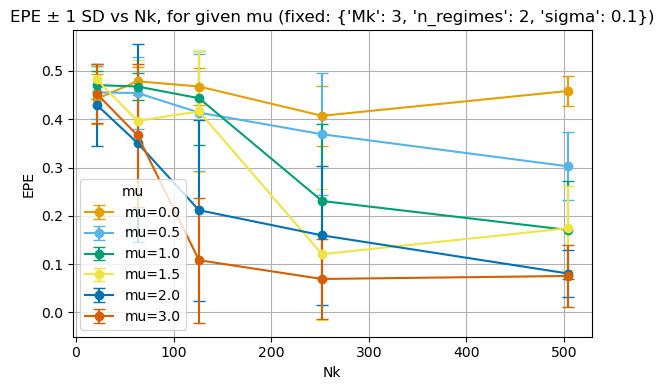

In [152]:
df_epe5 = pd.read_csv("df_epe5.csv", index_col=0)
plot_epe(df_epe5, data_grid5, param="Nk", param2="mu", 
         fixed={"Mk": 3, "n_regimes": 2, "sigma": 0.1})

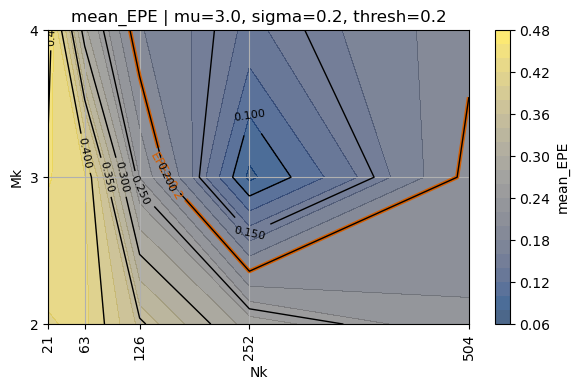

In [154]:
plot_epe_contours(df_epe5, data_grid5, param="Nk", param2="Mk", 
                  fixed={"mu": 3.0, "sigma": 0.2}, threshold=epe_threshold5)